# ALL LIBRARY IMPORTS USED

## TASK-1 IMPORTING

In [4]:
##BASIC PREPROCESS RELATED LIBRARIES

import pandas as pd

import numpy as np

import os

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn import preprocessing

from collections import Counter

import warnings
warnings.filterwarnings('ignore')

import io

import random
random.seed(123)


##WEB SCRAPING AND REGULAR EXPRESSIONS

import urllib.request as url

from bs4 import BeautifulSoup as bs

import re

import requests

##NLP LIBRARIES - NLTK USED IN BUILDING NLP PIPE LINE

import nltk
nltk.download('stopwords')

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from nltk.corpus import stopwords

from nltk.tokenize import word_tokenize

from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = nltk.stem.WordNetLemmatizer()

from nltk.stem.porter import PorterStemmer

####### MODEL BUILDING MODULES ########

## Logistic regression

from sklearn.linear_model import LogisticRegression

##DECISION TREE

from sklearn.tree import DecisionTreeClassifier, export_graphviz, DecisionTreeRegressor

##CLASSIFICATION METRICS/REGRESSION METRICS

from sklearn.metrics import accuracy_score,mean_absolute_error

from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.metrics import accuracy_score, f1_score


##RANDOM FOREST

from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier

#XGBOOST
#Convert data frames to matrix to process the data(Fast convergence)

import xgboost as xgb

#SVM
from sklearn.svm import SVR,SVC,LinearSVC

##SEARCHES AND TUNING

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

#KNN
from sklearn.neighbors import KNeighborsClassifier


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\maddiabhi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [41]:
#importing packages
import os
import pandas as pd
import numpy as np
import re
import urllib.request as url

from bs4 import BeautifulSoup as bs
import re
import requests
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import random
random.seed(123)
# necessary imports for the function preprocessing

from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
import nltk
nltk.download('punkt')
import nltk
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()
import nltk
nltk.download('stopwords')
stop = stopwords.words('english')
wordnet_lemmatizer = WordNetLemmatizer()
#for vectorizers
from sklearn.feature_extraction.text import CountVectorizer

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\maddiabhi\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\maddiabhi\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\maddiabhi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
import os
os.chdir("C:/Users/maddiabhi/Desktop/NLP")

# Loading the Train and Test data

In [13]:
train_data = pd.read_csv('train.csv')

In [11]:
test_data=pd.read_csv('test.csv')

##### Printing the top three rows of train_data

In [15]:
train_data.head(3)

,unique_hash,text,drug,sentiment
0,2e180be4c9214c1f5ab51fd8cc32bc80c9f612e0,Autoimmune diseases tend to come in clusters. ...,gilenya,2
1,9eba8f80e7e20f3a2f48685530748fbfa95943e4,I can completely understand why you’d want to ...,gilenya,2
2,fe809672251f6bd0d986e00380f48d047c7e7b76,Interesting that it only targets S1P-1/5 recep...,fingolimod,2


In [16]:
# checking duplicate rows, sanity check

print('number of duplicate rows\n{}\n'.format(df.duplicated().sum()))

number of duplicate rows
0



In [17]:
# checking NAs

print('Number of NAs\n{}\n'.format(train_data.isna().sum()))

# dtypes of df2 
print('dtypes of df2\n{}\n'.format(train_data.dtypes))
  

Number of NAs
unique_hash    0
text           0
drug           0
sentiment      0
dtype: int64

dtypes of df2
unique_hash    object
text           object
drug           object
sentiment       int64
dtype: object



# TASK2-TEXT PRE-PROCESSING

#### TEXT CLEANING AND PROCESSING
##TEXT CLEANING : REMOVAL OF SCRUB WORDS,ACCENTED CHARACTERS AND EXPANDING CONTRACTIONS

In [31]:
#from contractions import CONTRACTION_MAP
import unicodedata
##TEXT CLEANING
##SCRUB WORD FUNCTION REMOVES HTML MARK UPS,SPECIAL CHARACTERS,NON ASCIII CHARACTERS,NON BREAKING SPACES ETC

def scrub_words(outtext):
    # Replace \xao characters in text -
    # \xa0 is actually non-breaking space in Latin1 (ISO 8859-1), also chr(160).
    outtext = re.sub('\xa0', ' ', outtext)

    # Replace non ascii and digits
    outtext = re.sub("(\\W|\\d)", ' ', outtext)

    # Replace new line characters and following text untill space
    outtext = re.sub('\n(\w*?)[\s]', '', outtext)

    # Remove html markup
    outtext = re.sub("<.*?>", ' ', outtext)
    
    #outtext = re.sub('\n',' ',outtext)
    #outtext = re.sub(r'\\xa0',' ',outtext)
    #outtext = re.sub(r'\xa0',' ',outtext)
    #outtext = re.sub(r'\\n',' ',outtext)
    outtext = re.sub(r'_',' ',outtext)
    #outtext = re.sub(r'  ',' ',outtext)
    #outtext = re.sub('[^a-zA-z\s]','',outtext)
    outtext = re.sub(' +', ' ',outtext)
    " ".join(outtext.strip())


    return outtext
  


def remove_accented_chars(text):
    """Remove non-ASCII characters from list of tokenized words"""
    text = unicodedata.normalize('NFKD', text).encode(
        'ascii', 'ignore').decode('utf-8', 'ignore')
    return text

def text_cleaning(scrapped_raw_text):
    
    text_scrub_word_removal = scrub_words(scrapped_raw_text)
    #text_expand_contarction_removal = expand_contractions(text_scrub_word_removal)
    #cleaned_text = remove_accented_chars(text_expand_contarction_removal)
    
    return text_scrub_word_removal
  
  

## NLP PIPE LINE BUILDING (TOKENIZATION,CONVERING TO LOWER CASE,LEMMATIZATION)

In [42]:
def text_processing(text):
  ##STOP WORDS REMOVAL
  
  tokens = [token for token in word_tokenize(text) if not token in stop]
  
  ##REMOVING ONE/TWO LETTER WORDS
  
  
  tokens = [token for token in word_tokenize(text) if len(token)>2]
  
  ##CONVERTING TO LOWER CASE
  
  tokens = [token.lower() for token in tokens]
  
  ##LEMMATIZING WORDS
  
  tokens = [wordnet_lemmatizer.lemmatize(token) for token in tokens]
  
  ##Returning in a string format
  
  text = ' '.join(tokens)
  
  return text
  
  

In [157]:
# self defined stop words for sentiment analysis
stop_words=['in','of','at','the','this','had','and','were',\
         'for','but','for','wa','who','to','on','it','is','a',\
      'my','we','me','that','didnt', 'WA']

#stop_words = stopwords.words('english')
stop_words=['in','of','at','a','the']
# defining lemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

# Basic preprocessing function
def preprocessing(text):
    text = text.lower() # to lower
    text = re.sub("[.;:!\'?,\"()\[\]]", '', text)
    text = re.sub("(<br\s*/><br\s*/>)|(\-)|(\/)", '', text)
    text = re.sub("[0-9]+", '', text)
    text = re.sub("_", '', text)
    text = word_tokenize(text)
    text = [w for w in text if not w in stop_words] # removing self defined stopwords
    text = [word for word in text if len(word) > 1] # removing single character tokens
    #text = [stemmer.stem(word) for word in text]
    text = [wordnet_lemmatizer.lemmatize(word) for word in text]# doing lemmatizer
    
    return(' '.join(text))
  

In [163]:
CONTRACTION_MAP={"ain't": 'is not',
 "aren't": 'are not',
 "can't": 'cannot',
 "can't've": 'cannot have',
 "'cause": 'because',
 "could've": 'could have',
 "couldn't": 'could not',
 "couldn't've": 'could not have',
 "didn't": 'did not',
 "doesn't": 'does not',
 "don't": 'do not',
 "hadn't": 'had not',
 "hadn't've": 'had not have',
 "hasn't": 'has not',
 "haven't": 'have not',
 "he'd": 'he would',
 "he'd've": 'he would have',
 "he'll": 'he will',
 "he'll've": 'he he will have',
 "he's": 'he is',
 "how'd": 'how did',
 "how'd'y": 'how do you',
 "how'll": 'how will',
 "how's": 'how is',
 "I'd": 'I would',
 "I'd've": 'I would have',
 "I'll": 'I will',
 "I'll've": 'I will have',
 "I'm": 'I am',
 "I've": 'I have',
 "i'd": 'i would',
 "i'd've": 'i would have',
 "i'll": 'i will',
 "i'll've": 'i will have',
 "i'm": 'i am',
 "i've": 'i have',
 "isn't": 'is not',
 "it'd": 'it would',
 "it'd've": 'it would have',
 "it'll": 'it will',
 "it'll've": 'it will have',
 "it's": 'it is',
 "let's": 'let us',
 "ma'am": 'madam',
 "mayn't": 'may not',
 "might've": 'might have',
 "mightn't": 'might not',
 "mightn't've": 'might not have',
 "must've": 'must have',
 "mustn't": 'must not',
 "mustn't've": 'must not have',
 "needn't": 'need not',
 "needn't've": 'need not have',
 "o'clock": 'of the clock',
 "oughtn't": 'ought not',
 "oughtn't've": 'ought not have',
 "shan't": 'shall not',
 "sha'n't": 'shall not',
 "shan't've": 'shall not have',
 "she'd": 'she would',
 "she'd've": 'she would have',
 "she'll": 'she will',
 "she'll've": 'she will have',
 "she's": 'she is',
 "should've": 'should have',
 "shouldn't": 'should not',
 "shouldn't've": 'should not have',
 "so've": 'so have',
 "so's": 'so as',
 "that'd": 'that would',
 "that'd've": 'that would have',
 "that's": 'that is',
 "there'd": 'there would',
 "there'd've": 'there would have',
 "there's": 'there is',
 "they'd": 'they would',
 "they'd've": 'they would have',
 "they'll": 'they will',
 "they'll've": 'they will have',
 "they're": 'they are',
 "they've": 'they have',
 "to've": 'to have',
 "wasn't": 'was not',
 "we'd": 'we would',
 "we'd've": 'we would have',
 "we'll": 'we will',
 "we'll've": 'we will have',
 "we're": 'we are',
 "we've": 'we have',
 "weren't": 'were not',
 "what'll": 'what will',
 "what'll've": 'what will have',
 "what're": 'what are',
 "what's": 'what is',
 "what've": 'what have',
 "when's": 'when is',
 "when've": 'when have',
 "where'd": 'where did',
 "where's": 'where is',
 "where've": 'where have',
 "who'll": 'who will',
 "who'll've": 'who will have',
 "who's": 'who is',
 "who've": 'who have',
 "why's": 'why is',
 "why've": 'why have',
 "will've": 'will have',
 "won't": 'will not',
 "won't've": 'will not have',
 "would've": 'would have',
 "wouldn't": 'would not',
 "wouldn't've": 'would not have',
 "y'all": 'you all',
 "y'all'd": 'you all would',
 "y'all'd've": 'you all would have',
 "y'all're": 'you all are',
 "y'all've": 'you all have',
 "you'd": 'you would',
 "you'd've": 'you would have',
 "you'll": 'you will',
 "you'll've": 'you will have',
 "you're": 'you are',
 "you've": 'you have'}

In [164]:
import unicodedata
import re
def expand_contractions(text, contraction_mapping=CONTRACTION_MAP):
    text=re.sub("’","'",text)
    # Regular Expression Objects
    # If you want to use the same regular expression more than once,
    # you should compile it into a regular expression object.
    # Regular expression objects are more efficient, and make your code more readable.
    # To create one, just call re.compile(regex) or re.compile(regex, flags).
    # The flags are the matching options described above for the re.search() and re.match() functions.

    # The regular expression object returned by re.compile() provides all the functions that
    # the re module also provides directly: search(), match(), findall(), finditer(), sub() and split().
    # The difference is that they use the pattern stored in the regex object, and do not take the regex
    # as the first parameter. re.compile(regex).search(subject) is equivalent to re.search(regex, subject).
    contractions_pattern = re.compile('({})'.format('|'.join(contraction_mapping.keys())),
                                      flags=re.IGNORECASE | re.DOTALL)

    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contraction_mapping.get(match)\
            if contraction_mapping.get(match)\
            else contraction_mapping.get(match.lower())
        expanded_contraction = first_char+expanded_contraction[1:]
        expanded_contraction = expanded_contraction[0:]
        return expanded_contraction

    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)

    return expanded_text

In [160]:
def copy_fun(text):
    text=re.sub("’","'",text)
    text_copy=text.split()
    text_copy_2=text
    for i in text_copy:
        #print(i)
        if i in CONTRACTION_MAP.keys():
            text_copy_2=re.sub(i+' ',CONTRACTION_MAP.get(i)+' ',text_copy_2)
        elif i.lower() in CONTRACTION_MAP.keys():
            text_copy_2=re.sub(i+' ',CONTRACTION_MAP.get(i.lower())+' ',text_copy_2)
        else:
            pass
    return text_copy_2

In [169]:
#WORD=TOKENIZING,LEMMATIZATION,STOP-WORDS REMOVAL
def preprocess_1(text3):
    #text3=word_tokenize(text3)
    tokens=[token for token in word_tokenize(text3) if not token in stop]   # removing self defined stopwords
    tokens=[token for token in tokens if len(token) > 2]   
    tokens=[wordnet_lemmatizer.lemmatize(token) for token in tokens]        # removing single and double character tokens
    text3=' '.join(tokens)
    return text3

## APPLY TEXT CLEANING AND TEXT PROCESSING ON RAW DATA

In [32]:
##TRAIN DATA
train_data['filt_sent'] = train_data['text'].apply(scrub_words)
train_data['filt_sent1'] = train_data['filt_sent'].apply(remove_accented_chars)
train_data['filt_sent2'] = train_data['filt_sent1'].apply(text_cleaning)


In [ ]:
train_data['file_sent3=']=train_data['filt_sent2'].apply(preprocessing)

In [165]:
train_data['filt_sent4']=train_data['filt_sent3'].apply(expand_contractions)

In [170]:
train_data['filt_sent5']=train_data['filt_sent4'].apply(preprocess_1)

In [171]:
# check how preprocessing function worked
train_data.head(2)

,unique_hash,text,drug,sentiment,filt_sent,filt_sent1,filt_sent2,filt_sent3,filt_sent4,filt_sent5
0,2e180be4c9214c1f5ab51fd8cc32bc80c9f612e0,Autoimmune diseases tend to come in clusters. ...,gilenya,2,Autoimmune diseases tend to come in clusters A...,Autoimmune diseases tend to come in clusters A...,Autoimmune diseases tend to come in clusters A...,autoimmune disease tend to come cluster a for ...,autoimmune disease tend to come cluster a for ...,autoimmune disease tend come cluster gilenya f...
1,9eba8f80e7e20f3a2f48685530748fbfa95943e4,I can completely understand why you’d want to ...,gilenya,2,I can completely understand why you d want to ...,I can completely understand why you d want to ...,I can completely understand why you d want to ...,can completely understand why you want to try ...,can completely understand why you want to try ...,completely understand want try result reported...


In [ ]:
train_data

In [34]:
##TEST DATA
test_data['filt_sent'] = test_data['text'].apply(scrub_words)
test_data['filt_sent1'] = test_data['filt_sent'].apply(remove_accented_chars)
test_data['filt_sent2'] = test_data['filt_sent1'].apply(text_cleaning)


In [35]:
# check how preprocessing function worked
test_data.head()

,unique_hash,text,drug,filt_sent,filt_sent1,filt_sent2
0,9e9a8166b84114aca147bf409f6f956635034c08,"256 (previously stable on natalizumab), with 5...",fingolimod,previously stable on natalizumab with switchi...,previously stable on natalizumab with switchi...,previously stable on natalizumab with switchi...
1,e747e6822c867571afe7b907b51f0f2ca67b0e1a,On fingolimod and have been since December 201...,fingolimod,On fingolimod and have been since December the...,On fingolimod and have been since December the...,On fingolimod and have been since December the...
2,50b6d851bcff4f35afe354937949e9948975adf7,Apparently it's shingles! :-/ I do have a few ...,humira,Apparently it s shingles I do have a few red s...,Apparently it s shingles I do have a few red s...,Apparently it s shingles I do have a few red s...
3,7f82ec2176ae6ab0b5d20b5ffc767ac829f384ae,If the Docetaxel doing once a week x3 weeks th...,tagrisso,If the Docetaxel doing once a week x weeks the...,If the Docetaxel doing once a week x weeks the...,If the Docetaxel doing once a week x weeks the...
4,8b37d169dee5bdae27060949242fb54feb6a7f7f,"CC, Stelara worked in a matter of days for me....",stelara,CC Stelara worked in a matter of days for me I...,CC Stelara worked in a matter of days for me I...,CC Stelara worked in a matter of days for me I...


In [43]:
##TRAIN DATA
train_data['filt_sent3'] = train_data['filt_sent2'].apply(text_processing)

In [44]:
##TEST DATA
test_data['filt_sent3'] = test_data['filt_sent2'].apply(text_processing)

In [45]:
# taking selective columns from df2 for further process 
train_data1 = train_data.loc[:, ['filt_sent3', 'sentiment']]
display(train_data1.head())

,filt_sent3,sentiment
0,autoimmune disease tend come cluster for gilen...,2
1,can completely understand why you want try but...,2
2,interesting that only target receptor rather t...,2
3,very interesting grand merci now wonder where ...,2
4,everybody latest mri result for brain and cerv...,1


In [46]:
# taking selective columns from df2 for further process 
test_data1 = test_data.loc[:, ['filt_sent3', 'sentiment']]
display(test_data1.head())

,filt_sent3,sentiment
0,previously stable natalizumab with switching f...,NaN
1,fingolimod and have been since december the on...,NaN
2,apparently shingle have few red spot just belo...,NaN
3,the docetaxel doing once week week then week o...,NaN
4,stelara worked matter day for your willing jum...,NaN


# Task 3: EDA using Visualization

## GET_TOP_N_WORDS GIVES TOP WORDS IN THE CORPUS

In [204]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

### STOP WORDS

In [205]:
##STOP WORDS : THESE ARE TAKEN FROM UNIVERSITY OF NOTRE DAME PAPER ON MCDONALD FINANCE DICTIONERY 


_stopwords = ['ME', 'MY', 'MYSELF', 'WE', 'OUR', 'OURS', 'OURSELVES', 'YOU', 'YOUR', 'YOURS',
                       'YOURSELF', 'YOURSELVES', 'HE', 'HIM', 'HIS', 'HIMSELF', 'SHE', 'HER', 'HERS', 'HERSELF',
                       'IT', 'ITS', 'ITSELF', 'THEY', 'THEM', 'THEIR', 'THEIRS', 'THEMSELVES', 'WHAT', 'WHICH',
                       'WHO', 'WHOM', 'THIS', 'THAT', 'THESE', 'THOSE', 'AM', 'IS', 'ARE', 'WAS', 'WERE', 'BE',
                       'BEEN', 'BEING', 'HAVE', 'HAS', 'HAD', 'HAVING', 'DO', 'DOES', 'DID', 'DOING', 'AN',
                       'THE', 'AND', 'BUT', 'IF', 'OR', 'BECAUSE', 'AS', 'UNTIL', 'WHILE', 'OF', 'AT', 'BY',
                       'FOR', 'WITH', 'ABOUT', 'BETWEEN', 'INTO', 'THROUGH', 'DURING', 'BEFORE',
                       'AFTER', 'ABOVE', 'BELOW', 'TO', 'FROM', 'UP', 'DOWN', 'IN', 'OUT', 'ON', 'OFF', 'OVER',
                       'UNDER', 'AGAIN', 'FURTHER', 'THEN', 'ONCE', 'HERE', 'THERE', 'WHEN', 'WHERE', 'WHY',
                       'HOW', 'ALL', 'ANY', 'BOTH', 'EACH', 'FEW', 'MORE', 'MOST', 'OTHER', 'SOME', 'SUCH',
                       'NO', 'NOR', 'NOT', 'ONLY', 'OWN', 'SAME', 'SO', 'THAN', 'TOO', 'VERY', 'CAN',
                       'JUST', 'SHOULD', 'NOW']

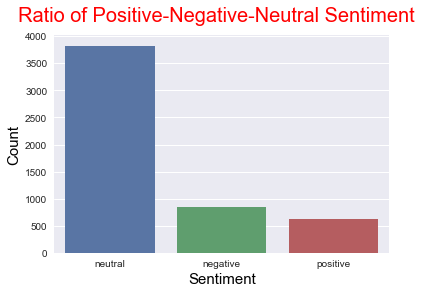

In [217]:
# sentiment of reviews, count of positive and negative
sent = train_data.replace({'sentiment': {0: 'positive', 1:'negative',2:'neutral'}})
sns.set(style="darkgrid")
ax = sns.countplot(x="sentiment", data=sent)
ax.figure.suptitle('Ratio of Positive-Negative-Neutral Sentiment', fontsize = 20, color = 'RED')
plt.ylabel('Count', fontsize = 15, color = 'black')
plt.xlabel('Sentiment', fontsize = 15, color = 'black')
plt.show()

#### From the above graph we can infer that there is class imbalance in the data

## WORD COUNT DISTRIBUTIONS
Dividing data frame into two parts based on the sentiment values of positive and negative

In [218]:
# word count 

negat_senti = train_data.loc[train_data['sentiment'] == 1, ['filt_sent']]
posit_senti = train_data.loc[train_data['sentiment'] == 0, ['filt_sent']]
neutral_senti = train_data.loc[train_data['sentiment'] == 2, ['filt_sent']]
word_in = pd.DataFrame()

word_in['words'] = train_data['filt_sent'].apply(lambda x: len(str(x).split()))
word_in_negat_rev = negat_senti['filt_sent'].apply(lambda x: len(str(x).split()))
word_in_posit_rev = posit_senti['filt_sent'].apply(lambda x: len(str(x).split()))
word_in_neutral_rev =neutral_senti['filt_sent'].apply(lambda x: len(str(x).split()))

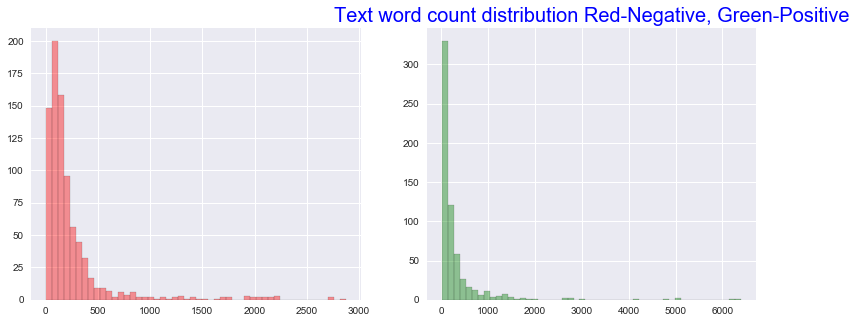

In [221]:
a4_dims = (13, 5)

f, axes = plt.subplots(1, 2, figsize=a4_dims)

sns.distplot(word_in_negat_rev, hist=True, kde=False, 
               color = 'red',
             hist_kws={'edgecolor':'black'}, ax=axes[0], axlabel = False)



sns.distplot(word_in_posit_rev, hist=True, kde=False, 
               color = 'green',
             hist_kws={'edgecolor':'black'}, ax=axes[1], axlabel = False)

#sns.distplot(word_in_neutral_rev, hist=True, kde=False, 
             #  color = 'blue',
          #   hist_kws={'edgecolor':'black'}, ax=axes[2], axlabel = False)

plt.title('Text word count distribution Red-Negative, Green-Positive', fontsize=20, color = 'blue')
plt.show()



In [222]:
# necessary imports
import nltk
nltk.download('stopwords')

import warnings
warnings.simplefilter("ignore", UserWarning)

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\maddiabhi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


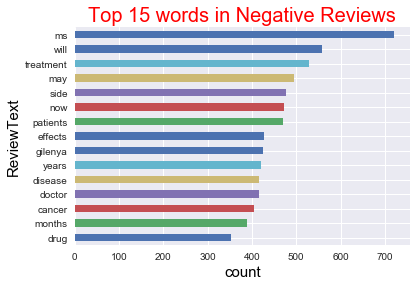

In [225]:

negat_senti = train_data.loc[train_data['sentiment'] == 1, ['filt_sent']]
posit_senti = train_data.loc[train_data['sentiment'] == 0, ['filt_sent']]
neutral_senti = train_data.loc[train_data['sentiment'] == 2, ['filt_sent']]
#STOPWORDS = stopwords.words('english')
stopwords = set(STOPWORDS)
stopwords.update(['loved', 'good', 'lion king', 'movie', 'wa', 'good', 'film', 'didnt', 'original', 'amazing',\
                 'great', 'lion', 'king', 'great', 'amazing', 'remake', 'disney', 'animal', 'awesome',\
                 'see', 'really', 'well', 'one', 'done', 'better', 'time', 'much',\
                 'still', 'way', 'thing','feel', 'made', 'shot', 'part', 'new', 'felt',\
                 'even','liked', 'like', 'would'])


def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = stopwords).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

  
common_words = get_top_n_words(negat_senti['filt_sent'], 15)
uni_posit = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
uni_posit.groupby('ReviewText').sum()['count'].sort_values(ascending=True).plot.barh()


plt.xlabel('count', fontsize=15, color = 'black')
plt.ylabel('ReviewText', fontsize=15, color = 'black')
plt.title('Top 15 words in Negative Reviews', fontsize=20, color = 'red')
plt.show()

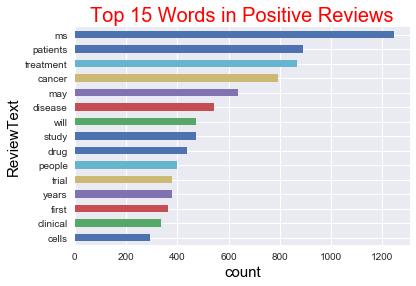

In [226]:
common_words = get_top_n_words(posit_senti['filt_sent'], 15)
uni_posit = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
uni_posit.groupby('ReviewText').sum()['count'].sort_values(ascending=True).plot.barh()

plt.xlabel('count')
plt.title('Top 15 Words in Positive Reviews', fontsize=20, color = 'red')
plt.xlabel('count', fontsize=15, color = 'black')
plt.ylabel('ReviewText', fontsize=15, color = 'black')
plt.show()

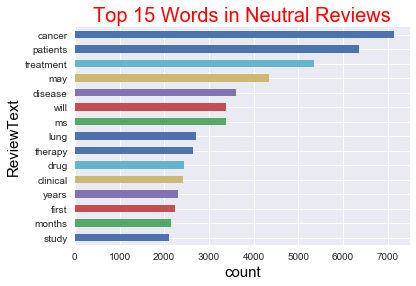

In [227]:
common_words = get_top_n_words(neutral_senti['filt_sent'], 15)
uni_posit = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
uni_posit.groupby('ReviewText').sum()['count'].sort_values(ascending=True).plot.barh()

plt.xlabel('count')
plt.title('Top 15 Words in Neutral Reviews', fontsize=20, color = 'red')
plt.xlabel('count', fontsize=15, color = 'black')
plt.ylabel('ReviewText', fontsize=15, color = 'black')
plt.show()

## WORD CLOUD - WHOLE CORPUS

In [229]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


negat_senti = train_data.loc[train_data['sentiment'] == 1, ['filt_sent']]
posit_senti = train_data.loc[train_data['sentiment'] == 0, ['filt_sent']]
neutral_senti = train_data.loc[train_data['sentiment'] == 2, ['filt_sent']]

negat_text = " ".join(review for review in negat_senti.filt_sent)
print ("There are {} words in the combination of all negative review.".format(len(negat_text)))

posit_text = " ".join(review for review in posit_senti.filt_sent)
print ("There are {} words in the combination of all positive review.".format(len(posit_text)))

neutral_text = " ".join(review for review in neutral_senti.filt_sent)
print ("There are {} words in the combination of all positive review.".format(len(negat_text)))

stopwords = set(STOPWORDS)
stopwords.update(['loved', 'good', 'lion king', 'movie', 'wa', 'good', 'film', 'didnt', 'original', 'amazing',\
                 'great', 'lion', 'king', 'great', 'amazing', 'remake', 'disney', 'animal', 'awesome',\
                 'see', 'really', 'well', 'one', 'done', 'better', 'time', 'much',\
                 'still', 'way', 'thing','feel', 'made', 'shot', 'part', 'new', 'felt',\
                 'even','liked', 'enjoyed'])
# Generate a word cloud image
wordcloud_negat = WordCloud(stopwords=stopwords, background_color="white",\
                           max_font_size=50, max_words=100).generate(negat_text)
wordcloud_posit = WordCloud(stopwords=stopwords, background_color="white",\
                           max_font_size=50, max_words=100).generate(posit_text)
wordcloud_neutral = WordCloud(stopwords=stopwords, background_color="white",\
                           max_font_size=50, max_words=100).generate(neutral_text)


There are 1146905 words in the combination of all negative review.
There are 1088994 words in the combination of all positive review.
There are 1146905 words in the combination of all positive review.


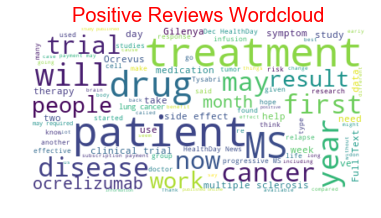

In [230]:
# Display the generated image:
# the matplotlib way:

plt.imshow(wordcloud_posit, interpolation='bilinear')
plt.title('Positive Reviews Wordcloud', fontsize=20, color = 'red')
plt.axis("off")
plt.show()


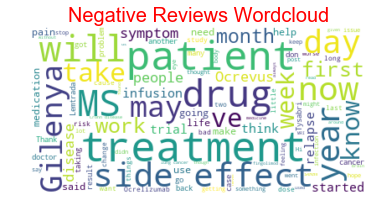

In [231]:
# Display the generated image:
# the matplotlib way:

plt.imshow(wordcloud_negat, interpolation='bilinear')
plt.title('Negative Reviews Wordcloud', fontsize=20, color = 'red')
plt.axis("off")
plt.show()

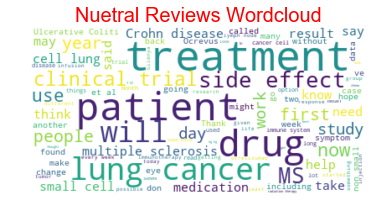

In [233]:
# Display the generated image:
# the matplotlib way:

plt.imshow(wordcloud_neutral, interpolation='bilinear')
plt.title('Nuetral Reviews Wordcloud', fontsize=20, color = 'red')
plt.axis("off")
plt.show()

## TRAIN,VALIDATION SPLITS

In [197]:
from sklearn.model_selection import train_test_split 
X_train, X_test, y_train, y_test = train_test_split(train_data['filt_sent3'],train_data['sentiment'], test_size=0.25, random_state=1234)

## BUILDING TFIDF MATRICES FOR TRAIN, VALIDATION AND TEST


In [198]:
# necessary imports
from sklearn.feature_extraction.text import TfidfVectorizer


tfidf_vectorizer = TfidfVectorizer(max_df=0.8,
                                   min_df=0.2,
                                   use_idf=True, ngram_range=(1, 4),)

#data_features = tfidf_vectorizer.fit_transform(df3['filt_sent'])


In [199]:

%time tfidf_matrix_train = tfidf_vectorizer.fit_transform(X_train)

Wall time: 45.6 s


In [239]:

%time tfidf_matrix_test = tfidf_vectorizer.fit_transform(test_data['filt_sent3'])

Wall time: 36.9 s


## top_tfidf_feats FUNCTION RETURN TOP N TFIDF VALUES IN ROW AND RETURN THEM WITH THEIR CORRESPONDING FEATURE NAMES

In [182]:
def top_tfidf_feats(row, features, top_n=25):
    ''' Get top n tfidf values in row and return them with their corresponding feature names.'''
    topn_ids = np.argsort(row)[::-1][:top_n]
    top_feats = [(features[i], row[i]) for i in topn_ids]
    df = pd.DataFrame(top_feats)
    df.columns = ['feature', 'tfidf']
    return df

In [183]:
def top_feats_in_doc(Xtr, features, row_id, top_n=25):
                                                  
    row = np.squeeze(Xtr[row_id].toarray())
    return top_tfidf_feats(row, features, top_n)

In [184]:
top_feats_in_doc(tfidf_matrix_train,tfidf_vectorizer.get_feature_names(),10,5)

,feature,tfidf
0,effect,0.731890
1,would,0.681423
2,year,0.000000
3,cancer,0.000000
4,day,0.000000


In [200]:
%%time

tfidf_matrix_val = tfidf_vectorizer.transform(X_test)

tfidf_matrix_test = tfidf_vectorizer.transform(train_data['filt_sent3'])

Wall time: 21.9 s


In [201]:
print('TFIDF TRAIN : {0},TFIDF VAL : {1},TFIDF TEST : {2}'.format(tfidf_matrix_train.shape,tfidf_matrix_val.shape,tfidf_matrix_test.shape))

TFIDF TRAIN : (3959, 87),TFIDF VAL : (1320, 87),TFIDF TEST : (5279, 87)


## USING SMOTE FOR OVER SAMPLING DATA AS WE HAVE CLASS IMBALANCE IN THE DATA PROVIDED

In [187]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
tfidf_matrix_train, y_train = smt.fit_sample(tfidf_matrix_train, y_train)

In [188]:
y_train.shape

(8655,)

In [189]:
tfidf_matrix_train.shape

(8655, 28)

In [190]:
print("balance class\n {}".format(pd.Series(y_train).value_counts()))

balance class
 2    2885
1    2885
0    2885
Name: sentiment, dtype: int64


# TASK 4 -MODEL BUILDING

## LOGISTIC REGRESSION FOR MULTIPLE C VALUES

In [191]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [80]:
%%time

for c in [0.2, 0.5, 1,1.2,1.5,1.8,2,2.3,2.6,2.9,3,4,4.5]:
    
    lr = LogisticRegression(C=c)
    lr.fit(tfidf_matrix_train,y_train)
    
    print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_test, lr.predict(tfidf_matrix_val))))
    print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, lr.predict(tfidf_matrix_val), average='weighted')))
    


Accuracy for C=0.2: 0.38712121212121214
f1_score for C=0.2: 0.4221984754597738
Accuracy for C=0.5: 0.3893939393939394
f1_score for C=0.5: 0.42485388617664077
Accuracy for C=1: 0.39015151515151514
f1_score for C=1: 0.4253837564565498
Accuracy for C=1.2: 0.3893939393939394
f1_score for C=1.2: 0.42490571943506716
Accuracy for C=1.5: 0.39015151515151514
f1_score for C=1.5: 0.42535179707495807
Accuracy for C=1.8: 0.39015151515151514
f1_score for C=1.8: 0.42535179707495807
Accuracy for C=2: 0.39090909090909093
f1_score for C=2: 0.42620256559773007
Accuracy for C=2.3: 0.3946969696969697
f1_score for C=2.3: 0.4303848254103115
Accuracy for C=2.6: 0.3939393939393939
f1_score for C=2.6: 0.4297736781499875
Accuracy for C=2.9: 0.3939393939393939
f1_score for C=2.9: 0.4297736781499875
Accuracy for C=3: 0.3939393939393939
f1_score for C=3: 0.4297736781499875
Accuracy for C=4: 0.3931818181818182
f1_score for C=4: 0.42916156667040845
Accuracy for C=4.5: 0.3931818181818182
f1_score for C=4.5: 0.42916156

In [81]:
%%time

for c in [4.5,4.8,5,5.2,5.4,5.6,5.8,6]:
    
    lr = LogisticRegression(C=c)
    lr.fit(tfidf_matrix_train,y_train)
    print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_test, lr.predict(tfidf_matrix_val))))
    #f1_score(y_true, y_pred, average='macro')
    
    #f1_score(y_true, y_pred, average='weighted')
    print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, lr.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=4.5: 0.3931818181818182
f1_score for C=4.5: 0.42916156667040845
Accuracy for C=4.8: 0.3931818181818182
f1_score for C=4.8: 0.42916156667040845
Accuracy for C=5: 0.3931818181818182
f1_score for C=5: 0.42916156667040845
Accuracy for C=5.2: 0.3931818181818182
f1_score for C=5.2: 0.42916156667040845
Accuracy for C=5.4: 0.3931818181818182
f1_score for C=5.4: 0.42916156667040845
Accuracy for C=5.6: 0.3931818181818182
f1_score for C=5.6: 0.42916156667040845
Accuracy for C=5.8: 0.3931818181818182
f1_score for C=5.8: 0.42916156667040845
Accuracy for C=6: 0.3931818181818182
f1_score for C=6: 0.42916156667040845
Wall time: 13.5 s


In [82]:
%%time

for c in [6.2,6.4,6.8,7,7.2,7.4,7.6,7.8,8]:
    
    lr = LogisticRegression(C=c)
    lr.fit(tfidf_matrix_train,y_train)
    print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_test, lr.predict(tfidf_matrix_val))))
    print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, lr.predict(tfidf_matrix_val), average='weighted')))



Accuracy for C=6.2: 0.3931818181818182
f1_score for C=6.2: 0.42916156667040845
Accuracy for C=6.4: 0.3931818181818182
f1_score for C=6.4: 0.42916156667040845
Accuracy for C=6.8: 0.3931818181818182
f1_score for C=6.8: 0.42916156667040845
Accuracy for C=7: 0.3931818181818182
f1_score for C=7: 0.42916156667040845
Accuracy for C=7.2: 0.3931818181818182
f1_score for C=7.2: 0.42916156667040845
Accuracy for C=7.4: 0.3931818181818182
f1_score for C=7.4: 0.42916156667040845
Accuracy for C=7.6: 0.3931818181818182
f1_score for C=7.6: 0.42916156667040845
Accuracy for C=7.8: 0.3931818181818182
f1_score for C=7.8: 0.42916156667040845
Accuracy for C=8: 0.3931818181818182
f1_score for C=8: 0.42916156667040845
Wall time: 14 s


In [83]:
%%time

for c in [17.6,17.8,18,18.2,18.6]:
    
    lr = LogisticRegression(C=c)
    lr.fit(tfidf_matrix_train,y_train)
    
    print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_test, lr.predict(tfidf_matrix_val))))
    print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, lr.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=17.6: 0.3939393939393939
f1_score for C=17.6: 0.429975890360848
Accuracy for C=17.8: 0.3939393939393939
f1_score for C=17.8: 0.429975890360848
Accuracy for C=18: 0.3939393939393939
f1_score for C=18: 0.429975890360848
Accuracy for C=18.2: 0.3939393939393939
f1_score for C=18.2: 0.429975890360848
Accuracy for C=18.6: 0.3939393939393939
f1_score for C=18.6: 0.429975890360848
Wall time: 8.18 s


## LINEAR SVM AND RBF KERNAL SVM

In [71]:
from sklearn.svm import LinearSVC,SVC

svc1 = SVC(class_weight='balanced',kernel='rbf')
svc1.fit(tfidf_matrix_train,y_train)
print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, svc1.predict(tfidf_matrix_val))))


Accuracy for C=4.5: 0.6484848484848484


In [202]:
from sklearn.svm import LinearSVC,SVC

svc1 = SVC(class_weight='balanced',kernel='rbf')
svc1.fit(tfidf_matrix_train,y_train)
print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, svc1.predict(tfidf_matrix_val), average='weighted')))



f1_score for C=4.5: 0.5362551420289486


In [203]:

from sklearn.svm import LinearSVC,SVC

for c in [0.02,0.05,0.08,0.2,0.4,0.8,1, 2, 3, 3.5,3.8,4,4.2,4.5]:
    
    svm = SVC(class_weight='balanced',kernel='rbf')
    svm.fit(tfidf_matrix_train, y_train)
    print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, svm.predict(tfidf_matrix_val))))
    print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, svm.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=0.02: 0.503030303030303
f1_score for C=0.02: 0.5362551420289486
Accuracy for C=0.05: 0.503030303030303
f1_score for C=0.05: 0.5362551420289486
Accuracy for C=0.08: 0.503030303030303
f1_score for C=0.08: 0.5362551420289486
Accuracy for C=0.2: 0.503030303030303
f1_score for C=0.2: 0.5362551420289486
Accuracy for C=0.4: 0.503030303030303
f1_score for C=0.4: 0.5362551420289486
Accuracy for C=0.8: 0.503030303030303
f1_score for C=0.8: 0.5362551420289486
Accuracy for C=1: 0.503030303030303
f1_score for C=1: 0.5362551420289486
Accuracy for C=2: 0.503030303030303
f1_score for C=2: 0.5362551420289486
Accuracy for C=3: 0.503030303030303
f1_score for C=3: 0.5362551420289486
Accuracy for C=3.5: 0.503030303030303
f1_score for C=3.5: 0.5362551420289486
Accuracy for C=3.8: 0.503030303030303
f1_score for C=3.8: 0.5362551420289486
Accuracy for C=4: 0.503030303030303
f1_score for C=4: 0.5362551420289486
Accuracy for C=4.2: 0.503030303030303
f1_score for C=4.2: 0.5362551420289486
Accuracy 

## DECISION TREE

In [87]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold, learning_curve
from sklearn.metrics import f1_score
from sklearn import preprocessing
import warnings

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

dt = DecisionTreeClassifier(splitter = 'random')

dt.fit(tfidf_matrix_train, y_train)
print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, dt.predict(tfidf_matrix_val))))
print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, dt.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=4.5: 0.47575757575757577
f1_score for C=4.5: 0.5066153053034942


## KNN

In [75]:
##KNN

from sklearn.neighbors import KNeighborsRegressor,KNeighborsClassifier

for k in [1,2,3,4,5,6,7,8,9,10]:

    KNN = KNeighborsClassifier(n_neighbors = k)
    KNN.fit(tfidf_matrix_train,y_train)



    print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, KNN.predict(tfidf_matrix_val))))


Accuracy for C=0.2: 0.3765151515151515
Accuracy for C=0.2: 0.2727272727272727
Accuracy for C=0.2: 0.29772727272727273
Accuracy for C=0.2: 0.27121212121212124
Accuracy for C=0.2: 0.2727272727272727
Accuracy for C=0.2: 0.25227272727272726
Accuracy for C=0.2: 0.2689393939393939
Accuracy for C=0.2: 0.24242424242424243
Accuracy for C=0.2: 0.24924242424242424
Accuracy for C=0.2: 0.2356060606060606


## RANDOM FOREST


In [76]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(class_weight= {0 : 0.63,1: 0.37})

rfc.fit(tfidf_matrix_train,y_train)

print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, rfc.predict(tfidf_matrix_val))))


Accuracy for C=0.2: 0.6363636363636364


## GRADIENT BOOSTING

In [88]:
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import GridSearchCV

# Model in use
GBM = GradientBoostingClassifier() 
 
# Use a grid over parameters of interest


GBM.fit(tfidf_matrix_train,y_train)

print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, GBM.predict(tfidf_matrix_val))))
print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, GBM.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=4.5: 0.5666666666666667
f1_score for C=4.5: 0.5663425452443005


## NAIVE BAYES

In [89]:
from sklearn.naive_bayes import BernoulliNB

#Create a Gaussian Classifier
model = BernoulliNB(0.01)

# Train the model using the training sets
model.fit(tfidf_matrix_train,y_train)

#Predict Output
print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, model.predict(tfidf_matrix_val))))
print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, model.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=4.5: 0.5348484848484848
f1_score for C=4.5: 0.5347189284145806


## XGBOOST

In [90]:
%%time

import xgboost as xgb
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

#tfidf_matrix_train_xgb = tfidf_matrix_train.as_matrix()
#y_train_xgb  = y_train.as_matrix()
#tfidf_matrix_val_xgb = tfidf_matrix_val.as_matrix()
#y_test_xgb  = y_test.as_matrix()

#tfidf_matrix_test_xgb = tfidf_matrix_test.as_matrix()


# parameters = {'objective':['reg:linear'],
#               'learning_rate': [.03, 0.05, .07 , 0.1 ,0.15,0.2,0.22,0.24,0.28], #so called `eta` value
#               'max_depth': [4,5,6,7],
#               'min_child_weight': [3,4,5,6],
#               'silent': [1],
#               'subsample': [0.75],
#               'colsample_bytree': [0.75],
#               'n_estimators': [50,100,150]}

# xgb_random = RandomizedSearchCV(xgb.XGBRFClassifier(),param_distributions=parameters,cv=10)
# xgb_random.fit(tfidf_matrix_train,y_train)

xgb_params = {'learning_rate': 0.05, 
              'max_depth': 4,
              'subsample': 0.9,        
              'colsample_bytree': 0.9,
              'objective': 'binary:logistic',
              'silent': 1, 
              'n_estimators':100, 
              'gamma':1,         
              'min_child_weight':4}   
xgb1 = xgb.XGBClassifier(**xgb_params, seed = 10,scale_pos_weight=0.65)

xgb1.fit(tfidf_matrix_train,y_train)


#Predict Output
print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, xgb1.predict(tfidf_matrix_val))))
print ("f1_score for C=%s: %s" 
           % (c, f1_score(y_test, xgb1.predict(tfidf_matrix_val), average='weighted')))


Accuracy for C=4.5: 0.603030303030303
f1_score for C=4.5: 0.5806179017703446
Wall time: 1min 13s


## RANDOM FOREST WITH HYPER TUNING

In [141]:
## Random Forest
#%%time


from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(class_weight= 'balanced')


rfc.fit(tfidf_matrix_train,y_train)

print ("Accuracy for C=%s: %s" 
        % (c, accuracy_score(y_test, rfc.predict(tfidf_matrix_val))))
print ("f1_score for C=%s: %s" 
        % (c, f1_score(y_test, rfc.predict(tfidf_matrix_val), average='weighted')))

Accuracy for C=0.001: 0.65
f1_score for C=0.001: 0.5967534147244032


## Generate sentiment scores based on overall data i.e. incorporating the complex reviews information.



### VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media.

In [150]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [151]:
analyser = SentimentIntensityAnalyzer()

In [152]:
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    
    print("{:-<40} {}".format(sentence, str(score)))

In [155]:
def addSentiment(df):
    senti = train_data['filt_sent'].apply(lambda x: sentiment_analyzer_scores(x))
    senti_df = pd.DataFrame(senti)
    #sentiment = pd.DataFrame(senti_df.text.values.tolist(), index= df.index, columns=['neg','neu','pos','compound'])
    #senti_retweets = pd.concat([df,sentiment],axis=1)
    return senti_df

In [236]:
def addSentiment_test(df):
    senti = test_data['filt_sent'].apply(lambda x: sentiment_analyzer_scores(x))
    senti_df = pd.DataFrame(senti)
    #sentiment = pd.DataFrame(senti_df.text.values.tolist(), index= df.index, columns=['neg','neu','pos','compound'])
    #senti_retweets = pd.concat([df,sentiment],axis=1)
    return senti_df

### TRAIN_DATA SENTIMENT SCORES

In [156]:
addSentiment(train_data['filt_sent3'][:])

Autoimmune diseases tend to come in clusters As for Gilenya if you feel good don t think about it it won t change anything but waste your time and energy I m taking Tysabri and feel amazing no symptoms other than dodgy color vision but I ve had it since always so don t know and I don t know if it will last a month a year a decade ive just decided to enjoy the ride no point in worrying  {'neg': 0.142, 'neu': 0.675, 'pos': 0.183, 'compound': 0.6369}
I can completely understand why you d want to try it But results reported in lectures don t always stand up to the scrutiny of peer review during publication There so much still to do before this is convincing I hope that it does work out I really do And if you re aware of and happy with the risks then that s great I just think it s important to present this in a balanced way and to understand why we don t move straight from the first show of promise in an animal study to using drugs on humans There s still a lot of animal data to gather and 

Multiple sclerosis MS can be thought of as an inflammatory process involving different areas of the central nervous system CNS at various points in time What Causes This Disease The cause of multiple sclerosis is not known Both environmental and genetic factors are thought to predispose a person to develop the disease Multiple sclerosis results in the destruction of the myelin that surrounds the nerves of the CNS Myelin is a fatty substance that insulates the nerves and allows them to transmit information to and from the brain If the myelin is damaged the transmitted information is not only delayed but also may be misinterpreted by the brain The myelin destruction also known as demyelination is thought to be caused by the body s immune cells entering the CNS The disruption of the normal barrier to the entry of these cells termed the blood brain barrier leads to local swelling known as edema Also damaged are the nerve cell bodies termed neuronal loss or their prolongations termed axonal

Humira adalimumab is an injectable protein antibody used to treat rheumatoid arthritis juvenile idiopathic arthritis psoriatic arthritis ankylosing spondylitis and plaque psoriasis Humira is also used to treat Crohn s disease after other drugs have been tried without successful treatment of symptoms Common side effects of Humira include injection site reactions redness itching pain bruising swelling or bleeding headache suffy nose sinus pain or stomach pain Tell your doctor if you have serious side effects of Humira including fast irregular pounding heartbeat stomach pain blood in the stools mental mood changes severe headache easy bruising or bleeding dark urine yellowing eyes and skin leg pain or swelling numbness or tingling of the arms hands legs feet unsteadiness unexplained muscle weakness difficulty with speaking chewing swallowing facial movements vision changes extreme fatigue joint pain or butterfly shaped rash on the nose and cheeks The recommended dose of Humira for adult p

Last Updated January Share Comments Tell a Friend Here are what the editors at HealthDay consider to be the most important developments in Neurology for December This roundup includes the latest research news from journal articles as well as the FDA approvals and regulatory changes that are the most likely to affect clinical practice No Effect for BUP TAP Catheter on Chronic Pain After Breast Recon FRIDAY Dec HealthDay News For patients undergoing autologous breast reconstruction the incidence of chronic postsurgical pain CPSP does not differ for patients receiving transversus abdominis plane TAP catheters delivering bupivacaine or saline bolus according to a study published online Dec in Pain Practice Full Text subscription or payment may be required Iron Deficiency Anemia Ups Risk of Hearing Loss in U S Adults THURSDAY Dec HealthDay News Among U S adults hearing loss is associated with iron deficiency anemia IDA according to a study published online Dec in JAMA Otolaryngology Head Ne

https www medicalnewstoday com articles php New multiple sclerosis culprit identified It is still unclear what causes multiple sclerosis but new research closes in on the faulty immune system mechanisms involved in the development of this condition New research has identified another type of immune cell that may play a role in MS Multiple sclerosis MS which is an autoimmune disease causes the immune system to mistakenly attack myelin Myelin is the substance that coats axons which are the projections that allow neurons to connect and transmit information This process is known as demyelination and it affects the correct functioning of the central nervous system The condition is characterized by problems with balance and coordination as well as with eyesight to name but a few of its effects In the United States MS affects people Researchers still don t know for sure what causes MS but little by little they are uncovering the mechanisms at play and revealing more of the cellular culprits i

Adalimumab rch Consumer Medicine Information What is in this leaflet This leaflet answers some common questions about Humira It does not contain all the available information It does not take the place of talking to your doctor or pharmacist All medicines have risks and benefits Your doctor has weighed the risks of you using this medicine against the benefits they expect it will have for you If you have any concerns about using this medicine ask your doctor or pharmacist Read this leaflet carefully before you use Humira and keep it with the medicine You may need to read it again What Humira is used for Humira is used for the treatment of Rheumatoid arthritis Humira is used to reduce the signs and symptoms of moderate to severely active rheumatoid arthritis a painful disease of the joints as well as slow down and protect against damage to joints Signs and symptoms of rheumatoid arthritis include joint pain tenderness swelling and stiffness Polyarticular Juvenile Idiopathic Arthritis Hum

epiCaPture A Urine DNA Methylation Test for Early Detection of Aggressive Prostate Cancer E O Reilly et al JCO Precision Oncology January Using Artificial Intelligence to Detect Cervical Cancer NIH Director s Blog January Cancer surgery in the genomic era Winter D C et al The British journal of surgery e e Commentary on The role of the breast cancer surgeon in personalized cancer care clinical utility of the gene assay Iglehart J Dirk et al American journal of surgery Jun Cost effectiveness of a genetic test for breast cancer risk response Folse Henry et al Cancer prevention research Philadelphia Pa Apr CYP D genotyping and the use of tamoxifen in breast cancer Berry Donald et al Journal of the National Cancer Institute Sep Data mining of digitized health records in a resource constrained setting reveals that timely immunophenotyping is associated with improved breast cancer outcomes López Pineda Arturo et al BMC cancer Sep Experiences and attitudes toward risk of recurrence testing in

On the st July scientific community marked the birthday of Alfred Gilman Dr Gilman received the Nobel Prize in Physiology and Medicine for his work on G proteins These transmembrane proteins as every neuroscience student knows these days are the most important components of cellular signaling They are involved in practically all manner of intercellular communication between brain cells too THE BEST Prion like proteins and long term memory maintenance Despite recent progress in our understanding of brain functions we still have only a limited knowledge about the formation and storage of long term memories A seminal paper published this month can be viewed as a serious breakthrough in this field Researchers have demonstrated that long term memories are maintained by prion like proteins The protein called CPEB was shown to be involved in the process Like typical prions involved in a variety of neurodegenerative disorders CPEB can exist in soluble and aggregated forms When we learn somethi

Omnitrope somatropin is a form of human growth hormone important for the growth of bones and muscles Omnitrope is used to treat growth failure in children and adults who lack natural growth hormone This includes people with with Turner syndrome Prader Willi syndrome short stature at birth with no catch up growth and other causes Omnitrope may also be used for purposes not listed in this medication guide Important information You should not use Omnitrope if you have cancer eye problems caused by diabetes or if you are being treated for Prader Willi syndrome and you are overweight or have severe breathing problems You should not use Omnitrope if you have a serious illness due to lung failure or complications from recent surgery injury or medical trauma Before you receive Omnitrope tell your doctor about all your past and present medical conditions especially allergies trauma surgery diabetes cancer breathing problems liver or kidney disease scoliosis high blood pressure pancreas disorder

As researchers have learned more about the mechanism behind the disease targeted therapies for patients with EGFR positive lung cancer have become more widely used But given the myriad of ways this malignancy can evolve the treatment landscape is constantly shifting according to Edward Garon At the th Annual Winter Lung Cancer Conference in Miami Beach CURE s sister publication OncLive sat down with Garon who is director of thoracic oncology at the David Geffen School of Medicine at UCLA to discuss the findings of recent clinical studies and how they impact the future use of immunotherapy in non small cell lung cancer You just spoke about bringing immunotherapy into EGFR mutations Can you start by discussing what the optimal regimen is for these patients right now Garon I think we re at the point where we don t have an optimal approach to immunotherapy in this population of patients One of the things that I addressed in my talk was the dearth of data regarding this population of patien

Hi Marcell I am writing because I have a J pouch and PSC I had severe pancolitis that did not respond to medicine The surgeon described my colon as looking like a bomb went off inside I don t post much because I am living my life Am I the same as I was before UC and having a j pouch No I am not but any inconvenience with my j pouch is nothing compared to what I went through with UC If you don t have PSC I wouldn t spend time worrying about it I was diagnosed after my j pouch surgery Who know whether I had PSC first then UC it doesn t matter to me because it doesn t change the diagnosis The initial diagnosis scared me only because I had a baby yes after J pouch surgery and I was afraid I wouldn t be here to watch her grow Now I know a lot more about PSC Yes it has to be monitored and yes I might someday need a liver transplant but what good does that do me to worry about that today The worst problem I have with it today is itching but it can be managed I agree with iPoop it is good to h

My name is Charles I had been diagnosed with stage b NSCLC and a brochoscopy w biopsy confirmed A pet scan also confirmed a tumor cm x cm in my right lung with suspected partial lung collapse went through radiation treatments and chemo infusions with taxol and carboplatin with relatively no side effects until after treatments were through lungs continue to make excess mucous and inflammation month and days after treatment stopped had initial ct scan after treatment and scan showed tumor at least smaller cm but they don t know exactly how much smaller because a lot of what is seen on the scan is suspected to be inflammation and or dying tissue so shrinkage could be exceptionally more than continued to cough up and expel less and less matter and pinkish to red mucus until today coughing continues to improve slowly and lungs appear to feel like they are healing I am scheduled to start immunotherapy durvalumab tomorrow Jan and I am very anxious and nervous The difference between my whirlwi

 Live in the Light of My Presence and your light will shine brightly into the lives of others Sarah Young from Jesus Calling OK it s not the March Madness you sports fans care about but it s my personal March Madness and it has definitely begun Getting March Off the Ground The month kicked off on March with a CT scan in the morning and chemo in the afternoon In the midst of recovering on Sunday March Tim and I flew to Denver Tim had a conference there SWANApalooza if you want to know so I tagged along for a few days the perfect opportunity to meet Dr Camidge More on that below I am not a seasoned traveler and stupidly carried heavy stuff on the plane and across the airport in a mad rush coming home so I learned something from that experience for sure On Monday Dr Kim called us to give us the results of the CT scan His exact words were stable stable stable YAY So that means I keep on keeping on with the Alimta chemo every four weeks My next scan will be in June After our phone call I ha

Hello My name is Patrick I am a year old data scientist based in Dubai and I have MS and I am gay I was diagnosed with MS when I was andI have been on Gilenya since this diagnosis So far I have found considerable relief with this drug However I come from a very conservative Irish family My father was always very hard on me when growing up as I was flamboyant I was not the normal child he wanted apparently but a freak I also never liked how he used to release his temper onto my mother and the bigoted mindset he exerted Hence I always made it my business not to have a relationship with him going up In my first year of university mainly due to my incredibly sheltered upbringing and being still closeted I was bullied mercilessly by my housemates It culminated with me nearly assaulted I subsequently had to take the next year out for an anxiety condition I am thankful this occurred for reasons I gained the courage came out as gay and I was diagnosed with MS my GP at a regular appointment not

 continued Dr West also expresses doubt about the efficacy of first and second generation TKIs after Tagrisso failures here If there are no actionable mutations shown then the primary options would most likely be standard chemotherapy regimens to which EGFR mutation positive patients tend to respond well Immunotherapy is an option but the response rates for this group of patients tends to be low Good luck with whichever treatment path is chosen JimC Forum moderator Jul Wife Liz never smoker Dx Stage IV NSCLC EGFR exon cycles Carbo alimta shrinkage Tarceva maintenance Mar progression added Alimta stable Sep multiple brain mets WBR Oct large pericardial effusion tamponade Jan progression start abraxane Jun New liver brain mets add Tarceva Oct Dx Leptomeningeal carcinomatosis pulsed Tarceva At rest Nov Since then http cancergrace org blog jim and lisa {'neg': 0.086, 'neu': 0.795, 'pos': 0.12, 'compound': 0.7453}
I don t think anyone online can address what is happening at the cancer cente

PHX I did get accepted into the Biotin trial which is testing high dosage mg x daily Many docs are recommending it but the evidence isn t in and the supplement according to one study could make your MS worse We ll see how it goes with me but after months I m slower still so I m not terribly optimistic My insurer is now covering Ocrevus I may switch or try a different drug altogether Dave Bexfield ActiveMSers {'neg': 0.076, 'neu': 0.862, 'pos': 0.062, 'compound': -0.2862}
What about the therapeutic lag Fingolimod months Tecfidera months Apart from b therapies  {'neg': 0.167, 'neu': 0.833, 'pos': 0.0, 'compound': -0.34}
Hi Emily It s good to hear of your husband s response to WBR and pulsed Tarceva It s hard to know which of these approaches caused his improvement although if there was a scan after a period of pulsed Tarceva but before the WBR that might provide a clue There was a good discussion of radiation pulsed Tarceva and intrathecal chemo here None of the faculty members in that t

The team led by Dr Murphy used genetically engineered mice and human lung cancer cell cultures to investigate the role of alternate ERBB signaling in mutated KRAS driven adenocarcinomas and found that neratinib suppressed tumor growth and importantly enhanced activity of MEK inhibitors We showed that prophylactic treatment with a multi ERBB inhibitor neratinib could completely prevent KRAS mutant cancer from arising while Dr Emilio Casanova s team in Vienna demonstrated therapeutic efficacy of a similar drug afatinib against pre existing lung tumors Dr Murphy said It s important to note that both studies demonstrated a requirement for simultaneous inhibition of multiple EGFR ERBB receptors drugs that only target a single member of this family were ineffective at slowing tumor growth A limitation of these studies is their preclinical designs and further work is needed to determine whether a multi ERBB inhibition strategy would work for patients According to Dr Murphy multi ERBB inhibito

Hello melissa g condasmum Besides having MS I happen to work at the company sponsoring Mavenclad I m not in the UK but the product is the same only with packaging in different languages Adveva is the name of the patient support program currently being held in the UK and other markets I am not promoting Mavenclad in any way but I ve had so much training that I think I can contribute in part to your knowledge on the product I am going on Ocrevus because I m not RRMS but PPMS Mavenclad has in my opinion three main advantages over other medications Its a short course oral treatment for RRMS only a few tablets year for only two years with sustained NEDA rates in almost of patients after years No EDSS progression on of patients comparable to any mAb Lemtrada Ocrevus Tysabri Unlike Tysabri natalizumab or Gilenya fingolimod Mavenclad does not induce continued immunosuppression It will deplete your B cells but they will slowly recover over time This supposedly prevents long term damage to your 

In the U S Entyvio Available Dosage Forms Powder for Solution Pharmacologic Class Monoclonal Antibody Uses For vedolizumab Vedolizumab injection is used to treat Crohn s disease and ulcerative colitis in patients who have not been helped by other medicines Vedolizumab is a monoclonal antibody that works on the immune system Vedolizumab is to be given only by or under the direct supervision of your doctor Before Using vedolizumab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For vedolizumab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to vedolizumab or any other medicines Also tell your health care professional if you have any other types of allergies such as to foods dyes preservatives or animals For non prescription products read the label or package ingredients carefully Pediatric Appropriate studies have 

I d say the answer is it depends and there s no guarantees First when we have a lot of inflammation within our intestine there s bodywide collateral as a consequence thereof That over aggressive immune system may target other things beyond our large intestine as extra intestinal manifestations of our UC causing arthritis eye inflammation sinus inflammation rashes etc etc We have WBCs the immune system s attack dog and others circulating the whole body within our blood Often when we re flaring our arthritis and muscle pains are at their worst talk about a double whammy Often when we re in a remission our muscle pains and arthritis pains are gone completely That s suggestive of such collateral damage that when the immune system is in a quiet quiescent state that our other issues are gone If that s you then I d say there s a good chance that surgery would help relieve you of those pains Second there s joint and muscle pains that are unconnected with the state of our UC flare remission cyc

 years days since I started Remicade It s done wonders for controlling most of my Crohn s symptoms but not all I don t think it will ever be able to I still have an ongoing issue with fistula and abscess but then there s the underlying problems secondary to Crohn s like chronic fatigue kidney stones and psoriasis But I still go faithfully every weeks to get the juice I guess you can call me an IV drug user so to speak because the alternative is not something I want to go back to The years prior to Remicade were filled with pain surgeries weight loss depression probing worry loss of friends anxiety etc I don t want to go back there And because I ve been there I know what the newly diagnosed are feeling All I can say is with the advancements every day for the treatment of Crohn s and Colitis you have better chances at getting thru it Hopefully they will discover the cause so we can have closure Email This BlogThis Share to Twitter Share to Facebook Share to Pinterest No comments Post a C

Brand Name s Zykadia WHY is this medicine prescribed Ceritinib is used to treat non small cell lung cancer NSCLC that has spread to nearby tissues or to other parts of the body in patients who have already been treated with at least one other chemotherapy medication and have not improved or whose condition has worsened Ceritinib is in a class of medications called kinase inhibitors It works by blocking the action of an abnormal protein that signals cancer cells to multiply This helps slow or stop the spread of cancer cells Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doctor or pharmacist for more information HOW should this medicine be used Ceritinib comes as a capsule to take by mouth It is usually taken on an empty stomach once a day either at least hours before or hours after eating a meal or snack Take ceritinib at around the same time every day Follow the directions on your prescription label carefully and ask your doctor or phar

Crohn s disease also called ileitis or enteritis can affect any part of the gut from the mouth all the way down to the anus In the majority of cases however the lower part of the small intestine the ileum is affected Symptoms can be unpleasant They include intestinal ulcers discomfort and pain According to the Centers for Disease Control and Prevention Crohn s disease affects people per Although Crohn s disease typically starts between the ages of to it can start at any age Symptoms Pain is commonly felt on the lower right side of the abdomen but can affect many areas of the gut Crohn s disease symptoms vary depending on which part of the gut is affected Symptoms often include Pain The level of pain varies between individuals and depends on where the inflammation is in the gut Most commonly pain will be felt at the lower right side of the abdomen Ulcers in the gut Ulcers are raw areas in the gut that may bleed If they do bleed the patient might notice blood in their stools Mouth ulcers

Is this Friday session something to do with the long awaited subgroup analysis ACTRIMS http www actrims org forum index php program full program Friday February pm pm Talk Efficacy of ocrelizumab in patients with PPMS with and without T gadolinium enhancing lesions at baseline in a Phase III placebo controlled trial Jerry Wolinsky The University of Texas Health Science Center of Houston  {'neg': 0.017, 'neu': 0.983, 'pos': 0.0, 'compound': -0.0258}
HUMAN PRESCRIPTION DRUG LABEL Item Code Source NDC Route of Administration INTRAVENOUS DEA Schedule Active Ingredient Active Moiety Ingredient Name Basis of Strength Strength ustekinumab ustekinumab ustekinumab mg in mL Inactive Ingredients Ingredient Name Strength Edetate Disodium mg in mL Histidine mg in mL Histidine Monohydrochloride Monohydrate mg in mL Methionine mg in mL Polysorbate mg in mL Sucrose mg in mL Product Characteristics Color YELLOW colorless to light yellow Score Shape Size Flavor Imprint Code Contains Packaging Item Code 

I was diagnosed with Stage IB adenocarcinoma at first Surgially removed one lobe of right lung All was well No chemo required years later in March they found it had metaticized to my brain That made it Stage IV I was gobsmacked I thought it was gone Cyberknife for that and chemo for the rest My first chemo was also carboplantin alimta Last test showed no evidence of disease which they said immediately was only temporary Anyway I m on alimta maintenance for now and the side effects aren t as bad The carboplantin almost killed me I m still not happy on alimta but the side effects are minimal comparatively Now for you I suspect from what you say about your dad being a minimalizer that he s not telling the doc everything about side effects I learned the hard way that one MUST stay hydrated and I don t like water Plus the doc might prescribe other things like Neulasta to help deal with the side effects But the doc can t help him deal with it if no one tells him what s going on You should po

My question is should I have an open lung biopsy on a tumor less than cm How do you know when to wait and see especially if the doctor is really pushing the surgeon Background Jan diagnosed with NSCLC stage and had right lower lobectomy with mutation EGFR exon detected I was declared cured with no further treatment and quarterly biannual CT scan follow up reviews In Sept a mm tumor was detected and my medical oncologist prescribed Tarceva mg based on my previous occurence The tumor reduced in size stablized until Aug when small perifissural nodules mm and mm as well as a mm mammary lymph nodule Progression to Jan when all nodules are still less than cm and my oncologist wants a biopsy or removal The tumors are situated such that it cannot be easily radiated or biopsied by pulmonologist My impression from the surgeon is that finding tumors that small is very difficult and it will have to be an open biopsy using his hands to feel for tumors that small Because the oncologist wants it and 

As it turns out having multiple sclerosis doesn t exempt any of us from the relentlessness of life When it feels like you re stuck in a fugue state of one bad thing after another you begin to wish you could throw a flag and appeal to the Universe to throw you a damn bone already But there are no such flags and the Universe while supposedly benevolent and all that rot can be a real bitch when it comes to making it pour when it rains It makes you start to think that all of life is a test and you just might be failing It makes you think life is unfair It makes you forget to be grateful and there is no greater sin None I lost another of my feline family this past week and while I want to downplay it and go all high brow with the circle of life and play Elton John songs to inspire me and help me find the beauty in a long life well lived I am quite simply not feeling that way even a little bit When I lost my cat Roger in May the entire dynamic of the house changed All of the sudden my little

Hey Jana I hope that the new diagnosis is welcomed rather than scary My diagnosis change my life as I finally had answers Hope you feel the same Sorry to hear about the bladder issues I am on Capoxone daily injections but busy migrating to the Gilenya clone My medz are not effective anymore In RSA where I live we cannot choose our medication the Neuro chooses for you and you go with the plan I really hope the medication is effective for you I was diagnosed years ago and this is my third treatment My only wish for you would have been if you could have been a lot older before the diagnosis it s difficult I was when i was diagnosed It sucks when you want to be active and social and your body does not play well with that idea Please ask more if you want to know more people here are so awesome and so supportive I have had great help in the past on this site Ask and you will be answered Happy Easter MS ers {'neg': 0.078, 'neu': 0.694, 'pos': 0.228, 'compound': 0.9894}
 marlo I ve only ever h

This weekend s post about alemtuzumab not working in some people after fingolimod begs the question How we should transition people from fingolimod onto something else We have had this debate about natalizumab already Look for the posts on this aspect HIGHLIGHT Fingolimod and Natalizumab are racehorse drugs They keep cells trapped to stop them entering the brain As they are not killing drugs disease forming cells can accumulate over time They are under starters orders to race to the brain Stop drugs and disease rebounds in some people There are many LIMOD trials ongoing to take on fingolimod and Siponimod What measures are in place for me when the drug supply stops at the end of the trial How is rebound going to be prevented even if it is a progressive or what every you want to call it MS trial These drugs are not killing drugs they are trapping drugs and for fingolimod they trap disease causing cells in lymphoid tissue and for natalizumab they trap disease causing cells in the blood T

The impact of Hurricane Sandy to the residents of the mid Atlantic Northeastern and Midwestern United States has been devastating MSAA s staff is deeply saddened by the tragic loss of life as well as the destruction of personal possessions homes and businesses caused by this storm Power outages gas shortages and other loss of basic services continue to disrupt the lives of millions of people and these effects are particularly urgent to individuals with disabilities With this in mind we hope that the following information may be of help to members of the MS community in need For individuals who either lost medication or lost power and were not able to keep medication cold if required the following pharmaceutical information may be of assistance Specific notes listed were provided to MSAA by the individual pharmaceutical companies MSAA will update this listing as more information becomes available Aubagio Program name MS One to One Phone Website www MSOnetoOne com Avonex Program name MS 

 Doctor and I together decided to begin copaxone mg after having been on copaxone mg for years gilenya for years survived viral Encephalitis after this drug Almost immediately my joints began to stiffen and became painful so much so that lifting and using my hands is very difficult It feels like I have arthritis in my joints The nurse and the MS clinic informed me this is a reported side effect Now trying to detox my body  {'neg': 0.067, 'neu': 0.864, 'pos': 0.069, 'compound': 0.0276}
Apologies it s Gilenya------------------ {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
Hi I thought Cladribine was for relapsing remitting MS or for people with SP but still having relapses As far as I understand it the idea is that it works on lymphocytes targeting the bad bits of the immune system that attack the myelin in relapses But some people who ve had it will know more about it Meanwhile try to do some more research into the drug and that might ease your anxiety Either you ll decide it s 

Click here to receive MS news via e mail The story showing below was written by an MS Patient named Laura To fully understand the title of this blog posting please read Laura s entire story as it will make sense COST EFFECTIVENESS IN MS TREATMENTS When I question this the explanation given is fairly predictable and had to do with negotiated payments and how my insurance was not going to pay that much and it would be a significantly reduced amount that was eventually paid For the increased bill of the clinic provider is only paid per year is the real cost for my treatments based on today s pricing which is still a staggering amount to consider I continue to have my own mental struggle as to whether this amount of money is worth it in the big picture considering my age and other factors Is it fair for my treatment costs to affect the health care dollar costs like this and take a sizeable chunk out of the available monies How much does my treatment affect the escalating costs of health in

By now if you ve read anything of this blog you know that I am a daily writer I ve written in a journal for over years I have stacks and stacks of paper books full of my scribbles These days I use an actual app and I journal on anything my phone my computer and my iPad Along with my Precious aka my therapist Cheryl I don t have much hope of remaining quasi sane without daily journaling Writing is cathartic for me It s something I do because I need to do it not because I want to I can t not do it So imagine how happy it makes me when you guys tell me you like reading something I ve written It s beyond anything I could have ever wished for I started putting my personal writings on this blog because I needed a community I needed to find people like you all that I could learn from Real people with real MS who were bound to be so much better at managing this disease than I am at present I have great doctors I really do but it shocks me to this day how The Great Scott while clearly one of th

Lancet Jan Oral fingolimod in primary progressive multiple sclerosis INFORMS a phase randomised double blind placebo controlled trial Lublin F Miller DH Freedman MS Cree BA Wolinsky JS Weiner H Lubetzki C Hartung HP Montalban X Uitdehaag BM Merschhemke M Li B Putzki N Liu FC Häring DA Kappos L INFORMS study investigators Author information The Corinne Goldsmith Dickinson Center for Multiple Sclerosis Icahn School of Medicine at Mount Sinai New York NY USA Electronic address fred lublin mssm edu Queen Square MS Centre UCL Institute of Neurology London UK The Ottawa Hospital Research Institute University of Ottawa Ottawa ON Canada Multiple Sclerosis Center University of California San Francisco CA USA University of Texas Health Science Center at Houston Houston TX USA Brigham and Women s Hospital Harvard Medical School Boston MA USA University Paris Salpêtrière Hospital APHP Center of Clinical Investigation Paris France Department of Neurology Medical Faculty Heinrich Heine University Dü

KW Since your neuro doesn t prescribe injectables there is little to comment on regarding them but to say the older drugs were approved when there was nothing else available There is a legitimate question if they came to market today would they get FDA approval Certainly questionable You asked a good question how long people are recommended to stay on Tysabri if JCV negative Biogen doesn t make treatment recommendations those decisions are doctor patient domain and will vary with individual circumstances One of the popular but false internet rumors was Biogen doesn t recommend staying on Tysabri beyond two years I called Biogen and they told me Biogen does not make treatment recommendations So that rumor is false You asked how long people stay on Tysabri if JCV negative there is no standard length of time The JC virus causes PML If you do not have JC virus you cannot and will not get PML BUT you can have a false negative test and that does happen In other words the JCV antibody titer c

New diabetes and diabetic retinopathy research indicates that people with type diabetes who intensively controlled their blood sugar levels during the landmark A ction to C ontrol C ardiovascular R isk in D iabetes ACCORD Trial Eye Study cut their risk of diabetic retinopathy in half in a follow up analysis called the ACCORD Follow on Eye Study ACCORDION which was conducted four years after stopping the intensive blood sugar control regimen required by the ACCORD Trial This study sends a powerful message to people with type diabetes who worry about losing vision said Dr Emily Chew study co author and deputy director of the National Eye Institute s Division of Epidemiology and Clinical Applications Well controlled glycemia or blood sugar level has a positive measurable and lasting effect on eye health Please note however that there are cautionary issues and unresolved causative factors related to the blood sugar glycemic control group in the original ACCORD study discussed below that re

UPDATE I saw IBD Specialist yesterday for my first follow up after my colonoscopy on May nd weeks ago Let me rewind and say that I have been stressing about this appointment afraid IBD Specialist would give me options I didn t like and then bully me to pick one I have been waiting for test results and honestly looking more and more at surgery I tried to drop from mg to mg prednisone last Monday and it was awful I had horrible withdrawal symptoms and started bleeding That was very defeating and I knew it was a bad sign I went back up to mg and stabilized Actually not doing too bad having BM s every day this requires dulcolax though and not too much blood My tenesmus is much better and I haven t taken any bentyl in over a week I m still fatigued but managing to live my life despite it albeit my house is messy because somethings gotta give It s great that my symptoms have improved but since I m dependent on the prednisone humira cortifoam it really can t be considered a win Here are thing

Over the past few of weeks warnings have been issued about side effects of two MS treatments First the U S Food and Drug Administration warned about a slight risk of seriously worsening MS symptoms if someone who is using the disease modifying therapy Gilenya fingolimod stops using it The FDA s alert said the worsening symptoms could result in permanent disability but the alert failed to provide details about how rare these problems are About a week later the FDA issued another warning This one was about Lemtrada alemtuzumab The risk is a severe stroke that may involve tears in arteries in the neck and head In this case however the FDA was specific about how many strokes had been reported by people treated with Lemtrada and when they occurred In nearly years since FDA approved Lemtrada alemtuzumab in to treat relapsing MS we identified worldwide cases of ischemic and hemorrhagic stroke and cervicocephalic arterial dissection These cases reported in the FDA Adverse Event Reporting Syste

Dear Jim and onthemark Thank you so much for your kind words onthemark as to my wife s maintenance of energy and activity I can mostly attribute that to her amazing spirit focus and resourcefulness When she first found out about the diagnosis she looked at me and said I plan on living for many years yet and I have learned that when she gets a great idea in her head you never stand in her way The Carboplatin hit pretty hard plummeting the RBCs to almost but not quite the point of needing a transfusion and the WBCs enough to need neulasta But outside of the worst days each treatment she still pretty much did everything she normally does The opdivo was probably most difficult it had no effect and caused colitis Nonetheless she just took whatever medications she needed to and we still traveled to Israel in the midst of the opdivo treatment And years later when we went to the Galapagos she still hiked faster than I did Did I mention how she is amazing We have been lucky if you can call it t

I can understand your fear with regard to switching to a pill but FWIW all of the pills on the market show that they re better at slowing progression than interferons and none of them cause depression or flu like symptoms Having tried Gilenya and Tecfidera I am on Team Gilenya But don t forget that pills aren t the only option There s also Tysabri monthly infusion HSCT and Lemtrada Remember if only of people with MS who stop their meds end up with a relapse then it s far more likely that you won t end up with one especially considering you re looking at Rebif and not Tysabri Ty has a known rebound effect that basically guarantees if you quit it you re gonna have a relapse Maybe call your neurologist s office and let them know that you want to be seen sooner and why Sometimes folks cancel last minute and you can snap up an earlier appointment Good luck Let us know how it goes  {'neg': 0.105, 'neu': 0.787, 'pos': 0.108, 'compound': 0.3557}
Exciting News Ocrelizumab offers Expanded Access

RedHill Biopharma Ltd announced positive top line safety and efficacy results from the first Phase III study with RHB for Crohn s disease the MAP US study The study successfully met its primary endpoint and key secondary endpoints Top line results in the intent to treat ITT population demonstrated superiority of RHB over placebo in achieving remission at week defined as Crohn s Disease Active Index CDAI value of less than the primary endpoint of the study The proportion of patients meeting the primary endpoint was significantly greater in the RHB group compared to placebo vs p The study also successfully met key secondary endpoints demonstrating consistent benefit to Crohn s disease patients treated with RHB Patients treated with RHB also achieved a statistically significant greater response at week defined as a decrease of more than in CDAI from baseline compared to placebo vs p Patients treated with RHB also experienced a statistically significant benefit in achieving early remission

Only more days until I get and find out my latest PET scan I m somewhat nervous because my tarceva dosage was lowered I have very few people where I live now that I can truly sit down and talk too about everything I m so thankful for the people I do have and for God I try to give my worry to Him It s hard to be brave in front of Karley sometimes These scans are so irritating I used to not worry but I m years in and now days until and I m worried about something beyond my control Anyways Enough about worry Chris Draft was fabulous this past Sunday and took Karley Stephen and I to the Jaguars game It was so much fun Cold and rainy and we lost but we had a blast I thank God for these people that went with me They are amazing If you want to donate to a good lung cancer cause donate to www teamdraft org Thank you for all of your continuous prayers and please pray for good scans this Friday I feel like I really need your prayers right now God bless you all Corinthians Love is patient and kin

Very bad and sometimes deadly infections have happened in patients who take infliximab dyyb Most people who had these infections were taking other drugs to lower the immune system like methotrexate or steroid drugs If you have any infection are taking antibiotics now or in the recent past or have had many infections talk with your doctor TB tuberculosis has been seen in patients started on infliximab dyyb These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting infliximab dyyb Lymphoma and other cancers have happened in people who take infliximab dyyb or drugs like it This has been deadly in some cases Talk with the doctor A rare type of cancer called hepatosplenic T cell lymphoma HSTCL has happened with infliximab dyyb and other drugs like it These cases have been deadly Almost all cases were in people who were using drugs like this one along with certain other drugs azathioprine or mercaptopurin

Juhi Kunde LUNGevity Science Writer Last weekend close to oncology professionals including superstar lung cancer researchers many of whom are members of LUNGevity s Scientific Advisory Board gathered in Chicago to attend the annual meeting of the American Society of Clinical Oncology or ASCO This year the conference was dominated by studies focused on immunotherapy disease treatments that leverage the body s natural immune response The field of immunotherapy is bursting with options The breakthroughs from this new approach to disease management flow into research for the treatment of lung cancer Below I have summarized highlights from the ASCO conference Immunotherapy Immunotherapy has been found to be effective in tumor cells expressing high levels of the protein PD L However PD L is not always a reliable biomarker because it tends to fluctuate over time and some areas of the tumor may express more PD L than other areas Also tumors that do not make PD L protein can still respond to im

of natalizumab exposure Since NHS England gave us permission to switch high risk natalizumab patients to fingolimod we are continuing to de risk our natalizumab treated population We are hoping by doing this to prevent anyone at our centre from getting PML Despite this some MSers are not prepared to stop natalizumab simply because they are doing so well on the drug The following is the most important headline data slide for MSers regarding risks based on the three identified PML risk factors JCV serostatus Duration of treatment Previous exposure to immunosuppression In addition to this is appears that titres or levels of anti JCV antibodies also play a role in risk see below and this needs to be incorporated into future risk models We have developed a simple infographic to help you integrate all this information You can download and print this infographic for your own information Plavina et al Use of JC virus antibody index to stratify risk of progressive multifocal leukoencephalopathy

 Deputy Billy Kelleher asked the Minister for Business Enterprise and Innovation the number of local enterprise office clients by county and in the case of Dublin by Dublin city Dún Laoghaire Rathdown Fingal and south Dublin in each of the years to in tabular form and if she will make a statement on the matter View answer Billy Kelleher Share Billy Kelleher Question Deputy Billy Kelleher asked the Minister for Business Enterprise and Innovation the number of local enterprise office supported jobs by county and in the case of Dublin by Dublin city Dún Laoghaire Rathdown Fingal and south Dublin in each of the years to in tabular form and if she will make a statement on the matter View answer Written answers Question to Business Minister for Business Enterprise and Innovation Share I propose to take Questions Nos and together The Local Enterprise Offices LEOs are the first stop shop for providing advice and guidance financial assistance and other supports to those wishing to start or grow

EYLEA U S net product sales Total revenues Non GAAP net income Non GAAP net income per share diluted GAAP net income GAAP net income per share diluted Business Highlights EYLEA aflibercept Injection for Intravitreal Injection In the first quarter of net sales of EYLEA in the United States increased to million from million in the first quarter of Net sales in the first quarter of were negatively impacted by a decrease in distributor inventory while net sales in the first quarter of benefited from an increase in distributor inventory Excluding these changes in inventory underlying demand for EYLEA in the United States increased by over year over year Bayer HealthCare LLC commercializes EYLEA outside the United States In the first quarter of net sales of EYLEA outside of the United States were million compared to million in the first quarter In the first quarter of Regeneron recognized million from its share of net profit from EYLEA sales outside the United States after repayment of milli

Information compiled by Susan Wells Courtney Reviewed by Jack Burks MD MSAA s Chief Medical Officer Article summary Shingles is caused by the reactivation of the varicella zoster virus VZV which is the same virus that causes varicella chickenpox The reactivation of this virus causes a painful rash with clusters of fluid filled blisters Postherpetic neuralgia PHN is the most common complication of shingles causing chronic sometimes excruciating pain The shingles vaccine Zostavax is recommended for use in people years and older to reduce the risk of shingles The shingles vaccine is a live attenuated vaccine which could be an issue for members of the MS population as medications that may modulate or suppress the immune system could pose a risk with a live vaccine Individuals with MS who are considering a shingles vaccine should discuss the risks and benefits with their doctor Please note portions of this article also appear in MSAA s article Vaccine Safety and MS Shingles Herpes Zoster Ov

Cochrane Database Syst Rev Apr CD Treatment with disease modifying drugs for people with a first clinical attack suggestive of multiple sclerosis Filippini G Del Giovane C Clerico M Beiki O Mattoscio M Piazza F Fredrikson S Tramacere I Scalfari A Salanti G Author information Scientific Direction Fondazione IRCCS Istituto Neurologico Carlo Besta via Celoria Milan Italy Cochrane Italy Department of Diagnostic Clinical and Public Health Medicine University of Modena and Reggio Emilia Via del Pozzo Modena Italy University of Turin Division of Neurology AOU San Luigi Gonzaga Regione Gonzole Orbassano Torino Italy Department of Clinical Neuroscience Karolinska Institutet Stockholm Sweden Department of Epidemiology and Biostatistics Kermanshah University of Medical Sciences Kermanshah Iran Department of Medicine Division of Brain Sciences Centre for Neuroscience Wolfson Neuroscience Laboratories Imperial College London Du Cane Road London UK W NN Institute of Social and Preventive Medicine IS

Hi vvd Welcome to GRACE I am sorry to hear of your mom s diagnosis Her type of cancer is often referred to as mucinous BAC and there is a great deal of information available on this site if you search for that term BAC does not tend to spread beyond the lungs in your mom s case the bulky adrenal gland is suspicious but that could have a non cancer cause Some instances of BAC can be very slow growing so much so that treatment need not be started immediately if at all although the mucinous form of BAC tends to grow faster In that regard treatment that produces tumor stability as in your mom s case can be a good result If her symptoms blood in her cough etc have improved that is also a good sign of response to chemo Follow up scans will help in assessing the result of treatment and the status of the cancer If at some point the cancer appears to be growing significantly there are other options Although only about of patients get a good response to immunotherapy those who do can respond ver

How Is My MS I should probably start this off by updating you on my current health status so that we can all sort of be on the same page regarding the current state of my MS The whole oscillopsia nystagmus vertigo vision thing remains my number one most terrible symptom that is with me every single day Of course some days are much worse than others but this symptom has become part of my baseline and I have been under the impression for a while now that it s always going to be there T his symptom is with me for life I have definitely learned how to better live with it but that doesn t really make it any less miserable or debilitating Although the dizzy vision thing sort of has just become part of my new normal so the main symptom you might actually hear me complain about most often is my fatigue It s been so heavy since the beginning of when I had that relapse that really impacted my life in a pretty negative way Now that I really think about it I never sit there in a deep depression ov

Upal Basu Roy MPH PhD Director of Translational Research Program Director of Patient FoRCe at LUNGevity September ended with a bang The th World Conference for Lung Cancer was hosted in Toronto summer unofficially ended in New York the U S Food and Drug Administration approved another drug dacomitinib for lung cancer I am sure I am missing a few things This year s World Conference on Lung Cancer or World Lung as it s fondly referred to was the biggest World Lung ever convened over delegates from countries attended More importantly the meeting showcased a number of practice changing scientific presentations too many for me to just list Therefore I am going to try and categorize them into themes Change is on the horizon Practice changing science pertinent to the entire patient journey from screening to treatment was presented As you all may be aware lung cancer screening using low dose computed tomography LDCT is available in the US to individuals at high risk of developing lung cancer T

ikhlaq Yes alectinib has proven to be effective in the brain for many people in whom alectinib is effective in the rest of the body Since leptomeningeal disease lepto cancer in the lining of the brain is so difficult to treat alectinib would be a leading choice of treatment Since this is a new treatment many oncologist still want to use radiation for areas that are causing symptoms If your brother has symptoms from the brain met outside the lining stereotactic radiation may still be an option then move on to alectinib Again being a new drug without much research directed at lepto in ALK patients his oncologist may not have that info and may need to be introduced to the idea This is an excellent example of being partner in ones own treatment a busy medical oncologist who is treating many types of cancer may not know of this new practice that is very promising but isn t written in standard practice flow charts The following quote along with the article from the National Institute of Heal

We thank Drs Bhatia and Puri for the comment on our article The randomized clinical trial RCT remains the design of reference to evaluate theoretical effect of treatments When the sample size is sufficient a RCT ensures comparability of both treated and control groups An additional advantage is marginal causality estimation i e treatment effect of an entire treated population vs an entire control population Nevertheless it is well established that RCTs are performed during optimal circumstances over representation of treatment adherent patients low frequency of morbidity etc resulting in non representative conclusions for real life practices Observational studies can closely represent real life treatment effect but treated and control patients are often non comparable due to lack of randomization We compared fingolimod vs natalizumab treated patients with clinical and radiological outcomes at and years No other study has compared such outcomes in these patients making the work original

I m sorry but I continue to not understand how the Ocrelizumab trials have changed the dogma regarding PPMS other than reinforcing what we already knew from the nearly decade old Rituxan PPMS trials While it is encouraging that there appears to be a subgroup of PPMS patients on whom these anti CD drugs will be moderately effective namely younger less disabled and with enhancing lesions this population represents only about of the greater PPMS population The other don t appear to be very likely to see benefit from this drug it all The Ocrelizumab trials were clearly frontloaded with patients who were likely to be responders based on the information gleaned from the previous Rituxan trials Strangely the trial was statistically underpowered to prove or disprove efficacy in patients without enhancing lesions I hate to read nefarious intent where there may have been none but this seems like a gross oversight and more likely a conscious decision on the part of the drug manufacturer to muddy 

Hello That sounds like a pretty unhelpful way to be given a diagnosis of MS Were you given any pointers by the neurologist as to which drugs he thought you should be considering Apart from ignore the injectables And the contact details of an MS nurse so you can run through the options with someone knowledgeable The incredible thoughtlessness of doctors makes me want to shout and swear at them Of course you are overwhelmed It may be that you were expecting the diagnosis but even so it still hits you like a hammer to the forehead I would anticipate your emotions to be a bit all over the place over the next days weeks months maybe longer Don t feel constrained to see the positives or accept it MS is crap And the best you can do imo is to fight it with a big stick ie a strong disease modifying drug In terms of disease modifying drugs DMDs these can all have side effects to balance against their benefits The point of a DMD is to reduce the number and severity of relapses And the DMDs vary w

Today is the day I start Gilenya I am sure all of you know how it feels another day another medication that is what life with multiple sclerosis MS is like In I took part in the phase three clinical trial for Gilenya which still went by the name fingolimod at that time I only was in the trial for a couple of weeks because my liver reacted To be fair I had taken a lot of Tylenol the day before the blood test and I later found out I had been assigned the higher dose of the med during the trial Still my doctors have been standoffish with placing me back onto this med since it hit the market But recently like many with MS I have been funneled through a few other meds and was tired of their side effects so I finally decided it was worth the risk Trial and Error Shopping for the right med is one of those things I really never expected to do when I was diagnosed with this disease I had always figured my doctors would have a set protocol of drugs and treatments but MS has taught me that realit

I ve been interested in intraocular sustained drug delivery systems for years and I have participated in clinical trials of several delivery systems This article describes a recently developed technology designed to deliver fluocinolone acetonide to treat patients with uveitis over a sustained period with an approach that is less invasive than currently available surgically implanted systems AT A GLANCE The surgically implanted fluocinolone acetonide intravitreal implant mg is effective for treating chronic uveitis However it requires surgical placement and it can cause cataract formation and elevated intraocular pressure A less invasive mg fluocinolone acetonide intravitreal implant delivered by injection is pending FDA approval for treatment of uveitis THE ORIGINAL INTRAVITREAL FLUOCINOLONE ACETONIDE IMPLANT Fluocinolone acetonide is an insoluble lipophilic synthetic corticosteroid The first surgically implanted fluocinolone acetonide intravitreal implant I evaluated was a prototype 

 Zolgensma the m per patient gene therapy The first CAR T cell therapies Novartis Kymriah and Gilead Kite s Yescarta were launched in Europe in while Spark s gene therapy Luxturna was also approved in Europe late in the year Novartis has a deal with Spark to market Luxturna in Europe and is therefore at the forefront of not only the groundbreaking R D behind cell and gene therapy but is also looking to lead the revolution in pricing and reimbursement required to make them a commercial success The next step in this process is the launch of Zolgensma AveXis the gene therapy for spinal muscular atrophy SMA which is now filed with the FDA and EMA and is set to gain approval in both regions in the first half of Novartis hit the headlines when it suggested its price for Zolgensma could be around the m bn mark which would make it easily the most expensive biopharma product ever The company says the price would be justified based on the fact that patients require just one infusion of the gene 

in March About CheckMate CheckMate is a Phase randomized open label study evaluating the combination of Opdivo mg kg plus Yervoy mg kg versus sunitinib in patients with previously untreated advanced renal cell carcinoma RCC In the intermediate and poor risk study population patients received Opdivo mg kg plus Yervoy mg kg every three weeks for four doses followed by Opdivo mg kg every two weeks and patients received sunitinib mg once daily for four weeks followed by two weeks off every cycle The recommended dosing for the Opdivo plus low dose Yervoy combination is Opdivo mg kg followed by Yervoy mg kg each infused intravenously over minutes on the same day every three weeks for four doses After completing four doses of the combination Opdivo should be administered intravenously mg every two weeks over minutes or mg every four weeks over minutes until disease progression or unacceptable toxicity The co primary efficacy outcome measures of the trial were overall survival objective respon

In the U S Renflexis Available Dosage Forms Powder for Solution Therapeutic Class Immunological Agent Pharmacologic Class Infliximab Uses For Renflexis Infliximab abda injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is used in children to treat Crohn disease and ulcerative colitis Infliximab abda injection is a monoclonal antibody that works to enhance and improve the immune system This medicine is available only with your doctor s prescription Before Using Renflexis In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For this medicine the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to this medicine or any other medicines Also tell your health care professional if you have any other types of al

MS has long been characterized as a disease of the brain s white matter where immune cells destroy myelin This demyelination was believed to be responsible for neuronal death which leads to irreversible disability in individuals with MS However for the first time a team of researchers have identified a subtype of the disease MCMS which features neuronal loss but no demyelination of the brain s white matter In the study which was published in Lancet Neurology the researchers observed that in MCMS part of the neurons become swollen and look like typical MS lesions indicative of white matter myelin loss on MRI The team s findings support the concept that neurodegeneration and demyelination can occur independently in MS and underscore the need for more sensitive MRI imaging techniques for evaluating brain pathology in real time and monitoring treatment response in patients with the disease This study opens up a new arena in MS research It is the first to provide pathological evidence that 

Hi Bettina I am about years diagnosed now was on rebif tysabri and then fingolimod I came off the fingolimod in Nov in preparation to start IVF then during jan feb this year I had the worst relapses I have ever had slap bang in the middle of our first IVF try MRI showed at least new active lesions Neuro really wanted me to stop ivf and go straight for Lemtrada so leave the ivf for another years I didnt want to At one point during that appointment he got so frustrated with me he threw his hands up in the air and walked out saying he would have to get someone else to make me see sense I agreed that I would at the very least meet with my MS nurse about starting lemtrada she was so much more understanding of our wants of a baby but what was of more interest she said it isnt unheard of for women to have a baby in between the lemtrada treatments I understand what you are saying about feeling selfish about wanting a baby before you are well I have always had pretty bad relapses but then lucki

If you know someone with that may be relapsing or going through a hard time here are some things you could buy your friend with multiple sclerosis We like to be comfortable a super soft blanket off luxury spa robe sheerling slippers cotton pajamas We need our sleep hot steam eye mask and a cute silk one essential oils have many healing properties Makes life easier Alexa and Echo products can assist with shopping entertainment and reminders Relax with A box set of your favorite television show Alf anyone Try Audible and Get Two Free Audiobooks Not so glamorous but very helpful Shower chair cooling vest Squatty Potty friends rave about this Obviously gifts are never needed Texts hugs visits and favors are appreciated and welcomed Do you have a favorite gift idea You also may enjoy reading One step closer to a MS cure Ocrevus shows promis e and a new step to diagnose MS Stay connected with Modern Day MS on Facebook Twitter Instagram and Pinterest Please watch and share our MS Awareness vi

Good morning I ve not updated on here for a while but I have been checking in reading other postings I had my last round of chemo on it was rough going for a while after that one I had a lower left lobectomy in September followed by rounds of Cisplatin Alimta Went for my st scan following lobectomy chemo getting ready radiation Unfortunately they found new totally new nodules is lower right mm in upper left mm I am scheduled for another biopsy next Thursday on the larger one At this point the radiation which was to start in early February is on hold till they know what is going on  {'neg': 0.072, 'neu': 0.885, 'pos': 0.043, 'compound': -0.5423}
No one can say how the Humira will affect you It might get you into remission and give you your old self back but it s not something that anyone can promise Truth is Crohn s is a complex disease and even when people are in remission intestinally they can still have ongoing issues with fatigue IBS joint problems etc I d say if you ve got the luxu

We ve arrived at the heavy hitters Going back to the first installment of IBD Academy Back to Basics remember that inflammatory bowel disease is fundamentally an autoimmune disorder in which the immune system mistakingly attacks the body s own tissue To inhibit and counteract this reaction immunomodulators and biologics are used to dampen the autoimmune response A serious concern in using these medications is that T lymphocytes the white blood cells at the center of autoiummunity are widespread in the body Targeting them induces to systematic not local immunosuppression meaning that the gut isn t the only part of the body affected Regular blood tests are usually done to check liver kidney and bone marrow function because of the suppressive effects that these drugs have on the immune system Patients on immunomodulators and or biologics are also encouraged receive yearly flu vaccines and avoid live vaccines while on these medications Because there are so many cells and molecules involved

My neurologist recommended that I add Lyrica to my sea of medications to provide additional relief for nerve pain I am concerned about the weight gain side effect What have you experienced posted over year ago hug useful answer sign up to view previous answers of A MyMSTeam Member said Little weight gain Watch what you eat cut back on sweets posted over year ago hug useful Who takes gabapentin Tell me about it and your experience I wwas trying to not take something that would not cause any fatigue I don t have much pain at all Anyway I ve been taking mertazapine for sleep I think it s causing bad morning fatigue It s either that or just gilenya and ms fatigue and heat The mertazapine is a Low dose and she wants me to alternate mertazapine with gabapentin before bed I have no experience with taking gabapentin edited originally posted months ago hug useful answer sign up to view previous answers of A MyMSTeam Member said A MyMSTeam Member I drove over the road for three years some times 

Brand Name s Tafinlar WHY is this medicine prescribed Dabrafenib is used alone or in combination with another medication trametinib Mekinist to treat a certain types of melanoma a type of skin cancer that cannot be treated with surgery or that has spread to other parts of the body It is also used along with trametinib to treat and prevent the return of a certain type of melanoma after surgery to remove it and any affected lymph nodes Dabrafenib is also used in combination with trametinib to treat a certain type of non small cell lung cancer NSCLC that has spread to nearby tissues or to other parts of the body It is also used to treat a certain type of thyroid cancer that has spread to nearby tissues or to other parts of the body and has not responded to previous treatment s Dabrafenib is in a class of medications called kinase inhibitors It works by blocking the action of an abnormal protein that signals cancer cells to multiply This helps stop the spread of cancer cells Are there OTHE

Dear Coleridge Since joint inflammation and pain is an anticipated side effect from immune therapies which can emerge long after the actual end of the therapy you probably should talk first with the oncologist and report this He may want to you see either doctor each of whom needs to understand more about Opdivo Bringing a printout of the side effects from the manufacturer might be helpful as well as a timeline of your treatments any prior joint issues and what you have been doing to manage the pain what works what doesn t etc Post my high dose interleukin treatments years ago I had both sharp pains in my shoulder joints initially diagnosed as frozen shoulder The physical therapist indicated that I would need therapy as long as a year which I believed thinking that the problem was from laying around the hospital for a total of four weeks However the frozen shoulder disappeared within about three months and by the fifth month past my last HD IL dose I was free of the cancer in my lungs 

Hello everyone I was just diagnosed with RRMS last week hooray for me after a couple months of testing etc I got some labs back today I am JCV negative which is a relief since I m considering Tysabri I have some questions and would appreciate any an all tips or pointers My MS specialist has recommended that I go on Tysabri right out of the gate I m not really sure why I didn t think to ask at our visit she spent a lot of time highlighting its efficacy and also said she does not prescribe injectables because they re no more effective than pills She did warn me about PML risks and ordered a JCV ratio test At the time we were unsure about my JCV status and she was recommending Gilenya as a second choice depending on how I felt and what my JCV risk came back at So now that I ve come back JCV negative I have an admittedly easier decision to make and I am pretty sure that she will be recommending I go with Tysabri First are there any statistics about how long people are recommended to or typ

In the U S Inflectra Ixifi Remicade Renflexis Available Dosage Forms Powder for Solution Therapeutic Class Immunological Agent Pharmacologic Class Tumor Necrosis Factor Inhibitor Uses For infliximab Infliximab injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease and ulcerative colitis Infliximab injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab is available only with your doctor s prescription Before Using infliximab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab or any other medicines Also tell your health care professional

FDA approved DMTs Warnings and Safety Management Strategies Moses Brandes Samkoff Alemtuzumab Lemtrada Prescribing Information Warnings Serious sometimes fatal autoimmune condition such as immune thrombocytopenia and anti glomerular basement membrane disease Serious and life threatening infusion reactions Possible increased risk of malignancies including thyroid cancer melanoma and lymphoproliferative disorders Recommended safety management strategies and recommended monitoring Lemtrada is available only through the Lemtrada REMS program requiring patient and healthcare facility enrollment and prescriber and pharmacy certification Premedicate with corticosteroids prior to to first three infusions of each course Administer antiviral agents for herpetic prophylaxis starting on first day and continuing for minimum of months after completion of dosing or until CD lymphocyte count is more than cells per microliter whichever occurs later Obtain thyroid function tests prior to initation of tr

The lungs are a pair of cone shaped breathing organs that are found in the chest The lungs bring oxygen into the body when you breathe in and take out carbon dioxide when you breathe out Each lung has sections called lobes The left lung has two lobes The right lung which is slightly larger has three A thin membrane called the pleura surrounds the lungs Two tubes called bronchi lead from the trachea windpipe to the right and left lungs The bronchi are sometimes also affected by lung cancer Small tubes called bronchioles and tiny air sacs called alveoli make up the inside of the lungs Enlarge Anatomy of the respiratory system showing the trachea and both lungs and their lobes and airways Lymph nodes and the diaphragm are also shown Oxygen is inhaled into the lungs and passes through the thin membranes of the alveoli and into the bloodstream see inset There are two types of lung cancer small cell lung cancer and non small cell lung cancer This summary is about small cell lung cancer and i

I had a much better interaction with my Mom s doctor today regarding clinical trials and recent advancements in SCLC care and she advised me that even though we re still in first line treatment it wouldn t be a bad idea to get an understanding of the second line because of how fast this disease can recur and or spread There have been a lot of new developments available in clinical trials or even with existing drugs for off label use but picking which route to go depends a lot on the specific characteristics of the tumor For example some attractive routes vs standard chemo which isn t very effective after the first line Opdivo Yervoy Off label or Clinical trial Particularly effective if your cancer has a high tumor mutation burden TMB Keytruda Off label or Clinical trial Particularly effective with high PDL expression Rova T Clinical trial Particularly effective with high DLL expression So my question is Testing for these specific characteristics is not usually done for SCLC and indeed 

If all those parasites worms fungus bacteria etc can easily overwhelm someone with a compromised immune system why doesn t the data show a significant number of people getting overhwelmed by parasites worms fungus bacteria etc The data does show modestly elevated risks of certain specific infections but your post reads like nothing but scare tactics As for the skin cancer issue anybody on these meds should get regular skin checks Can you show a link that Remicade actually triples the risk More recent studies show an increased risk but I don t think it s TRIPLED What s more the real concern with skin cancer isn t basal cell carcinoma or squamous cell carcinoma but melanoma and I m not sure there is good data on whether Remicade increases risk of melanoma As for the black box warning also well understood There s a reason why they no longer put boys young men on combo therapy I don t think that applies to you does it Since you were born in you re not exactly a boy As for the huff post lin

He was scheduled to see ENT Dr today had a Fiberoptic laryngoscopy nasolaryngoscopy it showed no complications tumors on the inside of the throat neck area The swelling growth is a part of the lung cancer being treated this lymph node had shrunk but started to show symptoms again so its a step backwards was taken off the the clinical study he was on BUT he got put into another there will be chemo Immunology together as before but only i chemo drug Docetaxel Taxotere and Pemrolizumab which he has been getting st in combo with chemo drugs and then since April alone all other areas are stabilized or its just the Supraclavicular lymph node acting up for now The neck ct showed nothing new have not seen the report as yet Blood test were done to get the stud under way will have to go back for a biopsy of the lymph node which as asked but do not have to have really but suggested trying to stay positive and hope he does as well as he did on the other chemo no real side effects except losing a l

You re welcome for the Spanish lesson above I feel like I haven t written in a long time Mostly because I have been in so many downward spirals and I don t want to be complaining all over the place How did my soul decide that this dimension is the one it should experience in more depth and detail It s like I got derailed I made a wrong turn back there and I want to turn around What the hell happened How did I f things up Did I not realize how fragile happiness is and took it for granted and spit in the face of the Luck Gods Then I ll get a moment of lightness and get mad at myself for being melodramatic my symptoms and the infusion weren t that bad a lot of MS patients have it A LOT worse Besides I m still Lucky I got a private room for my infusion I have access to great doctors I have amazing insurance I m supposed to be inspiring Get it together But before I write I dive again into my spiral or take some medical marijuana candy more on that later Today I woke up singing opera style i

New PML risk numbers It s becoming more common With more than patients globally treated with natalizumab for longer periods of time that estimate is per In patients who test positive for antibodies to JCV have a clinical history of immune suppressive treatment before natalizumab and have received more than doses the number of PML cases is per http www ncbi nlm nih gov pubmed Husband dx RRMS dx dual jugular vein stenosis CCSVI http ccsviinms blogspot com Top HarryZ Family Elder Posts Joined Tue May pm Location London ON Canada Contact Contact HarryZ ICQ Re update on Tysabri August Quote Post by HarryZ Sun Aug pm With more than patients globally treated with natalizumab for longer periods of time that estimate is per In patients who test positive for antibodies to JCV have a clinical history of immune suppressive treatment before natalizumab and have received more than doses the number of PML cases is per http www ncbi nlm nih gov pubmed quote I can recall a while ago when some readers r

Home MS Information Publications MS Research Update MS Research Update In this Update Main Sections FDA Approved Medications Experimental Medications New Directions in MS Research Closing Notes Trial Phases for Investigating Drugs and Treatments Approved Long Term Treatments for MS PDF References View Download PDF Order a Copy Written and compiled by Stephen Krieger MD and Michelle Fabian MD Includes additional material by Margaret M McCormick RN BSN MSCN Reviewed by Jack Burks MD Edited by Susan Courtney This year s MS Research Update has been published jointly by the Multiple Sclerosis Association of America MSAA the Consortium of Multiple Sclerosis Centers CMSC and the International Organization of MS Nurses IOMSN MSAA greatly appreciates the support from the CMSC and IOMSN to assist with the production of this publication The MS Research Update provides important new data on approved and experimental treatments for MS and is a valuable resource to the entire MS community Please not

Home MS Information Publications MS Research Update Siponimod BAF Siponimod BAF In this Section Main Article FDA Approved Medications Experimental Medications New Directions in MS Research Closing Notes Approved Long Term Treatments for MS PDF References Experimental Medications NEW S P Receptor Modulators Company Novartis Oral medication studied at several doses Being studied in SPMS Previous Ofatumumab Next Ozanimod Siponimod is a drug with a mechanism of action similar to Gilenya Like Gilenya it works at the S P receptor family to block the movement of lymph cells from lymph nodes however siponimod appears to interact with less of the receptors than Gilenya does with its primary actions at the S P and the S P receptors Siponimod has a relatively short half life compared to Gilenya which means that the drug does not stay in the body as long Researchers hope that these small differences will minimize cardiac issues In RRMS results from a Phase II dose finding study of siponimod were r

In December the New England Journal of Medicine published the spectacular results from a pair of major international clinical trials led by Hauser confirming that ocrelizumab can block the inflammation that drives the disease The trials known as OPERA I and OPERA II compared the effectiveness and safety of ocrelizumab to that of interferon beta a the current standard treatment for relapsing remitting MS Ocrelizumab cut annual relapse rates by percent reduced disability by percent and shrank inflammatory lesions in the brain by percent compared to interferon A separate clinical trial known as ORATORIO found that ocrelizumab could modestly slow the advance of primary progressive MS which until now has been resistant to treatment These Phase III trials have shown that ocrelizumab an antibody that targets the CD molecule on the surface of B cells is extremely effective for relapsing remitting MS which is caused by B cells circulating in the blood and bound for the nervous system where they

A treatment combination has been provisionally rejected for people with certain types of lung cancer on the NHS in England The decision will be reviewed by the National Institute for Health and Care Excellence NICE at the end of March The combination included four drugs the immunotherapy atezolizumab Tecentriq a targeted drug called bevacizumab Avastin plus two chemotherapies carboplatin Paraplatin and paclitaxel Taxol NICE reviewed the combination for patients with a type of lung cancer called non squamous non small cell lung cancer It was being assessed for those with advanced disease or in those whose cancer cells carried one of two genetic faults Cancer Research UK s policy manager Rose Gray said it was a shame that NICE provisionally rejected this treatment Lung cancer survival is lower than many other types of cancer and so it s crucial that we find new effective treatment options for people with this disease Patients with these cancers are currently given a combination of chemot

Osimertinib prolonged progression free survival PFS compared with earlier generation tyrosine kinase inhibitors TKIs regardless of the level of PD L tumor expression among patients with advanced non small cell lung cancer NSCLC according to an analysis of the phase FLAURA trial presented at the IASLC s th World Conference on Lung Cancer in Toronto Canada Results from the trial demonstrated that osimertinib prolonged PFS compared with gefitinib or erlotinib in patients with EGFR mutated NSCLC The effect of PD L expression which is frequently expressed in tumors with EGFR mutations on EGFR TKIs is unknown Of the patients randomly assigned to treatment in the study harbored an EGFR mutation and had sufficient tissue for PD L assessment The SP Ventana immunohistochemistry test was used to evaluate PD L tumor expression and tumor cell TC staining of at least was considered positive Related Articles Pembrolizumab Plus Chemotherapy Extended Survival Longer Than Chemotherapy Alone Study In a H

Well well well I did say I wouldn t update this blog again until I had neutrophils and now I have NEUTROPHILS As I m sure you re already well aware if you re reading this because I have shouted it emphatically at anyone and everyone within physical and digital hearing range Not only have I had neutrophils for a month now but since my beautiful sweet little neuts returned my count has remained above the entire time and at its highest it was A normal neutrophil count is between so was fiercely celebrated but a bit extreme What was also extreme was my bone pain at this time I had been warned that having bone marrow swelling from all of the new cell activity would be painful but sheeeesh I have said this a thousand times to anyone that will listen but I am still in shock that my neutrophils came back so rapidly after so long of NOTHING Bizarrely in the first few days of my hospital admission my neut count crept up to before plummeting back to for the next weeks Haematology didn t want to d

PCORI Awards M to Studies Comparing Current Drug and Rehab Therapies for MS Magdalena Kegel The National Multiple Sclerosis Society reported that the Patient Centered Outcomes Research Institute PCORI has granted nearly million in funding to four research projects assessing various multiple sclerosis MS therapies for their clinical effectiveness Two of the grants will cover studies comparing disease modifying treatments looking to identify differences in how effective the drugs are as well as assessing their downsides A third funded project will evaluate drugs to alleviate fatigue and the fourth will assess whether MS patients living in rural or low income areas benefit equally well from rehabilitation provided through phone or the internet as those with access to clinic based rehabilitation All the projects are noteworthy for their patient engagement a key focus of PCORI funded research MS patients family caregivers and MS healthcare providers such as nurses and physicians will contri

Traveling with multiple sclerosis doesn t have to be an ordeal But it can be a bit more complex especially if you have a bit of disability mobility wise especially or are on a disease modifying therapy like the injectabes Copaxone Rebif Avonex Betaseron Extavia All are shot therapies needles airplanes hmm and all require you to keep an eye on temperature not too cold not too hot Here s some practical advice ActiveMSers has culled from fellow MSers travel agents airline staff cruise lines disability specialists and personal experience I ve traveled to countries on six continents many of them after being diagnosed and many using walking aids or a wheelchair I seriously get around You can too Here s how Even Machu Picchu can be made accessible General Tips A letter from your doctor stating you have multiple sclerosis is a good idea I read about a woman denied an extra drink on a flight because she looked drunk She claimed she had MS Now a doctor s letter might not have helped in that part

I ve got two stable ground glass small lesions one mm and another faint one x mm in my right lung and have been reading about other people s experiences with them on the web On a different forum it is often stated that these lesions rarely grow large but I thought it was the case that they can grow large but are not called AIS when they grow to larger than cm so it is only a question of definition rather than related to the natural life history of these lesions Can a sub centimeter ground glass lesion that is stable for over a year grow large or does it usually stay small Chest xray found a nodule as part of a physical no symptoms Upper left lobe lingula preserving lobectomy stage b for cm invasive adenocarcinoma with additional mm AIS nodule found in pathology Sixteen weeks of adjuvant cisplatin vinorelbine Durvalumab adjuvant clinical trial discontinued after st dose knocked out thyroid Revised to stage b due to VPI after new guidelines for multifocal lepidic lung cancer Next scan Th

Predictive assessment in pharmacogenetics of Glutathione S transferases genes on efficacy of platinum based chemotherapy in non small cell lung cancer patients Ye Huan et al Scientific reports Predicting EGFR Mutation Status in Lung Adenocarcinoma on CT Image Using Deep Learning Wang Shuo et al The European respiratory journal Jan https www cancer gov news events cancer currents blog early stage lung cancer biomarker NCI January Detecting EGFR mutations and ALK ROS rearrangements in non small cell lung cancer using malignant pleural effusion samples Yao Yi et al Thoracic cancer Dec Next generation sequencing of circulating tumor DNA for detection of gene mutations in lung cancer implications for precision treatment Lai Jinhuo et al OncoTargets and therapy Performance analysis of SiRe next generation sequencing panel in diagnostic setting focus on NSCLC routine samples Pepe Francesco et al Journal of clinical pathology Jan Race Poverty and Initial Implementation of Precision Medicine fo

Diagnosis of adenocarcinoma of the lung a major subtype of non small lung cancer NSCLC nowadays triggers mandatory testing of tumor tissue for alterations in four genes EGFR ALK ROS and more recently BRAF If present these alterations predict sensitivity to specific targeted drugs approved by the U S Food and Drug Administration FDA that work better and often longer than standard chemotherapy and are better tolerated However there are many more targetable actionable genomic alterations also known as drivers in NSCLC This blog post will briefly discuss most of them with the goal of promoting molecular testing for more than the four usual suspects mentioned above Some patients with these alterations may benefit from FDA approved drugs or from enrollment in clinical trials that are testing additional drugs and drug combinations Molecular alterations in NSCLC for which there are FDA approved treatment options EGFR EGFR is mutated in of Caucasian patients with NSCLC and in of Asian patients 

It s been a little more than two full years since I was officially diagnosed with multiple sclerosis on December The contents of this entire blog are a summation of my struggle to accept or even understand what that information actually meant for me and serve as a kind of proof that this crazy shit is actually really happening Let s face it These have been two rather shitty years I got my diagnosis I began to go downhill It made me wonder if the mere function of knowing somehow made my body kick into disability mode Like ignorance was my friend and now that I was enlightened my body was throwing a disease party and my entire central nervous system was invited Limbs were useless Fatigue made me a living zombie I learned for the first time in my life what real anxiety feels like I changed into a completely different person almost over night I stopped recognizing myself when I looked in the mirror I stopped going out at night almost entirely It was just all too hard All of it All of the l

A drug that failed to effectively strike larger targets in lung cancer hits a bulls eye on the smaller target presented by a previously untreatable form of the disease researchers at The University of Texas MD Anderson Cancer Center report in Nature Medicine Their research provided the scientific underpinning for clinical trials under way of the drug poziotinib against non small cell lung cancer that has a specific alteration called an exon insertion in either the epidermal growth factor receptor EGFR or the human epidermal growth factor receptor HER There s no effective treatment for these patients so we re encouraged by early clinical trial results that show of patients percent with EGFR exon mutations have confirmed tumor shrinkage after poziotinib treatment says John Heymach M D professor and chair of Thoracic Head and Neck Medical Oncology We need to see if these unprecedented response rates are maintained through the remainder of the trial but our scientific findings provide a ba

Brand Name s Tecentriq WHY is this medicine prescribed Atezolizumab injection is used to treat certain types of urothelial cancer cancer of the lining of the bladder and other parts of the urinary tract that has spread or cannot be removed by surgery for people unable to receive platinum containing chemotherapy carboplatin cisplatin or that has worsened during or after treatment with platinum containing chemotherapy medication It is also used to treat a certain type of lung cancer non small cell lung cancer NSCLC that has spread to other parts of the body and that has worsened during or after treatment with other chemotherapy medications Atezolizumab injection is in a class of medications called monoclonal antibodies It works by blocking the action of a certain protein in cancer cells This helps the person s immune system to fight against the cancer cells and helps to slow tumor growth Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doct

EYLEA U S net product sales Total revenues Non GAAP net income Non GAAP net income per share diluted GAAP net income GAAP net income per share diluted See note below for an explanation of revisions made to certain amounts previously reported for the three months ended June With the recent approval of Praluent for hypercholesterolemia patients a new collaboration with Sanofi in immuno oncology and increased U S demand for EYLEA Regeneron has made critical transformative advances in said Leonard S Schleifer M D Ph D President and Chief Executive Officer of Regeneron We have discovered and developed four approved therapies for patients with serious diseases and are actively advancing late stage programs for patients with rheumatoid arthritis asthma atopic dermatitis pain and respiratory syncytial virus Our team is focused on delivering on all of these important near and mid term opportunities while continuing to advance the scientific innovation that will drive our long term success Busin

How would I describe this year s ECTRIMS ACTRIMS With participants and more than abstracts this year it is undoubtedly one of the worlds largest neurology science conferences On Twitter alone ECTRIMS reached a total audience of million with million impressions worldwide stats from ECTRIMS Walking along the halls of Le Palais des Congres de Paris venue I felt a sense of awe and wonder With the conference now over the keynote messages will soon move from memory to history immortalized in reports seminars blogs and tweets the world over Every year there are a vast number of posters to review and this year was no different They were of a very high quality this year each adding more to our knowledge and our understanding of MS than ever before Below I have tried to pick out some of the quirky ones for you BENIGN MS Does it truly exist defined as those with an expanded disability status scale EDSS of from symptom onset after or y S Marinez Yelamos s team Hospital Universitari de Bellvtage ID

Dr Ross Camidge discusses a clinical trial studying patients with advanced stage lung cancer to identify those who may respond to a drug called ponatinib Both small cell and non small cell lung cancer patients may be eligible http bit ly UCponatinib Cancer Journey In Treatment Just Diagnosed Cancer Type Lung Cancer Disease Learning Clinical Trials Molecular Testing Targeted Therapy Clinical Trial Spotlight Options for EGFR Mutation Positive Patients with T M Mutation Negative Acquired Resistance Dr Jack West reviews treatment options for patients with an EGFR activating mutation and acquired resistance but no T M mutation focusing on a clinical trial with the novel hypoxia induced pan HER inhibitor TH Cancer Journey In Treatment Just Diagnosed Cancer Type Lung Cancer Disease Learning Targeted Therapy Clinical Trials First line treatment Molecular Testing Clinical Trials of Immune Checkpoint Inhibitors as First Line Therapy for Advanced NSCLC Dr Jack West summarizes the rationale for te

Hi Everyone my husband had a review of his recent cat scan for Nsclc Mets to the spine Lung and bone is stable But there is thickening of the gastric wall now His previous scan did not show this sin June But since June he has been on Keytuda Can this be inflammation from keytruda I am worried please advise if you can Thank you everyone  {'neg': 0.112, 'neu': 0.787, 'pos': 0.101, 'compound': -0.4357}
Richard K Burt Roumen Balabanov John A Snowden Basil Sharrack Maria Carolina Oliveira Flavia Nelson Joachim Burman Northwestern University Division of Immunotherapy for Autoimmune Diseases Chicago IL United States Northwestern University Department of Neurology Chicago IL United States Sheffield Teaching Hospitals NHS Foundation Trust Department of Haematology Sheffield United Kingdom Sheffield Teaching Hospitals NHS Foundation Trust Department of Neurology Sheffield United Kingdom University of São Paulo Department of Internal Medicine São Paulo Brazil University of Texas Health Science Ce

 in FLIKS e mab Index Terms Avakine Infliximab Recombinant Infliximab abda Infliximab dyyb Infliximab qbtx Ixifi Dosage Forms Excipient information presented when available limited particularly for generics consult specific product labeling Solution Reconstituted Intravenous Inflectra infliximab dyyb mg ea contains polysorbate Solution Reconstituted Intravenous preservative free Remicade mg ea contains polysorbate Renflexis infliximab abda mg ea contains polysorbate Brand Names U S Inflectra Remicade Renflexis Pharmacologic Category Antirheumatic Disease Modifying Gastrointestinal Agent Miscellaneous Immunosuppressant Agent Monoclonal Antibody Tumor Necrosis Factor TNF Blocking Agent Pharmacology Infliximab is a chimeric monoclonal antibody that binds to human tumor necrosis factor alpha TNFα thereby interfering with endogenous TNFα activity Elevated TNFα levels have been found in involved tissues fluids of patients with rheumatoid arthritis ankylosing spondylitis psoriatic arthritis p

Launched in and organised by UBM Pharmapack Europe has become the pharmaceutical industry s dedicated packaging drug delivery medical device and medical machinery event The much celebrated Pharmapack Awards are held at the event providing valuable insight into the kinds of products and solutions being developed within the industry The awards were separated into two categories Exhibitor Innovation to celebrate exhibitor products that were launched in or are in the prototype stages of commercialisation development and Health Products for pharma companies and suppliers that have worked to develop technological solutions for patient safety or drug delivery Exhibitor Innovation Awards BIOCORP Onejet BIOCORP is a French company founded in specialising in the development of drug delivery devices Its latest product the Onejet is a motor driven auto injector which won the award for Patient Safety and Convenience for its innovation Motor driven devices are advanced when compared to much of the m

Prednisolone effectively controls inflammation and an overactive immune system but may not be suitable for everybody Long term use is limited by potentially severe side effects such as adrenal more Prednisone effectively controls inflammation and an overactive immune system but may not be suitable for everybody Long term use is limited by potentially severe side effects such as adrenal more Prescribed for Ulcerative Colitis Maintenance Crohn s Disease Maintenance Ulcerative Proctitis Inflammatory Bowel Disease Ulcerative Colitis Active Ulcerative Colitis Pentasa may also be more Choose a suggestion below Ulcerative Colitis Active Lialda Asacol Mesalamine Delzicol Uceris Asacol HD Sulfasalazine Budesonide Balsalazide Rowasa Colazal Cyclosporine Prescription only Prescription only Prescription only Ratings Reviews Recent helpful reviews Reviews For Inflammatory Conditions Prescribed to help with rheumatoid arthritis symptoms Takes some of the joint swelling down but only after sleeping i

Home MS Information Publications MS Research Update Zinbryta daclizumab Zinbryta daclizumab In this Section Main Article FDA Approved Medications Experimental Medications New Directions in MS Research Closing Notes Approved Long Term Treatments for MS PDF References FDA Approved Medications New Data Company Biogen and AbbVie mg given via subcutaneous injection once monthly Approved in May for RMS Previous Ocrevus Next Tysabri Zinbryta daclizumab joined the arsenal of FDA approved medications for RRMS in Zinbryta is a genetically engineered monoclonal antibody that binds to CD a receptor on T cells that is thought to become activated in response to MS Zinbryta is believed to work by selectively targeting these activated T cells without causing general T cell depletion It is approved by the FDA for use in rheumatoid arthritis and other autoimmune diseases Daclizumab high yield process DAC HYP is administered subcutaneously once every four weeks rather than via IV infusion Participants in

 MS Information Prescription Assistance Programs Prescription Assistance Programs Prescription Assistance Programs for MS Disease Modifying Therapies Treating Relapses MS Symptom Management Prescription Assistance Programs for MS Disease Modifying Therapies Aubagio Program name MS One to One Phone Website www aubagio com MS One to One will assist patients in the following ways Individuals with no insurance or with only Medicare part A and B but not D may register for the Patient Assistance Program PAP Eligible individuals must be a United States resident with a Social Security number The household income must also be less than or equal to If qualified the eligible individual will have no out of pocket expense Program participants must reapply each year As noted earlier individuals with Medicare part A and B may apply for assistance individuals with part D are not eligible For individuals with private insurance co pay assistance is available If eligible the applicant will receive the fi

Rilonacept is used to treat some of the symptoms of rare genetic conditions such as Familial Cold Auto inflammatory Syndrome FCAS or Muckle Wells Syndrome MWS FCAS and MWS are inflammatory disorders in which the body develops certain symptoms without a known cause such as virus bacteria or illness These symptoms include fever chills fatigue and joint pain More serious symptoms may involve the bones and joints the central nervous system deafness vision loss mental impairment or major organs such as the kidneys Rilonacept may treat or prevent the symptoms of Familial Cold Auto inflammatory Syndrome FCAS or Muckle Wells Syndrome MWS However this medication is not a cure for these inherited conditions Rilonacept may also be used for purposes not listed in this medication guide What are the possible side effects of rilonacept Arcalyst Get emergency medical help if you have any of these signs of an allergic reaction hives difficult breathing swelling of your face lips tongue or throat Seriou

I am sorry but I need a little more room I have not read the posting rules due to a lack of time right now So I will apologize if its against site rules to post in two consecutive boxes I am very fearful for one of the first times in my life I lost my dad the day before my mother called to tell me she had lung cancer I myself at the start of the post told you that I had stage head and neck cancer tonsil According to most that I have read a reoccurrence of my cancer will most likely be the end of me within months The only thing that I have going against those numbers are the new meds that have been approved in the case of reoccurrence Even with that by study values the new meds increase your life for a few months more than the old drugs did The wonderful drugs that are Opdivo and Keyudra are not the miracles that television and the manufacturers would have you believe I will add that I have been positive for years too I know what it is like to think you are going to die I witnessed a mi

A growing number of studies have stirred widespread excitement about blood tests as a means of noninvasive cancer detection with the potential for identifying personalized therapies and for assessing treatment response Much of the published research focuses on circulating tumor DNA ctDNA found in patient blood samples with the majority concentrating on the use of liquid biopsy tests in relation to advanced tumor stages Detection of early stage malignancies however have proven to be more elusive Several factors pose particular difficulties and challenges including the lower frequency and volume of aberrations the authors of a recent review wrote potentially confounding phenomena such as clonal expansions of non tumorous tissues or the accumulation of cancer associated mutations with age and the incomplete insight into driver alterations In fact they continued as cancer is caused by a sequential series of alterations in specific cancer genes that affect the function of certain pathways a

In the U S Inflectra Ixifi Remicade Renflexis Available Dosage Forms Powder for Solution Therapeutic Class Immunological Agent Pharmacologic Class Tumor Necrosis Factor Inhibitor Uses For infliximab Infliximab injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease and ulcerative colitis Infliximab injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab is available only with your doctor s prescription Before Using infliximab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab or any other medicines Also tell your health care professional

I have been neglecting this thread Still going strong on Entyvio knock on every piece of wood in sight My last infusion was a bit rough only because of the saline bag shortage I could not get my usual extra ml hydration and boy did I feel it the next day The scope I was supposed to have last summer never happened for scheduling reasons so my next infusion is and then I ll have a scope and will report back on clinical results However solidly in remission I m taking a big leap and living abroad for weeks this year I had to drop out of study abroad in college due to UC so this has been a dream and so fortunate Entyvio is giving me this ability Instead of the TDAP I mentioned before I am planning to get a Hep A vaccine and while I was told it doesn t matter I am spacing it weeks out from my infusion for my comfort My GP worked with me to determine that while I m due for a TDAP because I don t have work with kids it s not a priority and she would rec Hep A over the TDAP given she knows that

I know that vision can fluctuate with Diabetes but for those of you that went from very high to normal how long did it take for your vision to stabilize Here is my situation Dx d with Non Proliferative Diabetic Retinopathy in June of after about years of uncontrolled DM II I took my meds but ate what i wanted At my highest my A C was I ve had injections of Eylea in the Left eye and laser in the Right Over those months I ve lost lbs and got my A C down to The first couple months were pretty bad with my vision Very sensitive to light and could not focus well After my last injection my PCP decided to take me off one of my DM medications Glimeperide With this i no longer have the lows of s and s but on a good day maintain in the s and will get to about with food I had about a week week and a half of elevated BS where my fasting was and post meal My issue is my vision particularly in the right has begun to get blurry when i m back down to normal s It gets better with I have another injectio

A webMd article When your doctor suggests a drug to treat your multiple sclerosis MS your first move may be to search the Internet to learn more about it You may be surprised to find that the medicine is off label which means it isn t approved to treat MS Is that a good idea you wonder The answer It can be A lot depends on how the medicine works and whether the benefits outweigh the risks Over the years doctors have prescribed everything from cancer drugs to acne medicine to help with MS So you have a lot of options When Would I Try One Your doctor might suggest going off label if approved drugs aren t safe for you You might have allergies to some medicines or find that side effects hit you too hard Or you might have another condition that means you need to avoid certain medications In other cases you might have tried the standard medications and found they didn t get the job done What Are the Risks The FDA approves drugs to treat specific conditions Then doctors get guidelines on when

The math is simple but managing a company isn t That s the message we gleaned in analyzing productivity at major pharmas and biotech companies As measured by revenue per employee as reported in the most recent full year numbers available we found a winning formula Sell a powerhouse medicine with a relatively small pack of people For Gilead Sciences that s its hepatitis C franchise for Celgene that s Revlimid for Biogen it s multiple sclerosis at least for now Easier said than done of course Big biotechs are historically good at maintaining high efficiency but their highly concentrated therapeutic focus and smaller size can become a drawback as breakthrough products age and shrink Compare that with some less efficient Big Pharmas that appear farther down on the list and you can already see the dilemma to achieve high efficiency a company needs to go small but to be risk resistant it has to grow its portfolio Biopharma companies are constantly evaluating their assets streamlining operati

I thank Dr Tran for the comment on our comprehensive systematic review summary for the American Academy of Neurology AAN guideline on disease modifying therapy for adults with multiple sclerosis MS In regard to figures and Dr Tran correctly points out that critical information related to the ocrelizumab findings should have been included in each figure to indicate that the ocrelizumab findings are in comparison with interferon β a IFN β a We regret missing this in our proofing of this set of long and complex articles The text of the summary a key accompanying table and the full text guideline document reflect the active comparator using IFN β a subcutaneous times per week The following language was used for conclusions about ocrelizumab Ocrelizumab is more effective than IFN β a subcutaneous times per week high confidence Ocrelizumab is more effective than IFN β a μg subcutaneous times weekly high confidence In addition a key table of efficacy for reducing annualized relapse rate for r

Hi Jim I m not sure why her oncology team is moving so quickly Perhaps my Dad is being evasive as is characteristic or possibly minimizing the situation I would really really like to know specifically what went awry with the Keytruda just out of scientific curiosity It bothers me that I can t share these details as they would help so many others especially as Keytruda has been so recently introduced for treating lung cancer If cancer ever happens to me I ll blog until my dying day Thanks so much for your replies and have a terrific weekend Warm regards Five {'neg': 0.103, 'neu': 0.766, 'pos': 0.131, 'compound': 0.3203}
LDo I need to be on DMD s if I m not relapsing often Since being diagnosed years ago I have been on three different DMD s Rebif Fingolimod and Tecfidera First two drugs didn t work for me in one way or another but I was on Tec for a good ish years before I couldn t cope with the side effects I was getting The drug itself was brilliant for my MS in terms of relapses howev

 in floo EN za VYE rus vak SEEN in ak ti VAY ted Index Terms ccIIV Flucelvax Quadrivalent Cell Culture Inactivated Influenza Vaccine Quadrivalent Flucelvax Quadrivalent H N Influenza Vaccine IIV IIV IIV Inactivated Influenza Vaccine Influenza Vaccine Influenza Virus Vaccine Purified Surface Antigen Influenza Virus Vaccine Split Virus QIV Quadrivalent Inactivated Influenza Vaccine TIV Trivalent Inactivated Influenza Vaccine Dosage Forms Excipient information presented when available limited particularly for generics consult specific product labeling DSC discontinued product Suspension Intramuscular Afluria mL contains neomycin sulfate thimerosal Afluria Quadrivalent mL contains neomycin sulfate thimerosal Flucelvax Quadrivalent mL contains polysorbate thimerosal FluLaval Quadrivalent mL contains egg white egg protein formaldehyde solution polysorbate thimerosal Fluvirin mL DSC contains egg white egg protein neomycin polymyxin thimerosal Fluzone mL DSC contains egg white egg protein form

By Lisa Scroggins Finally spring is here and I feel more energized than I have for some time I suppose it s a combination of the improved weather and an improved outlook When I saw my neurologist in February I asked about Lemtrada as well as Ocrevus which has since been approved by the FDA My doctor wasn t very encouraging about either option and I was frustrated I talked with my husband about getting a second opinion I wanted the latest greatest treatment and I wanted it now I suppose I m the classic dissatisfied person with long time MS Things really went south for me a few years ago and I won t lie I was deeply sad and shaken by the newest losses I was experiencing We have made trips to see a specialist and had high hopes for something new that might help me improve I m sorry to report that not only did the specialist not have any new ideas or ones that differed from my general neurologist but she turned out to be a truly unkind person By that I mean that from the first moment I met

It s been a good long time since I took a good tumble I haven t bragged about it much Especially whilst suffering from the dizzies and woozies during this last relapse because it felt a little like tempting fate I m brave I tempt fate a lot But I hate to fall so call me conservative on tempting the falling god I wasn t gonna brag about it I m sure wherever she is God of Dramatic Falls would love to look down upon me and smite me something good And lo So it was that I was visited by the God of Dramatic Falls earlier in the week in front of not one but three guests one was a baby and she barely noticed bless her heart Since one of those guests was my mother this was not the most convenient time to have such a dramatic battle with gravity as I think I nearly gave her a heart attack from the panic The thing is it wasn t entirely because of my MS that I took this expertly choreographed nose dive into pointy corner of the wooden post that supports my stairs and railing It was only partially 

I have been worrying about the combination of Gilenya and the Mirena coil and trying to find information about this on the internet I came across a paper that suggests that the Mirena coil may cause or worsen MS symptoms and that the pill and other forms of hormonal contraceptive may also be a problem My own MS went along at a fairly steady rate when I was on the mini pill but started to get worse much more quickly about two years after I had a Mirena coil fitted I have included a quote from the conclusion of the paper and the paper itself is here http www ncbi nlm nih gov pmc articles PMC Because MS is usually observed among women of the reproductive age the question about the most reliable contraceptive option for these patients will always be the first one for clinicians to answer While the earlier research did not oppose the idea of using hormonal contraceptives in MS patients a recent study has suggested that certain hormonal methods may increase the risk of developing MS or MS li

In the U S Dexycu Ozurdex Available Dosage Forms Suspension Implant Therapeutic Class Ophthalmologic Agent Pharmacologic Class Adrenal Glucocorticoid Uses For dexamethasone Dexamethasone intravitreal implant is used to treat an eye disease called macular edema swelling of the back of the eye Macular edema occurs when a blood vessel in the eye is clogged This causes vision changes that must be treated right away Dexamethasone is also used to treat diabetic macular edema Dexamethasone intravitreal implant is also used to treat an eye disease called uveitis swelling in the middle part of the eye Dexamethasone injection is used to treat inflammation of the eye that may occur after eye surgery Dexamethasone is a steroid medicine that is used to relieve the redness itching and swelling caused by eye infections and other conditions Dexamethasone is to be given only by or under the supervision of your doctor Before Using dexamethasone In deciding to use a medicine the risks of taking the medic

I was diagnosed with pancolitis in Had three flares First brought under control by prednisone Second was more severe and prednisone ididn t work Eventually brought under control by cyclosporine Then took MP for seven years Third flare in could not be brought under control by prednisone Humira Remicade or cyclosporine Doctor recommended colectomy I said no and started researching diet Read effects of vegan diet on autoimmune diseases Switched to low fat vegan diet Three months later flare went away No meds of any type Zero problems since March It is now Nov See website of Dr John McDougall Go to Success Stories and watch the video of Sondra Berk It might save your health and your sanity It certainly saved mine When people tell you diet doesn t matter for IBD don t listen It matters a lot Also tons of immunosuppressants over the years have resulted in skin cancers No one mentioned skin cancer as a side effect My legs are covered in scars Chest also Avoid immunosuppressants and avoid skin

There are currently no treatments for macular degeneration that completely cure the disease or even stop its progression Research in recent years has discovered various ways to slow inevitable vision loss and although rarely improve vision in particular areas Several types of treatment include laser treatment combinations of medicines and injection Concerns about injections for macular degeneration being painful should be eased since they are regarded as straightforward and painless Several injection based treatments are detailed below Visudyne Visudyne drug treatment is a photodynamic therapy that was the first drug therapy ever approved for the treatment of the wet form of macular degeneration It is designated exclusively for people who have what is called a predominantly classic growth pattern of new blood vessels directly under the retina An area of the arm is numbed with a painkiller after which the drug is delivered via a painless injection Once the drug reaches the newly growing

Researchers retrospectively investigated the efficacy of corneal cross linking on progressive keratoconus in a Japanese population and compared the outcomes of conventional and accelerated CXL as part of a retrospective cohort study They enrolled consecutive eyes of individuals men years with progressive keratoconus The epithelium was ablated in all eyes After presoaking the corneal stroma in riboflavin UV A at mW cm conventional CXL for min was used to irradiate eyes and mW cm UV A was used for five minutes accelerated CXL on eyes Researchers evaluated best spectacle corrected visual acuity manifest refraction keratometric value corneal thickness corneal endothelial cell density intraocular pressure and complications at one three six and months after the procedure BSCVA manifest refraction ECD and corneal thickness didn t change significantly after both procedures The keratometric value was significantly decreased from the preoperative value at months p Progression to more than D afte

 intro music Host Dan Keller Hello and welcome to Episode Sixty Four of Multiple Sclerosis Discovery the podcast of the MS Discovery Forum I m Dan Keller Today we continue our talk with Dr Helen Tremlett Last week we talked about vitamin D and MS Today Dr Tremlett will discuss her work on pediatric MS and the gut microbiome During the past week MSDF found more than newly published papers that could lead to better understanding and treatment of MS and related disorders You can browse through them at msdiscovery org Click on the papers tab You ll see two papers caught our attention as editor s picks There s been a lot of excitement about anti B cell therapy in MS One such B cell depleting drug rituximab is recommended off label to treat neuromyelitis optica or NMO It doesn t work for everyone and may make some people worse A new paper adds two examples of patients with severe NMO whose symptoms worsened after treatment The China based authors said their cautionary cases highlight that in

Women who have multiple sclerosis MS are more likely to have a gene associated with multiple sclerosis than men with the disease and it is this gene region where environment interacts with the genetics according to a study published in the January online issue of Neurology the medical journal of theAmerican Academy of Neurology Research has shown that the number of people diagnosed with MS has been rising and the rate has Read more Women with MS more likely to have MS related gene than men Views Replies Forum General Discussion Top Experiences Thoughts about the Hubbard Foundation I had my first procedure in Egypt about months ago I feel strongly that I have re stenosed but for hopefully the second procedure I would like to stay closer to home I sent my forms to the Hubbard Foundation today I would love to hear anyones experiences there I have been searching online but haven t come across a whole lot Thank you so much D Read more Experiences Thoughts about the Hubbard Foundation Views 

I ve been meaning to update the blog with my post Lemtrada experience sooner than this but here s the thing I ve been asleep If you re a regular reader of this blog you understand how hard I try to not let this disease define me You understand how much I hate my limitations and refuse to allow myself to accept anything less than close to normal You also understand how much mental energy I ve invested in not allowing myself to see any of the events of the past three years since my diagnosis as my new normal This shit isn t normal and I refuse to see it that way Then I spent a week in the infusion room destroying my lymphocytes With each day that passed it hit me even more directly This treatment is no joke Now no MS treatments can be categorized in the totally easy peasy category and I ve tried a few that were pretty damn scary for someone like me who happens to be JC but I was able to downplay it It might be because the process of treatment with both Tysabri and Ocrevus was comparative

It is used to treat MS multiple sclerosis What do I need to tell my doctor BEFORE I take Ocrevus If you have an allergy to this medicine Ocrevus or any part of this medicine Ocrevus If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you have an infection If you have active hepatitis B infection This is not a list of all drugs or health problems that interact with this medicine Ocrevus Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take this medicine Ocrevus with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some things I need to know or do while I take Ocrevus Tel

Hi everyone I m new to Shift and new to MS in general So happy to have found this site and be able to see posts from all you lovely people I was diagnosed just this past June but my entire year has been completely filled with new health related surprises I was hoping I could get some advice on whether or not I should be taking a trip to China in November My fiance and I would be there for up to weeks We ve both traveled to China to a handful of different cities several years ago just us and not with a tour group So I d like to think we re pretty adventurous After experiencing probably the most life changing few months of my life I am of course desperate to get out and focus my mind on something completely different We chose China not only because there was so much we wish we had explored but it seems to be the best place for the amount of time we want to get away Here s a bit of a background on why I m a little worried about whether or not I should even be taking his trip At the moment

They represent spring and the ensuing summer months Bees are often photographed on lovely flowers Bees make honey Honey is good a natural sweetener But can bees be the secret cure for multiple sclerosis Donna McGhee thinks so There is even a name for be venom therapy Can Bee Stings Cure MS It s called apitherapy For patients losing faith in traditional medicine the pain is worth the possibility By Tori Marlan By Tori Marlan T wice a week after dinner Donna McGhee would hunch over her knees on a kitchen chair and pull up her shirt exposing her back Sixteen bruises the size of pinpricks formed a vertical line along each side of her spine She would bite on a dish towel and concentrate on remaining still while her husband Dee knelt behind her wiping her back with an alcohol swab Using a syringe he d then inject honeybee venom under her skin into one of the tiny bruises The area around the needle would instantly turn white and begin to swell As the venom coursed through her body simultaneou

It s not technically another two month flush but it feels like it is I went back into my own archives to remember what I d written during the actual two month flush between Tysabri and Ocrevus when I had to be DMD free for days before starting the new drug It s kind of funny not in the ha ha way but in the other way that it seems that I m living my life on some kind of demented loop You can read it for yourself here There are good things and bad things about writing this blog The good thing is that it sometimes keeps me sane Your comments advice support and overwhelming goodness have brought a sense of understanding to my experience with MS that I was beginning to fear I would never find You dear readers gave that to me Definitely a big upside The downside is I am also painfully forced to acknowledge in very clear distinct excruciating and often funny detail that I m living the definition of insanity Also for those who care it wasn t Einstein who said those fateful words but a fictiona

Are you currently flaring or in remission When was the last time you flared How long does it usually take you to recover from a flare For me it takes me months to feel somewhat OK after I reached remission Currently I m flaring so I do exactly what you described Go to bed after work to recharge for the next work day It sucks I haven t found anything which can make me feel better other than the obvious Iron levels I didn t find B useful for me at all but iron is very important for me I had a hemoglobin of once and I didn t see in color anymore Like in the video games when you get shot and you re about to die you see everything gray That s how I felt in real life When I regained my iron levels I was surprised how colorful everything is and how much happier I was Nobody believed me and I tried to explain a car without fuel doesn t run does it Still I only received ignorance UC since Flaring since March Currently on Simponi Wellbutrin mg Zoloft mg plant based calcium CT scan on showed panc

Kwieder I think you forgot to put the if not most between many and men But seriously hair loss is devastating for most everyone who suffers it My husband was of the larger group of people who were wrecked by the loss of his hair He added that it was just another reminder that he had cancer Her sentiments are the same as every other person who is looking at chemo If it helps to hear maybe again the decision making process is so much more stressful than you realize until it s over The beginning of the article sounds like this might be something your wife might find helpful https www theguardian com commentisfree jan chemotherapy breast cancer victoria derbyshire if your wife doesn t have an activating EGFR mutation tarceva isn t likely to have better efficacy than a taxane but it has been shown to have efficacy and is often used by those who are frail or unwilling to use a standard chemo drug There may be a reason your wife shouldn t try tarceva but in general it could be an option It s 

We ve arrived at the heavy hitters Going back to the first installment of IBD Academy Back to Basics remember that inflammatory bowel disease is fundamentally an autoimmune disorder in which the immune system mistakingly attacks the body s own tissue To inhibit and counteract this reaction immunomodulators and biologics are used to dampen the autoimmune response A serious concern in using these medications is that T lymphocytes the white blood cells at the center of autoiummunity are widespread in the body Targeting them induces to systematic not local immunosuppression meaning that the gut isn t the only part of the body affected Regular blood tests are usually done to check liver kidney and bone marrow function because of the suppressive effects that these drugs have on the immune system Patients on immunomodulators and or biologics are also encouraged receive yearly flu vaccines and avoid live vaccines while on these medications Because there are so many cells and molecules involved

The checkpoint immunotherapy revolution began in melanoma with the approval of the anti CTLA ipilimumab in followed by the approvals of nivolumab and pembrolizumab which both target PD in Since then these immunotherapies and several others have been approved for a variety of cancer types but because melanoma was the first tumor type in which these therapies were widely tested it still offers the best look at the long term benefits of this approach On Day of ASCO long term follow up data from two early melanoma trials using PD checkpoint immunotherapy were revealed In the Keynote trial which was led by Antoni Ribas M D Ph D a co leader of the CRI SU C Dream Team and a member of the CRI Clinical Accelerator Leadership at UCLA patients with advanced melanoma were treated with pembrolizumab Five years after treatment of those patients are still alive including of those who weren t previously treated with ipilimumab Furthermore of all responding patients still maintain their response includ

Well since the last post it has been another crazy and hectic few weeks with little downtime to write So I need to catch you up In my personal life I began working at the CosmoProf with a mandatory hour work week Yikes Going from not really working to working full time my Crohn s has been fighting me but I ll get to all that Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley I started working full time so my days have been long and my nights off have been short Sometimes I only get a couple hours of sleep my insomnia has been helped just out of pure exhaustion b

M protein An antibody or part of an antibody found in unusually large amounts in the blood or urine of people with multiple myeloma and other types of plasma cell tumors Also called monoclonal protein M EDTA Minocycline EDTA A substance being studied in the treatment of bacterial infections from catheters flexible tubes used to deliver fluids into or take fluids from the body It combines a drug used to treat infections with a drug that prevents blood clots It is a type of tetracycline antibiotic Also called minocycline EDTA M A monoclonal antibody that is being studied in the treatment of some types of cancer Monoclonal antibodies are made in the laboratory and can locate and bind to cancer cells M binds to a protein that is found on cells that line some tumor blood vessels It belongs to the family of drugs called angiogenesis inhibitors Also called volociximab ma huang mah hwong Ephedra sinica A shrub native to China and India The stems and roots are used in traditional medicine as a 

The FDA has approved Merck s Keytruda pembrolizumab as a combination treatment for metastatic nonsquamous non small cell lung cancer NSCLC after green lighting Bristol Myers Squibb s BMS rival blockbuster Opdivo nivolumab for small cell lung cancer SCLC Merck known as MSD outside the United States and Canada announced that the FDA has approved an expanded label for Keytruda Merck s anti PD therapy in combination with Eli Lilly s Alimta pemetrexed and platinum chemotherapy for the first line treatment of patients with metastatic nonsquamous NSCLC with no EGFR or ALK genomic tumour aberrations US approval has been granted based on results of the pivotal phase KEYNOTE trial which demonstrated a significant improvement in overall survival reducing the risk of death by half compared to chemotherapy alone The study also showed a significant improvement in progression free survival PFS compared to chemotherapy alone Dr Roger M Perlmutter president of Merck Research Laboratories said Keytruda 

Ocrelizumab is a monoclonal antibody that affects the actions of the body s immune system Monoclonal antibodies are made to target and destroy only certain cells in the body This may help to protect healthy cells from damage Ocrelizumab is used to treat multiple sclerosis relapsing or progressive forms Ocrelizumab may also be used for purposes not listed in this medication guide Ocrelizumab may cause unpleasant side effects while the medicine is injected or up to hours later Tell your caregivers right away if you have any unusual discomfort during the injection Call your doctor if you have unpleasant side effects such as dizziness nausea skin rash chest tightness or trouble breathing within hours after your injection You should not be treated with ocrelizumab if you are allergic to it or if you have active infection with hepatitis B Tell your doctor if you have received any vaccine within the past weeks To make sure ocrelizumab is safe for you tell your doctor if you have any type of a

I m going to try to answer all of your questions but everyone story is complicated and english is not my first language P What were you taking prior to Stelara I was put on Remicade last september wks mg kg I did flare in october was put on mg of Pred I did flare again at Christmas it was c diff got hospitalized put on pred mg months Vanco started Remicade protocol from zero I simply had no more Remicade in my blood and put on mg kg every weeks After I got a big flare mid march Were you actively flaring when you started Stelara how bad mild moderate severe Yes it was severe This flare was the worst Every stool test came back negative My GI was out of town so until he returned his collegues took care of me I got an emergency coloscopy and got re diagnosed Crohn They only could go cm in even if I was on Fentanyl I was in pain the whole time I was dehydrated and my pulse was monitored at This GI put me on mg pred Went back to hospital next day for IV hydratation solution and bloodwork wit

Greetings from the Slog Fest I stole that term Slog Fest from a very good and reliable internet friend who I ve actually met once in real life who I actually consider one of the most important members of my MS Tribe I ve been in a bit of a muddle A quagmire of lameness A swirl of dysfunction and bodily chaos A mountain of poor pitiful me I needed some wisdom from a fellow traveler It was exactly what I needed this morning and it got me to thinking I ve been wondering lately if all of this writing and sharing and putting it all out there for the world to see isn t actually working against me in some way And maybe working against you too dear reader who might have come here to be inspired or uplifted or something else lofty and important at which I happen to suck I ve tried to convince myself that I need to hop on the positive thinking train and stop wallowing in the mess that has become my psyche But I find myself with nothing uplifting to say So I say nothing Over the last two plus yea

Having been through the halo version of SRS stereotactic radiosurgery and the fancy new frameless Edge technology I definitely prefer the latter This time they didn t need to numb my head which didn t regain full sensation for about months or puncture four spots around my head to anchor the frame leaving bruising and swelling plus paralyzing one eyebrow for about a month Instead I was fitted with this snug little mask which they clamped into the machine There were also cameras around the room which projected motion sensor beams similar to the kind you see in spy movies If I moved more that mm the beams would break and the treatment would stop This is how they are able to target a brain met that is only mm while causing minimal damage to the surrounding brain tissue Amazing The whole thing only took around an hour which included getting into the machine the treatment and a quick check in with my doctor afterward The mask was much less invasive than the halo though I found it incredibly 

Boehringer announced results from a phase III study confirming that Cyltezo adalimumab biosimilar is equivalent to Humira with no clinically meaningful differences in efficacy safety and immunogenicity in people with moderate to severe chronic plaque psoriasis In the phase III study NCT patients between and years of age with moderate to severe chronic plaque psoriasis who had not previously received treatment with one or more biologic were randomized to receive Cyltezo or Humira at mg on day mg on day and mg every other week thereafter The primary endpoint which measured the proportion of patients achieving a percent reduction in PASI Psoriasis Area and Severity Index at week was met The week data from this study are expected to be presented next year These clinical data in the psoriasis population continue to build on the strong existing analytical pharmacological non clinical similarity data as well as the clinically similar data in the rheumatoid arthritis population which were used

Correspondence Severe B cell mediated CNS disease secondary to alemtuzumab therapy Aiden Haghikia Calliope A Dendrou Ruth Schneider Thomas Grüter Thomas Postert Mike Matzke Heike Stephanik Lars Fugger Ralf Gold Alemtuzumab is a pan lymphocyte depleting anti CD antibody and is approved as an escalation therapy for patients with multiple sclerosis with active disease defined by clinical or imaging features In phase clinical trials the drug was more effective than interferon beta a in reducing relapses and brain volume loss However concerns have been raised due to its numerous adverse effects On Dec a year old man was referred to our clinic with an apparent acute deterioration of his disease He had been diagnosed with multiple sclerosis in after optic neuritis of his right eye with typically disseminated T lesions fulfilling diagnostic criteria prolonged visual evoked potentials VEPs and motor evoked potentials and oligoclonal band OCB positivity Despite receiving several immunomodulatory

These are he Box Warnings that came up Rituximab CD in Non Hodgkins lymfom NHL http www rituxan com hem hcp Scroll down a bit on the page The safety experince was made to my best understanding when it was given as a single agent in NHL and the doses used to my understanding are lower than those used in the phase III with Now Roche would say that would differ Rituximab CD antagonist from Ocrelizumab antagonist everyone talks for their sick mother as we say in my country in that Rituximab is a chimeric antibody and Ocrelizumab is humanised antibody But I would buy any sutch argument that Ocrelizumab should not earn the same Box Warnings as Rituximab unless hardcore proof will show rational for this And these to malignancy events that MD elaborate about in the PPMS Ocrelizumab trial does not make the picture any better Furthermore Genentech Roche have all the reason in the world to alienate themselves from Rituximab since it would pose a threat for the company s profit ambitions with Ocre

I was on copaxone for years until insurance won t cover anymore was unable to tolerate the generic injection so now I need to pick an oral medication Looking for recommendations with least amount of side effects Everything I read is terrible I have already loss of vision in my right eye from this disease other than that I am active and well My greatest concern is being more sick on the drugs Any advice is welcome thank you posted days ago hug useful answer sign up to view previous answers of A MyMSTeam Member said I ve been on Techfidera for two years I take it twice daily and have my blood checked every three months It works so much better than Copaxone did for read more posted days ago hug useful Hellish endless diagnosis process Background I ve been seeing a neurologist for mos I have numbness weakness on my right side I ve had two vision episodes in the last mos that while not ON my ophlamologist feels are concerning I ve had years of foot drop symptoms where I trip when one foot c

Hi Everyone I ve been off the board for a while I ve struggled with wanting my spouse to understand but he can t because he isn t in my shoes Physically I m doing OK Melanoma and the treatment have changed me I have some limitations which I didn t have prior I wasn t expecting that I thought it was either I d be dead or I d survive and get back to my life I didn t envision that I d survive and be physically limited or that I would have to change my life or give things up to survive The new mental challenge is when to stop Opdivo Stopping too early means risking another brain met but I can t stay on it forever The next set of scans will determine if we maybe stop in April That s great news but it comes with a case of the what ifs and a new set of anxiety There s a feeling of safety being on it it s killed the beast and is keeping it at bay Thirteen years ago I went to that feeling of safety The suspicous mole was out The margins were clear I was safe Not really but the docs and I though

I ve not tried it I m freshly back on Tysabri Had to go off of treatment for months while my white blood cell count normalized Anyway you re too read more posted almost years ago hug useful Switching meds Okay Warriors What should I do next Was on Rebif years stable Walking has deteriorated over the years use cane or rollator Diagnosed in Sick of injections and switched to Aubgio Now I am sick of the random uncontrollable diarrhea So I think enough is enough Taken meds to help control it but doesn t work all the time So what should I do next go back to Rebif stay Aubgio longer try Gileyna even thou PML risk Or do I try Ocrevus since doctor thinks it may be a good read more posted over year ago hug useful answer sign up to view previous answers of A MyMSTeam Member said Hang in there and keep us posted I am sure you made the right choice Hugs and Smiles always A MyMSTeam Member posted over year ago hug useful I am considering starting Lemtrada anyone have any experience with it Is there

We ve arrived at the heavy hitters Going back to the first installment of IBD Academy Back to Basics remember that inflammatory bowel disease is fundamentally an autoimmune disorder in which the immune system mistakingly attacks the body s own tissue To inhibit and counteract this reaction immunomodulators and biologics are used to dampen the autoimmune response A serious concern in using these medications is that T lymphocytes the white blood cells at the center of autoiummunity are widespread in the body Targeting them induces to systematic not local immunosuppression meaning that the gut isn t the only part of the body affected Regular blood tests are usually done to check liver kidney and bone marrow function because of the suppressive effects that these drugs have on the immune system Patients on immunomodulators and or biologics are also encouraged receive yearly flu vaccines and avoid live vaccines while on these medications Because there are so many cells and molecules involved

Tesaro Inc announced that it has updated the Varubi rolapitant injectable emulsion package insert in collaboration with the FDA Varubi injectable emulsion is a substance P neurokinin NK receptor antagonist indicated for the prevention of delayed nausea and vomiting associated with chemotherapy in adults The changes to the labeling include modifications to the CONTRAINDICATIONS WARNINGS and PRECAUTIONS and ADVERSE REACTIONS sections Following its introduction in late November Tesaro estimates that at least doses of Varubi injectable emulsion have been administered to patients receiving emetogenic chemotherapy in the United States Anaphylaxis anaphylactic shock and other serious hypersensitivity reactions have been reported in the postmarketing setting some requiring hospitalization These reactions have occurred during or soon after the infusion of Varubi injectable emulsion Most reactions have occurred within the first few minutes of administration Tesaro has issued a Dear Healthcare Pr

Your brother has stage lung cancer lung s liver spine rib and shoulder It has metastisized spread and is usallytoo latefor surgery or radiation What exact chemo is he on how long This is very important to know He might be better on a targeted chemo or immunology drug such as Opdivo Keytruda or Tercentiq Give us much detailed info as you can what city is he being treated by a top cancer center or hospital and not just the local oncologuist My wife had stage squamous cell in one lung spine ribs and lymph node not in brain years ago months of Chemo and no radiation was not helpful She then got on a clinical trial drug Opdivo Nivolumab for two years that was later FDA approved for another months She has now been in remission NED no evidence of disease for months and total months after original diagnosis with back pain These new drugs are at the leading edge of cancer positive response extended lfe and even remission My wife is in the of patients with good results There is hope But you or y

Hi momofucboy I can feel how much you care about your son and sorry that he has to be in this mess I personally would look into things first I would try to add Uceris which is a steroid that only goes into the colon so should have waayyy less side effects then pred If that can get the inflammation down possibly the Lialda Mesalamine enema route can hold him If that doesn t do the trick would Entyvio be a possibility I like the fact that it is gut specific so it really shouldn t affect the immune system as much as some of the other biologics I can certainly understand your desire to keep him off of the big gun meds I would want to try the above first before moving on to Remicade especially if he is not in a big flare and you have some time to play around I wouldn t however let inflammation remain as the higher colon cancer risk Pls let us know what you decide and hugs B {'neg': 0.073, 'neu': 0.819, 'pos': 0.108, 'compound': 0.7118}
You certainly have your challenges The weather in the U

Tuesday pm ET The FDA approved Genentech s OCREVUS TM ocrelizumab for people with relapsing or primary progressive forms of multiple sclerosis MS This is the first and only approved treatment for primary progressive MS PPMS which is one of the most disabling forms of MS OCREVUS is an important new treatment option for people with relapsing forms of multiple sclerosis RMS demonstrating superior efficacy on the three major markers of disease activity compared with Rebif Key findings from the two Phase III RMS and one Phase III PPMS studies are included below and additional information is in the press release As a reminder results from these three Phase III studies were recently published in the January issue of the New England Journal of Medicine NEJM A large Phase III study OCREVUS significantly slowed disability progression and reduced signs of disease activity in the brain compared with placebo in people with PPMS Two large Phase III clinical studies showed that when compared to inter

Remission is the primary goal for people with Crohn s disease Biologic therapies can help achieve remission by reducing symptoms as well as healing damage to intestines caused by inflammation Biologic therapies are usually prescribed in people with more severe Crohn s symptoms who haven t found relief with other methods Guidelines now recommend however that doctors prescribe biologics for patients with significant disease as a first line approach too Biologic therapies work by blocking certain chemicals that cause inflammation in your intestines Most biologics for Crohn s disease block a protein called tumor necrosis factor TNF Other biologics block immune cells called integrins and others act on proteins called interleukin IL and interleukin IL This is how biologic therapies stop inflammation in the gut Anti TNF biologics bind and block a protein that promotes inflammation in the intestines and also other organs and tissues Many people benefit from these medications sometimes seeing a

SERIOUS INFECTIONS Patients treated with Remicade are at increased risk for developing serious infections that may lead to hospitalization or death see Warnings and Precautions and Adverse Reactions Most patients who developed these infections were taking concomitant immunosuppressants such as methotrexate or corticosteroids Remicade should be discontinued if a patient develops a serious infection or sepsis Reported infections include Active tuberculosis including reactivation of latent tuberculosis Patients with tuberculosis have frequently presented with disseminated or extrapulmonary disease Patients should be tested for latent tuberculosis before Remicade use and during therapy Treatment for latent infection should be initiated prior to Remicade use Invasive fungal infections including histoplasmosis coccidioidomycosis candidiasis aspergillosis blastomycosis and pneumocystosis Patients with histoplasmosis or other invasive fungal infections may present with disseminated rather than

MSer Libby Selinsky shares her experiences with clinical trials one in and the other in You are lucky to be getting MS now Those are the most annoying words my neurologist has ever said to me After some time I was able to dial back my guttural reaction and realize my chances of thriving with this disease are incredibly high simply because I have it now when science is making incredible strides If you want to take part in a clinical trial it is important to remember to weigh out the pros and cons for yourself and the way that they will affect your life Phases of Clinical Trials Clinical trials go through three phases before the medicine that the scientists are testing is reviewed and approved by the FDA Phase I Researchers test a new MS medication or treatment in a small group of people for the first time to evaluate its safety determine a safe dosage range and identify side effects Phase II The drug or treatment is given to a larger group of people to see if it is effective and to furt

Does nail biting anxiety wash over you as you await results after a colonoscopy MRI or CT scan Or restlessness while waiting for your latest round of biologics to start kicking in Yeah me too I sit here today twiddling my thumbs endlessly as I await my ileoscopy and upper endoscopy biopsies from last week This form of anxiety is all part of the waiting game We patients live in constant agony while test results are pending especially when a definitive diagnosis depends on those results We worry as we take dose after dose of the latest round of immunosuppressants earnestly hoping that this medication will be it remission finally Courtesy of Tina Aswani Omprakash These feelings are normal in that we don t in the least bit want to suffer anymore Waiting for results can be nerve wracking as our minds swirl with all sorts of what if scenarios What if my disease is back What if I need to change my medication What if I need surgery Oftentimes inflammatory bowel disease IBD feels relentless our

As comes to an end here are the year s articles most widely read by Multiple Sclerosis News Today readers each with a brief summary of the developments that made them of such interest to MS patients caregivers and their loved ones No Vaccine Against MS Being Developed at Baylor Institute for Immunology Research This study reports the development of a potential MS vaccine by researchers at the Baylor Institute for Immunology Research in Texas The vaccine is based on blood derived stem cells that are engineered to become dendritic cells which are then sensitized with immunogenic proteins known to play a role in MS Through vaccination these dendritic cells may prime specific cells of the immune system to attack the immunogenic proteins within the body suppressing deleterious inflammatory responses No Ocrelizumab Could Genentech Roche s Experimental Drug Be the First Effective Progressive MS Therapy Three pivotal Phase clinical trials assessing the experimental MS therapy ocrelizumab Genen

Hi I ve posted a couple of times before and appreciate all the responses I receive Well my history diagnosed w UC age now age was told UC is now crohns Had been on sulfasalazine for a long time til it stopped working then went to imuran but after months and no improvement been in a flare for about months now went through pregnancy which made things worse i also had to receive a blood transfusion weeks due to all the bleeding I just started Humira weeks ago along w mg of imuran and right away I felt amazing Went from trips to the bathroom all liquid to trips soft stool I finally got relief Well I just took my nd dose today but a couple of days before along w today I went from soft stool back to semi liquid stools and more trips to the bathroom along w the bleeding which had just started seeing no blood Is this normal Is it because the first dose was wearing off I was so scared maybe Humira wasn t going to work for me but seeing results the first week was a Godsend but now I feel I m goi

Age related macular degeneration AMD or AMRD is the term applied to ageing changes without any other obvious precipitating cause that occur in the central area of the retina macula in people aged years and older AMD is a progressive chronic disease of the central retina and a leading cause of vision loss worldwide Most visual loss occurs in the late stages of the disease Pathophysiology AMD is characterised by the appearance of drusen in the macula accompanied by choroidal neovascularisation wet AMD or geographic atrophy dry AMD The two forms of AMD have differing pathophysiology and progression Dry AMD geographic atrophy GA The characteristic lesions of dry AMD are soft drusen and changes in pigmentation hypopigmentation and or hyperpigmentation of the retinal pigment epithelium RPE Atrophy of the RPE becomes more extensive with time The dry form can advance and cause vision loss without turning into the wet form The end stage of the dry form involves the whole macula becoming affecte

Hi everyone I m and have had symptoms of central serous retinopathy in one eye for the past years on and off I recently went to a new retinal specialist ophthalmologist who said my OCT scan looked like macular degeneration He did Avastin injections The wavy lines I was seeing disappeared but I think my central vision got more blurry and washed out then it had been before After the Avastin injections the OCT scan showed no change so he wants to try Lucentis injections He is not sure I have macular degeneration it may just be chronic central serous I m not sure I want to have more injections in my eye He says Avastin doesn t cause central blurriness even though I have seen that listed as a side effect and that has been my experience Any thoughts or suggestions Has anyone had any bad reactions to Avastin or Lucentis or had Central Serous Retinopathy turn into wet macular degeneration When I was first diagnosed with CSR my optician and ophthalmologist at the time said CSR doesn t progress 

Ustekinumab for Crohn s Disease Long term Efficacy Safety Ustekinumab for Crohn s Disease Long term Efficacy Safety This study assessed long term extension data of ustekinumab for Crohn s disease demonstrating the maintenance of response and remission and continued safety through weeks Alimentary Pharmacology Therapeutics Source Medscape Today Headlines  {'neg': 0.0, 'neu': 0.848, 'pos': 0.152, 'compound': 0.8126}
Reply posted for carly I have been on Entyvio since April It has helped with my Crohn s immensely I had been on Remicade but got shingles twice and had to stop Had then been on mp for a long time but had a flare after food poisoning in December that I just couldn t recover from until Entyvio Around Oct Nov started experiencing itching everywhere Thought maybe it was allergies dry skin Finally realized it was a side effect of Entyvio earlier this month Bloodwork all normal so my GI told me to keep an eye on it I am willing to deal with itching for normal stools I went in for m

I am stable on Tysabri but still JCV negative I am really really interested in doing more research about this I am nervous to address this idea with my neurologist as he is pretty old school and considering I am JCV negative I m worried that he might not have any interest in this As for the original thread the only input I have is that for me Tysabri has been completely side effect free QUOTE Hi Sara There are a number of people here at MS World who would echo for them Tysabri has been side effect free Your inclinations are sound Why take more of a medicine than you need to maintain NEDA I know all too well what speaking to a neurologist is like on an issue such as dose extension You have my deepest empathy What I would recommend is doing what you are gather info get familiar with the issue and then write out your thoughts and reasons on why you would like to extend time between infusions I will post some resource links for you in the Tysabri thread and just call it Resources for Dose 

Ocrevus ocrelizumab is a monoclonal antibody that affects the actions of the body s immune system Monoclonal antibodies are made to target and destroy only certain cells in the body This may help to protect healthy cells from damage Ocrevus is used to treat multiple sclerosis relapsing or progressive forms Ocrevus may also be used for purposes not listed in this medication guide Important information Ocrevus may cause unpleasant side effects while the medicine is injected or up to hours later Tell your caregivers if you have unpleasant side effects such as dizziness nausea skin rash chest tightness or trouble breathing within hours after your injection Ocrevus affects your immune system You may get infections more easily even serious or fatal infections Call your doctor if you have a fever chills cough mouth sores skin sores or blisters itching tingling burning pain or problems with speech thought vision or muscle movement If you ve ever had hepatitis B it may become active or get wors

Courtney I m also sad to learn of your father s diagnosis If it is any help my tumor was cm long and cm wide completely filling the main stem bronchus of my right lung That was in I ve survived thoracic surgeries stent insertions and removals conventional radiation infusions of chemotherapy weeks of targeted therapy Tarceva and precision radiation I experienced nearly years of continuous treatment and I m still here So if I can live so can your dad You asked what you could do for your father needed most from a loved one First be a second set of eyes and ears and ensure he never goes to a doctor consultation alone Lots of information and new vocabulary is typical for an oncology consultation and a second listener is often necessary to ensure understanding He may have conventional chemotherapy likely pemetrexed and carboplatin perhaps infusions spaced every three weeks either before or concurrent with immunotherapy You may want to accompany him as he gets conventional chemotherapy The in

Oral BG a fumaric acid ester was studied in patients who were randomized into arms by Kappos and colleagues The mg thrice daily dose resulted in a reduction in the total number of enhancing MRI lesions at weeks P The number of new and enlarging T hyperintense lesions with treatment at week was compared with with placebo P The number of T hypointense lesions was also lower with oral fumarate therapy vs P A reduction in relapse rate was a trend but it was not statistically significant Cladribine Oral cladribine is currently being investigated in a phase multicenter international trial for MS Although the results of this trial are pending Martinez Rodriguez and colleagues used the intravenous form of cladribine in patients with aggressive relapsing remitting disease These patients were treated with intravenous cladribine mg kg day for days monthly in courses The EDSS decreased from to at baseline to at months The mean annualized relapse rate dropped to from at baseline After year cladribi

Hi My brief history diagnosed NSCLC ALK three and a half years ago Had chemo radiation which made me NED for three years last June a tiny pleural effusion appeared on PET CT with no evidence of uptake but by October this had increased in size still tiny and a small pleural deposit was noted I had been having some pain so i suspected something was up Started Crizotinib end of October and by my next scan at the beginning of February my PET CT was again completely clean complete metabolic response They did note however that the pleural effusion had increased in size again still small but larger none the less I did mention that after i started taking the crizotinib I started getting symptoms including shortness of breath and chest tightness which seemed to resolve and my onc who is very well known said maybe the fluid had increased in volume and was now on the way down This however was four weeks ago and I have started to feel a little tight in the chest again I am of course worried this i

TM great to hear you re making headway hoping it continues Alain glad the Ocrevus seems to be helping With my Rituxan program I noticed lessening of progression shortly after I started but it wasn t for a year and a half or so that I started to notice motor function improvements Nothing momentous but I rejoice in every little bit And the Bionx If it s really as easy as replacing the rear wheel and adding a battery I am defiantly going to check into it Dave great reminder to start out easy as winter sets in and we head back to the club for our workouts No need to injure one s self right at the start The wind s been howling here I haven t had a windless ride in over a month On my first mile attempt I got blown up into the foothills by a moderate wind took a break at the top until a noticeable temperature drop and wind increase hit I had to pedal down grades into the wind The bikes coming up were going as fast as I was going down even the cars were being blown around Completely exhausted 

On Wednesday the th Allos announced the results of their randomized phase study comparing Folotyn pralatrexate Allos to Tarceva erlotinib Genentech Roche OSI in patients with stage IIIB V NSCLC who had been previously treated with a platinum containing regimen The primary endpoint of the trial was overall survival In the overall patient population a reduction in the risk of death of was achieved HR In the primary efficacy population a reduction in the risk of death of was achieved HR There was no statistical significance reported and the company claims that was not part of the analysis plan for the trial Why would the company exclude a statistical analysis of the study Well a lot of other people are wondering as well and presuming the worst The Allos share price dropped yesterday when this data and quarterly earnings were reported In the company s defense phase trials are used to demonstrate product efficacy and provide data to help in the design of future phase studies Typically phase

Increased risk of serious infections involving various organ systems and sites that may require hospitalization or result in death tuberculosis frequently disseminated or extrapulmonary invasive fungal infections may be disseminated bacterial e g legionellosis listeriosis and viral infections and other opportunistic infections reported See Infectious Complications under Cautions Carefully consider risks and benefits prior to initiating adalimumab therapy in patients with chronic or recurring infections Evaluate patients for latent tuberculosis infection prior to and periodically during adalimumab therapy if indicated initiate appropriate antimycobacterial regimen prior to initiating adalimumab therapy Closely monitor patients for infection including active tuberculosis in those with a negative tuberculin skin test during and after treatment Discontinue adalimumab if serious infection or sepsis occurs Consider empiric antifungal therapy if serious systemic illness occurs in a patient at

 Region Attica Peloponnese Epirus Central Greece Central Macedonia Western Macedonia Eastern Macedonia Thrace Crete Thessaly Ionian Islands North Aegean islands South Aegean Islands Marital Status Not married Married Widow er Divorced Separated Educational Status yrs Elementary yrs High School Lyceum yrs University yrs Working status Private Sector Employee Public Sector Employee Retired Free lancer Student Unemployed Table Summary of MS History Full Analysis Set n mean sd median min max Years since MS diagnosis Mean number of relapses within the last months prior to Rebif Rebismart initiation Mean number of relapses in which corticosteroids were usedwere used were used Mean number of relapses within the last months prior to Rebif Rebismart initiation Mean number of relapses in which corticosteroids were used Primary endpoint month and seasonal adherence Mean adherence to Rebif administered through RebiSmart was in FAS and in PPS respectively Table No significant variations in monthly 

Hi akitahaulcy thanks for your nice response However my response here is not for you since we disagree but for other people here who might read this thread and my post Testimonials are in no way believable because there is no way to verify them as being true Testimonials are highly used with non medical treatments and products as well as for multi level marketing products especially juices who falsely claim help for cancer They are very common as anyone including friends family or employees of any clinics or products can claim cures for othewise incurable diseases like certain forms of cancer Yes herbs vitamins suppliments fruit juices vegitables yoga relaxation etc can certainly at times make some folks feel slightly better or be good for general health But in no way will these extend their life or cure the cancer period Some of these treatments are fraudulant like coffee enimas etc and other pure nonsense but many patients are desparate for help and will look or pay anything for a ch

Good morning I m happy to report I am finally feeling better I actually started feeling a little better on Saturday I went swimming and was able to still get around my condo without having that bone feeling fatigue So it took about days for me to start feeling better By Sunday I was good It was a tough week but I don t have to worry about the infusion again until March I can handle that I remember when I was first diagnosed almost years ago and the first drug I was on was Avonex That was a once a week intramuscular injection that hurt like hell and made me so sick Betaseron came next and that was a subcutaneous injection every other day but I still had some major flu like symptoms with it I was on it for years and would fight through those symptoms all the time I remember cold chills at am and taking these scalding hot showers before I could try to sleep again There were many tough nights and days I look at the days with Ocrevus as nothing in comparison Maybe it s because I don t work 

Crohn s disease also called ileitis or enteritis can affect any part of the gut from the mouth all the way down to the anus In the majority of cases however the lower part of the small intestine the ileum is affected Symptoms can be unpleasant They include intestinal ulcers discomfort and pain According to the Centers for Disease Control and Prevention Crohn s disease affects people per Although Crohn s disease typically starts between the ages of to it can start at any age Symptoms Pain is commonly felt on the lower right side of the abdomen but can affect many areas of the gut Crohn s disease symptoms vary depending on which part of the gut is affected Symptoms often include Pain The level of pain varies between individuals and depends on where the inflammation is in the gut Most commonly pain will be felt at the lower right side of the abdomen Ulcers in the gut Ulcers are raw areas in the gut that may bleed If they do bleed the patient might notice blood in their stools Mouth ulcers

 Deputy Fiona O Loughlin asked the Minister for Health the number of residents in nursing home care facilities nationwide View answer Fiona O Loughlin Share Fiona O Loughlin Question Deputy Fiona O Loughlin asked the Minister for Health the estimated number of persons requiring nursing home care in five ten and years respectively according to demographic analysis View answer Written answers Question to Health Minister of State at the Department of Health Share I propose to take Questions Nos and together Currently more than people are supported in nursing homes under the Nursing Homes Support Scheme NHSS This figure does not include those in short stay or transitional care beds nor does it include those residents of private facilities that pay for their own service outside of the NHSS The Health Information Quality Authority website has information on the number of registered beds for each designated residential care centre public and private The Department s Health in Ireland Key Tren

Well here we are years from the initial diagnosis I just wanted to take this time to thank everyone at GRACE once more for all your caring and support After years of searching through and posting on GRACE I have come to deeply appreciate how much all of you put your hearts and minds into this endeavor As the designated online information collector for my wife your knowledge and your calm patience and warm thoughts have meant so very much to me You helped me and my wife to ask questions we had never considered You have been there from the start The initial phase when everything seemed scary and almost more than I was able to comprehend The upsides when the chemotherapies and clinical trial drugs were working and the downsides when the chemo maintenance and immunotherapy did not And the current phase where things seem stable and I am caught between the simultaneous fear of expecting and hoping for too much and expecting and hoping for too little As I have said before we are blessed if yo

Hey everyone I have crohns in the small illieum I believe that s what s it called lol I have already been on humira and Remicade I have had crohns since I was I m now Remicade stopped working so my doctor switched me to Stelara I had to get a infusion for it the first time yesterday and for the remainder of the time I m on it I have to take shots my first shot will be in weeks since I just had the infusion yesterday but I was wondering how long did it take for Stelara to kick in with anyone who had experience with it or did you have any side effects reach remission Anything you all can tell me will help thank you  {'neg': 0.011, 'neu': 0.916, 'pos': 0.073, 'compound': 0.8126}
I think with time complications happen for a lot of us It s individual I m not a rogue diabetic either so I don t connect with the stories of my sugars were out of control and I almost lost my vision I ve had some ups and downs but I ve tried to take care of myself I do draw the line at certain foods simply becaus

My mum was diagnosed almost half years ago with b lung cancer By early last year traditional treatment failed and the cancer spread to the bone in her arm and lymph nodes so they took her off the chemo At this stage she was unwell and was sleeping much of the time and on oxygen for many hours a day They told her about a trial which began here in Australia in late April or May and if that didn t work and she got sick she likely wouldn t see last winter out She had radiation on her arm which removed much of the bone cancer and the lymph nodes and just managed to get into the trial of which there were at that time around people I think across Australia She was given a dose each fortnight over weeks so only three does And mid way through started not to need the oxygen and had massive energy and pain had left her arm Shortly after the first dose she was in massive pain then found some release but by June she ended up in a mental hospital suffering delusions and hallucinating At the time the

Aug l The Company recently submitted a supplemental Biologics License Application sBLA for EYLEA for the treatment of diabetic retinopathy Regeneron Announces FDA Acceptance of sBLA Filing for Week Dec Diabetic Macular Edema DME and Diabetic Retinopathy DR in patients with DME The recommended dose for EYLEA is mg administered Download XLS diabetic retinopathy in patients without diabetic macular edema DME Dupixent dupilumab FDA decision on sBLA for asthma in adult adolescent SCHEDULE A we initiated a Phase study of EYLEA in diabetic retinopathy in patients without DME a common degenerative eye disease that impacts people with diabetes Download PDF Aug The Company recently submitted a supplemental Biologics License Application sBLA for EYLEA for the treatment of diabetic retinopathy Download DOC Aug The Company recently submitted a supplemental Biologics License Application sBLA for EYLEA for the treatment of diabetic retinopathy UNITED STATES SECURITIES AND EXCHANGE COMMISSION We also 

Home MS Information Publications How to S E A R C H for the Right MS Therapy for You Remaining Adherent Remaining Adherent Once a DMT is initiated evidence suggests that treatment needs to be ongoing for benefits to persist Non adherence and gaps in treatment have been associated with an increased rate of relapses and progression of disability Rather than discontinuing the medication it is essential for individuals to talk with their doctor about recent changes in their MS and explore options to make adjustments with their current medication or switch to another DMT The SEARCH model can be helpful in recalculating a treatment decision MSAA also recognizes that adhering to an MS medication can present certain challenges over time which may cause people to limit or discontinue prescribed usage Fortunately many of these challenges can be managed to help keep you on course with your therapy Some helpful strategies include Managing Side Effects Each of the approved treatments has side effec

Ocrevus ocrelizumab is a serious disease modifying therapy It has the potential to deliver a major blow to a patient s multiple sclerosis but it also carries the possibility of severe side effects The protocol for Ocrevus requires different doses on different infusion dates following a specific treatment schedule It s also very expensive This all shouts for the need for serious care coordination Jamie s care coordination problems I was concerned when Jamie who writes the Multiple experienceS blog began outlining her experience with Ocrevus last year Jamie was excited about the benefits of the therapy but before her first infusion last August she had to overcome insurance approval problems Then when Jamie was finally headed for the infusion center she wrote The appointment was called for but as I m walking out my door I received a call that they still didn t have the pre medicine orders from my doctor That first mg Ocrevus infusion actually did happen that day just a few hours late But 

Today on International Women s Day we re taking a look at some of the pioneering women in medicine Starting with an English physician who challenged male dominance of medicine in Victorian Britain and became an early beacon for the women s suffrage movement Elizabeth Garrett Anderson Elizabeth Garrett Anderson was born in at a time when women were not encouraged to think outside of the notion that they were primarily mothers of children and wives to husbands If women did work it was through necessity or poverty it was certainly not encouraged from women who were of the middle and upper classes By Unknown Unknown Public Domain Link Elizabeth Garrett Anderson born to a middle class Victorian family successfully challenged the status quo of women in medicine to the extent that she became the first woman allowed to join the British Medical Association the famously stuffy male organisation whose members had repeatedly voted against allowing women to join Of this example of challenging male 

New blog post We knew it would come eventually My scan in September showed an enlarged lymph node in my right axilla It wasn t very big but big enough to warrant a biopsy Because my insurance company was no longer contracting with my oncologist s office as of October st YEP one more thing to deal with They couldn t wait until the end of the year like everyone else I had to get special approval to continue care under him This can sometimes be done since the discovery was made prior to October and I ve been seeing him since November Long story short the biopsy showed it is indeed adenocarcinoma of the lung After talking to other ROS ders my tribe I contacted Dr Doebele at University of Colorado Cancer Center to see how I could get him my tissue so I could contribute to our Global ROS Initiative Our hope is that my tissue can be used to develop cell lines to help further research for my very rare driver mutation which only represents of lung cancers I have met with a breast surgeon over k

Brain Cancer Glioma Angiogenesis Molecularly Targeted Therapy Research Expertise Glioma angiogenesis Molecularly targeted therapy Jeffrey S Weinberg M D Areas of Specialty Brain Cancer Intraoperative MRI Surgical Management of Primary and Metastatic Brain Tumors Spinal Cord Tumors Stereotactic Radiosurgery Intraoperative Delivery of Anti cancer Agents Research Expertise Surgery for primary and metastatic brain spinal cord and pediatric brain tumors Intraoperative MRI Use of laser thermal therapy Breast Cancer Isabelle Bedrosian M D Areas of Specialty Breast Cancer Breast Surgery Indications for Prophylactic Surgery Utility of Breast MRI in the Preoperative Staging of Breast Cancer Patients Research Expertise Molecular pathways in normal breast tissue that may serve as biomarkers of breast cancer risk and novel targets for prevention Therese Bevers M D F A A F P Areas of Specialty Breast Cancer Cancer Prevention Screening Diagnosis Survivorship Research Expertise Cancer prevention inclu

ERBB Mutated Metastatic Non Small Cell Lung Cancer Response and Resistance to Targeted Therapies Journal of thoracic oncology Chuang J C Stehr H Liang Y Das M Huang J Diehn M Wakelee H A Neal J W Abstract Erb b receptor tyrosine kinase gene ERBB also called HER has long been recognized as an oncogenic driver in some breast and gastroesophageal cancers in which amplification of this gene confers sensitivity to treatment with Erb b receptor tyrosine kinase ERBB directed agents More recently somatic mutations in ERBB have been reported in to of patients with lung adenocarcinoma Previous case series have suggested clinical tumor responses using anti ERBB small molecules and antibody therapies Here we report the outcomes of nine patients with metastatic lung adenocarcinoma with ERBB mutations being treated with ERBB targeted therapies Four of the nine patients had response to targeted therapies with durations of response ranging from to months We identified a de novo phosphatidylinositol bi

Diagnosed in Stage IV NSCLC malignant pleural effusion EGFR positive started Tarceva which kept cancer at bay for mos Negative for T mutation so I started Carbo and Alimta and then Alimta maintenance After a few months on Alimta more progression Was able to start Opdivo Nivolumab off label before FDA apporoval Did well on it together with some radiation of a tumor that was occluding the bronchus To date I have been on Opdivo for mos Recent CT scan shows new progression Looking into other options and was wondering if anyone had success trying Tarceva a second time I have been off it for about a year now Are there any new drugs that are being used successfully with Opdivo  {'neg': 0.078, 'neu': 0.83, 'pos': 0.092, 'compound': 0.2263}
Are you getting radiation and chemotherapy at the same time I have NSCLC My medical oncologist stopped my chemotherapy while I underwent days of radiation His opinion is that having them done together make the side effects from both more pronounced I don t k

AS REPORTED BY David P Carbone MD PhD of The Ohio State University Comprehensive Cancer Center Columbus and colleagues in The New England Journal of Medicine the phase III CheckMate trial has shown no progression free survival benefit for first line nivolumab Opdivo vs platinum based chemotherapy in patients with recurrent or stage IV non small cell lung cancer NSCLC and programmed cell death ligand PD L expression Prior phase III trials showed nivolumab to provide superior overall survival vs docetaxel among patients with metastatic NSCLC and disease progression during or after platinum based chemotherapy with the benefit observed irrespective of PD L expression level but greater in nonsquamous disease with increasing PD L expression Study Details IN THE OPEN LABEL international trial patients with PD L tumor expression levels were randomized between March and April to receive nivolumab at mg kg every weeks n or investigator s choice of platinum doublet chemotherapy every weeks for to

With the recent approval of the multiple sclerosis drug Ocrevus I ve again heard the plea but how can I afford it Ocrevus carries a price tag of about a year That s not high compared to some other MS drugs but it can still mean a higher co pay than some patients with insurance can afford And it can appear to be totally unaffordable for those without coverage Unless you know how to get help with those drug costs About six months ago I wrote about the programs that various drug companies and foundations have to assist MS patients in paying for their drug With lots of folks looking for that help I thought it would be a good idea to review some of what s out there Payment help from MS drug manufacturers In the U S many drug companies have programs to provide their high costing MS drugs to patients at a deep discount or in some cases for free For Ocrevus drug manufacturer Genentech has a number of options For other MS drugs the National Multiple Sclerosis Society has an excellent drug by dr

The guideline discussed FDA approved medications and also made a weak recommendation regarding off label use of six other drugs Patients may also have to take other drugs to treat their symptoms which DMTs are not intended to address The cornucopia of new medications at least seven of which have only been approved since has its origin in immune strategies If you trace it back to the very first FDA approved medicine interferon in the scientists knew MS had something to do with the immune system said Alexander Rae Grant MD professor of medicine at the Cleveland Clinic Lerner College of Medicine and lead author on the article Another older drug glatiramer acetate was approved in It is like a molecular mimic it confuses the immune system into attacking the medicine because it looks like myelin the substance that surrounds nerve cells said Rae Grant We know everything there is to know about that medicine Since then we ve become much more targeted in our approach and we ve adapted some medic

Neurology embodies some of the most dreadful diseases known to man Every neurological disorder is disheartening each characterised by unique frustrations for patients and their families It is difficult to quantify the distress and misery these afflictions impose on their victims and even harder to appreciate the despair and anguish they evoke in those who care for them Brain Art Ars Electronica on Flikr https www flickr com photos arselectronica It is clearly hard to compare the impact of different neurological diseases Some neurological disorders however stand out because of the consternation their names evoke and the terror that follows in their wake These diseases come with unimaginable physical and psychological burdens and crushing demands on human and material resources They impose either a debilitating morbidity or a hasty mortality Neural pathways in the brain NICHD on Flikr https www flickr com photos nichd The nervous system ailments in the list below pose exacting therapeuti

is a nutrient found in food and dietary supplements It is an antioxidant and also plays a key role in making collagen see Question High dose vitamin C may be taken by mouth or given by an intravenous IV infusion through a vein into the bloodstream When taken by IV infusion vitamin C can reach higher levels in the blood than when the same amount is taken by mouth see Question Some studies of IV high dose vitamin C in patients with cancer have shown improved quality of life as well as fewer side effects see Question In general high dose vitamin C given by IV has caused very few side effects in clinical trials However IV vitamin C may cause serious side effects in patients with kidney disease G PD deficiency or hemochromatosis see Question The U S Food and Drug Administration FDA has not approved the use of IV high dose vitamin C as a treatment for cancer see Question Questions and Answers About High Dose Vitamin C What is high dose vitamin C Vitamin C is a nutrient that is found in food 

T J and JEN SHARPE searched for immunotherapy clinical trials to treat his stage melanoma Photo by KIM RUOFF One weekend in August while his wife and two children visited family out of town T J Sharpe was stuck at home nursing a high fever that just wouldn t quit He tried every trick in the book to lower his body temperature Advil Gatorade soup but it continued to spike up to degrees Fahrenheit Sharpe reluctantly went to his local hospital s emergency department where a doctor told him an X ray showed spots on his lungs that were likely cancerous Over the next few days tests confirmed the presence of tumors in his lungs spleen liver and abdomen What Sharpe assumed would be a quick trip to the emergency department led to a diagnosis of stage melanoma and a day hospital stay I was originally diagnosed with stage b melanoma that I had removed when I was years old and then years later I get diagnosed with stage says Sharpe a resident of Fort Lauderdale Florida It was a difficult diagnosis 

Genetically modified neural stem cells NSCs transfected with the Escherichia coli E coli suicidal gene cytosine deaminase CD with potential antineoplastic adjuvant activity Upon intracerebral injection E coli CD expressing genetically modified NSCs express the E coli cytosine deaminase an enzyme that catalyzes the intracellular conversion of the nontoxic prodrug fluorocytosine FC into the cytotoxic fluorouracil FU Co administration of this agent with FC and upon local activation of FU in the brain tumor FU disrupts DNA synthesis in tumor cells thereby impeding cellular proliferation with minimal systemic exposure and toxicity Check for active clinical trials using this agent NCI Thesaurus E solution An oxidant generating coupled enzyme system based topical solution comprised of two enzymes Aspergillus niger derived glucose oxidase GO and porcine myeloperoxidase p MPO as well as glucose sodium chloride and stabilizing amino acids with potential broad spectrum microbicidal activity Follo

Brand Name s Tagrisso WHY is this medicine prescribed Osimertinib is used as a first treatment for a certain type of nonsmall cell lung cancer NSCLC that has spread to other parts of the body It is also used in people who could not be treated successfully with other similar chemotherapy medications Osimertinib is in a class of medications called kinase inhibitors It works by blocking the action of the abnormal protein that signals cancer cells to multiply This helps stop or slow the spread of cancer cells and may help shrink tumors Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doctor or pharmacist for more information HOW should this medicine be used Osimertinib comes as a tablet to take by mouth It is usually taken with or without food once a day The length of your treatment depends on how well this medication works for you and the side effects that you experience Take osimertinib at around the same time every day Follow the direction

HERTFORDSHIRE England and PITTSBURGH and TOKYO Mylan N V NASDAQ MYL and Fujifilm Kyowa Kirin Biologics Co Ltd announced that the European Medicines Agency s Committee for Medicinal Products for Human Use CHMP has adopted a positive opinion for the Marketing Authorization Application of HulioTM Product Code FKB the companies biosimilar to Humira adalimumab for all indications The decision of the European Commission EC on the approval is expected in October which would grant marketing authorization in the European Union EU member countries and European Economic Area EEA member states of Norway Iceland and Liechtenstein Mylan CEO Heather Bresch commented We see an urgent need to bring greater access to a more affordable treatment option for patients living with chronic inflammatory conditions such as rheumatoid arthritis plaque psoriasis and Crohn s disease CHMP s decision to recommend the approval of Hulio a biosimilar to adalimumab represents a positive step to bring this treatment to p

Originally released February Genentech a member of the Roche Group has announced that the experimental therapy ocrelizumab has been granted Breakthrough Therapy designation by the U S Food and Drug Administration FDA for the treatment of people with primary progressive MS This designation means that once Genentech files for approval of ocrelizumab to treat primary progressive MS the review process can be expedited According to a February press release Genentech plans to pursue marketing approval for both primary progressive MS and relapsing multiple sclerosis We are encouraged by this news and look forward to following the FDA s actions regarding ocrelizumab says Timothy Coetzee PhD Chief Advocacy Services and Research Officer at the National MS Society People with progressive MS need solutions and we are hopeful that this is the first of many treatments that will be developed for this form of MS Breakthrough Therapy designation can expedite the development and review of therapies inte

As much as I criticize aspects of this field and I agree with the comments about us in general being behind in basic research I don t blame the field so much for that And the reason is that there is no funding Some things seem like obvious opportunities more research nin dose fractionation schemes in animal models and immune response assays to predict response customization of dose based on genetic markers etc Obviously some of these are ongoing and some are not Let s not pretend medical oncology chairs are uniquely basic research devotees they have multi billion dollar behemoths behind drug development and the system has designated drugs for the biggest potential financial reward Don t take this as a condemnation of drug companies either they produce wonderful products Even if we made a breakthrough in dose fractionation schemes that produce the greatest immunologic response which financial party benefits from that No one outside the PI which experiences a limited gain It s a societal

The th Annual Meeting of The Consortium of Multiple Sclerosis Centers CMSC took place in late May in Indianapolis Indiana This meeting is the largest and most comprehensive conference on multiple sclerosis MS care and research in North America bringing researchers and clinicians from across the spectrum of MS care together to share and discuss the latest research findings in MS This multidisciplinary approach which includes the perspectives of physicians nurses physical and occupational therapists psychologists social workers pharmacists rehabilitation specialists and advocacy professionals is unique and ensures that the impact of MS on the whole person is considered To follow are brief highlights of some of the research findings presented at this year s meeting These topics reflect the wide range of issues that affect the lives of people with MS Lifestyle Factors Nutrition The effects of a diet that is low in dietary cholesterol as well as low in saturated and trans fat was evaluated 

Blessing and Peace to you and your husband My husband was diagnosed in March and confirmed by CTCA in May with Stage IV Lung cancer The first doctor told me he was going to make him comfortable and don t ask him about any cure because the cancer was incurable Right then I knew he was not the doctor I wanted to treat my husband Was up extremely late and saw the AD for CTCA and off we went My husband had a HUGE tumor mass in the center of his chest it actually broke the chest bone A mass in his right lung several lymph nodes in his left lung was affected He had two spots on his spine and a spot in his shoulder Initially his dr prescribed radiation for the center tumor hubby felt almost immediate relief and the following month radiation on shoulder He began on platinum based chemo and after the first months and a new set of scans the spots on his spine were gone and all except for one tumor had stablized but one grew by a few centimeters At that point Opdivo was cleared for Lung cancer pa

Is the oxycodone I somehow managed to end up on a really high dose of oxycodone for a couple of months after my first surgery Not sure that anyone knew what they were doing tbh Long story short I did try to taper and still went through hell for a few weeks the first week was the worst My skin was constantly alternating between hot and cold and it was mad sensitive prickly all over I had the worst sense of restlessness agitation ever I literally couldn t keep still and didn t get a wink of sleep at nights After that first week everything became more bearable apart from my skin the sensitivity lasted for months unfortunately Even now years on I still have a very slight residual sensitivity which is occasionally annoying but still better than what it was at its height I doubt you ll get the skin issue I was about x the dose of oxy that you were and obviously it buggered up my skin possibly surgery had something to do with that as well damaging nerve endings perhaps But yeah I don t think 

Wow was that a stretch I agree But once I have an idea in my head I force it to fit And God knows I ain t no teenager So do I look ready to do battle I guess that s the idea I ve had it relatively easy for months Emphasis on relatively Phase II coming up yet still to be determined But it will be a tougher battle hurdle whatever the path I take So my wife and I met with the lung onc specialist Monday to determine the next step in this journey She confirmed that the first step would be to do another biopsy of fuzzy so that they can get the tissue tested for whatever mutation has caused it to become resistant to the Tarceva I ve been taking And depending on those results I essentially have directions I could head Here is a simplified diagram that my doctor drew up that makes it more understandable Thus there is a chance I will test positive for the T M mutation which would mean I d be eligible for a UCLA clinical trial There s a chance I ll test for the C Met mutation which would mean I d

Although the advent of anti VEGF therapy explained below administered via eye injection with Lucentis Eylea or Avastin has revolutionized the treatment but not cure of wet age related macular degeneration AMD there remain a number of challenges associated with treatment including the need for appropriate emotional support and development of effective coping strategies A new study from the United Kingdom of patients with wet AMD and of their caregivers concurs with this pressing need for emotional support revealing that as many as of patients who showed anxiety and who showed depression were not receiving appropriate emotional and psychological treatment The primary sources of anxiety that patients reported were fear of going blind owing to eye injections and concerns about treatment effectiveness rather than pain associated with injections Says study co author Dr Tariq Aslam There have been amazing scientific achievements in diagnosing and treating serious eye diseases such as wet AMD 

The United States Food and Drug Administration FDA announced on March that it has approved Tecfidera dimethyl fumarate or DMF formerly known as BG as a first line therapy for the long term treatment of relapsing forms of multiple sclerosis MS Tecfidera s parent company Biogen Idec submitted a New Drug Application NDA to the FDA for the approval of this drug in February Read the FDA s press release on the approval of Tecfidera Tecfidera is the th drug to be approved as a disease modifying therapy DMT for the long term treatment of MS Tecfidera is administered in pill form orally by mouth and is the third oral DMT approved for MS The approved dosage is mg to be taken two times daily The previous oral medications were approved in Gilenya and in Aubagio Five other DMTs for MS are taken via self injection the first of which was approved in the remaining two DMTs are administered via intravenous injection While none of these treatments can cure MS they all have been shown to be effective in 

Age related macular degeneration AMD is the most common cause of visual impairment in industrialised countries In Australia there are over million people with the condition accounting for in people over the age of It is also the most common cause of blindness in Australia accounting for of all blindness The macula is the central and most sensitive part of the retina and is responsible for central and fine detail vision With AMD it is this particular part of the eye that is affected and as the disease advances central vision becomes increasingly impaired Many everyday activities such as reading watching television and driving rely upon the macular functioning well therefore AMD can have significant effects on a person s quality of life AMD can generally be classified into early and late stages and whilst there is currently no cure for any particular type of AMD there are preventative measures and treatment available now and potentially in the near future What is macular degeneration of 

Thank you Judy for your personal recommendation experience and well wishes Thank you JimC for your continued advice and followup responses Point well taken the decrease in coughing was most probably due to a delayed effect of the thoracentesis surgery in slight combination with the administered Tarceva My apologies on not previously describing my mothers symptoms more concisely Here are the main points Stage IV adenocarcinoma Exon Mutation c T G p L R Pleural Effusion Cytology Positive for Malignant cells Carcinoma Metastatic Lung Imprint Positive for malignant cells Adenocarcinoma Whole Body Bone CT suspicious segmental hot areas at right anterior th and left posterior th ribs MRI WITH WITHOUT Brain numerous enhancing nodules around distributed throughout both hemispheres in bilateral cerebrum and cerebullum The largest measured mm in left occipital lobe with rim enhancement most lesions are between mm and mm Additional Questions What are your thoughts on HA WBRT and is this treatment

Paul Raeburn looks at how the media handled s big healthcare stories by Paul Raeburn Contributing Writer MedPage Today My favorite piece of media criticism in dealt not with hyping a questionable cure or failing to follow the money but with the more arcane problem of p hacking or data mining The critic described it this way P hacking is very complicated but it basically means collecting lots of variables and then playing with your data until you find something that counts as statistically significant but is probably meaningless Only the most stouthearted critic would attempt to explain this problem which is complicated enough to sometimes fool scientists and the journal editors who publish them If you d like to play along at home Christie Aschwanden of fivethirtyeight com has written a how to guide that can turn you into a p hacker in minutes The article can be seen here Who was this ambitious critic Here s a hint After he showed a series of quick cuts of study after study arguing on t

Welcome to Regulatory Reconnaissance your daily regulatory news and intelligence briefing In Focus US In silico drug developer Nimbus collects M in new funding round Fierce Endpoints IQVIA launches content management solution PMLiVE pharmaphorum AZ MSD s Lynparza abiraterone combo hits prostate cancer goals PharmaTimes The Telegraph Fierce PBR In Biotech Billion Can Vanish Quickly WSJ Roche gets priority review from FDA for Hemlibra Reuters MD Magazine RareDR AbbVie s upadacitinib hits main goals of late stage trial in moderate to severe rheumatoid arthritis FirstWord Pharma Reuters FDA Rejects Mylan and Biocon s Follow On Insulin Glargine The Center for Biosimilars Fierce Apple is introducing a health record API for developers this fall TechCrunch Healthcare IT News Becker s Hospital Review CNBC Sponsored Content View industry trends in RIM transformation and how you can get started Regulatory s fragmented processes and IT systems leave companies ill equipped to compete in today s dyn

Immunotherapy is a type of treatment that uses drugs to stimulate a person s own immune system to recognize and destroy cancer cells more effectively Immunotherapy is being increasingy used to treat some forms of non small cell lung cancer of the lung also known as NSCLC in short This subset can be diagnosed by assessing PDL expression with immunohistochemistry In the FDA approved nivolumab Opdivo and pembrolizumab Keytruda for the treatment of non small cell lung cancer that has stopped responding to standard chemotherapy in other words as second line therapy These drugs block a protein called PD which is normally found on immune cells PD acts like a brake on the immune system clamming down immune responses Nivolumab and pembrolizumab release this brake system allowing the patient s ownimmune system to mount a stronger attack against cancer cells A number of clinical trials are testing immunotherapy drugs in all settings before and after surgery for early stage lung cancers as first l

I Got Sick the Yucky Kind What an eventful month it has been And I don t mean the good kind of eventful A little while after I saw my new neurologist in Colorado I got really sick I felt tired achy I threw up and I had a bit of a fever Sure it only reached about degrees Fahrenheit but after I received Lemtrada they really stressed that if I ever developed a fever of or higher I needed to go straight to urgent care or the ER so to me A little on the high end I felt terrible but of course once I got to the ER my fever had gone down I guess I did take a bunch of Tylenol before leaving the house and all the labs they ran came back clean so they just sent me home Now the entire time I was there I did get the feeling that no one was taking me seriously so I can t say I was really surprised by the outcome of this super fun trip But either way the last time I got this sick and went into the ER all my labs also appeared to be ok but they could tell I was really dehydrated so they gave me IV flu

A novel approach developed by researchers from the University of Leicester and the MRC Toxicology Unit could help to predict how well patients respond to drugs designed to fight various forms of cancer The team has developed a patient relevant pre clinical platform called explants whereby tumour samples are taken from cancer patients immediately following surgery and drug responses are then assessed in situ The explant approach is cheap quick and reproducible and has already given results that are more predictive of patient outcome than other methods The study which was led by Professor Catrin Pritchard and Dr Howard Pringle from the University of Leicester Cancer Research Centre and Professor Marion MacFarlane who is based within the MRC Toxicology Unit at Leicester applied the explant approach to lung cancer They found that the different cell types within a tumour are retained intact and that the way in which the tumour explants respond to drugs predicts how well individual patients 

My mother was diagnosed in with stage IV NSCL cancer in lung and lymph nodes never smoker healthy On Tarceva for years with a good quality of life initial shrinkage of tumour holding and then increase biopsy done for AZD T m positive Fluid drained quickly with tap at same time as biopsy on rib in great pain afterwards in hospital times for more fluid to be drained finally drain inserted in left lung caught infection due to procedure or being in respiratory wards with people who had pneumonia etc was not well enough for trial trial closed in summer Was in hospital for a month We did not realise until later that she was very ill at that point due to the hospital caught infection We didnâ t know full details but was told that the cancer had spread to her bones She had three rounds of chemotherapy round of permextred of permextred and carboplatin her oncologist put her back on tarceva to help kill off any cells that had not developed resistance Iâ m not sure if this works or not We were to

MSD s Keytruda should be funded on the NHS via the Cancer Drugs Fund for patients with the certain forms of lung cancer according to draft guidance from the National Institute for Health and Care Excellence Keytruda pembrolizumab with pemetrexed and platinum chemotherapy is recommended as an option for adults with untreated non small cell lung cancer whose tumours have no epidermal growth factor receptor EGFR or anaplastic lymphoma kinase ALK positive mutations According to NICE more than patients in England may be eligible for treatment with the immunotherapy combination which in a clinical trial was shown to extend progression free survival by nearly four months compared to pemetrexed with platinum chemotherapy alone The Institute concluded further evidence is needed on the benefits of the combination therapy but felt it has the potential to be cost effective and was likely to extend life making it eligible for use on the Cancer Drugs Fund Under a CDF managed access agreement MSD wil

Atezolizumab is a monoclonal antibody that affects the actions of the body s immune system Atezolizumab strengthens your immune system to help your body fight against tumor cells Atezolizumab is used to treat a certain type of bladder cancer that has spread to other parts of the body or cannot be removed by surgery Atezolizumab is also used to treat non small cell lung cancer that has spread to other parts of the body Atezolizumab is usually given after other cancer medicines have been tried without success Atezolizumab may also be used for purposes not listed in this medication guide Atezolizumab strengthens your immune system to help your body fight against tumor cells This may cause the immune system to attack normal healthy tissues or organs When this happens you may develop serious or life threatening medical problems Call your doctor at once if you have new or worsening symptoms such as cough breathing problems changes in appetite or weight diarrhea stomach pain vision problems i

Electrolytes are certain nutrients or chemicals present in your body that have many important functions from regulating your heartbeat to allowing your muscles to contract so you can move The major electrolytes found within the body include calcium magnesium potassium sodium phosphate and chloride IBD can result in electrolyte imbalances for many reasons ranging from dehydration due to high output ostomies diarrhoea sickness heat or lack of absorption due to scarring in the intestines or resection It is important to replace the missing electrolytes so that you become rebalanced How this is done will depend on the severity of the imbalance If you have a minor imbalance then dietary changes may be possible or drinking rehydration solutions is another option Treatments for more severe cases include fluid replacement intravenously during a hospital stay Posted by IBD SuperHeroes comment Email This BlogThis Share to Twitter Share to Facebook Share to Pinterest Labels IBDSuperHeroes Awarenes

I ve had a really bad couple of days I could feel it coming in the parts of me that hurt worse when a bad day is looming I could see it coming on both my handy dandy barometer app and on the local television news weather forecast that showed lots and lots of rain I knew it every time I went to climb my steps to pee that a few bad days might be in my future I know what it feels like I ve tracked the seemingly random occurrences long enough to know they are anything but random I can tell when it s going to hit Most of the time Other times it hits right out of the blue And it s what I ve come to refer to as instant hot mess but this wasn t that I could feel this coming in my very bones Today sucked y all By the time Katie my PT showed up for our PM appointment I could barely stand up When we started talking about my physical state of affairs it started before I could stop it I cried my damn eyes out I know I know this is OK and totally normal and all of that but I really don t like it whe

The global pharmaceutical industry is once again giving out mixed messages US drug approvals hit a year high in and rose in the EU too but beneath the surface some of pharma s most profitable products appear to be growing old while the pipelines of many seem worryingly dry looks set to be an interesting year coloured by the prospect of M A patent expiry and pricing challenges but also invigorated by exciting advances in immunotherapy and oncology and the push towards curative therapies One commentator has remarked that while some companies pipelines are in terrible shape in certain therapy areas notably cancer innovation is so rich it could become a problem It s a narrative worthy of Oscar season With the industry poised for another year of the good the bad and the ugly here s the director s cut on a classic trilogy The good the bad So how did close out Forecasts from GlobalData based on predicted global revenues to November show that the make up of the Top companies in closely resembl

In the U S Inflectra Ixifi Remicade Renflexis Available Dosage Forms Powder for Solution Therapeutic Class Immunological Agent Pharmacologic Class Tumor Necrosis Factor Inhibitor Uses For infliximab Infliximab injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease and ulcerative colitis Infliximab injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab is available only with your doctor s prescription Before Using infliximab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab or any other medicines Also tell your health care professional

Thank you all for your kind responses A little update on my situation I was admitted yesterday in the hospital for a check up but on the MRI they found new lesions and even a few active ones still not a surprise since my knees have been numb for weeks now And now I am staying in for days for treatment I am stopping Gilenya and switching to something else still not sure what Now I made the sudden decision to drop out of Uni and focus on my health After all I don t want to graduate in a wheel chair To be honest I am a little disappointed since I have been following the diet as if it was the Bible and yet doctors told me I am not even slightly better than three months ago Maybe someone can help me understand that better and maybe share an experience how long does it take to actually stabilize  {'neg': 0.101, 'neu': 0.771, 'pos': 0.127, 'compound': 0.5847}
Finally A published study offers proof that metastatic ALK lung cancer patients can live for YEARS thanks to targeted therapies This is

CINDY LUPICA was diagnosed with choriocarcinoma four months after giving birth to her daughter PHOTO BY SHARON WALLACE In September Cindy Lupica then years old gave birth to a healthy baby girl The scene was dramatic much like Lupica feared it would be She delivered at weeks in the ambulance on the way to the hospital Her rural Mojave Desert home near Apple Valley California is a half hour from the nearest hospital When Lupica started having contractions at weeks she began to worry that the birth would be quick and she wouldn t make it to the hospital With her three previous pregnancies Lupica hadn t experienced contractions so early on But she had two normal ultrasounds and her doctor wasn t terribly concerned He asked if I was exercising and told me to maybe cut back a little Lupica recalls For six weeks after her daughter s birth Lupica bled Again that hadn t happened with her other pregnancies but again her doctor was not alarmed He suggested it was caused by hormones because this 

The thing about being tested is you can prepare all you want but the Universe probably has her own ideas about how things are going to roll You ve probably gone through times like this You probably have gone through even worse times too times where you had to re learn to walk or rebuild your life or plod through a trial that seemed without end You ve had to struggle through years of symptoms without anyone figuring out your personal mystery and slogged through years where you lost more than you gained You ve lost love found love lost it again and found it again in the most unexpected places You ve felt alone when surrounded by people and fulfilled while completely alone You ve also spent a lot of time at home sometimes even in bed sometimes for days on end or even longer You get it when I talk about a shower like it s the event of the year I know you have because I ve spent the weekend reading about you I ve dived into your Insta head first dropped by your blog sent you a desperate mes

I have got to be the luckiest guy alive because I am still alive It started when I broke my ribs That lucky break led to an X Ray which is how the spot on my lungs was discovered If I had not gotten tested until I had symptoms it might well have been too late for me It was already Stage III and back in those dark ages of the only options were chemo radiation and surgery I was fortunate again because the combination of chemo upper left lobectomy chemo was enough to leave me NED for almost five years When I was re diagnosed in the cancer was already Stage IV with thousands of spots everywhere in my lungs Targeted genetic treatments were available but I tested negative for the two mutations that were treatable at the time My surgeon told me to get my affairs in order and my oncologist admitted that he wasn t the best person to treat me because he wasn t a lung cancer specialist WHAT I couldn t even get his clinic to return phone calls so I went to another oncologist in another system For 

NICE make the decision but they can easily made look like the enemy by Pharma https neuroimmunology wordpress com the shameful story of rituximab in multiple sclerosis the phrase money for old rope comes to mind its all well asking for money for old rope but asking arm and leg Also bear in mind people interested in Ocrevus might want to consider Rituximab it is used in many countries and can be used off label I would encourage people to read all the data on both Ocrevus and Rituximab it can be argued Rituximab has a better track record Not justifying the NICE result I was rather hoping they would approve but this particular drug and its history have form  {'neg': 0.106, 'neu': 0.707, 'pos': 0.187, 'compound': 0.8794}
Robert My original diagnosis was Metastatic Adenocarcinoma lung primary and I was Stage b at the time I was told that the staging is based on where all the cancer is found I had a spot on my lung detected from a CT at a physical When a biopsy was scheduled via navigational

Written by Dr Amy Moore Director of Science and Research The June Lung Cancer Living Room featured Dr Collin Blakely a lung cancer specialist from UCSF and Teri Kennedy lung cancer survivor and patient advocate discussing overcoming resistance to targeted therapy As Dr Blakely stated The lung cancer field has made great strides over the past decade in understanding the molecular underpinnings of the disease Researchers have identified a growing number of key mutations leading to the development of targeted therapies that are capable of shrinking tumors for long periods of time Inevitably however these drugs stop working and patients develop what is referred to as acquired resistance Dr Blakely s areas of expertise include both EGFR and ALK resistance EGFR stands for epidermal growth factor receptor and is a protein normally expressed on the surface of cells that plays a role in normal cell growth and division However mutations in the EGFR receptor remove the brakes and lead to unchecke

Although the exact definition of polypharmacy varies most describe it as the use of or more concomitant medications Polypharmacy is often portrayed in a negative light because it is a strong risk factor for adverse drug reactions this risk is best managed through a comprehensive assessment of each medication and a review of the benefits and drawbacks tied to the administration of certain therapies in combination Polypharmacy is more likely to be present among patients with cancer compared with noncancer controls and is estimated to occur among to of older patients with cancer depending on the definition The use of potentially inappropriate medications PIMs is associated with polypharmacy and is defined as medications that are prescribed without an evidence based indication have risks that outweigh the potential benefits are associated with adverse drug reactions or those that may interact with other therapies Among elderly patients with cancer the prevalence of PIM has been estimated t

Caption for above I m not her father YOU are Lionel Barrymore s character rt to Lon Chaney s in West of Zanzibar Ironically Chaney did not end up in a wheelchair but by Barrymore was constantly requiring painkillers and not in great physical shape So Tecfidera little and blue has proven at full dose to be QUITE the pain in the intestine I ve never had stomach side effects and taking two doses a day has killed me I m down to one a day because I can almost tolerate it IF I remember to eat a high fat high calorie breakfast and I ve lost about ten pounds over a month and a half Managing to keep something in my stomach all day has not been successful Now does it work Per my neuro at last appointment last week yes it does March th I was using crutches then I had a week on crutches cane and wheelchair then started Tec and I can walk hallelujah I begin to think when my gut knots up that hey crutches aren t TOO bad right I can t wait for Ocrelizumab to come out hopefully December So what I did 

The math is simple but managing a company isn t That s the message we gleaned in analyzing productivity at major pharmas and biotech companies As measured by revenue per employee as reported in the most recent full year numbers available we found a winning formula Sell a powerhouse medicine with a relatively small pack of people For Gilead Sciences that s its hepatitis C franchise for Celgene that s Revlimid for Biogen it s multiple sclerosis at least for now Easier said than done of course Big biotechs are historically good at maintaining high efficiency but their highly concentrated therapeutic focus and smaller size can become a drawback as breakthrough products age and shrink Compare that with some less efficient Big Pharmas that appear farther down on the list and you can already see the dilemma to achieve high efficiency a company needs to go small but to be risk resistant it has to grow its portfolio Biopharma companies are constantly evaluating their assets streamlining operati

Kathy Tortorice PharmD VA National Pharmacy Benefits Management Service Vaccines are important for preventing other illnesses Preventive care is also an important part of MS management You may wonder about links between MS and vaccines Are vaccines safe to use in people with MS Do vaccines cause MS Are they safe for me Should I have them This article clarifies that vaccines do not cause MS and guides you in how vaccines are used safely by people with MS Do vaccines cause MS After mass vaccination programs for hepatitis B were begun some people developed MS This led to an investigation into a possible connection between the hepatitis B vaccine and MS The Food and Drug Administration FDA reviewed the results of clinical studies used for approval of the hepatitis B vaccine and did not find any increase in MS The World Health Organization Global Advisory Committee on Vaccine Safety states that multiple studies and review panels have concluded that there is no link between MS and hepatitis 

I get a lot of questions about having babies with MS and if it still is an option once diagnosed Being in a long term relationship and diagnosed at it was important for me to do a lot of research into the topic to see how having MS and being on a multitude of medicines for a number of years would affect my chances of having a baby Now while every person is different and I highly recommend you consult your doctors and neurologists about this topic I have a few hints and tips of what I have learnt along the way Yes you can have kids MS doesn t affect your reproduction system as such however there are many treatments for MS that you CANNOT be on while trying to get pregnant or while being pregnant So this is where the issue and the worry lie For me it terrifies me to be off medication for long periods of time because you need to be off medication for at least months so I ve been advised before you can even start trying to conceive and then you will obviously be off medication for as long 

Well overall it looks like good news so far from our clinical trial We just got back the first CT scan since my wife started the clinical trial weeks ago treatments one every weeks of an antibody drug conjugate One liver tumor had no growth at all the second liver tumor decreased in size by more than The main tumor in the lung also decreased significantly in size although by how much is not clear The actual main tumor mass decreased by about however they saw a few small nodules close by the main tumor mass which they described as possible seeding I have not come across that term before but I assume that means they think the main tumor might have broken apart a bit to create some smaller fragments so they are not sure how much of the main mass is gone and how much is simply now made up of the smaller nodules In any case the obstruction from the clinging of the lung to the tumor causing the main coughing has decreased substantially In addition the small thickening they were concerned abo

Naps are good Hey Decimal Que pasa It s been awhile I know I m sorry kinda It s Johan from the USA I commented on your blog about years ago Thought I would drop a line so to speak and say hello Sounds like your life is pretty rad I ve been listening to Chris Cornell and Eddie Vedder Mine is pretty rad too just a little different I m still walking with a cane I had to move again because life got too expensive and I started Ocrevus infusions ago A really nice man at the hospital helped me get ducks in a row so I can afford it Is it working Who knows what the heck it s doing to my body but I m glad to be on it I think for me it s important to be on a DMT I feel that I am slowing down again and am less and less inclined to leave my apartment Today is Tuesday the world cup is over and France is probably still celebrating as I would be if I were a French soccer fan But alas I am an American MS er and the highlight of my day was the sushi I had for lunch Not that that is a bad thing I love th

IMMUNOTHERAPY HAS RECENTLY ASSUMED an important role across a spectrum of cancer types including genitourinary malignancies in general and specifically bladder cancer Immune system boosters known as checkpoint inhibitors are emerging as a meaningful new treatment strategy although chemotherapy remains a major player in the advanced disease setting Guru P Sonpavde M D bladder cancer director at Dana Farber Cancer Institute in Boston offered an overview of the treatment landscape for urothelial carcinoma the most common type of bladder cancer during a presentation at the OncLive State of the Science Summit on Genitourinary Cancers CHEMOTHERAPY Platinum based chemotherapy regimens improve survival for those with advanced urothelial carcinoma In particular it makes sense to give such chemotherapy before removing the bladder known as radical cystectomy in high risk locally advanced or muscleinvasive bladder carcinoma Sonpavde said In these disease stages the cancer has spread outside the or

Fingolimod is an immunosuppressant that is used to treat relapsing multiple sclerosis MS in adults and children who are at least years old This medication will not cure MS it will only decrease the frequency of relapse symptoms Fingolimod may also be used for purposes not listed in this medication guide PB capsule white yellow imprinted with FTY mg What are the possible side effects of fingolimod Gilenya Get emergency medical help if you have signs of an allergic reaction hives difficult breathing swelling of your face lips tongue or throat Fingolimod may cause a serious brain infection that can lead to disability or death Call your doctor right away if you have problems with speech thought vision or muscle movement These symptoms may start gradually and get worse quickly Also call your doctor at once if you have shiny nodules on your skin sores that do not heal unusual moles that change in color or size slow heart rate dizziness feeling very weak or tired fever chills aches tiredness 

Tumour thickness was assessed to determine if this parameter could refine patients selection for multimodality therapy in malignant pleural mesothelioma We reviewed consecutive treatment naïve malignant pleural mesothelioma patients undergoing surgery for mesothelioma after radiation therapy SMART Total tumour thickness was determined by measuring the maximal thickness on nine predefined sectors on the chest wall mediastinum and diaphragm After a median follow up of months patients developed recurrence and died Total tumour thickness ranging between and cm median cm correlated with tumour volume p R and maximum standardised uptake value p R Total tumour thickness had a significant impact on overall survival and disease free survival in univariate analysis In multivariate analysis total tumour thickness remained an independent predictor of survival p hazard ratio HR CI and disease free survival p HR CI along with epithelial histologic subtype p HR CI and pN disease p HR CI Diaphragmatic

in The New England Journal of Medicine by Jean Charles Soria MD PhD of Gustave Roussy Cancer Campus and University Paris Sud and colleagues the phase III FLAURA trial has shown a significant progression free survival benefit with the third generation epidermal growth factor receptor EGFR tyrosine kinase inhibitor TKI osimertinib Tagrisso vs standard EGFR TKIs in previously untreated advanced EGFR mutant non small cell lung cancer NSCLC Osimertinib selectively inhibits both EGFR TKI sensitizing and EGFR T M resistance mutations Study Details IN THE DOUBLE BLIND TRIAL patients from sites in countries with advanced EGFR exon deletion or L R mutation were randomized between December and March to receive osimertinib at mg once daily n or standard TKI treatment consisting of gefitinib Iressa at mg once daily or erlotinib Tarceva at mg once daily n The standard TKI was selected by trial site except in the United States where all sites used erlotinib Randomization was stratified according to t

My highlight of the AAN meeting was not MS but the data on nusinersen Spinraza for the treatment of spinal muscular atrophy SMA SMA is a severe genetic condition that leads to a deficiency in the spinal motor neuron SMN protein as a result of mutations of the survival motor neuron SMN gene The severity of SMA correlates with the amount of SMN protein which can be produced from either the SMN or SMN genes In a controlled study in which infants months of age with SMA were given nusinersen via a lumbar puncture or had a sham procedure there was a significantly greater proportion of nusinersen treated motor milestone responders versus sham control versus P More impressive if infants are given the treatment before they developed clinical disease they developed normally in other words nusinersen prevents disease Why are these results so impressive Firstly it prevents these children from dying and secondly it is biology unpacked Nusinersen is a so called antisense oligonucleotide ASO that dep

Hi Rita Sorry i havent got back to you earlier but ive had a long stay in hospital with viral pneumonia Getting better now I had cycles of Opdivo but had allergic reactions to it The oncologists tricked the body into accepting it by larger doses of dexamethazone steroids antihystamine and delayed slow drip rate The side effects i got was loss of taste sensation neausea Chemo taste mettallic shortness of breathe and mouth ulcers Unfortunately for me it didnt work BUT i have a close friend that has been on it for months with not only a reduction in tumor size but also little or no side effects it seems to depend on the individual as to how well it works hope this helps greg {'neg': 0.13, 'neu': 0.727, 'pos': 0.143, 'compound': 0.7199}
Hi lm I m on Gilenya as well Has been good to me this far yrs Gilenya basically blocks lymphocytes in the lymph nodes to prevent them from entering the CNS which in turn stops inflammation and damage There needs to be some time months after discontinuing Gi

I said I was writing my last post so I would remember things that I often forget that are kind of important in life and in life with multiple sclerosis in particular And as I suspected I had to go back and re read that post myself again this week when things didn t really go as planned I ll probably need to do it again and again and again The thing is I had a good week the week prior I went to work four days in a row I slept well I felt pretty ok my standards are not high I ve learned this much at least I liked being in my home I liked being out of my home I felt mildly optimistic It was a good week But this week My body was all about telling me Nah sit down girlfriend you are diseased and useless Slow your roll and do what you do best Nothing I had to work from home I had to drag myself into the office on Thursday because there were people visiting from out of town who I wanted to see The kids were having a birthday celebration for me at work so I kind of had to show up right But it w

Small molecule drugs in oral solid dosage forms are considered the first line of defense in treating diseases of the gastrointestinal GI tract which affect millions of patients around the world each year A number of patients however either do not respond to these drugs or experience side effects from these drugs Macromolecular drugs such as peptides proteins and antibodies offer a newer class of drugs that can treat diseases of the GI tract such as inflammatory bowel disease IBD These drugs have demonstrated improved efficacy and represent a new paradigm of treatments for IBD Macromolecular drugs are usually injected subcutaneously or intravenously and only a fraction of the administered dose reaches the disease sites in the GI tract There has been tremendous amount of research to capitalize on the potential benefits of oral delivery macromolecular drugs which include Better patient acceptance and adherence More convenient dosing including patient self dosing An improved therapeutic pr

Continuing on with my original post I wrote the other day http www multipleexperiences org flu like symptoms while im swimming I had one comment from another person with MS She explained that any time she over exerted herself she had flulike symptoms as well Thank you Priscilla for your comment She even said if she continued overexert herself she can actually come down with the flu I asked her what drug she was on for MS if any and she was taking Rituxan I am currently on Ocrevus the sister drug to Rituxan I ve written many posts about the drugs being almost identical http www multipleexperiences org ocrelizumab ocrevus versus rituximab rituxan My thought was maybe the disease modifying drug could possibly be the cause I knew this was far fetched because I ve been fine until I got sick with the cellulitis I wrote to my neurologist and asked her what she thought Her first response was that maybe I should go to my primary doctor and get blood work done check my muscle enzymes I see him i

Xalkori is a medicine used to treat adults with a type of lung cancer called non small cell lung cancer NSCLC when the disease is advanced It is used if the NSCLC is ALK positive which means that the cancer cells contain certain changes affecting the gene responsible for a protein called ALK anaplastic lymphoma kinase It is also used when the NSCLC is ROS positive This means that the cancer cells contain changes affecting the gene responsible for the protein ROS ALK and ROS belong to a family of proteins called receptor tyrosine kinases RTKs which are involved in the growth of cells In patients either ALK positive or ROS positive the ALK or ROS protein is abnormally active and can promote the growth of cancer cells and the development of new blood vessels that supply them The active substance in Xalkori crizotinib is an RTK inhibitor It works mainly by blocking the activity of ALK or ROS including when the genetic change is present thereby reducing the growth and spread of the cancer i

The first disease modifying therapy for relapsing remitting multiple sclerosis interferon β b was approved by the FDA in The following years have seen rapid expansion of the therapeutic options as an evolving understanding of the disease has enabled development of therapies with different modes of action As a result we now have a complex treatment landscape that includes various injectables oral drugs and monoclonal antibodies each of which has its own advantages and risks This Milestone tracks the development of the treatment of multiple sclerosis on an interactive Timeline from the approval of the first disease modifying therapy to the latest breakthroughs that have seen unprecedented efficacy and approval of the first drug for primary progressive multiple sclerosis Produced with support from Produced with support from Milestones Nature Research Milestones The dawn of the therapeutic era in MS Charlotte Ridler Nature Research Milestones The first monoclonal antibody therapy Katharine

Diabetic retinopathy DR is a chronic progressive potentially sight threatening disease of the retinal microvasculature associated with the prolonged hyperglycaemia of diabetes mellitus and with other diabetes mellitus linked conditions such as hypertension Diabetes mellitus can cause a variety of eye problems the most common being DR which is the most common cause of severe sight impairment among people of working age in England Wales and Scotland Other conditions associated with diabetes and the eye include Cataracts Rubeosis iridis and glaucoma Ocular motor nerve palsies Diabetic retinopathy The exact mechanism by which diabetes leads to DR is not fully understood Microvascular occlusion causes retinal ischaemia leading to arteriovenous shunts and neovascularisation Leakage results in intraretinal haemorrhages and localised or diffuse oedema These processes result in the characteristic features seen at various stages of DR Microaneurysms physical weakening of the capillary walls whic

The industry trade and lobbying group Pharmaceutical Research and Manufacturers of America PhRMA said in a recent report that its member companies are developing more than new medicines for Type and Type diabetes and their comorbities But even PhRMA admits that most will never see a pharmacy shelf Advertisement It estimates that for every to compounds in the pipeline only one is approved by the U S Food and Drug Administration FDA Still despite those odds in the last six years eight new classes of diabetes medications have joined doctors armamentariums to treat people with diabetes And some of the most recently approved medications could be game changers for the marketplace and for people s lives and pocketbooks Newest FDA approvals for treating diabetes Possibly the biggest potential game changer in the diabetes medication marketplace in many years was the December FDA final approval of Eli Lilly s Basaglar the pharmaceutical giant s first ever long lasting basal insulin But Basaglar 

Ceritinib provides longer progression free survival than chemotherapy in crizotinib pre treated patients with non small cell lung cancer harbouring an ALK rearrangement according to results of the phase III ASCEND study presented at the ESMO Congress in Copenhagen Patients with non small cell lung cancer NSCLC should receive front line therapy with the anaplastic lymphoma kinase ALK inhibitor crizotinib said lead author Professor Giorgio Scagliotti head of the Department of Oncology University of Turin Italy Most patients develop resistance to crizotinib and currently second line treatment is represented by chemotherapy alone He continued This was the first phase III study to assess whether the second generation ALK inhibitor ceritinib was superior to chemotherapy upon progression on crizotinib therapy in NSCLC The open label ASCEND study included patients with NSCLC who had received crizotinib Patients were randomised to receive therapy with ceritinib or chemotherapy pemetrexed or doc

When you re diagnosed with a chronic illness like ulcerative colitis UC you quickly start to realize there s more to it than just managing the symptoms of the disease UC can bring planned and unexpected costs and paperwork To help keep your stress levels low here are HealthCentral s best financial and paperwork tips and strategies to make the other side of UC management a little easier iStock Open an HSA account An HSA or health savings account is a great way to help ease the financial burden of UC HSA accounts let you add pretax dollars to the account so that you can use that money to help pay for prescriptions and other verified health related purchases For instance if you know how much you ll spend on your prescriptions within a year you can add that amount with pretax dollars to your HSA to spend on your prescriptions saving money in the long run iStock Use a payment plan Sometimes the unexpected can occur and you don t have quite enough money to cover the cost of a colonoscopy or 

EA Hi Janine Thank you for sending the link above I had come across the EA compound in combination with cetuximab during my research I think Dr Johnson at Dana Farber amongst others is involved in these experiments in mouse models I actually saw him twice for a second opinion throughout my journey I will go back to him once the Tagrisso stops working Thanks again Kempten {'neg': 0.023, 'neu': 0.901, 'pos': 0.076, 'compound': 0.5859}
Kelly Yes I had Tarceva It was in during my third line treatment and in combination with Taxol and Carboplatin In those very early days doctors did not realize that Tarceva would have no effect on Squamous cell NSCLC my flavor of cancer It was also before discovery of biomarker testing and the EGFR mutation was not well known in the medical community What doctors knew then was some percentage of lung cancer patients took Tarceva and had remarkable results in fact I knew a lady that took it for years and it kept her adenocarcinoma with the EGFR mutation at b

The anti interleukin antibody p ustekinumab is being investigated for efficacy in UC while anti interleukin p antibodies being studied include brazikumab MEDI risankizumab BI geslekumab mirikizumab LY and tildrakizumab MK In Janssen launched NCT with the aim of evaluating the effectiveness and safety of continuing ustekinumab as a subcutaneous injection maintenance therapy in patients with moderately to severely active UC who have demonstrated a clinical response to an induction treatment with intravenous ustekinumab The estimated primary completion date is April Meanwhile a phase a trial of patients with moderate to severe Crohn s disease who had failed treatment with tumor necrosis factor TNF antagonists showed that treatment with MEDI was associated with clinical improvement after and weeks of therapy Gastroenterol The investigators also found that patients with baseline serum IL concentrations above the median threshold concentration of pg mL treated with MEDI had higher rates of c

 Deputy Pearse Doherty asked the Minister for Health the reason for the delay in processing a medical card for a person details supplied in County Donegal and if he will make a statement on the matter View answer Written answers Question to Health Minister for Health Share As this is a service matter it has been referred to the Health Service Executive for attention and direct reply to the Deputy Hospital Appointments Delays Questions Martin Kenny Share Martin Kenny Question Deputy Martin Kenny asked the Minister for Health if a person details supplied will receive an appointment at the earliest opportunity and if he will make a statement on the matter View answer Written answers Question to Health Minister for Health Share Under the Health Act the Health Service Executive HSE is required to manage and deliver or arrange to be delivered on its behalf health and personal social services Section of the HSE Governance Act bars the Minister for Health from directing the HSE to provide a tr

It has taken me a good or so months to properly document my experience with Ocrevus One because I have been so exhausted and the biggest reason being was I really wanted to get the full effect of it before I gave my opinion I feel I now have a clear opinion of Ocrevus and can give an informed account of my experience For those who don t know Ocrevus is an in hospital infusion which depletes your B cells in hope that when they grow back they will stop attacking your nervous system Your first round of Ocrevus needs to be taken in separate half doses two weeks apart to ease your body into it Also before you have the infusion you are given an antihistamine and a small dose of methylprednisolone steroids to counter attack the side effects so they won t be as bad My first dose was February during my first infusion my heart rate kept dropping so they had to keep slowing down stopping the infusion until my heart rate picked back up Because of this I was in oncology for about hours I went home 

For those just catching up Your heroine had a shitty post Ocrevus infusion week and has been feeling even more weak immobile and hot messy since last Monday She waited a full three days before contacting her trusty and reliable MS specialist team with a query about what the heck could be going on That s a full hours past the that they tell you to wait before contacting anyone about new or worsening symptoms for those newbies in the back Two email and one phone message later our heroine was sent for labs Because The Great Scott her MS specialist was out of town and according to Evil Nurse Carol He won t make any further treatment decisions before he rules out a UTI OK then CAROL this little engine that could dragged her raggedy ass and quasi functional legs to a lab facility kind of far away from her house because she wanted to ensure that results would get to his Greatness as early in the week as possible Or Monday morning maybe Because that s when the lab results started popping up on

Sandoz announced that the European Commission EC has approved Zessly infliximab for use in Europe Zessly is approved for use in all indications of the reference medicine Remicade including rheumatoid arthritis adult Crohn s disease pediatric Crohn s disease adult ulcerative colitis pediatric ulcerative colitis ankylosing spondylitis psoriatic arthritis and plaque psoriasis The EC approval was based on review of a comprehensive development program including analytical preclinical and clinical data which confirmed Zessly matched its reference medicine in terms of safety efficacy and quality The clinical Phase III confirmatory study in rheumatoid arthritis REFLECTIONS B met its primary endpoint demonstrating equivalent efficacy of Zessly to the reference medicine as measured by the American College of Rheumatology ACR response at Week Comment Remicade patents expired in the EU in February Comments You will need to login to leave a comment epgonline org is not monitored for collection of a

JOIN GRACE Live in Seattle November Local Therapies for Metastatic Lung Cancer The Global Resource for Advancing Cancer Education GRACE in partnership with Swedish Cancer Institute presents Local Therapies for Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning General Lung Cancer Non Small Cell Lung Cancer Translation of Molecular Genetics in Lung Cancer into Treatment Decision Christine M Walko Pharm D discusses how advancements in technology have improved the quality cost and turnaround time for assessing genetic mutations in tumor tissue and how this has helped to translate precision medicine into standard clinical practice Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning Molecular Testing General Lung Cancer Survey on Decision Making in Lung Cancer Patients Can You Help Are there things that physicians and patients can do to make the decision making process easier for lung cancer patients in some way The survey tak

Patients treated with adalimumab are at increased risk of infection some of which may become serious and lead to hospitalization or death These infections have included TB invasive fungal infections bacterial viral and those caused by opportunistic pathogens including Legionella and Listeria The risks and benefits of therapy should be carefully considered prior to treatment initiation in patients with chronic or recurrent infection Evaluate for latent TB and treat if necessary prior to initiating therapy Monitor patients closely for signs and symptoms of infection during and after treatment including the possible development of TB in patients who tested negative prior to treatment Consider empirical antifungal therapy in at risk patients who develop severe systemic illness Lymphoma and other malignancies some fatal have been reported in pediatric and adolescent patients treated with tumor necrosis factor TNF blockers such as adalimumab Postmarketing cases of hepatosplenic T cell lympho

Hello I received Round in August at Kings College Whole experience was absolutely fine I ll try and summarise the practicalities of the treatment and my experience as there seem to be a few people considering it you have to be screened in advance of treatment to make sure you are healthy Lots of blood tests ECG and chest x ray to test for tuberculosis Ladies also need an up to date smear All painless and easy enough At Kings you are treated as an inpatient Other centres treat people as out patients Merits to both Being stuck in hospital for days was rather dull but the food was ok and my team at work brought be a subscription to netflix breaking bad was my saviour watched every season and adult colouring books I made a point of being up showered and dressed before breakfast each day to keep myself feeling alert and human At Kings you receive IV steroids for the first three days to help your body tolerate the lem with the possibility of steroids on the last two days if you need them At 

I was at the top of my game having just graduated college with a Wall Street career all lined up and BAM just like that the colitis hit At the tender age of when my life was just supposed to be beginning my life became a perpetual case of where s the nearest bathroom and having to bolt to avoid accidents Between wearing diapers and trying to date while popping pills and using enemas I began to realize how tenuous life is It was a scary proposition because my dad passed away at years old from a wicked case of Crohn s that turned into colorectal cancer and his sister quickly followed suit And here I was barely awake from my first of colonoscopies hearing the words ulcerations and inflammation thrown around It was unnerving and terrifying all at once Today years surgeries and hundreds of procedures later I m happy to say that I m still alive and kicking I continued working in investment banking taking time off to mend from surgeries until the stress the fatigue and constant flare ups did 

Hello Aldo I had never imagined walking would become so difficult either I am not in any position to tell you what to do about it but I am happy to share my thoughts on the subject and the strategies I am pursuing to stay healthy and mobile If none of the things I list below produce the desired results I shall consider Disease Modifying Treatment DMT Ocrelizumab sounds promising or stem cell therapy I wish you all the best Jette Neuroplasticity may represent an exciting way forward The brain is apparently amazingly flexible and capable of finding new ways of achieving the tasks like walking that myelin damage has made difficult To help the brain do this it needs stimulation As I mentioned in another recent post on the subject of walking I was inspired by a book by Norman Doidge called The Brain s Way of Healing The author describes how a lab at the University of Wisconsin is apparently achieving some extraordinary results from treating people with MS as well as other brain issues with 

 We need the motivation resources and understanding to have an effective two way conversation with patients that guarantees they understand their problem and are empowered with adequate information to make autonomous decisions about how they want to manage their condition Telemedicine can quickly become a very technical topic with emphasis on digital cameras cloud based storage and more recently machine learning artificial intelligence and algorithms So we wanted to bring the story of diabetic retinopathy right back to the issue of patient health saving the vision of actual individuals We turned to our EyePACS Chief Medical Officer Dr George Bresnick M D who lives with his wife in Minnesota Recently one of our staff had the opportunity to interview Dr Bresnick and the conversation went like this Staff Dr Bresnick you were already a well established experienced ophthalmologist when EyePACS was created about or years ago Why did you throw your support behind this telemedicine start up Dr

mong the first cancer drug combinations were mixtures of several chemotherapies that resulted in better and longer lasting responses than individual drugs could deliver Then came targeted therapies and immunotherapies which were combined with chemotherapies and with each other to increase the proportion of patients who respond and the duration of those responses While many cancer drug combinations were discovered by empirically testing opportunistic and random pairings others were based on biological hypotheses that one drug could complement the other Below are a few of the strategies behind recently successful and still investigational combos Doubling Up on Targeted Therapy Coadministering two targeted agents that work on different targets within the same signaling pathway is a way to stave off cancer resistance Combining two targeted agents that block molecules within different pathways is one common strategy EXAMPLE In the FDA approved the first combination dabrafenib a B raf inhibi

On June I found out I had stage lung cancer with an EGFR mutation Originally doctors thought I had an infectious disease as well but that wasn t the case So I started on Tarceva a targeted therapy which I stayed on for a year and a half At that point my oncologist recommended entering a clinical trial I had tremendous confidence in her and once we met with the team at Mass General I knew we d made the right move From that trial I moved to the expanded access program for AZD Tagrisso A month later Tagrisso got FDA approval and I ve continued to take that drug for two years now But lung cancer wasn t my only challenge I wound up having my gall bladder removed in May and in early I needed cataract surgery on both eyes due to side effects of a trial medication Through all of this my wife Teri has been my biggest supporter She keeps track of all my doctor visits and makes sure that she understands everything my medical staff explains many times my mind is off in different directions and I d

First published on Werewolf A ll year the availability of the new generation of anti cancer drugs in New Zealand has been driven by political decisions as much as by medical ones Because patients with advanced melanomas made a lot of the initial public fuss Pharmac and its political masters sought to manage the demand for these expensive treatments by limiting state funding only to those with advanced skin cancer This week lung cancer patients have been put in the same position of needing to mount a public and highly political campaign to qualify for similar state funding for what can be life saving treatments Basically why should people with skin cancer qualify for state funding for these drugs while those with lung cancer currently do not No good medical reason exists only a political decision to contain the pharmaceutical costs in the health budget especially as more and more baby boomers are now entering age brackets where the risk of cancer rises Spending on public health is tight

Cover Story Disease Effects and Needs of Minority Populations with MS New findings on diagnosis symptoms disease course treatment response and access to care are among the many issues presented in this article Up Front MSAA s President and CEO Gina Ross Murdoch talks about new Board members successful fundraisers and exciting initiatives Research News Details are given on Ocrevus ocrelizumab the first disease modifying therapy to be approved for both relapsing forms of MS as well as primary progressive MS Program Notes MSAA s MRI Access Fund is now fully restored and in full swing providing much needed MRI scans to individuals who otherwise could not afford this vital testing Stories to Inspire Read about an individual s recovery from severe depression and her newfound happiness  {'neg': 0.042, 'neu': 0.774, 'pos': 0.184, 'compound': 0.9652}
 dvtrv another thing I forgot to mention is I was on avonex and I went through hell with the side effects from that medication so I ll be honest t

The lungs are a pair of cone shaped breathing organs in the chest The lungs bring oxygen into the body as you breathe in They release carbon dioxide a waste product of the body s cells as you breathe out Each lung has sections called lobes The left lung has two lobes The right lung is slightly larger and has three lobes Two tubes called bronchi lead from the trachea windpipe to the right and left lungs The bronchi are sometimes also involved in lung cancer Tiny air sacs called alveoli and small tubes called bronchioles make up the inside of the lungs Enlarge Anatomy of the respiratory system showing the trachea and both lungs and their lobes and airways Lymph nodes and the diaphragm are also shown Oxygen is inhaled into the lungs and passes through the thin membranes of the alveoli and into the bloodstream see inset A thin membrane called the pleura covers the outside of each lung and lines the inside wall of the chest cavity This creates a sac called the pleural cavity The pleural cav

Crizotinib is a cancer medication that interferes with the growth and spread of cancer cells in the body Crizotinib is used to treat non small cell lung cancer that has spread to other parts of the body Crizotinib may also be used for purposes not listed in this medication guide Crizotinib can cause serious heart or liver problems Call your doctor at once if you have headache with chest pain and severe dizziness fast or pounding heartbeats upper stomach pain dark urine clay colored stools or jaundice yellowing of the skin or eyes You should not use crizotinib if you are allergic to it To make sure crizotinib is safe for you tell your doctor if you have liver or kidney disease a heart rhythm disorder an electrolyte imbalance such as low levels of potassium or magnesium in your blood a personal or family history of Long QT syndrome or if you take any heart or blood pressure medicines Crizotinib can harm an unborn baby Use birth control to prevent pregnancy while you are taking crizotinib

Hi I have been on Gilenya for just over years and although until this week I have had no relapses I have just felt unwell The first months was infection after infection I teach year olds part time so always exposed to infection but eventhough that has settled I just have a feeling of being unwell and very tired I think this maybe a contributing factor to mobility issues I still walk unaided most of the time but my legs can get very heavy and tingly after being on my feet for too long Have amazing children and nearly years old and I love doing things with them I have recently visited a natural healing practitioner who performed kinesiology on me and feels the Gilenya is doing more harm than good I started following OMS in April and felt better internally for doing so I still need to be completely committed with the exercise and meditation which after the relapse had subsided I most definitely will I really want to be drug free so am determined to do all I can naturally Because of the mo

David In the mid s I was in the trials for Remicade a biological with the same mode of action as Humira At the time I started my vision was with glasses without glasses Within a few years my ophthalmologist told me he was seeing the beginnings of cataracts At the same time it began becoming more difficult to get a good refraction exam The difference between successive lenses the doctor placed in the device became smaller and smaller They couldn t select lenses that were as clear as I thought they should be Or perhaps the lenses were being cleaned less often As a result I didn t see the connection between that and cataracts until I had surgery to replace bad natural lenses with incredibly sharp acrylic lenses By the time I had surgery my cataracts had gotten so bad that the machines normally used to determine the prescription for replacement lenses were unable to detect any points of focus because they were too dense Fortunately the teaching hospital I went to had a machine that used ul

In other words when you get a diagnosis of multiple sclerosis that you weren t expecting late ish in life and let those words sink in you understand viscerally that this is definitely not a good development Things are about to change from top to bottom and every where in between You pretty much get that from the very beginning for me early December You have to tell people who love you first Those are dark days indeed As you read and do some early research and find some voices you rely on for reliable information you feel yourself wanting to be hopeful wanting all of those voices to be true The voices of the Societies and Foundations and all the rest This whole MS thing will be bad for a good long while but it WILL get better You will find your legs bad choice of words or the perfect set of words Depends on how you look at it Just believe it Hang in there MS doesn t have you The lazy writer in me wants to use the eye roll emoji in this post at this particular juncture You get on that MS

Since its debut in Menopause The Musical has entertained audiences throughout the world Due to their phenomenal success My Odd Sock thought it was damn time multiple sclerosis has a show of its own And thus presents A hit Or mostly a miss Like the predecessor MS The Musical will showcase tongue in cheek song parodies of popular tunes such as We Didn t Start The Numbness Sung to Billy Joel s We Didn t Start The Fire Zanaflex Copaxone Avonex Novantrone Ampyra Tysabri Physical Therapy Botox Detrol dose of Solumedrol Aubagio vertigo Cipro I gotta go We didn t start the numbness It was always tingling Since my hand was jingling We didn t start the numbness No we didn t fight it But we try to fight it Relapse Acetate restless leg worthless gait Atarax Dulcolax Ocrevus which one of us Rebif what if Zanaflex for side effects Prozac that s wack Prednisone gonna moan We didn t start the numbness It was always tingling Since my ears were ringing We didn t start the numbness No we didn t right it 

 years As of May th I am officially a year cancer survivor The road has been challenging thus far but my team has made it happen Continue to believe that I choose the miracle and the miracle continues to choose me I am a fortunate and blessed man New tattoo to commemorate my nd anniversary is in development and will happen soon Shit just got real again On April th I had a CT scan to monitor my treatment For the first time since I started treatment the news was not awesome Up to this point everything thing has shown reduction and stabilization in disease This time was different The CT scan showed what appears to be disease progression in lymphnode Remember that my Lung Cancer had metatisised to my lymph nodes and bones This pesky Lymphnode went from X cm to X cm over the last months I m no rocket surgeon but that is double the size This is the ONLY place that showed any progression but it was enough to cause concern for Dr Eaton I am NOT symptomatic from this development in fact I have 

Very bad and sometimes deadly infections have happened in patients who take Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes Most people who had these infections were taking other drugs to lower the immune system like methotrexate or steroid drugs If you have any infection are taking antibiotics now or in the recent past or have had many infections talk with your doctor TB tuberculosis has been seen in patients started on Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes Lymphoma and other cancers have happened in people who take Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes or drugs like it This has been deadly in some cases Talk with the doctor A rare type of cancer called hepatosplenic T cell lymphoma HSTCL has happen

Whether you ve been diagnosed with metastatic melanoma have a friend or family member in treatment for the condition or have a family history of the cancer it s likely that you ve heard of the BRAF gene mutation The presence of this particular gene mutation in those who have melanoma may change how the cancer is treated so it s helpful to know if it s a factor Here are facts about the BRAF gene that can help you understand why it plays a role and why it s important in this particular cancer iStock Everyone has the BRAF gene BRAF is a gene that locks down a specific protein called B Raf This protein helps send signals inside your cells that are related to cell growth Everyone has this gene and when it s working properly it s an important part of how cells operate But when it s faulty in some way sometimes known as changed or mutated then it might work against the body by allowing some cancers to grow or even playing a role in that growth process iStock There are mutations of the BRAF ge

Good day Angus WestCoastSailor and Jodie jorola Thank you for your replies Yesterday we got a call from the nurse practitioner of my wife s systemic treatment oncologist hoping to discuss with us palliative care She had opened it up the last time we met her and my wife and I told her we would discuss it but up to this point we have not It may be because the idea of palliative care is like accepting as my wife s journey coming to an end which is something I guess that we are not prepared for or not prepared to accept at this point but I guess sonner or later we will need to accept that is the way to go There are many episodes that my wife feels helpless and just starts to cry and it is really sad to see Anyway Tagrisso is already a treatment that directly targets the lung cancer my wife currently has and is it holding the cancer in her lung and the brain at bay but it is the one in the arm that is really causing so much pain and it has made her unable to use her arm The bone lesion had 

 seriously though it can be I ve decided to work on an article or two on the impact of Lionel Barrymore s Dr Gillespie character in the s s Kildare Gillespie series of films There s been some work done out there on the impact Barrymore s wheelchair use in films he worked almost exclusively in a wheelchair due to arthritic pain and injury from till his last film in one of the very few actors to actually be in a wheelchair and act may have had on the normalizing of wheelchairs and users Now it seems the evil s undid some of that work on screen with the return of evil victim super crip wheelchair users but I have to admit the popularity of the Kildare series and Baryrmore s really high profile is something unique to the time Anyway so it s been fun because I get to watch all Kildare films and all Gillespie films for quantitative analysis first article then take that and work up an article on the impact those films had on public perception of wheelchairs users I m very glad I can watch the

Cladribine also called Mavenclad in Europe is under review by the FDA as a treatment for MS It already has approval in countries and may receive approval in the USA during Cladribine tablets is an investigational oral therapy with proposed dosing of a maximum of days over two years with no additional dosing required in years and The following article was written October by Patricia Silva PhD https multiplesclerosisnewstoday c searcher says Mavenclad cladribine tablets an oral therapy by Merck that s approved to treat people with active relapsing multiple sclerosis in much of Europe is a smart therapy that is showing real and long term benefit after a short treatment course said Gavin Giovannoni chair of neurology at Barts and The London School of Medicine and Dentistry Giovannoni spoke with Multiple Sclerosis News Today about Mavenclad and its ability to reduce relapses and prevent the development of inflammatory lesions in these MS patients at the th Joint ECTRIMS ACTRIMS Meeting in P

Xeljanz tofacitinib blocks the activity of certain enzymes in the body that affect immune system function Xeljanz is used to treat moderate to severe rheumatoid arthritis or active psoriatic arthritis PsA in adults who have tried methotrexate other medications without successful treatment of symptoms Xeljanz is sometimes given in combination with methotrexate or other arthritis medicines Xeljanz is also used to treat adults with moderate to severe ulcerative colitis Important Information You should not use Xeljanz if you have a serious infection Before you start treatment your doctor may perform tests to make sure you do not have an infection Serious and sometimes fatal infections may occur during treatment with Xeljanz Stop using this medicine and call your doctor right away if you have signs of infection such as fever chills sore throat flu symptoms sores or white patches in your mouth or throat night sweats stomach pain diarrhea weight loss skin redness and swelling or cough and che

It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Ceritinib If you have an allergy to ceritinib or any other part of ceritinib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you have a long QT on ECG If you take any other drugs prescription or OTC natural products vitamins There are many drugs that interact with ceritinib like certain drugs that are used for HIV infections or seizures If you are taking any drugs that can cause a slow heartbeat There are many drugs that can do this Ask your doctor or pharmacist if you are not sure If you are taking St John s wort Do not take St John s wort with ceritinib This medicine may not work as well If you are breast feeding Do not breast feed while you take ceritinib and for weeks after your last dose 

The American Academy of Neurology s AAN th Annual Meeting took place in San Diego California in March This large medical conference presents the latest findings in research and treatments for neurological conditions including multiple sclerosis MS To follow are some important highlights General Studies Adherence to a disease modifying therapy DMT medication reduces the risk of MS relapses by percent while increasing the number of individuals who are relapse free at two years Women with MS who have had children may experience a slower rate of disability progression than women who have never been pregnant More studies are needed to confirm these findings and other disease factors may play a role in whether or not a patient becomes pregnant The herpes zoster vaccine HZV effect in MS was studied in MS patients These patients suffered no increase in MRI damage nor had any clinical indication of increased MS symptoms at three months after the vaccination This study suggests that the HZV is s

As someone living with Crohn s disease you ve likely heard about biologics and may have even thought about using them yourself If something is holding you back you ve come to the right place Here are six reasons you may want to reconsider this advanced type of treatment and tips on how to do so You aren t responding to traditional Crohn s disease treatments Perhaps you ve been taking different Crohn s disease medications such as steroids and immunomodulators for a while now However you re still having flare ups several times a year The American College of Gastroenterology ACG guidelines strongly recommend taking a biologic agent if you have moderate to severe Crohn s disease that s resistant to steroids or immunomodulators Your doctor may also consider combining a biologic with an immunomodulator even if you haven t tried those drugs separately yet You have a new diagnosis Traditionally treatment plans for Crohn s disease involved a step up approach Less expensive drugs like steroids w

By Christina Bennett MS In addition to today s exciting plenary sessions at the American Society of Clinical Oncology ASCO Annual Meeting several high impact clinical trial results were reported KEYNOTE Practice Changing Abstract An interim analysis of the phase III KEYNOTE trial showed a more than four month longer median overall survival OS for metastatic squamous non small cell lung cancer NSCLC patients who received pembrolizumab plus traditional chemotherapy compared with those who received placebo plus chemotherapy Squamous non small cell lung cancer has been an orphan almost step child in the development of chemo immunotherapy for metastatic lung cancer said Charu Aggarwal MD MPH Assistant Professor of Medicine at The Hospital of The University of Pennsylvania This is the first time that we are actually seeing upfront use of immunotherapy in combination with chemotherapy for squamous lung cancer For KEYNOTE a total of participants with untreated metastatic squamous NSCLC were en

More than doctors and researchers met at the ACTRIMS Americas Committee for the Treatment and Research in MS meeting in Orlando in late February to share their results including research aligned with this year s theme Environmental Factors Genetics and Epigenetics in MS Susceptibility and Clinical Course Browse meeting presentations here Many invited speakers provided overviews of what is known about who gets MS and what might trigger the disease MS is thought to occur in people who have genes that predispose them to be at risk but other factors play a role as well Read blogs about some of these studies Vitamin D and Gut Bacteria More Clues and Questions When Genes and the Environment Collide Not everyone who has MS has necessarily been exposed to the risk factors identified so far like low vitamin D adolescent obesity or smoking but some present opportunities that people might modify to improve wellness Read more about living well with MS Following is a small sample of the presentatio

By Christina Bennett MS In addition to today s exciting plenary sessions at the American Society of Clinical Oncology ASCO Annual Meeting several high impact clinical trial results were reported KEYNOTE Practice Changing Abstract An interim analysis of the phase III KEYNOTE trial showed a more than four month longer median overall survival OS for metastatic squamous non small cell lung cancer NSCLC patients who received pembrolizumab plus traditional chemotherapy compared with those who received placebo plus chemotherapy Squamous non small cell lung cancer has been an orphan almost step child in the development of chemo immunotherapy for metastatic lung cancer said Charu Aggarwal MD MPH Assistant Professor of Medicine at The Hospital of The University of Pennsylvania This is the first time that we are actually seeing upfront use of immunotherapy in combination with chemotherapy for squamous lung cancer For KEYNOTE a total of participants with untreated metastatic squamous NSCLC were en

In the U S Ixifi Pharmacologic Class Infliximab Uses For infliximab qbtx Infliximab qbtx injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease Infliximab qbtx injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab qbtx is available only with your doctor s prescription Before Using infliximab qbtx In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab qbtx the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab qbtx or any other medicines Also tell your health care professional if you have any other types of allergies such as to foods dyes preservatives or animals For non prescription products 

Also thank you everyone who wishes me to remain in remission and to continue feeling better highly appreciated years old Diagnosed UC May Irritable Bowel Syndrome September Current Meds Azulfidine tablets a day zantac mg started entyvio prednisone mg tapering CBD oil {'neg': 0.061, 'neu': 0.703, 'pos': 0.236, 'compound': 0.7902}
Arava leflunomide affects the immune system and reduces swelling and inflammation in the body Arava is used to treat the symptoms of rheumatoid arthritis Arava may also be used for purposes not listed in this medication guide Important information Do not use Arava if you are pregnant and stop taking this medicine if you think you might be pregnant Use birth control to prevent pregnancy while you are taking Arava and until you complete a drug elimination procedure Arava can cause severe or fatal liver damage Tell your doctor if you have a history of liver disease or if you also use other medicines such as pain or arthritis medicine including aspirin Tylenol and 

Electrolytes are certain nutrients or chemicals present in your body that have many important functions from regulating your heartbeat to allowing your muscles to contract so you can move The major electrolytes found within the body include calcium magnesium potassium sodium phosphate and chloride IBD can result in electrolyte imbalances for many reasons ranging from dehydration due to high output ostomies diarrhoea sickness heat or lack of absorption due to scarring in the intestines or resection It is important to replace the missing electrolytes so that you become rebalanced How this is done will depend on the severity of the imbalance If you have a minor imbalance then dietary changes may be possible or drinking rehydration solutions is another option Treatments for more severe cases include fluid replacement intravenously during a hospital stay Posted by IBD SuperHeroes comment Email This BlogThis Share to Twitter Share to Facebook Share to Pinterest Labels IBDSuperHeroes Awarenes

Hello About me been RRMS for years work full time am and have taken just about everything going Rebif Copaxone Avonex Tecfidera and Gilenya So I had been around these decisions many times and it s always a crazy spiral of overthinking and thinking etc for me I have been doing well but recently have been feeling crappy and having been off meds for a year my new neurologist proposed a few options so I am in the process of making my next decision about whether to take Tysabri I was previously on Gilenya and was advised against Lemtrada by neurologist I am no medical professional but I can explain my lived experience of Gilenya Firstly it was like a lightbulb switched back on I was no longer tired had no bladder problems no pain and no relapses I felt generally more like myself After a year I began to experience constant coughs colds and infections I ended up spending nearly months indoors because I was so poorly In the first month I went to the GP and It turned out my lymphocytes were low

I have started taking Tagrisso a week ago I have started having new pain in a small bone met found on MRI My Ongologist informed that they often see this with tumor shrinkage Has anyone else ever experienced this  {'neg': 0.138, 'neu': 0.862, 'pos': 0.0, 'compound': -0.7096}
I am stage nsclc adencarcinoma only mutation MEK non useful at this time diagnosed when I broke my right femur LC was an incidental finding on pre sure X ray I was and still am non symptomatic Started chemo in Oct Keytruda Alitma carboplatin have had infusions Pet scan done Friday got results yesterday before chemo doc said he had good news and nd bad news Good news and bad news The tumors and nodes in lungs somewhat shrunk but now there are new areas in the lungs nodes that are small but lighting up There are several areas in my right leg femur bone and in vertebrae that lit up and are suspicious for cancer That is the leg I broke and has the pin and rod There are ways to look at it that these are areas that the c

HUMIRA is administered by subcutaneous injection Rheumatoid Arthritis Psoriatic Arthritis and Ankylosing Spondylitis The recommended dose of HUMIRA for adult patients with rheumatoid arthritis RA psoriatic arthritis PsA or ankylosing spondylitis AS is mg administered every other week Methotrexate MTX other non biologic DMARDS glucocorticoids nonsteroidal anti inflammatory drugs NSAIDs and or analgesics may be continued during treatment with HUMIRA In the treatment of RA some patients not taking concomitant MTX may derive additional benefit from increasing the dosing frequency of HUMIRA to mg every week Juvenile Idiopathic Arthritis or Pediatric Uveitis The recommended dose of HUMIRA for patients years of age and older with polyarticular juvenile idiopathic arthritis JIA or pediatric uveitis is based on weight as shown below MTX glucocorticoids NSAIDs and or analgesics may be continued during treatment with HUMIRA Patients years of age and older Dose kg lbs to kg lbs mg every other week

CC Stelara worked in a matter of days for me If your GI is willing to jump through hoops to get it for you then it s probably worth considering If one anti tnf stopped working for you then another PM Ulcerative Colitis Next surgery scheduled I had such problems with my skin and my loop until I added them to my setup PM Ulcerative Colitis Next surgery scheduled I m not familiar with Hollister but it s probably these They go on first cut a hole for the stoma to go through and place it directly on the skin It protects from leaks staying on the skin and PM Ulcerative Colitis Humira to remicade There are Cimzia and Simponi that are anti TNF shots not based upon weight Xeljanz is also not weight based not on that Stelara is weightbased Remicade is a well studied drug that is AM Ulcerative Colitis Unexpected Scope Results for my J pouch Buckeye I was just thinking about you How did you appointment with the GI go I know that your issues are more complex than mine I didn t see you post anything

Here s the thing If you ve had MS for years and you ve gone through these early years of highs and lows and more lows and lower lows before and you ve come out the other side with a more even keeled way of looking at the world and your disease I envy you I envy you a lot Being on this teeter totter of symptoms emotions life crises lost days quasi hopeful normal days more frequent ultra shitty shitty days is not fun It s hard to know how to feel from one moment to the next Because I had a decent couple of days this week now I am realizing that were very likely caused by my hit of that magical substance Solumedrol and not some fast acting miracle of the new goo I decided to try getting back to my old routine I went into the office three days in a row I moved around more than I have been able to do in weeks I showered and got dressed and went into work with clothes and makeup on I felt weird but OK so I went with it I packed up most of my office in preparation for our office move later th

If you re reading this there is a decent chance that you found this blog by googling Ocrevus Since I started blogging in August the page that has accrued the most page views by far is Adventures in Ocrevus When I wrote that post I was only a few days out from my first half dose of the medication Given that Ocrevus aka ocrelizumab was only FDA approved for use outside clinical trials at the end of March I was in the first cohort of people to take it outside the controlled trial environment Before starting it I joined a Facebook group for patients using O The group was about people Now there are several private Facebook groups centered on Ocrevus most with thousands of members As the drug proliferates into the wild these groups see a constant stream of new members most asking the same questions Today I will share my perspective as one patient using Ocrevus the good bad and awkward Disclaimer I am not a health care professional and opinions expressed here are just that my opinions Ready O

As the often astronomical cost of cancer treatment is forcing a growing number of patients and their families into financial ruin a diverse cadre of health care providers practitioners associations and hospitals are mustering their forces to devise innovative ways to reduce the burden Most recently a consortium of hospital groups announced plans to form their own nonprofit drug company The goal to give them control over production allowing them to avoid shortages and more directly govern price escalations For people in the United States there is a dangerous gap today between the demand and supply of affordable prescription drugs Richard J Gilfillan MD CEO of Trinity Health in Livonia Michigan said in a press release If the only way to provide our communities with affordable drugs is to produce them ourselves then that is what we will do Led by Salt Lake City based nonprofit Intermountain Healthcare the group includes the nation s largest Catholic nonprofit hospital group Ascension as w

T he diagnosis of choroidal melanoma is clinical and supported by ancillary imaging findings Recent advances in multimodal imaging allow for more accurate tumor characterization and a sophisticated approach to monitoring tumor response to therapy Fundus photography ultrasonography fundus autofluorescence angiography and optical coherence tomography play a central role in the practical management of choroidal melanoma In particular the development of ultra widefield imaging systems and the expanded uses of OCT have impacted patient care significantly Here I ll review the state of the art when it comes to imaging choroidal melanoma Fundus Photography Figure Choroidal melanoma in the macula captured with standard color fundus photography documents typical features a dome shaped pigmented choroidal mass with overlying orange pigment the absence of drusen and the presence of subretinal fluid Since the development of the fundus camera in the early s progress in the field of digital imaging h

Come to me all you who are weary and burdened and I will give you rest Matthew I just realized that I haven t written a post in days Whoops I was going to post something after the K last weekend but my parents were here and then I was just so busy this past week No new health updates but I have some life updates I can share I ve continued to work full time since I was diagnosed with lung cancer months ago can you believe it s been that long and I am very grateful that my office has allowed me the flexibility to work from home when I need to I m also grateful to God for giving me the energy and motivation to keep on working I ve been adding hours in the office as I ve felt better each treatment has its ups and downs and the one I m on is definitely on the up side so in the past few weeks I ve increased my hours to be in the office almost full time Unfortunately now I am so tired when I get home that I don t get much other stuff done so my list OK my multiple lists have been getting long

There is this huge trial called Match They do DNA testing for actionable mutations and treat people according to the found mutations What happens often with immunotherapy is that there are too many immunosuppressor cells inside tumors they prevent immuno drugs from working When you take Opdivo another checkpoint starts expression to lower the anticancer immunity That s why immunodrugs work better than one  {'neg': 0.031, 'neu': 0.837, 'pos': 0.132, 'compound': 0.729}
 Dec doi j msard Epub ahead of print Adherence to oral disease modifying therapy in multiple sclerosis patients A systematic review Yoon EL Cheong WL Highlights Fingolimod has the longest time to discontinuation when compared to dimethyl fumarate and teriflunomide Fingolimod may be better tolerated than dimethyl fumarate and teriflunomide There were no significant differences in discontinuation rates reported between fingolimod dimethyl fumarate and teriflunomodie The most common reasons for discontinuation of oral DMTs we

EAN congratulates you as the winner of the MS International Federation Charcot prize recognising your lifetime of achievement in outstanding research into the understanding or treatment of MS David B Vodušek DBV Can you tell us about your training and how you ended up looking after neurological patients with MS and pursuing research in MS Per Soelberg Sorensen PSS When I was a young doctor I was fascinated by neurology because of the way the neurologist would deduct where the lesion in the nervous system was located based on the history and objective examination This was before the appearance of scanners My interest in MS was aroused by the complex immunology and in particular the appearance of immunological treatments of MS DBV Can you tell the EAN pages readers the main contributions of your research in MS PSS A main area in our research has been therapeutic trials in multiple sclerosis MS We were among the first to try serial plasma exchange as a treatment for MS Later we pioneered 

CRguy wrote I think if we understand the science the loading dose idea is workable for many applications whereas the sustained AUC is more valid for others BUTT the true Genius is in knowing which is which and where to use it That s exactly right CR Most drugs work through something call sustained AUC which is kept above a certain drug threshold level necessary for activity via e g once a day dosing The problem with some drugs like EGFR inhibitors is that they have on target tox e g skin rash which limits how high they can push dosing to maximize AUC It was hypothesized and preliminary data supports that you may be able to disconnect the anti cancer effects of an EGFR inhibitor and its toxic side effects by hitting the tumor with a very high dose but for only days then have a rest period without any dosing Skin is hypothesized to maintain health due to this rest period but it appears that there may be a disconnect and tumors have a really hard time dealing with that short term EGFR inh

JANUARY This was actually February because I have no pictures from January I m not a big fan of winter but I still smile when I look at these pictures I honestly couldn t tell you prior to this the last time I had made a snowman On this particularly warm winter day I made a snowman with my nieces and it was SO MUCH FUN They loved it and so did I FEBRUARY It is a short month and not much was happening so by default Ella s th Birthday is my favorite moment Celebrating my nieces birthdays each year is a wonderful thing They bring so much joy to my life and I m so thankful to have them MARCH I attended my first blogging conference in March Blissdom and it easily wins for best moment of the month Now only did I get to travel to Dallas TX and see my friend Rachel I also got to meet so many blog friends learn so much about blogging and attend some pretty great parties Volunteering at MS Climb To The Top and taking my nieces for their annual bunny pictures were also favorites APRIL Spring fina

Hi Katy well I dont have any side effects but too early to tell if it is working so to fingers crossed MS is a strange beast You have many many more lesions than I have and yet I m flattened by it legs just won t get stronger and exercising knocks me back Although as the ophthalmologist so kindly pointed out the other day I am after all Also Occupational Health won t give me IHR keep saying there is good evidence that DMTs improve symptoms I told them Biogen would be thrilled if they could pass that evidence on and that nerve pain is psychological Trying to find out all I can about likely eligibility for Ocrevus atm Hope Round goes well for you  {'neg': 0.042, 'neu': 0.715, 'pos': 0.243, 'compound': 0.9874}
Thank you kanva A little update since today was a weird day haha I woke up this morning and finally passed stuff through my rectum like my surgeon said I would and boy did that hurt It felt like knives on the inside as it was passing It s funny because last night I had a dream about

Hi Just wanted to say that my vitrectomies were performed at Moorfields by Eric Ezra and was highly successful with none of the happenings reported above which I am really sorry to hear about At the time my father asked my GP to find out if the surgeon has a good reputation so at least I went into it feeling that I was in the best possible hands My extensive lasering hadn t worked and I believe that having had sloppy control I had then gotten pregnant with tight control and this triggered the rapid profliferation Nobody really knew why it all kicked off but I had had diabetes for years by then so similar to you and believed that complications couldn t happen to a relatively young woman It is terrifying and I am so sorry for all the anxiety you are going through right now and hope you have emotional support in the real world too and at least medical professional you can ask questions of such as what is this hospital surgeon s success rate with procedure x Not sure if a washout is the sa

 unsafe to switch from ritruximab to ocrelizumab Actually some think Rituximab is safer and aren t switching https www healthnewsreview org fake breakthrough fake news one physician researchers takeaway news coverage ms drug ocrevus Ocrevus s high dosage alarms Langer Gould First the mg dosage level Ocrevus was approved at was not tested adequately Langer Gould said In her opinion it s way overdosed and may actually be less safe than the way we use rituximab Because of this safety concern her clinic is not planning to switch their roughly MS patients off Rituxan to Ocrevus  {'neg': 0.076, 'neu': 0.818, 'pos': 0.105, 'compound': 0.4866}
Have any correlations been made between the time taken to become resistant in patients who have received st nd and rd generation TKIs For example if a patient became resistant to Tarceva after months would you expect a similar time frame for the patient to exhibit resistance when taking Afatinib or Tagrisso Thanks Jackie {'neg': 0.0, 'neu': 0.948, 'pos':

Ocrelizumab an experimental medication presently under investigation for the treatment of primary progressive multiple sclerosis PPMS will be available for eligible individuals with PPMS through an Expanded Access Program EAP An EAP enables participants to receive an investigational medication that has not yet been approved by the United States Food and Drug Administration FDA This program is a nontraditional study that has no placebo group so all those enrolled are given the active medication It follows a strict protocol that has been developed through consultation with the FDA While disease modifying therapies are available for the treatment of relapsing forms of MS no treatments have been approved by the FDA for PPMS a less common form of MS that is characterized by a steady accumulation of symptoms versus flare ups and remissions To take part in ocrelizumab s EAP individuals must meet the following specific study criteria to years of age PPMS diagnosis Expanded Disability Status Sc

Rilonacept is used to treat some of the symptoms of rare genetic conditions such as Familial Cold Auto inflammatory Syndrome FCAS or Muckle Wells Syndrome MWS FCAS and MWS are inflammatory disorders in which the body develops certain symptoms without a known cause such as virus bacteria or illness These symptoms include fever chills fatigue and joint pain More serious symptoms may involve the bones and joints the central nervous system deafness vision loss mental impairment or major organs such as the kidneys Rilonacept may treat or prevent the symptoms of Familial Cold Auto inflammatory Syndrome FCAS or Muckle Wells Syndrome MWS However this medication is not a cure for these inherited conditions Rilonacept may also be used for purposes not listed in this medication guide Serious and sometimes fatal infections may occur during treatment with rilonacept Call your doctor right away if you have signs of infection such as fever chills sore throat flu symptoms easy bruising or bleeding nos

By Tatiana Spicakova PhD Associate Consultant CancerMPact Head of Emerging Technologies Kantar Health Targeted therapy has revolutionized the way cancer is treated and manufacturers continue to invest substantial resources in the development of new technologies of which phosphoinositide kinase PI Ks inhibitors either alone or in combination with MEK inhibitors appear as the most promising next wave of targeted therapeutics Aberrant PI K signaling has a known role in carcinogenesis caused by several mechanisms such as activation of the upstream receptor tyrosine kinase overexpression or mutational activation of PI K or mutational inactivation or loss of phosphatase and tensin homolog PTEN a negative regulator of PI K Given the importance of activated PI K signaling in cancer Class I PI Ks are currently one of the hottest drug targets in oncology with several small molecules in early stages of clinical development Given the number of PI K inhibitors entering the clinic selecting the righ

It always comes down to this The most basic things are my undoing But when I thought about it more I am starting to realize something that is probably painfully obvious to everyone but me And that is the simple fact that this might be as good as it gets I keep hoping to somehow feel better But maybe this is feeling better Maybe this is it I remember when I first went on Tysabri and The Great Scott explained to me that it might help me to feel a little better but it could take up to months before I noticed anything He told me that disease modifying drugs DMTs for those in the know are primarily intended to keep your disease from progressing not to undo existing symptoms Even knowing that fact full well with every passing month after that th infusion I got more frustrated It wasn t helping me Other people in the infusion room got good days a month I got no good days a month It was frustrating but I hung in there I knew I only had a year of safely taking Tysabri because of my JC positive 

Hi folks Low and drained today Went to the hospital for a blood test which always takes it out of me for some reason Bowels playing up this evening my thermometer has a normal reading but I feel like I m running a slight temperature After this post I m gonna get a cup of tea and get into bed Unreliable people annoy the hell out of me I can t stand people who have a habit of making promises but then bail out Goodnight guys Edit Haven t gone yet Either my thermometer is rubbish or something else is suppressing my temperature cos I ve even got slight chills now I shouldn t be remotely chilly with what I m wearing and the outside temperature I know from long experience of having regular fevers that even the low grade ones make you feel like crap And I do feel like utter crap physically and mentally Also tomorrow I ve just got to get all traces of He off my laptop it s depressing seeing his name everywhere It s like having a ghost haunt you but in this case not a nice one Just a sad and dep

More than clinicians and researchers attended the meeting of the European Committee for Treatment and Research in Multiple Sclerosis ECTRIMS in London England This year s conference took place from September The meeting was full of ground breaking studies that promise to continue to advance the field toward better treatments for individuals with multiple sclerosis MS In this article we ve summarized some of the most interesting and important topics that were discussed at ECTRIMS Epidemiology Research into possible causes and contributing factors The Microbiome Multiple groups presented their research on the microbiome and its potential connection to MS Over the past decade studies have found that interactions between a person s microbiome and his or her immune cells may contribute to the development and severity of many disease states including MS The microbiome refers to the many millions of bacteria that reside in a person s body with current research focusing mainly on the bacteria 

Embedded video for ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta amp amp Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Cancer Journey In Treatment Cancer Type Lung Cancer Disease Learning General Lung Cancer Non Small Cell Lung Cancer Chemo Medication Immunotherapies Chemotherapy Embedded video for ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Cancer Journey In Treatment Ca

On September my life took a sharp right turn I had been having some hip pain over the summer and it had stretched down into my thigh by August A visit to the orthopedist resulted in one of those awesome women at your age conversations and a shot for bursitis The x ray had stopped just shy of the tumors that were in my femur A few days before I was due for a follow up appointment with the orthopedist my femur broke as I was going down the stairs in my house At the hospital in viewing my x rays the same orthopedist feeling bad that he hadn t caught them the first time he saw me in August saw the tumors and ordered an MRI and more x rays He didn t like what he saw and referred us to a comprehensive cancer center of our choosing After nearly a week of more x rays and CT scans and MRIs and a bronchoscopy I was told I had non small cell lung cancer stage IV In addition to the femur they had found tumors in the lower lobe of my right lung lymph nodes near it and a lesion in my brain Shocked d

The AURA study reported by Mok and colleagues and reviewed in this issue of The ASCO Post confirms the dramatic activity of osimertinib Tagrisso in patients with advanced epidermal growth factor receptor EGFR mutant non small cell lung cancer NSCLC and acquired resistance to prior EGFR tyrosine kinase inhibitor therapy mediated by the EGFR T M mutation The high response rate and long median progression free survival months seen in AURA confirm the findings of prior phase II studies with this agent The primary endpoint of the AURA study was to demonstrate a significant improvement in progression free survival compared with platinum pemetrexed Alimta chemotherapy and this aim was clearly met hazard ratio P As a result it is expected that osimertinib also known as AZD which currently has accelerated U S Food and Drug Administration FDA approval based on phase II data will receive full FDA approval and even greater clinical uptake internationally AURA vs IMPRESS It is important to note tha

By Lisa Scroggins Finally spring is here and I feel more energized than I have for some time I suppose it s a combination of the improved weather and an improved outlook When I saw my neurologist in February I asked about Lemtrada as well as Ocrevus which has since been approved by the FDA My doctor wasn t very encouraging about either option and I was frustrated I talked with my husband about getting a second opinion I wanted the latest greatest treatment and I wanted it now I suppose I m the classic dissatisfied person with long time MS Things really went south for me a few years ago and I won t lie I was deeply sad and shaken by the newest losses I was experiencing We have made trips to see a specialist and had high hopes for something new that might help me improve I m sorry to report that not only did the specialist not have any new ideas or ones that differed from my general neurologist but she turned out to be a truly unkind person By that I mean that from the first moment I met

Try here for starters https www mstrust org uk understanding ms ms symptoms and treatments m It will depend on what treatments are available in your area to some extent for example you should be offered all the first line treatments the old injectables beta interferons and Copaxone plus Tecfidera maybe Aubagio maybe Gilenya But depending on what clinics are already set up they might be keener to start you on one rather than another Also it will depend on how active your MS is how aggressively your neuro feels it s appropriate to treat it and your own feelings So some people have managed to get Lemtrada as a first line treatment and that s probably the biggest gun out there at present By no means allow someone else MS nurse or neurologist to make the decision alone You have the right to make your own decision within certain parameters So see what they propose listen to their reasoning if you d prefer to be on a different drug and believe you qualify for it then ask for it It might mean 

One more question This bothers me a lot mentally too The cost of medication and if insurance would pay for it I know you guys don t work for insurance companies so can t give a solid answer But basically I live in the US and have anthem marketplace insurance High deductible but they pay after deductible is met What if I were to need a remicade or a humira for instance I am assuming if you need it then insurance would approve it Would insurance generally cover all of it I m frightened of the possibility that I would need something and insurance would refuse to cover it And I also would wonder how much I would have to pay for it after I hit deductible Maybe Any thoughts from experience would be great from you guys who live in the US Maybe this has all gotten better after Obamacare Post Edited Solidsimpson AM GMT  {'neg': 0.075, 'neu': 0.862, 'pos': 0.063, 'compound': 0.2698}
Hi Janine The PEs Mum got was much later on in her treatment the draining of fluid was done last June July August 

A new blood test may offer a less invasive alternative to tissue testing when identifying patients with non small cell lung cancer NSCLC who could benefit from certain immunotherapies according to recent research published in Nature Medicine Checkpoint inhibitors immunotherapeutic agents that make T cells more efficient at killing cancer cells have been found to work better in individuals with specific tumor biomarkers one of which is tumor mutational burden the number of cancer cells the size of a tumor or the amount of cancer in the body Typically patients with higher tumor mutational burden are often better candidates for immunotherapy treatment However the biopsy based tests currently used to identify this biomarker can be slow and invasive Additionally in patients with NSCLC enough tissue may not even exist for a full testing panel making it a poor diagnostic choice There are patients for whom the biopsy is inadequate from the start or the tissue is used for routine pathology and 

Very bad and sometimes deadly infections like tuberculosis shingles fungal infections and other bacterial or viral infections have happened in patients who take Xeljanz tofacitinib tablets The risk is greater if you also take drugs that suppress the immune system like methotrexate or corticosteroids If you get a bad infection your doctor may stop Xeljanz tofacitinib tablets until the infection is under control Call your doctor right away if you have fever chills or sweating cough muscle aches shortness of breath more sputum or change in color of sputum red warm swollen painful or blistered skin weight loss belly pain loose stools diarrhea pain with passing urine or passing urine more often or feeling tired or weak TB tuberculosis has been seen in patients started on Xeljanz tofacitinib tablets These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting Xeljanz tofacitinib tablets Lymphoma skin cancer

The Diabetic Retinopathy Clinical Research Network Protocol S established intravitreal injection with ranibizumab mg Lucentis Novartis as a new strategy for the management of proliferative diabetic retinopathy PDR However application of the study results to clinical practice is challenging because there are many questions about pharmacotherapy for panretinal photocoagulation PRP that need to be answered said Francisco J Rodriguez MD at WOC in Guadalajara Mexico Ranibizumab will allow us to avoid complications of PRP which include peripheral visual field loss decreased visual acuity VA the development or worsening of diabetic macular oedema DME and severe visual loss in up to per cent of patients However treatment selection for individual patients is influenced by a number of parameters including long term efficacy predictors of response potential side effects convenience for the patient the family and the physician and most importantly cost which introduces the payer as another player 

Tashia In responding to a post you can quote the specific post you are interested in But in your case a good way to use your site is to post in the Introduce Yourself section of our forum On the upper right side of the introductory page you should see a Start new topic box Checking that and posting allows everyone to see your story and realize you are new From your description of your uncle s treatment it sounds like he is receiving first line standard of care treatment for inoperable Stage IV lung cancer He is receiving combination chemotherapy conventional chemo paired with Keytruda a very effective immunotherapy drug As Steff reported on her mother s immunotherapy treatment this combination can be very effective So others here can provide first hand information you might tell us about the type of lung cancer your uncle has You have questions will this treatment improve his quality of life will it prolong his life and will it cure or stop his cancer Life quality in treatment depends 

I m so glad to see this post right now My second surgery is in a few hours and it occurred to me that there are things coming I won t expect I spent so much time preparing for the first surgery and thinking it through and I did learn plenty about the subsequent surgeries but when I felt so wonderful after the first surgery I put all this ta the back of my mind it s good to hear about the pouchgram and anuscope I was so excited about this prep just no food No drinking horrible liquids until I felt like I was going to explode Sign me up Diagnosed with ulcerative colitis in In remission until with Lialda and prednisone No response with Entyvio or Remicade azathioprine Opted for three step j pouch surgery Completed step one subtotal colectomy with ileostomy May  {'neg': 0.033, 'neu': 0.797, 'pos': 0.17, 'compound': 0.9755}
As we leave Lung Cancer Awareness Month we thought you might like to review the lung cancer headlines we ve seen in OBR so far in Importantly and perhaps most controvers

So to preface my insurance does cover the Humira and whatever doses necessary however after months of use I began to flare again I do not have antibiodies built up and I do have a therapeutic level in my system just stopped working no infections either after several tests and a flex sig My insurance does not cove Remicade Simponi Entyvio but it WILL cover Cimzia and I believe that s why my doc is recommending it But again I don t want to use a medication just because it s the only thing approve Especially when my doctor has never once mentioned it and it seems just for Crohns I m not totally opposed to using infusion drugs like Remicade but since it s not covered by insurance it s not an option anyways As far as steroids go I was hospitalized in December due to lack of responding to steroids even after IV dosing of high steroids I was still very symptomatic with no improvement Doctor said I had become steroid resistant I achieved a very brief month remission on Humira but started showi

Very bad and sometimes deadly infections have happened in patients who take inFLIXimab abda Most people who had these infections were taking other drugs to lower the immune system like methotrexate or steroid drugs If you have any infection are taking antibiotics now or in the recent past or have had many infections talk with your doctor TB tuberculosis has been seen in patients started on inFLIXimab abda These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting inFLIXimab abda Lymphoma and other cancers have happened in people who take inFLIXimab abda or drugs like it This has been deadly in some cases Talk with the doctor A rare type of cancer called hepatosplenic T cell lymphoma HSTCL has happened with inFLIXimab abda and other drugs like it These cases have been deadly Almost all cases were in people who were using drugs like this one along with certain other drugs azathioprine or mercaptopurin

Now there are a bajillion my very own made up number different drugs that are used to treat the symptoms that come with MS And I take a lot of them There are fewer disease modifying drugs DMDs and these are what I would call MS drugs since they are specific to MS i have taken quite a few of these over my almost decade of fighting the MonSter I started with Avonex Then moved to Gilenya because Avonex made me sick Then went to Copaxone because I didn t feel like Gilenya was doing anything Then moved to Tysabri to because I couldn t deal with the every day shots I always forgot them Now I m on Tecfidera because it affords me the most freedom I m not required to go in every month for an infusion OR make sure I have an ice pack for my drugs AND I feel like this drug is really helping These are the many drugs I take on a daily basis Twice a day Every day It used to be times but I got tired of taking all those drugs What drugs do you take  {'neg': 0.037, 'neu': 0.901, 'pos': 0.062, 'compound'

This is a serious condition which can affect your vision caused by a blood clot in a tiny vein in the retina the seeing membrane in your eye The retina is a thin light sensitive membrane that lines the back of your eye An occlusion is a medical term for blockage so retinal vein occlusion means the retinal vein is blocked This stops blood draining away from the retina and blood backs up behind the blockage Fluid and blood will then leak from the blood vessels into the delicate tissue of the retina forcing its layers apart and affecting its ability to respond to light Who gets retinal vein occlusion and why Retinal vein occlusion is a fairly common cause of loss of vision in the UK It is most common in people over the age of years It happens because the vein is blocked This blockage may occur either because of pressure on the outside of the vein usually from a retinal artery which squashes or kinks it or because of sludging of fatty deposits or clotting of blood inside the vein forming a

Each day I learn more about the strength and sorrow of oral head and neck cancer patients and their caregivers I also acquire a better understanding of the science of cancer treatment of cancer possible causes of cancer and the prevention of cancer Today as a society we are also faced with addressing a new population of oral head and neck cancer patients In the past these cancer patients were older adults and avid smokers However more and more younger adults between the ages of are now being diagnosed with HPV related oropharyngeal cancer As I learn more about the topics above I become increasingly encouraged about Immunotherapy and new targeted therapies being developed to address these cancers Starting with this newsletter and the next many months on our website headandneck org HNCA will provide an educational series on Immunotherapy to better educate the oral head and neck cancer community on what it is and what it isn t clinical trials potential future therapies and access to these

There s been a good reason for it to be honest I wanted to write a post about the situation I found myself in last Friday afternoon but at the same time I was in a stone cold panic just thinking about the notion of sharing something so incredibly horrifying to me The phone call came as I was making the delightful discovery that my local boutique grocery store Feast on Brilliant carries my favorite ice cream brand called Jeni s Splendid Ice Cream previously only available to me via mail order click that link right now do it trust me you will thank me later I was sitting in my car texting this fantastic news to my niece when my phone started ringing When I saw that it was The Great Scott himself calling me at PM on a Friday I immediately got a pit in my stomach Well Maribeth you ve done it again I m a little stumped But based on your blood work you appear to have tested positive for Hepatitis B There was more to the conversation than that but this was the end of the place in the conversa

With regard to treatment decisions Ocreliuzumab looks good and is coming soon but you re right to think that waiting for it without treatment would be a bad idea More information can be found on Bart s blog here http multiple sclerosis research blogspot com clinicspeak headline ocrelizumab results html This is a rather technical but very useful site run by a UK neurologist and his team Ocreliuzumab looks like it potentially could be great the benefits of Lemtrada with a much better safety profile Taking Tysabri whilst waiting for Ocreliuzumab could be a good plan However there s no guarantee that it would work out like that and you could be waiting a long time for it or find out you re not eligible for some reason etc Given that I think that you should just consider it as one of the pros of Tysabri could switch to other med and cons of Lemtrada it seems doubtful that Ocreliuzumab would be offered after Lemtrada Neurologists often seem to prefer Tysabri I think this is because they have

Though immune checkpoint inhibition has revolutionized the first line treatment of advanced non small cell lung cancer NSCLC combination regimens that contain at least immune checkpoint inhibitor are further shifting the treatment paradigm according to a presentation given at the IASLC s th World Conference on Lung Cancer in Toronto Canada The combination approach was adopted in an effort to improve response rates thereby broadening the number of patients who may benefit from these agents The combination of pembrolizumab plus chemotherapy is already approved for the first line treatment of advanced NSCLC Other immune checkpoint inhibitor based combination therapies are under investigation for NSCLC with some having already demonstrated prolonged progression free survival in the first line setting An example is the randomized phase CheckMate trial which recently demonstrated that the combination of immune checkpoint inhibitors nivolumab plus ipilimumab is also effective in the first lin

 melmel First you need to know how I am Im not like most Saudis i dont even look like them i look like Syrians or turks But i m so skinny eater have never done a diet but its genetic and its the biggest problem in my life to be this thin I was at uni I feel my body was too small to tolerate Rebef side effects with uni stress I collapsed more than one was getting relapses during having it all types Untill neurologist said tysapri lol I almost felt offended I hate to feel weak How about risking my young age because im weak I have resistance kind of character bad temper sometime lol and stubborn I think of MS as a face to face enemy Regardless I think I ve been on Gilenya since but im not sure {'neg': 0.273, 'neu': 0.677, 'pos': 0.05, 'compound': -0.9911}
On the point about the appendix keep in mind the science is still out on that http www healio com gastroenterology inflammatory bowel disease news online B c b be cf e D appendectomy does not reduce risk for colectomy in patients with uc

Before I start this article I want to include a disclaimer Breastfeeding is a very emotional and sometimes controversial topic By no means are my words meant to make you feel guilty or ashamed if this way of feeding your baby doesn t work for you I ve fed my children both ways My son was breastfed for three days and then given formula He is a picture of health My daughter is weeks old today and has been exclusively breastfed I m by no means writing this as an expert or to point any fingers I am completely of the mindset that fed is best No judgement here ladies Through the years I ve experienced the guilt and the worry I ve had to explain myself time and time again I sat in labor and delivery classes at the hospital prior to the birth of my firstborn and felt like an outcast when I was the only one who didn t raise my hand about planning to breastfeed I ve been on both sides of the issue I write this article to share my perspective my journey and how my thinking has evolved as a mother

A European study has demonstrated a high level of correspondence between different choroidal neovascularization patterns identified using optical coherence tomography angiography and treatment decisions established on conventional multimodal imaging in patients with exudative age related macular degeneration While fluorescein angiography remains the gold standard for determining the presence of leakage OCTA may offer a noninvasive option for monitoring CNV The study was a prospective case series of eyes of consecutive patients women men with exudative AMD mean age years diagnosed with different types of CNV Type two Type six mixed Type and Type three retina angiomatous proliferation AMD related polyps The data obtained from traditional multimodal imaging based on fluorescein angiography indocyanine green angiography and OCT were used to assess the need for treatment the data obtained from OCTA was used to identify two different patterns of CNV Traditional multimodal imaging and OCTA fi

It has been quite a while since I have given an update on my life living with MS so I thought I d share how things are going I know for most of your this type of update does impact you but I do have followers who live with the disease and I want to encourage and support them in any way I can My first day hooked up The infusion happened over days and they leave this in your arm Finally leaving the hospital I have an appointment with the neurologist at the end of March to follow up on a new medication I am beginning in April The medication is called Ocrevus and is an infusion I ll take every six months in the hospital or doctor s office The initial treatment is administered in two sessions two weeks apart At each of these sessions I will receive mg of Ocrevus over an at least hour infusion time All following infusions are given as a single mg infusion lasting for at least three hours every six months If I have any ongoing infection the treatment will be delayed until the infection is gon

File this in the folder called Italian mothers are no joke I pretty much slept all day today My dizziness keeps getting worse It started out as a passing thing Now it feels like it s here to stay for a long visit When I rolled over in bed this morning and I felt like I was on a boat on choppy waters I knew I should just stay put I managed to get myself downstairs to feed the beasts but I didn t dare attempt the basement stairs to scoop litter I called for reinforcements and my angel of a nephew came to the rescue I called my mom to check in after that because if I don t she often begins to worry that I m rolling around on the floor without the ability to right myself which is a totally reasonable worry when one is my mother So if I sleep in super late I give her a warning first I texted Super dizzy Going back to bed Call you later xoxo as one does She replied Call me when you re up again just to check in Also not shocking Around PM I stumbled to the bathroom and back to bed when my pho

The identification of molecular targets for treating non small cell lung cancer NSCLC changed the treatment landscape of the disease Among the more commonly seen mutations are alterations to epidermal growth factor receptor EGFR and chromosomal translocations of anaplastic lymphoma kinase ALK genes However mutations to BRAF are also found in between and of NSCLCs BRAF mutated NSCLC represents an emerging targetable entity among the scenario of oncogene driven NSCLC another important brick to pickaxe in the molecular wall of NSCLC Alessandro Leonetti MD of University Hospital of Parma in Italy and colleagues wrote in a recent review of BRAF in NSCLC BRAF is a protein kinase known to play a role in the MAPK ERK pathway involved in cell growth proliferation survival and differentiation BRAF mutations have been discovered in about of cancers with a greater incidence in certain tumors including melanoma and papillary thyroid carcinoma In NSCLC BRAF mutations generally occur exclusively from

Beeg I am literally stunned that this information was not given to me If it makes such a significant difference then why are patients not being told to consume the medication with a fat soluble meal Thankfully your pharmacist told you I was on alectinib for years and am vegan with low fat diet and I have had brain mets radiated with new ones now plus now progression to mediastinal lymph nodes Have had a lung nodule in lateral left upper lobe for years that nothing has helped shrink But just managed Even had chemo and radiation to the lung in I can t help but wonder if I had been taking the medication properly if I would have had better results So a change in drugs is next for me Thank you so much for the link  {'neg': 0.019, 'neu': 0.887, 'pos': 0.094, 'compound': 0.9042}
daxys TKIs have been shown to be less effective against egfr G X than egfr deletions or exon L R mutations and are said to have an intermediate response to TKIs In the sense this mutation is probably the sole driver o

 MS is a condition that results from damage to myelin the tissues surrounding nerves of the brain and spinal cord Damage to the myelin is a result of an autoimmune disease in which the body produces an immune response against its own tissues Multiple sclerosis is more common in women than in men Symptoms and signs of MS are extremely variable and range from mild to severe and may include Problems with balance when walking Hearing loss Facial pain Weakness Muscle spasms that cause pain Tingling or numbness Constipation Urinary problems Some people with MS may have no symptoms to mild symptoms about of those affected will have significant disability after years with the condition The average age of onset for MS is about years of age but children and teens also get the condition There is no cure for MS but disease modifying drugs can reduce the symptoms delay disability and reduce progression of the condition as seen on MRI What Is Multiple Sclerosis MS Readers Comments Share Your Story M

I m laying in bed knowing I should be asleep if I want tomorrow not to suck but my broken brain won t let me drift away into blissful nothingness Not even after being shot up with magical golden possibly poison elixir today Possibly for the last time at least that s what The Great Scott would like But today wasn t as uplifting and positive as I was hoping it to be There s so much mess surrounding this disease I imagine that is probably true of most chronic illness The quagmire of hospitals doctors insurance companies specialty pharmacies drug manufacturers nurses and billing department representatives feels like scaling a giant mountain while having MS It has me a bit melancholy to be perfectly honest Sometimes it s all just so much The day started with me telling the story of my Ampyra debacle to the nurses and fellow patients in the infusion room The story that ended up screwing me out of thanks to Nurse Carol It helps to know that I m not the only one who has been touched by the gen

Ex vivo imaging of posterior human corneal layers after big bubble DALK procedure with ultrahigh resolution OCT UHR OCT Murad Alobthani Zohreh Hosseinaee Ham Le Cassandra Maxwell Luigana Sorbara Kostadinka Bizheva Harminder Dua Simon P Holland Topography guided photorefractive Keratectomy for correction of irregular astigmatism following penetrating keratoplasty Murad Alobthani David Lin Simon P Holland Superficial keratectomy Indications and outcomes Steven S Bae Clara C Chan Nomogram to predict graft thickness in Descemet s stripping automated endothelial keratoplasty An eye bank study Steven S Bae Isaac Menninga Richard Hoshino Christine Humphreys Clara C Chan A review of ocular involvement in epidermolysis bullosa Soumiya Bouhout Marie Claude Robert A Canadian based population survey of dry eye disease prevalence Clara C Chan Barbara Caffery Sruthi Srinivasan Aren Fischer David Cappadocia Csaba Siffel Christopher J Reaume Descemet membrane endothelial keratoplasty DMEK favored amon

Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Director for Clinical Research at UC Davis Comprehensive Cancer Center and Sandip Patel Medical Oncologist and Associate Professor of Medicine at Moores Cancer Center UC San Diego Health gathered post meeting to discuss new information from ASCO regarding lung cancer In this roundtable video the doctors discuss Checkmate Combinations of Nivolumab and Ipilimumab or Nivolumab and Chemotherapy GRACE thanks the following sponsors for their support Related Content ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Potential Showdown of Two Positive Trials Keynote and IMPower Video Language English Join the Conversation Please feel free to 

So I m not your typical patient I don t blindly do what doctors recommend unless I have spent time learning and researching Hence my recent decision which I still stand firm on to not take the recommended Tamoxifen as part of the protocol for breast cancer treatment I have learned to be a professional patient through my years of experience living with Multiple Sclerosis I happen to have a unique relationship with my neurologist in that we discuss in detail the treatment options that are being created and tested in clinical trials We always have I appreciate that he is always willing to answer my questions honestly and he fully supported my decision to participate in the clinical trial for what later became known in the MS community as Gilenya He understands that I am proactive and that I can intelligently decipher data to reflect the truth not just the numbers It s a relationship we have built over the last almost of my years living with MS and I trust this man implicitly as the captai

Hi I m here from the Ulcerative Colitis forum with a question I m hoping you guys can help me with I m not quite to the point of having ostomy surgery yet still have to try Entyvio first but I m PM Ostomies Burning Anus You should be taking the Pentasa suppository every day Get yourself some Calmoseptine http www calmoseptineointment com AM Ulcerative Colitis Important Presentation what are your tricks Congrats If you find yourself struggling as you get down to a low dose on the prednisone you might ask your doctor about switching to hydrocortisone enemas for a stint usually days I d been PM Ulcerative Colitis Remicade Almost but not Quite It is fairly common for people to be dosed at mg kg every weeks I didn t have to fight my insurance at all to get the week dosing If your insurance denies it the doc should be able to appeal AM Ulcerative Colitis Newly diagnosed with Pancolitis Azathioprine takes about months just to start working and then about months to reach full effectiveness So 

 a da LIM yoo mab Index Terms Adalimumab adbm Adalimumab atto Amjevita Antitumor Necrosis Factor Alpha Human Cyltezo D E Human Antitumor Necrosis Factor Alpha Dosage Forms Excipient information presented when available limited particularly for generics consult specific product labeling Pen injector Kit Subcutaneous preservative free Humira Pen mg mL ea mg mL ea contains polysorbate Humira Pen CD UC HS Starter mg mL ea mg mL ea contains polysorbate Humira Pen Ps UV Starter mg mL ea MG ML MG ML ea contains polysorbate Prefilled Syringe Kit Subcutaneous preservative free Humira mg mL ea mg mL ea mg mL ea mg mL ea mg mL ea mg mL ea contains polysorbate Humira Pediatric Crohns Start mg mL ea mg mL ea MG ML MG ML ea contains polysorbate Brand Names U S Humira Humira Pediatric Crohns Start Humira Pen Humira Pen CD UC HS Starter Humira Pen Ps UV Starter Pharmacologic Category Antirheumatic Disease Modifying Gastrointestinal Agent Miscellaneous Monoclonal Antibody Tumor Necrosis Factor TNF Bloc

I ve lurked around here for a while and think it s time to introduce myself well really my wife and to ask for advice She turned last year and has always been very fit and healthful never smoked or been around smokers daily exercise long time veg n etc Last September she began having odd symptoms After a tragicomedy of errors misdiagnoses etc at San Francisco General I took her to UCSF Parnassus where they determined that she actually had stage IV NSCLC with lesions on her liver and on some bones spine hip She has the EGFR mutation but apparently it has sub mutations After weeks in the ICU they were able to stabilize her enough to handle her first infusion of chemo Carboplatin Alimpta She was discharged after weeks and has been home since She just finished her th and final infusion and will be switching over to maintenance of just Alimpta She tolerated the chemo just fine although the support drugs Zofran Neulasta etc caused her trouble Her oncologist is at the Diller Family Hospital a

January News breaks in the cancer arena all the time Sometimes it s big like word that a breakthrough drug has increased survival for a hard to treat cancer Sometimes it s smaller Any of it may matter to you and your family as you navigate through the cancer journey We do our best to keep you up to date with a weekly roundup of some of the most significant cancer news Here s what was new the week of December Disparities in Breast Cancer Care for Minorities Due to Delays in Diagnosis and Inferior Treatment What s new Black and Hispanic women have worse breast cancer outcomes compared to white women due to delays in diagnosis and treatment at under resourced health centers according to research published in the January issue of Cancer Epidemiology Biomarkers Prevention Researchers from the University of Illinois in Chicago looked at data from more than people with breast cancer in Chicago representing a range of ethnic groups They found that compared with white women black and Hispanic w

The MS Research Update is made possible through contributions in honor of Randi and Carl Bushner and an anonymous supporter Introduction This MS Research Update has been designed to highlight experimental medications currently under investigation for the long term treatment of multiple sclerosis MS to provide new clinical trial data on some of the already approved disease modifying therapies DMTs and to describe the most exciting emerging areas of MS research This edition of MSAA s MS Research Update is again being printed as a stand alone issue reflecting the great diversity and wide scope of research progress in MS With so much ongoing research it all cannot be covered here Therefore not all study results and medications are included The information presented is based on a wide range of sources including extensive journal literature on MS and its management a review of ongoing clinical trials and papers presented at major national and international conferences These include the confe

Many readers have been following closely the development of Squalamine Eye Drops for wet age related macular degeneration hoping that a self administered at home eye drop could reduce or even eliminate the need for monthly or as needed eye injections Unfortunately a clinical trial designed to test this concept has produced disappointing results Squalamine Eye Drops failed to reduce the average number of Lucentis injections required by the trial participants However that clinical trial also revealed that squalamine produced positive changes in visual acuity both overall in the Lucentis squalamine treatment group and more significantly in participants with a specific type of AMD lesion As a result a newer clinical trial initiated in and continuing into will continue to study the effects of Squalamine Eye Drops in combination with Lucentis injections on gains in visual acuity in persons with wet macular degeneration What Is Squalamine Ohr Pharmaceutical Inc is dedicated to the clinical de

On April the United States Food and Drug Administration FDA granted approval to the injectable drug Lucentis generic name ranibizumab for the treatment of proliferative diabetic retinopathy PDR a serious vision related complication of diabetes Previously the FDA approved Lucentis for the treatment of diabetic macular edema DME a buildup of fluid in the macula the center of the retina Thus with this latest treatment advance and FDA approval physicians can use Lucentis to manage diabetic retinopathy in people with or without diabetic macular edema Important Background On this Research from The Journal of the American Medical Association Results from an important clinical trial revealed that the injectable drug Lucentis is highly effective in treating proliferative diabetic retinopathy a serious vision related complication of diabetes The research titled Panretinal Photocoagulation i e laser treatment vs Intravitreous Ranibizumab i e Lucentis injection for Proliferative Diabetic Retinopat

A decade ago a revolution in the way we treat and therefore conceive retinal disease took place the introduction of anti VEGF therapy with the concept of multiple intravitreal injections has completely transformed wet age related macular degeneration AMD treatment with a major contribution to our understanding of the disease and its ramifications Following years of ablative laser therapy and drug augmented photodynamic therapy the opportunity emerged to actually treat the disease s main driving force i e angiogenesis The wave of interest from the pharmaceutical industry resulted in class A data derived of randomised double blind controlled clinical trials with sophisticated statistical analyses to guide clinicians in their quest for the most appropriate treatment for their patients Numerous studies such as MARINA and ANCHOR followed by CATT IVAN and many others have produced high level data and a basis for more advanced research Moreover it became apparent that not only angiogenesis bu

Trigger Warning The content includes information related to mental and emotional distress and it might be upsetting to some people If you or someone you know have thoughts of suicide have attempted suicide or experience emotional distress contact the National Suicide Prevention Lifeline TALK or Live Online Chat To get general information on mental health and to locate treatment services in your area contact SAMHSA Treatment Referral Helpline SAMHSA This week during National Suicide Prevention week I ve shared several posts on why mental health awareness is of incredible importance to me I wrote here about how suicide first impacted my life the growing importance of awareness in the world we live in today and of having and challenging the conversation around the mental health stigma Then I shared here the way that I have felt experienced and observed the overlap between IBD chronic illness and mental health the need for mental health care to be addressed More specifically I wrote here a

This is an update of the Cochrane review Teriflunomide for multiple sclerosis first published in The Cochrane Library Issue Multiple sclerosis MS is a chronic immune mediated disease of the central nervous system It is clinically characterized by recurrent relapses or progression or both often leading to severe neurological disability and a serious decline in quality of life Disease modifying therapies DMTs for MS aim to prevent occurrence of relapses and disability progression Teriflunomide is a pyrimidine synthesis inhibitor approved by both the US Food and Drug Administration FDA and the European Medicines Agency EMA as a DMT for adults with relapsing remitting MS RRMS OBJECTIVES To assess the absolute and comparative effectiveness and safety of teriflunomide as monotherapy or combination therapy versus placebo or other disease modifying drugs DMDs interferon beta IFNβ glatiramer acetate natalizumab mitoxantrone fingolimod dimethyl fumarate alemtuzumab for modifying the disease cour

Crohn s disease is an inflammatory bowel disease in which inflammation injures the intestines It is a long term chronic condition Crohn s disease typically begins between ages and No one knows for sure what triggers the initial intestinal inflammation at the start of Crohn s disease A viral or bacterial infection may start the process by activating the immune system in the intestine However the immune system attack is not turned off it stays active and creates inflammation even after the infection goes away Certain genes passed on from parent to child increase the risk of developing Crohn s disease if the right trigger occurs Once Crohn s disease begins it can cause lifelong symptoms that come and go The inner lining of the intestine thickens and can wear away The deeper layers of the intestine also become inflamed This creates ulcers cracks and fissures Inflammation can allow an abscess a pocket of pus to develop A common complication of Crohn s disease is called a fistula A fistula i

He called me He actually called me himself He didn t sic Evil Nurse Carol on me The Great Scott all powerful and good called me back his very own self I explained more about my situation The intense pain The inability to stand for very long like less than ten minutes The weird numbness in my hands My fatigue hasn t been bad at all and my walking wasn t terrible thanks Ampyra but I was so weak I could hardly stand so that kind of prevented any distance walking right there He listened intently He explained his point of view bestowed on me from on high as he is wont to do He believes I m experiencing a relapse He thinks the two month flush was the thing that allowed it to happen on top of the fact that we both thought Tysabri wasn t really doing all that much for me over the course of months I d been taking it Then he explained that the Ocrevus can t be to blame rather it was probably benefitting my fatigue levels a bit he s heard this anecdotally from the infusion nurses who report on pa

Even as drug costs remain sky high enough to anger American patients several recent developments suggest that key stakeholders may finally be getting the message to do something about them or at least look like they re doing something The most recent such development at deadline came March when UnitedHealthcare announced it will expand pharmacy discounts to more than million people enrolled in its insured commercial group benefit plans When the policy is implemented starting next year the insurer says consumers will see lower out of pocket costs as the insurer shares with them savings from pharmacy manufacturer rebates at the time of purchase UnitedHealthcare s announcement brought the insurer praise from Health and Human Services Secretary Alex Azar A week earlier he highlighted proposals to lower drug prices that were contained in both a white paper by the presidential Council of Economic Advisers and included in the trillion budget proposed by President Donald Trump for the federal 

Blog Archive October My Sit Down With Pamela Jessen Crohnie Quote of the Day You Might Be A Crohnie Remicade Day September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December November October September August July June May April March February January December Pageviews Follow Followers If you wish to receive updates please enter your email below MY BLOG ARTISTSLAINE Shop My Collection Cr

My story started in April with a very bad cough I was reluctant to see a doctor because that was my only symptom The cough persisted long enough for my husband Marty to convince me to make an appointment with our primary care physician The doctor gave me a prescription for cough medicine with codeine and sent me for a chest X ray which showed I had pneumonia He told me to continue taking the cough medicine get plenty of rest and come back for a follow up visit in a week At the follow up I had no change in my condition Three weeks later I had another chest X ray that also showed no change Yet another chest X ray three weeks after that had the same result so the radiologist recommended a CT scan The scan results were not good and my doctor recommended that I see a thoracic surgeon for a biopsy Now I was getting scared We interviewed three surgeons and chose the one my doctor had recommended My whole family and a few close friends gathered in the waiting room on May a date I will always r

this is close to what my thesis was supposed to be like at least it got done by somebody Zinc Status and Autoimmunity A Systematic Review and Meta Analysis fft http www mdpi com htm Zinc is an essential trace element for living organisms and their biological processes Zinc plays a key role in more than enzymes and it is involved in cell communication proliferation differentiation and survival Zinc plays also a role Read more meta analysis zinc and autoimmunity Views Replies Forum Natural Approach Top Primary Doctor Has Given Up Hello I have been going to this doctor for the last couple of months to try to figure out what is going on After multiple blood tests lumbar and r hip xray and brain MRI he has basically told me he is done with me and referred me to a neurologist The neurologist I have been referred to cannot see me until July I am a year old woman Here is the list of Read more Primary Doctor Has Given Up Views Replies Forum Undiagnosed Top Daclizumab Zinbryta is withdrawn from 

For more than three decades multiple sclerosis MS experts from around the world have gathered in a European city each fall to share the results of their research at the annual meeting of the European Committee for Treatment and Research in Multiple Sclerosis ECTRIMS This year s gathering was held in Berlin Germany October where the findings were presented from hundreds of studies on topics ranging from the safety and effectiveness of investigational medications to the role of diet in controlling symptoms of MS Along with the annual meetings of organizations such as the American Academy of Neurology AAN the Americas Committee for Treatment and Research in Multiple Sclerosis ACTRIMS and the Consortium of Multiple Sclerosis Centers CMSC the ECTRIMS meeting is an important forum for researchers and clinicians to compare notes generate hypotheses make plans for future research and discuss how best to translate study findings into improved patient care This ECTRIMS research update article hi

UC San Francisco scientists have figured out why some lung cancers become drug resistant after initially responding to targeted therapies In the process they devised a new two pronged approach that yields an effective treatment for these cancers in the laboratory and holds tremendous promise for the future of precision medicine they said The findings are detailed in a study published Nov in the journal Nature Medicine Certain lung cancers are characterized by mutations in a protein called EGFR Normally EGFR acts as the on off switch in a complex molecular circuit that tells the cell when it s appropriate to grow and divide on and when it s not off Though the circuit generally knows when to shut itself off the mutant forms of EGFR found in lung cancer are stuck in the on position This leads to abnormal cell proliferation and transforms healthy tissue into cancer Though scientists have developed designer drugs that target mutant EGFR and activate the tumor s self destruct machinery these

Thank you Marc I am a soon to be year old diagnosed with PPMS in Sept of Two lesions one on my brain stem Never enhanced never had an attack limping for about yrs The main lesion was found May and it took months for my diagnosis I have passed on your blog to many of the medical providers that have crossed my path My neurologist is very excited for the Ocrelizumab to be approved In the meantime I was taking ibudilast or placebo from May until January No new lesions but evidence of progression February I had adult stem cell treatment with Stemgenex An amazing journey with amazing Doctors I am now down to supplements albeit not your normal ones and I have been fortunate to not have any reactions as of yet to Betaseron months so far I am leery of taking a new drug and like most with PPMS I await the review comments from FDA One of my fellow patients in February is severely disabled in a wheelchair I am so anxious to keep track of his progress The FDA in April is on the path to shut down st

Hi All I ve done day palliative radiation on my primary lung tumor weeks ago Now lessen the pain A new systemic treatment will be start next week total weeks from radiation I am giving the following options to choose Opdivo Irrinotecan avastin Docetaxel cyramza Docetaxel Need help on making the decision Thanks Kkh Diagnosed in stage nsclc EGFR also positive for t m year on Tarceva then months on Rociletinib then WBR following by months on Tarcrva pulse carboplatin avastin alimta then month on Tagrisso Was diagnosed leptomeningeal metastasis Nov Now has cm big tumor and multiple nodules with different sizes Most recent guardant test Feb TP C F Â EGFR Exon Deletion Â EGFR AMP Â MET H Y Â MET AMP Â FGFR AMP Â PIK CA AMP Â CCNE AMP Â BRAF AMP Â MYC AMP Â Additional AlterationsÂ BRCA R C Â MTOR K E Â NF V V Â MET E K Â JAK V F NDÂ MAP K E K ND Dec liver biopsy reports my egfr non small cell lung cancer got mutated and changed to small cell lung cancer  {'neg': 0.083, 'neu': 0.861, 'pos': 0.

I may very well have UC Will I need a colostomy bag Life span Increased colon cancer risks Surgery Wear diapers Anything else My biopsy said chronic inflammation in the cecum and active proctitis but I m still in disbelief or denial Please don t sugar coat that life is great regardless etc Thanks to whoever replies Sorry for the negativity jerseyguy Regular Member Joined Jun Posts Posted AM GMT It sounds like you are having a pretty awful night One of the moderators will be along soon to offer you a much more thoughtful answer than I can offer Like you I am just a person with UC I won t sugar coat a thing Having UC sucks It is life changing I ll never forget the day when I was first diagnosed that I was driving to work and there was emergency pothole construction and I was stuck in traffic for two and a half hours and eventually I had to pull over to the side of the road to poop on the side of the road It was all over my pants So I had to buy sweatpants at the college bookstore in whic

Different insurances approve different things at different times I m convinced a lot of the approval process has to do with the mood the insurance person is in when they approve deny your request I think some follow up things for you to look at would be Is the insurance company going to always deny it or will they approve it after you have tried other medications and they dont work For my insurance they wouldn t approve Entyvio until I tried either Remicade or Humira I went on Humira it didn t work and then insurance approved Entyvio Try to find out if the insurance just has a process to follow or if they will never approve it See if your doctor will call on your behalf I know my doctor told me when we first applied for Humira that if they deny the nurse s request he will call the insurance company and get it approved It never came to that but he said a lot of times doctors have a better chance at getting something approved that originally gets denied  {'neg': 0.045, 'neu': 0.866, 'pos

Cimzia certolizumab reduces the effects of a substance in the body that can cause inflammation Cimzia is used to treat the symptoms of Crohn s disease after other treatments have failed Cimzia is also used to treat rheumatoid arthritis psoriatic arthritis ankylosing spondylitis and plaque psoriasis Important Information Cimzia affects your immune system Serious and sometimes fatal infections may occur Your risk of infection may be higher if you have diabetes HIV a weak immune system hepatitis B chronic infections if you use certain medications or if you live in or travel to certain areas Call your doctor at once if you have symptoms such as fever chills cough diarrhea night sweats flu symptoms or skin sores Using Cimzia may also increase your risk of developing certain types of cancer including a rare fast growing type of lymphoma that can be fatal Do not receive a live vaccine while you are being treated with Cimzia Before taking this medicine You should not use Cimzia if you are alle

As reported in The Lancet by Roy S Herbst MD PhD of Yale School of Medicine and colleagues the phase II III KEYNOTE trial showed that pembrolizumab Keytruda significantly improved overall survival vs docetaxel in patients with previously treated programmed cell death ligand PD L positive advanced non small cell lung cancer NSCLC and both overall and progression free survival in those with PD L expression Pembrolizumab is currently approved for treatment after platinum therapy in this setting based on response rate and duration of response Study Details In this open label trial patients from sites in countries who had progressive disease after platinum therapy and EGFR and ALK inhibitors if appropriate and PD L expression on of tumor cells were randomly assigned between August and February to receive pembrolizumab at mg kg n pembrolizumab at mg kg n or docetaxel at mg m² n every weeks Roy S Herbst MD PhD The primary endpoints were overall survival and progression free survival both in t

Hi all I m writing because I ve been on Humira since spring of and according to recent blood tests my inflammation markers are far higher than they should be on the medication I m working with a different doctor than I did when I was first diagnosed because I moved out of state to pursue other work and the doctor is working at a much smaller local clinic than the previous doctor I worked with at a much larger highly respected gastro med center According to this current doctor though I haven t developed detectable anti bodies to the medicine it s possible Humira has started to not work for me and they would like me to switch to a non biologic medicine I asked if we could simply up the dosage currently taking ml every other week but the doc asssured me that there s an algorithm for how much I should be receiving and I have the proper amount in my bloodstream It s not that I don t trust this doctor but moving to a completely different medication when this one has kept me pretty stable for

Bests interferon for improvements in cognitive function by Ed Susman Contributing Writer MedPage Today NEW ORLEANS Treatment with ocrelizumab Ocrevus improved cognitive functioning in multiple sclerosis MS in comparison with interferon therapy researchers reported here In a pooled analysis of the OPERA studies patients treated with ocrelizumab versus subcutaneous interferon beta a had a greater improvement from baseline on the Symbol Digit Modalities Test SMDT at week according to Aaron Miller MD of Mount Sinai s Corinne Goldsmith Dickinson Center for Multiple Sclerosis at Mount Sinai in New York City and colleagues There also was trend for improved of cognition as assessed by the Paced Auditory Serial Addition Test PASAT the authors reported in a poster at the Consortium of Multiple Sclerosis Centers CMSC Using published thresholds of clinical meaningfulness for the Symbol Digit Modalities Test a significantly greater percentage of patients achieved improvement with ocrelizumab than w

Gilead Sciences and Galapagos announced that FINCH a global randomized placebo controlled Phase III study of GLPG filgotinib an investigational selective JAK inhibitor in adults with moderately to severely active rheumatoid arthritis and prior inadequate response intolerance to biologic agents achieved its primary endpoint in the proportion of patients achieving an American College of Rheumatology percent response ACR at Week Also at Weeks and the proportion of patients achieving ACR and ACR low disease activity LDA DAS CRP Filgotinib was generally well tolerated in the FINCH trial with no new safety signals compared to those reported in previous trials of filgotinib Treatment emergent adverse events and serious adverse events were mostly mild or moderate in severity Serious adverse events occurred in and percent of the patients in the placebo mg and mg groups respectively The proportion of patients who discontinued study drug due to treatment emergent adverse events was also similar a

Multiple sclerosis and migraine share a lot more than the first letter of their names While many people reading this article have MS many more people worldwide have migraines and other types of headache There is a perception that migraine is more common in people with MS and there is some reason to think that this may be true However there are a few issues surrounding migraines and MS that need to be further explored Migraines are common approximately million Americans have migraines while more than percent of the U S population has ever had a headache MS while not common is also not rare it is estimated that people in the United States have MS Many people with MS may have migraines simply because they have one uncommon diagnosis MS and one common one migraine So everyone with a migraine has a headache but not everyone with a headache has a migraine There are many other types of headaches Some people with migraines also happen to have MS and some people with MS have migraines Sometimes

NORTH CHICAGO Ill Feb PRNewswire AbbVie NYSE ABBV a global research and development based biopharmaceutical company today presented new positive results from the pivotal Phase ultIMMa and ultIMMa replicate clinical trials that evaluated the safety and efficacy of risankizumab mg compared to placebo or ustekinumab or mg based on patient weight These results were featured during the Late breaking Research Clinical Trials session at the American Academy of Dermatology Annual Meeting in San Diego Risankizumab is an investigational interleukin IL inhibitor being evaluated for the treatment of patients with moderate to severe plaque psoriasis Risankizumab is not approved by regulatory authorities and its safety and efficacy have not been established In October of AbbVie announced positive top line results from these two pivotal trials an evaluation of the primary and ranked secondary endpoints including the Psoriasis Area and Severity Index PASI and PASI at weeks and one year and clear or al

Brand Name s Xalkori WHY is this medicine prescribed Crizotinib is used to treat certain types of non small cell lung cancer that has spread to nearby tissues or to other parts of the body Crizotinib is in a class of medications called kinase inhibitors It works by blocking the action of a certain naturally occurring substance that may be needed to help cancer cells multiply Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doctor or pharmacist for more information HOW should this medicine be used Crizotinib comes as a capsule to take by mouth It is usually taken with or without food twice a day Take crizotinib at around the same times every day Follow the directions on your prescription label carefully and ask your doctor or pharmacist to explain any part you do not understand Take crizotinib exactly as directed Do not take more or less of it or take it more often than prescribed by your doctor Swallow the capsules whole do not split chew

Cancer immunotherapy is going from strength to strength as first and second generation therapies that alert the immune system to hidden tumours by switching off checkpoint controls continue to have spectacular success in the clinic Inevitably there have been setbacks as many patients do not respond or cannot tolerate the often toxic side effects of treatment but a future where immunotherapy replaces chemotherapy as the first line treatment for many cancers seems likely While there is still intense interest in further refining existing therapies targeting checkpoint controls attention in both the academic and pharmaceutical sectors has also turned to the next big challenge the problem of why some patients and tumour types are non responders The solution according to many lies in combination therapy using both old and new ways of manipulating the anti tumour immune response in concert with relief of checkpoint controls Protocols combining immunotherapy with radio and virotherapy are also

My right arm from elbow down is very painful when I raise up my arm Fingers look a little bit swelling I only feel the pain when I move my arm My lung cancer changes from non small cell to small cell Yesterday it was supposed to be my second cycle of chemo but the nurse refused to give it to me because I have upper respiratory symptoms coughing up mucus X ray shows my left lung collapse more and has some infiltration Therefore my carboplatin etoposide got postpone week I am afraid the pain is due to bone met But I am not sure if that is bone met I only feel pain when I move Also is it too early to tell if the chemo works just after one cycle Thanks Diagnosed in stage nsclc EGFR also positive for t m year on Tarceva then months on Rociletinib then WBR following by months on Tarcrva pulse carboplatin avastin alimta then month on Tagrisso Was diagnosed leptomeningeal metastasis Nov Now has cm big tumor and multiple nodules with different sizes Most recent guardant test Feb TP C F Â EGFR E

I was diagnosed in age but I had had symptoms previously numb skin on belly unexplained weakness I have the unfortunate luck to have had an aunt with MS I was walking with my daughter and her friend enjoying a lovely summer day when after about a mile my ankle went out Nearly nonfunctioning noodle After we stopped laughing I was able to slowly stumble home yes much like a drunk the last quarter mile or so I went to a family doctor who after hearing I had an aunt with MS gave me a requisition to see a neurologist Have you ever heard yes we ve seen MS run in families but it s not genetic An MRI was all he needed and I was prescribed Copaxone which I never had filled Meanwhile my husband of years decided he didn t want to deal with MS i guess that was all he needed so in divorced I moved to a college town and did some substitute teacher aide type work where I needed to be able to walk children from one class to the next I started to get sickly and weak then the first signs of MS recurred 

The only side effect I had after the Rituxan was a sore throat That was it The thing I did like about Rituxan is patients were being monitored for their CD CD counts It seems like that s not the case with Ocrevus in most cases Although I have read on Facebook that some patients are getting tested while being on Ocrevus It sounds like they don t have a standard protocol in place for this drug and in my opinion they need it Thanks for your comment back Jamie I wonder if I could get my Medicare Advantage plan to cover Rituxan since it s used off label for MS I know insurance did when I still lived on the west coast but that s before Ocrevus was on the market I guess I ll have to discuss that with my neurologist next month at my appointment I don t know why I haven t commented until now I feel like kicking myself because I quite enjoy your blog posts lol I feel like you re my east coast kindred sister  {'neg': 0.009, 'neu': 0.871, 'pos': 0.12, 'compound': 0.9633}
I just read this entire th

I ve had a RV fistula for six years now Originally I started out with a seton in it Took it out to try Remicade to heal it but I got c diff Put the seton back in for a couple years then took it out to try a plug surgery which failed because the skin healed around the seton like an earring in a pierced ear I have seen three different colorectal surgeons in three different states and between the three there are four options ALL of them viable leave the seton in forever This is actually the easiest option I know it causes discomfort and embarrassment about intimacy but surgery can be hard on your body take out the seton start Remicade or a similar biologic and hope it heals this applies to if you have Crohn s The problem with this is that if it closes on one side then it will create an abscess and burst through again re creating the fistula Which you ve done plug surgery This is just how it sounds tissue is taken from another part of the body stuffed into the fistula and they hope that it

Childhood soft tissue sarcoma is a disease in which malignant cancer cells form in soft tissues of the body Soft tissue sarcoma occurs in children and adults Having certain diseases and inherited disorders can increase the risk of childhood soft tissue sarcoma The most common sign of childhood soft tissue sarcoma is a painless lump or swelling in soft tissues of the body Diagnostic tests are used to detect find and diagnose childhood soft tissue sarcoma If tests show there may be a soft tissue sarcoma a biopsy is done There are many different types of soft tissue sarcomas Fat tissue tumors Bone and cartilage tumors Fibrous connective tissue tumors Skeletal muscle tumors Smooth muscle tumors So called fibrohistiocytic tumors Peripheral nervous system tumors Pericytic Perivascular Tumors Tumors of unknown origin Blood vessel tumors Certain factors affect prognosis chance of recovery and treatment options Childhood soft tissue sarcoma is a disease in which malignant cancer cells form in s

by Dan Roberts Updated April Reviewed by Martin A Mainster Ph D M D FRCOphth Audio visual presentations on all related subjects Recommended books The First Year Age Related Macular Degeneration An Essential Guide for the Newly Diagnosed by Daniel L Roberts Macular Degeneration The Complete Guide to Saving and Maximizing Your Sight by Lylas Mogk M D and Marja Mogk Ph D Definition Age related macular degeneration AMD is a progressive disease of the retina wherein the light sensing cells in the central area of vision the macula stop working and eventually die The disease is thought to be caused by a combination of genetic and environmental factors and it is most common in people who are age sixty and over AMD is the leading cause of visual impairment in senior citizens An estimated fifteen million people in the United States have it and approximately two million new cases are diagnosed annually Other less common types of macular degeneration which are hereditary and can affect younger peo

I was diagnosed with crohns back in Now that I m almost and planning to go to college in another state my doctor told me that Humira might be the better choice I take Remicaide now and when I m away at college I won t want to be gone for a day I would also have to go get my infusions by myself in a new place So I ve decided to go with Humira I ve researched a bit on it but I m honestly a little scared I m not very good with needles or pain I was wondering if anybody has had Humira and if it worked for them Also was there any pain or any side affects I m gonna start taking it soon and I m just a little nervous  {'neg': 0.116, 'neu': 0.823, 'pos': 0.061, 'compound': -0.8887}
Hi song Welcome to GRACE I m sorry to hear that despite the good aspects of your father s response to therapy stable disease in the lung and brain he is feeling worse than when he was taking Tarceva It s difficult to say whether that is because of Tagrisso progressing disease or some other factor It s certainly possi

 jonm I ve been battling with that for the last nine years I ve been taking Fingolimod for the last four years every other day to avoid lymphopenia but even then it would go below easily Apparently being a woman with low body mass index makes this more probable Last year they saw new spot on the MRI scan and they thought it was PML but after a lumbar puncture it showed it was negative now I am trying to go into cladribine it has been A long battle I stopped the medication in December last year and lymphocytes are going up slowly Still not one and it is May The problem with Fingolimod is that it will not stop secondary progressive MS although it is good at stopping relapses I don t think it is a risk if lymphocytes go in fact some centres Let them go and didn t see any problem in my opinion it looks like an arbitrary number set by big Pharma That risk of infections is not bigger I can find a date for you if you are interested Doctors may be concerned about PML Like you in my case it got

 AM From GregorioAllegri of AML I am certainly not as well informed as your friend s oncology doc and maybe not as well informed as you Try this www amlglobalportal com Look through clinicaltrials gov searching Acute myeloid leukemia Make sure she gets a mutational profile of her AML Like NSCLC it is actually a complex of several diseases with varying genetic causes If lucky there may be a targeted therapy trial for her to join or use off label e g ponatinib vs certain mutant forms of FLT If there are no targeted therapies you might consider PD checkpoint inhibitors OPDIVO KEYTRUDA ncbi nlm nih gov PD inhibitors might be a better choice than targeted therapies if the disease is quite advanced and they tend to work when they do against almost all mutational types It amazes me how big pharma keeps trying with chemo drugs but that is only my opinion Their effectiveness versus this disease appears after a very superficial investigation to be limited Take with a grain of salt I am a computa

 We are very pleased that our abstract has been selected as a plenary presentation by ECCO s scientific program committee said Jean Marc Steens Chief Medical Officer of Abivax This is a great scientific validation of the importance of these data and we are eager to share these promising results with the medical community including many key IBD specialists who may be interested to participate in our upcoming phase b clinical trial ABX was conducted with patients for induction treatment of moderate to severe ulcerative colitis UC refractory to anti TNF monoclonal antibodies or corticosteroids The final data from this month double blind placebo controlled clinical study indicated that ABX was safe well tolerated and demonstrated statistically significant efficacy based on both clinical and endoscopic endpoints The difference between ABX and placebo in colorectal mucosal healing was statistically significant p Furthermore the onset of the therapeutic effect of ABX was rapid with a differen

I ve been wanting to have a minute to report in on my first infusion with the new goo more formally known as recently FDA approved multiple sclerosis DMT Ocrevus But I ve struggled to find the time Busy with work busy with home busy with not feeling like utter shit I know Crazy right I m not going all ga ga just yet I know nothing can work this fast and the semi human feeling I am experiencing these last couple of days could very well be the result of that teeny tiny dose of Solumedrol that they give you along with your first Ocrevus infusion The Great Scott aka TGS my crazy brilliant neurologist and I argue pretty regularly about my opinion of my body s reaction to Solumedrol He claims there is clinically no difference between the outcome effects of IV steroids versus high dose oral steroids My personal experience contradicts this expert opinion he really is an expert that TGS that is not at all sarcastic But Solumedrol is like magic in my veins that makes me feel like a real human gi

Pemetrexed is a type of chemotherapy It is also called by its brand name Alimta You might have it as a treatment for pleural mesothelioma cancer of the outer covering of the lungs non small cell lung cancer NSCLC For NSCLC you might have pemetrexed on its own or in combination with other cancer drugs such as cisplatin carboplatin or pembrolizumab How pemetrexed works Pemetrexed is a type of drug known as an anti metabolite It stops cancer cells making and repairing DNA so they can t grow and multiply How you have pemetrexed You have pemetrexed as a drip into your bloodstream intravenously You have treatment through a thin short tube a cannula that goes into a vein in your arm each time you have treatment Or you might have treatment through a long line a central line a PICC line or a portacath These are long plastic tubes that give the drug into a large vein in your chest The tube stays in place throughout the course of treatment When you have pemetrexed You usually have pemetrexed ever

Zactima zak TEE muh A substance being studied in the treatment of lung cancer and other types of cancer It may block the growth and spread of tumor cells and prevent the growth of new blood vessels needed for tumors to grow Zactima is a type of tyrosine kinase inhibitor Also called vandetanib Zarnestra zar NESS truh A substance that is being studied in the treatment of acute myeloid leukemia AML and other types of cancer It belongs to the family of drugs called farnesyltransferase inhibitors Also called tipifarnib and R ZD A substance that is being studied in the treatment of cancer It belongs to the family of drugs called platinum analogs ZD A drug that is used to treat certain types of non small cell lung cancer and is being studied in the treatment of other types of cancer It is a type of epidermal growth factor receptor EGFR tyrosine kinase inhibitor Also called gefitinib and Iressa ZD A substance that is being studied in the treatment of prostate cancer It belongs to the family of

 DEXYCU TM commercial launch now expected in Q earlier than prior guidance of H EyePoint Pharmaceuticals NASDAQ EYPT a specialty biopharmaceutical company committed to developing and commercializing innovative ophthalmic products today provided a commercial update EyePoint has made significant progress in building its commercial infrastructure in preparation for two ophthalmic product launches in the near term said Nancy Lurker President and Chief Executive Officer of EyePoint Pharmaceuticals As a result of the diligence with which our team has worked to execute on commercial manufacturing scale up communicate with payors build our distribution network and our hub for patient and physician support I am pleased to be able to announce that along with the launch of YUTIQ TM in the first quarter of calendar we also now anticipate launching DEXYCU TM in the first quarter of calendar earlier than initially expected We are excited to be able to commercialize both of these innovative ocular pr

Etanercept is minimally excreted into breastmilk and poorly absorbed by the infant which would be expected because of its high molecular weight of approximately However long term follow up data on infants breastfed during maternal etanercept use are not available The risk of adverse effects in older infants is not known but thought to be unlikely Most experts feel that the drug is a low risk to the nursing infant and can be given during breastfeeding Drug Levels Maternal Levels One woman was receiving etanercept mg subcutaneous injections twice weekly The mother was secreting small amounts of milk but not breastfeeding On day after delivery the trough milk etanercept level before the fifth dose was mcg L A milk etanercept level one day after the fifth injection was mcg L and milk levels declined thereafter A woman received etanercept mg subcutaneously twice weekly during pregnancy and lactation At weeks postpartum a breastmilk sample taken at an unspecified time after a dose was mcg L 

I successfully passed all the tests and got accepted into the study There is a weird sweet spot you have to hit in order to qualify for a clinical trial If you don t have enough cancer in your body you will not qualify because you do not have measurable disease If you have too much you will be too unwell to be considered as a candidate I hit the goldilocks level of cancer Yay for having measurable disease What a strange thing to wish for I took the first dose on Thursday and now I just hope and hope and hope that it works I got to see both of the Wizards on my trip to Oz my ruby slippers were a hit and as usual they impressed me with their intelligence and compassion They both have the remarkable ability to treat a patient as an equal partner in their care something I have rarely found elsewhere I love that they take the time to explain the science behind the treatments I asked what I could do if this doesn t work and he explained that a chemo immunotherapy combo carboplatin pemetrexed

cheers millsey the tyasbri was also an option not a fan of needles eek Dr Wu said could leave that as last option if other pill options don t read more edited originally posted months ago hug useful Tecfidera and pregnancy Has anyone had any experience with or heard of any issues with pregnancy and tecfidera Not pregnant just querying for future posted about years ago hug useful answer sign up to view previous answers of A MyMSTeam Member said Thanks for the info No A MyMSTeam Member im not planning to was just curious of issues if it happened while on medication Just looking into the whole read more posted about years ago hug useful Has anyone noticed fatigue worse after starting tecfidera Just curious These things are hard to know since it could also just be the disease itself However the attacks of MS fatigue are now occurring daily and seem more intense All of my old symptoms are much more intense it seems after starting the drug including my trigeminal neuralgia I ve been on tec f

It is used to treat skin cancer It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Trametinib If you have an allergy to trametinib or any other part of trametinib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you are breast feeding Do not breast feed while you take trametinib or for months after your last dose This medicine may interact with other drugs or health problems Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take trametinib with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some things I need to know or do while I take Tr

It is used to treat skin cancer It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Mekinist If you have an allergy to trametinib or any other part of Mekinist trametinib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you are breast feeding Do not breast feed while you take Mekinist trametinib or for months after your last dose This medicine may interact with other drugs or health problems Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take Mekinist trametinib with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some things I need to k

So I had two days of feeling OK by which I mean not miserable haha But now everything feels out of whack again I think it s because on Tuesday I saw my neurologist which meant leaving the air conditioned house into triple digit weather I also ran a couple errands on the way and I think the heat just wiped me out but no matter how much I rest it doesn t seem to affect the rate at which I recover It take one day to screw everything up and then weeks to fix it I have said before that it is like breaking a plate it take two seconds to drop it and watch it shatter into a thousand pieces but then it takes days or weeks to glue it all back together and even with all the pieces in place it will never be the same again After a relapse you never heal percent your baseline always changes just a little bit and over time your baseline gets progressively worse That is the course of this disease Aside from fatigue my vision is deteriorating Not just my dizziness or oscillopsia but my ability to see c

Cladribine Tablets were expected to be one of the next approved disease modifying therapies to treat relapsing forms of multiple sclerosis MS Merck Serono announced on June that they will no longer seek global approval for the drug This decision follows recent feedback from the United States Food and Drug Administration FDA as well as earlier feedback from the European Medicines Agency EMA Both agencies were looking for additional data which would ultimately require the initiation of a new clinical trial program and several years to conduct these new trials In a news release from Merck Serono the company states that it will focus resources on other projects bringing benefit to patients with multiple sclerosis Merck Serono will also be continuing its ongoing trials with the drug given that the benefit and risk profile of Cladribine Tablets has not changed Merck Serono plans to complete the initial week treatment period for the CLARITY EXTENSION ORACLE MS and ONWARD clinical trials By co

Currently there are a number of treatments for wet age related macular degeneration including the drugs Lucentis Eylea and Avastin administered by injection with a very small needle directly into the eye after the surface has been numbed also called intra vitreous injection There are also a number of treatments that have proven to be inconclusive or unsuccessful after undergoing clinical trials including stem cells eye drops and combination drug treatments Most recently a research team led by Johns Hopkins University School of Medicine is reporting a potentially new approach to the treatment of wet age related macular degeneration using gene therapy In their research a virus similar to a cold but modified in the lab to prevent it from causing disease is used as a gene carrier and injected into the human eye This virus called AAV deposits a gene that causes the retinal cells to produce a therapeutic protein called sFLT which can halt the creation of abnormal blood vessels Please note Al

Here we go again Another battle with the insurance After I went to through the the battle with them and filed every appeal possible for my Rituxan I was denied Insurance denied saying it was not approved for multiple sclerosis Although we filed all the necessary paperwork and they did approve it for others they would not approve it on my case What is more than frustrating and this is that the new drug that is coming out for MS Ocrelizumab is basically Rituxan See this post for the comparison http www multipleexperiences org ocrelizumab versus rituximab rituxan I was able to get a grant through the company that makes Rituxan so I can receive the medicine http www rituxan com hem patient rituxan patient assistance I made the error of thinking I solved the problem When I sat down for my infusion a few weeks ago my first question was has all the authorizations gone through I was told yes otherwise you wouldn t be sitting here Well the other day I received a denial from my insurance in the 

Ocrevus ocrelizumab injection is aCD directed cytolytic antibody indicated for the treatment of patients with relapsing or primary progressive forms of multiple sclerosis Common side effects of Ocrevus include upper respiratory tract infections infusion reactions itching rash hives redness bronchospasm swollen and sore throat mouth pain shortness of breath flushing hypotension fever fatigue headache dizziness nausea and fast heart rate skin infections lower respiratory tract infections depression back pain and pain in the extremities Hepatitis B virus screening is required before the first dose of Ocrevus Pre medicate with methylprednisolone or an equivalent corticosteroid and an antihistamine prior to each infusion The starting dose of Ocrevus is mg intravenous infusion followed two weeks later by a second mg intravenous infusion Subsequent doses of Ocrevus are mg intravenous infusion every months Ocrevus may interact with other immune modulating or immunosuppressive therapies includi

Hi K I m sorry to know your dad s shown progression on tagrisso I d like to warn you if you re not already familiar with the phenomenon often a tki will allow some progression but only a little Most nsclc specialists keep their patients on the tki if the progression is only in spot or believing it keeps most of the cancer at bay until the progression is significant To your question there are many trials testing the potential of immunotherapies combined with other therapies What we know so far is that those with a driving mutation such as egfr don t do very well at all on immunotherapies alone and chemo is still the first choice after tkis There are many companies looking doing trials for answers on how best use immunotherapies Unfortunately the side effects profile seems to magnify when combined The good thing about trials is that those conducting them give exceptionally good care to their patients For now it s the safest way to give combo immuno drugs and probably the only way because

 in FLIKS e mab Index Terms Avakine Infliximab Recombinant Infliximab abda Infliximab dyyb Infliximab qbtx Ixifi Dosage Forms Excipient information presented when available limited particularly for generics consult specific product labeling Solution Reconstituted Intravenous Inflectra infliximab dyyb mg ea contains polysorbate Solution Reconstituted Intravenous preservative free Remicade mg ea contains polysorbate Renflexis infliximab abda mg ea contains polysorbate Brand Names U S Inflectra Remicade Renflexis Pharmacologic Category Antirheumatic Disease Modifying Gastrointestinal Agent Miscellaneous Immunosuppressant Agent Monoclonal Antibody Tumor Necrosis Factor TNF Blocking Agent Pharmacology Infliximab is a chimeric monoclonal antibody that binds to human tumor necrosis factor alpha TNFα thereby interfering with endogenous TNFα activity Elevated TNFα levels have been found in involved tissues fluids of patients with rheumatoid arthritis ankylosing spondylitis psoriatic arthritis p

This past weekend I attended the Duke Advanced Vitreous Surgery Course in beautiful North Carolina What a fun weekend to reconnect with other retina fellows from around the country and learn from an impressive array of retina faculty The meeting was a busy two day collection of presentations and expert panels on everything from management of diabetic retinopathy and proliferative vitreoretinopathy to tips on the job search and work life balance The wet lab was an interactive practice lab to give retina fellows experience with advanced vitreoretinal surgery techniques including administration of sub retinal gene therapy secondary intraocular lenses intraoperative OCT heads up D surgery and removal of perfluorooctane PFO under silicone oil Here are just a few of many highlights from the meeting Age Related Macular Degeneration Several speakers referenced the history of treatment for wet age related macular degeneration Scott Cousins MD showed a slide demonstrating that for us retina fell

The lungs are a pair of cone shaped breathing organs in the chest The lungs bring oxygen into the body as you breathe in They release carbon dioxide a waste product of the body s cells as you breathe out Each lung has sections called lobes The left lung has two lobes The right lung is slightly larger and has three lobes Two tubes called bronchi lead from the trachea windpipe to the right and left lungs The bronchi are sometimes also involved in lung cancer Tiny air sacs called alveoli and small tubes called bronchioles make up the inside of the lungs Enlarge Anatomy of the respiratory system showing the trachea and both lungs and their lobes and airways Lymph nodes and the diaphragm are also shown Oxygen is inhaled into the lungs and passes through the thin membranes of the alveoli and into the bloodstream see inset A thin membrane called the pleura covers the outside of each lung and lines the inside wall of the chest cavity This creates a sac called the pleural cavity The pleural cav

Updates on progress in cancer screening for children with hereditary cancer predisposition syndromes Rednam Surya P et al Current opinion in pediatrics Dec Cancer screening in the pediatric cancer patient a focus on genitourinary malignancies and why does a urologist need to know about this Husmann D A et al Journal of pediatric urology Oct Prognostic effect of whole chromosomal aberration signatures in standard risk non WNT non SHH medulloblastoma a retrospective molecular analysis of the HIT SIOP PNET trial Goschzik Tobias et al The Lancet Oncology Nov Polygenic Determinants for Subsequent Breast Cancer Risk in Survivors of Childhood Cancer The St Jude Lifetime Cohort Study SJLIFE Wang Zhaoming et al Clinical cancer research an official journal of the American Association for Cancer Research Oct Genetic Profiling May Inform Breast Cancer Risk in Young Childhood Cancer Survivors AACR News October Family based germline sequencing in children with cancer Kuhlen Michaela et al Oncogene O

 For the record It was not only MD Stephen Hauser who tried to cool down the hype around this immunosupressive agent ocrelizumab Several other MD s have been catious about this ms agent In my Point of view there have been to many get carried away views on this agent It will only up in disapointments for those patients who are willing to take the risk with this Ocrelizumab CD agent And as for criticizing prof G earlier statement about the fatc that many RRMS patients who were on Rituximab progressed to SPMS all according to MD Stephen Hauser I think no offence ment you really splitting hairs The essence of the content remains obviously at least the well respected MD Stephen Hauser have some doubts about Rituximab abilities to prevent RRMS patients to progress into SPMS And since Ocrelizumab and Rituximab have the same Mode of action CD it raises really some serious questions about Ocrelizumabs abilities to prevent CDP EDSS in this RRMS patients The only error or mistake prof G made was 

The lung cancer treatment option plan you and your physician decide on will be based on a number of factors such as the type of lung cancer you have where the cancer is within the lung your overall health the stage results of blood tests and scans and your own wishes On your end researching the available options and consulting with your support network health provider and cancer team helps immensely in choosing an appropriate treatment Don t be afraid to ask your doctor or specialist nurse any questions you have about your treatment Small cell lung cancer SCLC is primarily treated with chemotherapy Surgery is usually only an option if there is no sign that the cancer has spread to the lymph glands in the centre of the chest the mediastinal lymph glands This is rare with small cell lung cancer as it has usually spread at the time of diagnosis So chemotherapy is usually the main treatment Radiotherapy may also be used to treat this type of lung cancer Non small cell lung cancer can be tr

Prescriptions Galore There s been a spate of news regarding existing and proposed MS drugs much of it on the negative side Several drugs have been rejected by the European regulatory agencies and another has seen the specter of its deadly side effects continue to rise Although much maligned by the MS activist community many of the drugs prescribed for MS have in fact improved the quality of life for many of the patients taking them Although exorbitantly expensive not targeted at the root cause of the disease which remains unknown and of help to only a portion of the MS population the approved drugs have been shown to reduce the rate of relapses in some RRMS patients though there is much question over whether they actually slow the insidious progression of the disease The injectable CRAB drugs Copaxone Rebif Avonex and Betaseron have been demonstrated in clinical trials to significantly reduce relapse rates in about one third of patients taking them Copaxone has a relatively mild side e

 hour Use Labeled Indications Treatment of Hodgkin lymphoma Off Label Uses CNS tumors anaplastic oligodendroglioma oligoastrocytoma Data from a multicenter randomized controlled phase III trial in patients with anaplastic oligodendrogliomas or anaplastic oligoastrocytomas supports the use of procarbazine PCV regimen after radiotherapy for the treatment of this condition Van den Bent Another clinical trial demonstrated that early treatment with procarbazine PCV regimen followed by radiotherapy does not prolong survival and is associated with significant toxicity however tumors lacking p and q alleles may be more responsive Cairncross Non Hodgkin lymphomas Data from a study evaluating the use of CEPP B cyclophosphamide etoposide procarbazine and prednisone with or with out bleomycin in patients with non Hodgkin lymphoma supports the use of procarbazine CEPP regimen for the treatment of this condition Chao Data from a study evaluating the use of PEP C prednisone etoposide procarbazine cyc

 Immunotherapy Checkpoint inhibitors Anti programmed cell death PD and programmed death ligand PD L Pembrolizumab Nivolumab Anti cytotoxic T lymphocyte antigen CTLA Ipilimumab High dose interleukin IL Dual immunomodulation Dual checkpoint inhibition CTLA inhibitor plus PD inhibitor Signal transduction inhibitors BRAF V raf murine sarcoma viral oncogene homolog B inhibitors for patients who test positive for the BRAF V mutation Vemurafenib Dabrafenib MEK inhibitors Trametinib Cobimetinib KIT inhibitors Multikinase inhibitors Sorafenib Combination therapy with signal transduction inhibitors BRAF inhibitor plus MEK inhibitors Dabrafenib plus trametinib Vemurafenib plus cobimetinib Chemotherapy Palliative local therapy Two approaches checkpoint inhibition and targeting the mitogen activated protein kinase MAPK pathway demonstrated improvement in progression free survival PFS and overall survival OS in randomized trials Anti PD monotherapy pembrolizumab or nivolumab demonstrated improved ef

O benzylguanine A drug that may improve the response of cancer cells to chemotherapy obese Having an abnormally high unhealthy amount of body fat obesity oh BEE sih tee A condition marked by an abnormally high unhealthy amount of body fat objective improvement An improvement that can be measured by the health care provider for example when a tumor shrinks or there are fewer cancer cells in the blood objective response ub JEK tiv reh SPONTS A measurable response oblimersen A substance that is being studied in the treatment of cancer It may kill cancer cells by blocking the production of a protein that makes cancer cells live longer and by making them more sensitive to anticancer drugs It belongs to the family of drugs called antisense oligodeoxyribonucleotides Also called Genasense augmerosen and bcl antisense oligodeoxynucleotide G observation Closely monitoring a patient s condition but withholding treatment until symptoms appear or change Also called watchful waiting observational st

BACKGROUND AND AIM Interferon beta is currently the first line treatment of relapsing remitting multiple sclerosis RRMS Different formulations of interferon beta are available Avonex and CinnoVex are two interferon beta a being prescribed by neurologists in Iran The aim of this study was to compare the four and half year outcome of Avonex and CinnoVex in patients with RRMS METHODS A total of patients with definite RRMS diagnosis were followed for four and half years Patients were randomly assigned to receive either Avonex or CinnoVex Patients were subsequently visited every months and MRI was also undertaken prior each visit The efficacy end points were to compare mean scores of expanded disability status scale EDSS and the proportion of patients with MRI and clinical activity in follow up visits between Avonex and CinnoVex Safety end point was to compare the percentage of adverse events between two groups RESULTS One hundred and eighty two patients completed the study The population o

Once non small cell lung cancer NSCLC spreads far and wide treating it is kind of a balancing act A cure isn t likely but you can slow it down So you aim to relieve your symptoms and improve your quality of life with as few side effects as possible Newer therapies can help you do just that And there are a lot more options today than just a few years ago The number of tumors where they are and your overall health all come in to play when deciding what to do Your doctor will start with a few tests to learn more about your NSCLC and help guide you to the best treatment When Targeted Therapy Works Best Cancer comes about when a gene change causes a cell to grow and divide out of control But you have so many genes it s often hard to know which ones to blame With NSCLC though doctors have tracked down a few of the culprits When you have one of these known changes you get targeted therapy That means you take drugs that attack cancer cells in specific ways based on gene differences Your doctor

My daughter shared her cold with me thanks Miks and when you mix a simple cold with a chronic disease like metastatic lung cancer well it pretty much knocks me out I ve spent most of the day lying on the couch After I picked up Zander from school I immediately lay back down on the couch without taking off my coat or anything Zander froze and stared at me lying on the couch and then said It makes me feel like your cancer is growing again I reminded him that I just had scans and the cancer is so small they can barely see it I know but it makes me nervous to see you sick He was only turning when I was diagnosed and SUPER sick and he says he doesn t really remember those days but I think on some level it has stayed with him Sigh Also my apologies that I have neglected this lovely blog for so long Things are good with my health the latest MRI showed that the SRS worked super well so the plan is to keep chugging along with Xalkori and if anything else pops up we will zap it again All of my c

At present there are a number of current treatments for wet age related macular degeneration including the drugs Lucentis Eylea and Avastin administered by injection with a very small needle directly into the eye after the surface has been numbed There have also been a number of treatments that have proven to be inconclusive or unsuccessful after undergoing clinical trials including stem cells eye drops and combination drug treatments Now a research group from South Korea has reported that a gene editing technology called CRISPR Cas described below which can locate remove or replace defective genes has been delivered directly into the eyes of laboratory mice to treat wet age related macular degeneration efficiently and safely Please note that this gene editing research is in its very earliest stages and has been conducted thus far only with laboratory mice Nevertheless this concept shows promise for developing gene editing treatments for a variety of retinal disorders hereditary diseas

 QUOTE oceanpride Myoak thank you for writing this about Ocrevus and your wifes experience I do believe too that It s all the same except for the way the inflammatory part works in different people Not sure why that sometimes I can t reply to a thread on this site without quoting the previous post My computer probably has a virus or something But in this case I wanted to express a few things to you oceanpride so the quote is just fine First it is awful that Canada would cut off treatment possibilities for you at age Disgusting Second you are so right about wanting treatment There is a big debate going on about treating those with so called progressive forms of MS As most of us are aware MS is typically progresses at all stages IMO it is all one disease Is it important to maintain arm function in progressive MS YES CRITICALLY IMPORTANT Then why hasn t that been a treatment goal An MSer may have SPMS or PPMS but if so isn t it even more important to maintain arm function Why no trials or

I believe it is prudent to monitor closely for breast cancer since there were more cancer cases and especially breast cancer which showed up with Ocrevus during trials than with the two comparators which were Avonex and placebo We should remember that in trials RRMS Ocrevus n the number taking it was compared to Avonex n and in PPMS n Ocrevus was compared to placebo n Quoting from page of the Ocrevus Assessment Report by the European Medicines Agency November the italics are mine QUOTE Malignancies RMS relapsing MS the rate per PY PY patient years of malignancy was for the IFN Avonex group and for the OCR group PPMS Primary Progressive MS The rate per PY of malignancy events was for the placebo group and for the OCR group End Quote http www ema europa eu docs en GB C pdf Quoting from pages and At least MS patients have been exposed to the proposed dose mg dose for more than weeks However long term exposure data do not allow conclusive evaluation of the risk of malignancies as well as r

Hello from the Smilers my hubbie has BRVO and suffered a massive bleed during a long flight He had had a nasty bout of flu and took advantage of his tubes clearing at altitude and blow his nose with huge success or so he thought He had had pretty high blood pressure in the past which was well controlled and his chloresterol had been creeping He had a very stressful job for many years to add to his mix Mr S estimated approx vision loss in one eye at the start of his journey weeks later when we returned to the UK his optician asked how long he d had no vision in that eye and referred him on He had his first Eylea injection and improved to The improvement continued to around He had more Eylea injections due to ongoing small bleeds but with no marked improvement On a subsequent follow up opaqueness could clearly be seen and so a th Eylea injection was done At the next follow up the small bleed remained and so the Consultant decided to try Laser Treatment to try to stop the bleed At that ap

Mother passed away today at am Romanian time December days early of her th birthday Since i am replying to a DCA comment i will say that things need to be tried with serious caution and readiness to respond to complications should they arise so planning is required Our story is one full of love pain and a lot of medical details In the end she would have died yes however i think she would have lived to turn and maybe get across to if we didn t go for anti PDL Nivolumab monoclonal antibody opdivo and many other complications caused by many things I have no regrets i look in the mirror with no remorse it s what she wanted to do it was our last fda aproved drug to take our final option She felt great about trying it so i did my best to ensure she get s the chance to take it so she did I am proud i helped my mother all this time giving her a longer life and a much better one had i not been there for her We were warned but knowing the end was very near we went for the last thing to try I had

Well here it is the outcome of today s appointment with the Oncologist His interpretation of the Liver Biopsy is non small cell carcinoma Lung Cancer This is what he believes to be the Primary that has metastized to the Liver Lymph Nodes and Biliary tree He is unsure of the CC Diagnosis Dad just had Chest Rads taken a few weeks ago and his lungs were clear No difficulty breathing no coughing etc My Question of course is why can none of these Doctor s agree with a diagnosis It has been quite a roller coaster ride for all of us and we still feel lost He is recommending an MRI of the Brain Dad complains of dizziness and the feeling of water in his ears that comes and goes to rule out Brain Cancer Secondly he recommends a PetScan to rule out Bone Cancer Dad complains of Abdominal Pain that radiates to his upper back Lastly he is recommending Chemo a combination of Gemzar Carboplatin and Avastin He says although this is not a cure it should make him feel better and give him a better quality

Regenerons Eylea has for the first time generated over billion in quarterly U S sales though the companys overall performance looks flat in at least one analysts view During the third quarter the blockbuster eye therapy reeled in billion for Regeneron in the U S compared with million in the second quarter while partner Bayers reported million for ex U S sales came slightly below expectations Eylea might also see more upside soonat least before biosimilars hit In August Eylea nabbed an FDA nod in wet age related macular degeneration as a week dosing formulation and the agency is scheduled to decide on the drugs use in diabetic retinopathy by May after a previous setback The agency recently turned back Regeneron s application for a prefilled syringe in that indication Free Daily Newsletter Like this story Subscribe to FiercePharma Biopharma is a fast growing world where big ideas come along daily Our subscribers rely on FiercePharma as their must read source for the latest news analysis 

I have wonderful news With the help of the phenomenal Addario Lung Cancer Foundation we have just launched the ROS Research Project The first step of this research project is an online survey If you have ROS cancer note ROS has been found in many types of cancer and this study is open to anyone ROS not just lung cancer patients please join us and take the survey the more ROS ers that participate the better the study will be increasing our chances that researchers will turn up possible treatments to help all of us Why is this ROS Research Project important to me I am doing well on my medication Xalkori but it is not a cure If I become resistant to Xalkori things could unravel pretty swiftly I know it s hard to believe looking at me as I teach spin classes and carpool my kids and chat with you over coffee but cancer can go from undetectable to ICU level crisis faster than you d ever imagine I speak from experience What I m saying is even if I m feeling physically OK today the view from h

Hello I have been researching the internet for months now and feel maybe it is time to post my dad s story My dad is and I don t recall him ever taking Advil nevermind going to see a doctor He started acting very strange in the beginning of August this past summer Forgetting things distant strange mood just not himself at all I had a bad feeling and told my mom to take him to the emergency room when it got worse the second week Long story short we found out that night he has tumors in his lungs and his brain A few biopsies later he has stage IV metatastic melanoma with the BRAF mutation Our world has gone completely upside down My father is the rock in my family and one of the best men in this world When they found it on August th he had tumors in his lungs and in his brain but they never found the site the melanoma began I found out after the fact that my uncles and grandfather on my dad s side have had early stages of melanoma that were caught and treated The first plan of action was

Let me first address the fact that it took an hour and minutes to get into the city for my check up That means I m doing nothing for all that time I was her first appointment that morning When we do my neurological checks and timed walking I m at the best I m going to be Therefore the check up is based on this point However how realistic is it This is the first time I was her first appointment usually I m her last Either way I was sitting for over an hour in the car The reason I m saying this is because right after the appointment I was dropped off and ran an errand I just needed to go in a store and make photocopies and it wiped me out I can t remember the last time my legs fatigued THAT fast When I got home I was so fatigued I pass out on my couch Yet at the doctor it was said my legs are doing good they are stable if not even showing slight improvement In the last year I can t remember a time feeling that depleted that suddenly and that intensely However once again the doctor sees m

The following video explains what the immune system is and what it does The immune system is a network of cells tissues and organs that work together to protect the body from foreign invaders such as bacteria A large group of single cell microorganisms Some cause infections and disease in animals and humans or viruses A very simple microorganism that infects cells and may cause disease The key players in defending the body are a specific type of white blood cell A type of blood cell that helps the body fight infection and other diseases called lymphocytes There are three types of lymphocytes B cells A type of white blood cell that circulates in the blood and lymph seeking out foreign invaders T cells A type of white blood cell that helps protect the body from infection and may help fight cancer and natural killer NK cells A type of white blood cell that patrols the body and is on constant alert seeking foreign invaders Lymphocytes grow and develop in the bone marrow The soft sponge lik

Brand Name s Alecensa WHY is this medicine prescribed Alectinib is used to treat a certain type of non small cell lung cancer NSCLC that has spread to other parts of the body Alectinib is in a class of medications called kinase inhibitors It works by blocking the action of an abnormal protein that signals cancer cells to multiply This helps slow or stop the spread of cancer cells Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doctor or pharmacist for more information HOW should this medicine be used Alectinib comes as a capsule to take by mouth It is usually taken with food twice daily Take alectinib at around the same times every day Follow the directions on your prescription label carefully and ask your doctor or pharmacist to explain any part you do not understand Take alectinib exactly as directed Do not take more or less of it or take it more often than prescribed by your doctor Swallow the capsules whole do not open or dissolve th

UPDATE So I just got back from my week long family vacation to California with husband and toddler It went well but I did have some rough days this was at least partially because I ate too much ate the wrong foods on some days but also the change of pace and change of climate etc I was up a lot in the night with urgency gas explosive tenesmus it was definitely a setback as far as my healing goes We were staying with friends and I was glad most of my toileting took place when everyone else was asleep so it wasn t so obvious that I was blowing up their guest bathroom I did feel very self conscious toileting in someone else s house However despite my issues I managed to do a lot of walking and socializing except that I would go to bed with toddler each night instead of socializing with the adults And I really wish I could have enjoyed some wine while in wine country The trip went smoothly I separated all my pills into a pill case and I mostly took them as usual I did skip my cortifoam her

Though I don t live in the UK I did try answering your survey However the yes no nature of some of the answers leaves no room for the fact that Ocrevus most likely will only be beneficial to a fraction of the PPMS population In a previous post Dr G has mentioned that given the patient population of the Ocrevus PPMS trials proper prescribing guidelines would likely exclude of the PPMS population So a question such as do you agree that the ocrelizumab trial results show that PPMS is modifiable should include as one of the possible answers yes but only for a subset of the PPMS population Please correct me if I m wrong but is there any real reason to believe that Ocrevus will benefit patients who fall outside of the responder group as identified by the old Rituxan trials That is patients under years of age who have had the disease less than years and are still ambulatory Also isn t it likely that the drug will prove much more efficacious in patients with enhancing lesions Of course this su

Dr G thanks for the lengthy clarification I still find it somewhat distressing that the Ocrevus PPMS study was frontloaded with patients who were likely responders including twice as many with enhancing lesions than would be found in the general PPMS population Makes it appear that the study was playing with loaded dice That said if your therapeutic lag theory is correct and PPMS patients could have been benefiting from DMT s all of these years I noticed that the interferon study you posted was from then it is tragic and even scandalous that such treatments have been withheld from progressive patients who have been left to simply watch themselves wither away Still if you look at long term retrospective studies regarding HSCT which might be looked at as the most draconian of immune related DMT s it does appear that progressive patients fair much worse than their relapsing brethren at least in regards to this form of therapy I m only citing numbers from memory here so they might not be a

Dear Retta I am so sorry for what you are going through You do feel helpless It is so hard to sit and watch your husband sick from cancer and all the cancer treatments I am sure your heart is broken Cancer is a horrible disease and I wish there was a cure but I feel they will never find one since they are making so much money on cancer It is hard on the cancer patient and the caregiver and the whole family My husband went down fast His cancer was to far gone I will pray for a miracle for you and your family I hope you have some kids or grandkids or close family to help you through this nightmare I will pray for a miracle for you and your family and for you to have the strength to move forward I pray the Opdivo will help Maybe it will be his miracle drug Like you said they just get to weak and have no energy to do anything and then you have to drag them to the doctors to get these horrible drugs injected in to them Then they are more tired and sick and sleep all the time What kind of qu

 was a big year for cancer immunotherapy with several approvals in new cancer types as well as a number of promising breakthroughs with the potential to dramatically improve how patients are treated in the future To recap the highlights of the past year and discuss what s next in cancer immunotherapy the Cancer Research Institute CRI hosted a webinar for patients and caregivers with Elizabeth M Jaffee M D who currently serves as a member of the CRI Scientific Advisory Council president of the American Association for Cancer Research AACR and deputy director of the Sidney Kimmel Comprehensive Cancer Center as well as the associate director of the Bloomberg Kimmel Institute for Cancer Immunotherapy at Johns Hopkins University in Baltimore MD among other positions In this webinar which you can watch in full Dr Jaffee primarily highlighted the following areas New Immunotherapy Approvals In the U S Food and Drug Administration FDA approved checkpoint immunotherapies targeting the PD PD L pa

Older biologics humira and remicade are the cheapest biologics and your insurance will try to get you into them first for that very reason In fact their are now biosimilars the closest thing there is to a generic for biologics for both remicade i e inflectra and also for humira Newer biologics like entyvio xeljanz stelara are two to three times the cost of remi humira There s justifiable reasons you might prefer xeljanz they re safer a simple pill etc Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g generic Lialda and rowasa You never really appreciate what you ve got until it s gone Toilet paper is a good example nealzy Regular Member Joined Apr Posts Posted PM GMT So for my week dosages of Remicade the cost before insurance was for ml I hadn t yet gotten approved to double that dose and move to weeks when the GI and I decided to switch to Xeljanz which is actually working whereas the Remicade did zippo The estimated cost before insurance of

V E mutation May TISAGENLECLEUCEL KYMRIAH a CD directed genetically modified autologous T cell immunotherapy for adult patients with relapsed or refractory large B cell lymphoma after two or more lines of systemic therapy including diffuse large B cell lymphoma DLBCL not otherwise specified high grade B cell lymphoma and DLBCL arising from follicular lymphoma May DABRAFENIB TAFINLAR AND TRAMETINIB MEKINIST in combination for the adjuvant treatment of patients with melanoma with BRAF V E or V K mutations as detected by an FDA approved test and involvement of lymph node s following complete resection April OSIMERTINIB TAGRISSO for the first line treatment of patients with metastatic non small cell lung cancer NSCLC whose tumors have epidermal growth factor receptor EGFR exon deletions or exon L R mutations as detected by an FDA approved test April FOSTAMATINIB DISODIUM HEXAHYDRATE TABLETS TAVALISSE for the treatment of thrombocytopenia in adult patients with chronic immune thrombocytopen

Sunday As your oncologist said it s very possible the tagrisso hasn t had a chance to show its worth It would be a shame to discard a treatment that might last for a very long time even years Otherwise when it is time to change and if the best data is the same Carbo Pemetrexed Avastin is the best next treatment to try Not only has chemo been shown to work as well for egfr mutation positive people but it may even have better efficacy than for those without the mutation So chemotherapy is still a very good option for people with an egfr mutation Avastin is a drug that is often added to chemotherapy but isn t a mandate for every person with non squamous nsclc Dr West recently made a video on the subject http cancergrace org lung gcvl lu bevacizumab role stage iv nsclc Non of these drugs typically cross the blood brain barrier bbb but pemetrexed has been known to do so in some circumstances but there s no way to know for whom that may be Typically brain mets are radiated with stereotactic 

H T RDS RP Pla g GUCA A Pla g GUCA B Pla g NRL C qc and Isgf g UNC Vtn PDE A Egr MCDR Pde Î² ABCA Gbp and Gbp R AP Prdx TEAD Irf The eight remaining genes are potential candidates for mapped disease loci Table After subtracting those genes that were determined to be injury related genes Fos C qÎ² CebpÎ and Egr four potential genes remained One of those genes was differentially expressed in three models Pla g two genes in two models C qc and Gnb and one additional gene C qÎ was expressed in one of our models rd and the bright light damage model These four genes are further discussed immediately below PLA G phospholipase A group VII the top ranked gene is localized within the BCMAD locus a dominant form of macular dystrophy Pla g which is expressed specifically in mouse photoreceptors was downregulated in all three mouse models of RD One activity of the enzyme PLA G is to hydrolyze oxidized phospholipids which are known to be generated in photoreceptors during normal light exposure Defic

By Jennifer Clopton WebMD Health News Reviewed by Michael W Smith MD March The FDA has approved a new medication that is the first to treat a rare form of multiple sclerosis The FDA approved Ocrevus ocrelizumab Tuesday for primary progressive MS PPMS as well as the most common form of MS There are already several treatments for the common form relapsing remitting MS RRMS which affects about of MS patients But the FDA gave Ocrevus a breakthrough therapy designation last year because it also treats PPMS an especially debilitating form of MS where the disease steadily worsens rather than having periods of relapse or remission The CDC estimates about of patients with MS have PPMS Clyde E Markowitz MD director of the Multiple Sclerosis Center at the University of Pennsylvania says this fills a large unmet need for patients with progressive disease This is a very exciting time for the treatment of MS he said We are thrilled to have another tool Like other biologic drugs however Ocrevus price

The unraveling of my Now Whats continued This week we ventured down to the University of Virginia to see Dr David Jones My long time MS Neurologist here at home until assuming his new role at UVA several years ago I can still remember the day he told us about this big move He was excited He shared he would now be doing research teaching the next generation of neurologist at the university and clinically see patients For years I was privileged to work alongside him at patient education programs with my previous employer MS LifeLines He was the neuro I was the patient living with this unpredictable disease His passion for patients was always obvious It was an easy decision for us to make the trek to see him and get honest feedback on my current status We planned to arrive in Virginia the day before our appointment for a well deserved getaway Hubby booked a place for us to stay at the Clifton Inn a beautiful acre gem in Orange Virginia Added bonus he had a off coupon with Expedia Our room

I think the effect ageing is not only about EDSS and anatomical reserve Ageing or senescence is a biological process and involves genetic programmes Once the latter are activated things like recovery of function become less likely We seem to forget that a lot of treatment effects are driven about recovery of function We know from advanced MS trials e g ocrelizumab in PPMS and siponimod in SPMS that age is a major confounder In reality people over the age of in these trials responded poorly to the DMTs in the time frame of the trial  {'neg': 0.019, 'neu': 0.936, 'pos': 0.045, 'compound': 0.3818}
New FDA Approval for Zykadia ceritinib for ALK Positive NSCLC Why I Think It s a Poor Choice for Initial Treatment The FDA just approved a new therapy for the approximately of patients with NSCLC who have the molecular marker known as an ALK rearrangement The Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning Targeted Therapy Targeted Therapies ALK Targeted Thera

Yes alternating taper not that it hasn t been suggested before q Heather I give suggestions do with them what you will Status Asacol x daily Salofalk enema rd night nightly flares tapered maintenance diagnosed January UC proctosigmoiditis Bentylol mg as needed Zantac mg Pulmicort Oxeze Airomir asthma Effexor XR mg depression Rosuvastatin mg cholesterol Telemesartin mg BP vitamins minerals supplements Probiotics RenewLife Ultimate Flora Critical Care Genuine Health Advanced Gut Health billion bedtime Metamucil capsules x daily with meals Vitamin D IU URSO mg x daily for Primary Biliary Cholangitis Sjogren s secondary symtomatic treatment TREAT FROM BOTH ENDS worth it iPoop Forum Moderator Joined Aug Posts Posted AM GMT When was the last time you had endoscopy Given your struggles it might not be a bad thing to have a flexible sigmoidoscopy or colonoscopy to see exactly what is going on up there Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g 

Hi All Thanks for being so patient today I didn t get my nap during my petscan FOR THE FIRST TIME EVER so I had to get home and get one First I would love to thank Healthline for naming my blog as one of the top lung cancer blogs for the second year in a row It s such an honor You can read many others by clicking the link for Healthline So this is going to be short and sweet God is so good My scans not only came back showing no active cancer but my oncologist said the area radiated in is starting to clear up I did have to do a pulse ox test because I had some trouble breathing last night but I blame that on anxiety The longer I m on Tarceva the more anxious I get that it will quit working I ve been on it since January I am really good at handing that worry over to God but last night I felt like I couldn t He showed me I took a few pics so you could see the crazy petscan contrast workings and my official report since the scan was done a few hours apart from my appointment time Thank you

Barnsbury how are things going After a ton of hoops and delays I just started a Upadacitinib trial days ago here in the US I d guess it s the same trial I m sure I m on real drug Not placebo As I m seeing changes starting on day crazy So far it s more formed stool still small and broken up But a lot better then near constant D And less blood Having some discomfort I attribute to the more formed stool Think my poor beat up colon isn t quite ready for solid stuff Still a lot of trips and wakes ups in the night I ve been running about trips a day even with some Imodium to help me manage work during the day But crossing my fingers that things keep improving Hope you are seeing some relief Quick background UC dx summer Constant flare since then Humira started to help late but developed antibodies Mesalamine drugs and even prednisone haven t seemed to do much Remicade helps some but my body washes it out in about weeks Insurance would only go for every weeks So taking a shot at a Christmas m

Home MS Information Publications MS Research Update Rituxan rituximab Rituxan rituximab In this Update Main Article Introduction FDA Approved Medications Experimental Medications New Directions in MS Research Closing Notes Approved Disease Modifying Therapies for MS PDF References Experimental Medications Monoclonal Antibody Medications Company Genentech and Biogen Administered via IV infusion Being studied in both RRMS and SPMS Previous Laquinimod Next Ofatumumab Rituxan is a monoclonal antibody CD from mouse tissue that binds to a receptor on the surface of B cells These cells are then destroyed and their levels in the circulation are decreased It is approved for use in the treatment of lymphomas leukemias and autoimmune disorders In a retrospective study of almost Swedish people with RRMS who were treated with a variety of disease modifying therapies DMTs Rituxan demonstrated lower rates of clinical relapses and disease activity as seen on neuroradiological imaging than other inject

Hey Luckme The issue your describing is faced by most if not all MS patients All of the points you made are essentially underpinned by uncertainty either about how the drug works whether it will work for you whether another drug may be a better option or to take a drug at all more importantly we don t even know what causes the disease There is no getting around this but this is not novel Our entire existence and experience of this existence is uncertain I don t want to get too philosophical here and I think the point that there is no absolute truth certainty is self evident Most of us handle this uncertainty very well in our day to day lives e g you don t seriously worry about the world ending or something catastrophic happening though the possibility is there All the work that goes into developing drugs scrutinizing the pathology of the disease blah blah blah is done by looking at patterns which may be evident in the data that is being collected by the researchers but remember these a

I don t even know where to start The past days have been completely absurd As of Monday morning I was out of the clinical trial because of progression in the brain according to the MRI The lovely ROS experts that I emailed asked me repeatedly to make sure this was definitely progression and not a response to previous SRS treatment I asked this question several times but was repeatedly reassured that it was in fact progression You may recall from my last post that I reached out to my rad onc to confirm that this was progression as he was the person who has followed my brain MRIs very closely over the past years and has performed all the SRS He said he would ASAP but was travelling and wouldn t be able to until Tuesday I was sent home Monday afternoon without a plan but an appointment with my old oncologist on Tuesday which I had to insist on getting rather than waiting several weeks for her next available appointment I spend Monday afternoon reaching out to all the hospitals in Michigan

US stocks jumped to record highs on Friday after a strong jobs report for the month of July gave investors more confidence that the economy is still growing Financial and technology stocks soared and investors sold the safe assets they have favoured for most of this year The Labour Department said US employers added jobs in July far more than investors expected and the second straight month of strong gains after shaky reports this spring Stocks made their biggest gain in almost a month Banks traded higher as investors anticipated higher interest rates and bigger profits on mortgages and other loans The Nasdaq composite closed at a record high as tech stocks continued to climb Consumer companies also made big gains Investors sold bonds precious metals and phone and utility companies safe investments that soared earlier this year as investors worried about the health of the economy It looks like the economy is improving it looks like corporate earnings are on the upswing said Sam Stovall

Thank you so much for your advice but you don t think like my new Dr said when I ll ask why you don t hit me with an other drug Carbo Doxil etc The answer I am going to wipe out all your white cells But I didn t ask for Keytruda and I have new confirmation from Merck to use it Also years ago they wanted me to use it but I was scared and then I ve picked by good luck the Lynparza But my luck didn t last for long and now Where is the exit So much complicated case I am listening every day from all my Doctors That is not enough my kids have PALB include my son as I said My little one goes for double mastectomy the end of July What a horrible disease Also I lost my mom no matter if we went to England it was too late her brother BC my cousin fought for years and when she said no more chemo Gone in months my brother Prostate he did all in Washington and he is fine You have no idea what I am going through But I admire you for your knowledge courage and FIGHT You are a super woman Because we ar

Damn Another two weeks have gone by since my February post with a few more appointments and doctor visits and even more new consultations added With my Crohn s disease journey I ve not felt any different having started the Stelara I had my follow up with GI Dr S this past week and I got to explain everything to her The few weeks after my Stelara infusion my urgency and bowel pain has been flaring I ve spent most of my time in our spare bathroom read my second office and my symptoms are running wild here lately I mentioned to her that I ve been diagnosed with Fibromyalgia and I would like to take the time to write a blog focusing on that specifically but I m still researching on it She asked about my perianal disease luckily no more abscesses or fistulas only a fissure here and there ouch She told me the Stelara could take weeks for effect so around the time of my first self injection of this medication The Stelara needles are very different from the Humira pens I have used in the past 

Written by James Coker Reporter European Medical Journal EMJJamesCoker Disclosure This is a non commercial feature Lupus is a condition for which the creation of new treatment options is of paramount importance There is as yet no cure for the disease which is estimated to affect around million people worldwide Lupus can have a major impact on quality of life and sometimes even be life threatening capable of affecting different areas of the body including joints skin and kidneys During this year s American College of Rheumatology and Association of Rheumatology Health Professionals ACR ARHP Annual Meeting held from th th October new data were presented by Janssen Pharmaceutical Companies of Johnson Johnson from a Phase II trial investigating the use of ustekinumab STELARA Janssen Pharmaceutica Beerse Belgium to treat the condition and displayed positive results To find out more about the study and its potential future impact we spoke to two key members of the Janssen team involved in th

The European Commission is increasingly concerned with how market consolidation could harm innovation It has therefore dramatically changed the way it examines its impact How the European Commission looks at the effect of horizontal mergers on innovation is one of the important policy changes championed by European Commissioner Margrethe Vestager who explained that EU merger control rules are there to protect innovation and that this objective is important in our merger policy The Commissioner s public interventions have accompanied the rise of a novel theory of harm which posits that horizontal mergers could lead to a reduction of innovation in an industry This was its position in the recent Dow DuPont and Bayer Monsanto mergers where the Commission found that each transaction would have significantly reduced competition in a number of markets and significantly reduced innovation As part of the remedy package both Dow and Bayer committed to divest important lines of their global R D o

ELAINE KOZIARJORDAN recieves an experimental drug through a clinical trial that she will participate in for two years PHOTO BY VALERIE BOGLE When the lung cancer that Elaine Koziar Jordan was successfully treated for in returned three years later she initially responded well to chemotherapy But then in her cancer came back and she learned it had spread to her brain and several lymph nodes near her lungs Her doctors at H Lee Moffitt Cancer Center in Tampa Florida determined that another course of chemotherapy wasn t an option But Koziar Jordan was fortunate because during the time she was fighting her cancer scientists around the world were developing newer forms of immunotherapy drugs that can train the immune system to recognize and eliminate tumors And they were putting together clinical trials of innovative combination treatments designed to thwart the growth of lung tumors by attacking them from many different angles Koziar Jordan was accepted into one of those trials in November O

 Pancancer Treatment Makes its Debut In November the Food and Drug Administration FDA approved Vitrakvi larotrectinib the first site agnostic or pancancer drug developed to treat cancer with specific genetic mutations anywhere in the body Vitrakvi from Loxo Oncology and Bayer targets tropomyosin receptor kinase TRK proteins that are produced in cancer cells with a rare gene fusion The latest data showed an overall response rate of percent in a study of adults and children with more than a dozen types of cancer In the checkpoint inhibitor Keytruda pembrolizumab received an additional indication for all tumors with genetic mutations known as high microsatellite instability or mismatch repair deficiency Larotrectinib was the first medication originally developed and tested across cancer types but it will not be the last Loxo is working on a next generation TRK inhibitor as well as LOXO a drug that targets RET gene mutations Blueprint s BLU also targets RET gene mutations and fusions Genen

I m a yr old female that s had MS since I was yrs I took Betaseron and Copaxon when I was first diagnosed I did very well on both of these therapies I had a severe onset so unfortunately neither of these kept me from having exacerbations I ended up taking Avonex Beta a Interferon Weekly Shots I did fantastic on this Therapy When I first took Avonex the Shot was the kind the Patient had to mix EASY Long Story Short The Manufacturer just stopped making this available because currently they have easier forms to take this medication After all these years I ve decided to try Betaseron or Copaxon again I unfortunately just had a Severe Allergic Reaction to the Aubagio pill I don t want to go through a lot of the newer medications at this time in my life I hope this is of some help to you Reply Cancel The opinions expressed in WebMD Message Boards are solely those of the User who may or may not have medical or scientific training These opinions do not represent the opinions of WebMD Message B

Prednisolone effectively controls inflammation and an overactive immune system but may not be suitable for everybody Long term use is limited by potentially severe side effects such as adrenal more Prednisone effectively controls inflammation and an overactive immune system but may not be suitable for everybody Long term use is limited by potentially severe side effects such as adrenal more Prescribed for Crohn s Disease Maintenance Ankylosing Spondylitis Crohn s Disease Crohn s Disease Acute Inflammatory Bowel Disease Plaque Psoriasis Psoriasis Psoriatic Arthritis more Choose a suggestion below Psoriasis Clobetasol topical Humira Methotrexate Stelara Triamcinolone topical Elocon Fluocinonide topical Clobex Dovonex Triamcinolone Tazorac Mometasone topical More Crohn s Disease Acute Humira Mercaptopurine Metronidazole Azathioprine Imuran Entocort EC Budesonide Cimzia Sulfasalazine Adalimumab Infliximab Ciprofloxacin More Prescription only Prescription only Prescription only Ratings Revi

Great you have such a nurse in STL It certainly makes sense to get a second opinion and a surgery consultation Explore all avenues ask about your surgery concerns It ll be a good q a session MP or imuran may help just plan on give it months and be on pred in the interim It depends how awful you re currently feeling Cyclosporine is faster IV based rescue like pred not sure if they can start you on it and then transition you to mp Dunno Stinks as it seemed you were getting better amd now a turn for the worse Unfortunately that s UC in a nutshell How long have you been on humira and at what dose frequency I d give it weeks for a response and then try something else Entyvio is possible but slow working Some positive posts on stelara lately as well There s always options if there s still fight in you but there s a point where everyone says it s enough Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks mgs MP g Mesalamine DR and rowasa Have an acquaintance who poo 

I ve been wanting to have a minute to report in on my first infusion with the new goo more formally known as recently FDA approved multiple sclerosis DMT Ocrevus But I ve struggled to find the time Busy with work busy with home busy with not feeling like utter shit I know Crazy right I m not going all ga ga just yet I know nothing can work this fast and the semi human feeling I am experiencing these last couple of days could very well be the result of that teeny tiny dose of Solumedrol that they give you along with your first Ocrevus infusion The Great Scott aka TGS my crazy brilliant neurologist and I argue pretty regularly about my opinion of my body s reaction to Solumedrol He claims there is clinically no difference between the outcome effects of IV steroids versus high dose oral steroids My personal experience contradicts this expert opinion he really is an expert that TGS that is not at all sarcastic But Solumedrol is like magic in my veins that makes me feel like a real human gi

Hi Carolmcn I was interested in your post and looked up TAGRISSO The link below indicates Health Canada Approves Tagrisso osimertinib as First line Treatment for EGFR Mutated Non Small Cell Lung Cancer July article A quote from the article below states Until now Tagrisso was approved as the only second line treatment for patients with EGFR mutated NSCLC that progressed on EGFR TKI treatment and whose tumour tested positive for the EGFR the most common mutation acquired by resistance to TKI therapy https www google com url sa t rct j q esrc s source web cd cad rja uact ved ahUKEwjfr TC XgAhXSmq KHSxYBJUQFjALegQICRAB url https A F Fwww astrazeneca ca Fen Fmedia Fpress releases F Fhealth canada approves tagrisso osimertinib as first line tre html usg AOvVaw qqbBCDDJgDDAFOfhc TF Is it possible a physical sample is already available to test for the T M mutation or can this mutation be picked up in blood work Many times we as patients can get caught between the rock and a hard place with awa

COURTESY OF JUANITA SEGURA In June year old Juanita Segura couldn t stop wheezing Within a few months she developed a persistent cough and started on medications for asthma though she doubted the diagnosis In October she landed in the emergency room with severe shortness of breath and was admitted for possible pneumonia Again she questioned the diagnosis and an X ray showed what looked like a flattened lung It turned out that an enlarged lymph node revealed during a bronchoscopy was squeezing her lung and airway closed This diagnosis shocked her stage b ALK positive adenocarcinoma non small cell lung cancer NSCLC I was a mother of five in the best shape of my life she says I could do overhead squats deadlifts and back squats I had just lost a lot of weight And I don t even smoke Between and percent of lung cancers are NSCLC estimates the American Cancer Society The remaining to percent are small cell lung cancer Each year in the United States more than new lung cancer cases are diagnos

Cancer immunotherapy is going from strength to strength as first and second generation therapies that alert the immune system to hidden tumours by switching off checkpoint controls continue to have spectacular success in the clinic Inevitably there have been setbacks as many patients do not respond or cannot tolerate the often toxic side effects of treatment but a future where immunotherapy replaces chemotherapy as the first line treatment for many cancers seems likely While there is still intense interest in further refining existing therapies targeting checkpoint controls attention in both the academic and pharmaceutical sectors has also turned to the next big challenge the problem of why some patients and tumour types are non responders The solution according to many lies in combination therapy using both old and new ways of manipulating the anti tumour immune response in concert with relief of checkpoint controls Protocols combining immunotherapy with radio and virotherapy are also

In other words when you get a diagnosis of multiple sclerosis that you weren t expecting late ish in life and let those words sink in you understand viscerally that this is definitely not a good development Things are about to change from top to bottom and every where in between You pretty much get that from the very beginning for me early December You have to tell people who love you first Those are dark days indeed As you read and do some early research and find some voices you rely on for reliable information you feel yourself wanting to be hopeful wanting all of those voices to be true The voices of the Societies and Foundations and all the rest This whole MS thing will be bad for a good long while but it WILL get better You will find your legs bad choice of words or the perfect set of words Depends on how you look at it Just believe it Hang in there MS doesn t have you The lazy writer in me wants to use the eye roll emoji in this post at this particular juncture You get on that MS

Dr Gandhi said it s likely that other PD inhibitor chemotherapy combinations may provide similar benefits as shown in IMpower ClinicalTrials gov Identifier NCT which evaluated the efficacy of atezolizumab plus bevacizumab and chemotherapy finding a clinically meaningful PFS benefit in all patients including those with EGFR ALK genomic alterations who were previously treated with targeted therapy There s a lot more to be figured out about how and why these combinations are working together she said KEYNOTE was really a purely clinical study that quickly combined the drugs More research is needed in terms of sequencing and analyzing the drugs to determine what is actually happening in serial biopsies she said We need to build our base of knowledge from where we are now Pembrolizumab and Chemotherapy In The Clinic What KEYNOTE did not address was whether the combination of pembrolizumab chemotherapy is superior to pembrolizumab alone which still may be good option for patients with or gre

SUMMARY An international team of researchers published results from a small study of immunosuppressant therapy followed by hematopoietic blood cell producing stem cells in people with aggressive relapsing remitting MS that was not controlled by available disease modifying therapies This procedure aims to reboot the immune system to slow down or prevent MS immune attacks against the brain and spinal cord The study achieved its primary endpoint with significantly fewer people experiencing MS progression in the group that underwent HSCT compared with the group who were switched to a different MS disease modifying therapy There were no deaths or life threatening adverse events in either group This was the first randomized controlled clinical trial of HSCT for relapsing MS The team Richard K Burt MD Northwestern University Chicago IL and colleagues published the results in JAMA Neurology The investigators consider this study to be preliminary and recommend that further research is needed to

The thing is it doesn t really matter how fed up I am When you go through something like this last relapse you tell yourself that it s a minor set back It s just a hiccup It can t last forever But then weeks go by and you re still feeling it and you start to think maybe it will indeed last forever There s a lot of waiting involved when one has multiple sclerosis particularly if one is young in their MS Like me I m about MS months old I m practically a MS baby but I ve had my share of waiting in those months First I waited to get approved for Tysabri Then I got approved and I was waiting for the th or th infusion when I was told I d feel better and didn t Then I went through the month flush before starting ocrevus two months of feeling like such utter excrement I could barely get myself out of bed But once again I got through it by telling myself that this amazing new drug would be the one that gets me back on the road to feeling more like myself again but the thing is it didn t I had a

This article provides an overview of anti inflammatory agents used for eye conditions Check individual drug monographs for a more comprehensive account of drug characteristics At the end you will find guidance regarding prescription of these agents in the primary care setting See also separate Eye Drugs Prescribing and Administering article Overview There are four broad categories of ophthalmic anti inflammatory preparations Corticosteroids Antihistamines Mast cell stabilisers Non steroidal anti inflammatory drugs NSAIDs In the primary care setting topical agents are most commonly used with the marked exception of suspected giant cell arteritis temporal arteritis where systemic steroids may need to be initiated promptly prior to urgent specialist review In a specialist unit anti inflammatory agents typically steroids can be injected in the sub Tenon s space and within the globe Common conditions warranting anti inflammatory treatment include allergic conjunctivitis and hypersensitivity

What do you do when the disease modifying drug DMD you ve chosen isn t working In this guest blog Lauren shares her thoughts around choosing an MS treatment and what it is like having to change to a new one DMD s terrified me from the very moment I knew they existed Everything about them seemed scary and intimidating There were so many choices I walked out of my appointment with my MS nurse with an arm full of leaflets and booklets and a head full of confusion The choice I was faced with seemed huge and the fear of making the wrong decision swallowed me up whole My first course of action in my DMD research was to turn to the internet There was so much information to sift through I read for hours about other people s experiences and what I quickly learned was that there are no clear answers when it comes to DMD s What may have worked for one person didn t work for another So I decided to take comfort in statistics Numbers relating to disease progression and relapse rates suddenly became

Lung cancer is the leading cause of cancer death in men and women in the United States and is responsible for more than million deaths worldwide each year Advances in targeted molecular therapies have improved outcomes for some patients with EGFR driven tumors but the approximately of people in North America whose tumors are driven by mutated KRAS are generally considered ineligible for these therapies The presence of these mutations usually found on codon eg KRAS G D is associated with poor prognosis for survival and poor response to EGFR inhibition in patients with non small cell lung cancer NSCLC However new research from two groups working independently in Scotland and Vienna shows that signaling from other ERBB family members is necessary for survival and proliferation in KRAS driven tumors and that tyrosine kinase inhibitors TKIs that block multiple ERBBs specifically afatinib and neratinib produce an antitumor response EGFR is one of four ERBB family receptor tyrosine kinases fo

I am new here be gentle with me and forgive me if posted in the wrong area Trauma link to MS Lots of anecdotal cases but science doesn t support I currently help to look after my wife who is a real trooper year after her initial MS diagnosis her treatments to date include years of Copaxone and now months of Fingolimod along with another tablets a day All was going well as well as it can with her symptoms having a definite Left side emphasis usually manifesting numbness aching foot drag to the left side also with regular headaches and temperature differences one cold hand one hot hand But my wife soldier s on That was until she experienced an accident not her fault where she was struck severely on her right arm and hip Since then she has experiences pain and sensation changes to her right arm and right leg Her arm feels like a dead arm with tingling sensation and a pain down her upper arm to her elbow then through to her forearm Her hip she describes a stabbing knife being twisted in he

 Keytruda WHY is this medicine prescribed Pembrolizumab injection is used to treat melanoma a type of skin cancer that was unsuccessfully treated with surgery and that has spread to other parts of the body alone or in combination with pemetrexed Alimta and platinum containing chemotherapy carboplatin cisplatin to treat a certain type of non small cell lung cancer NSCLC that has spread to nearby tissues or to other parts of the body to treat a certain type of head and neck cancer that keeps coming back or has spread to other parts of the body that worsened during or after treatment with other chemotherapy medications to treat a certain type of Hodgkin s lymphoma Hodgkin s disease in children and adults that did not get better with other chemotherapy treatments or got better but returned after being treated or more times with other chemotherapy medications to treat a certain type of primary mediastinal B cell lymphoma PMBCL non Hodgkin lymphoma that did not get better with other chemothe

I m new to this site and to such forums in general but I ll give it a try In July I was diagnosed with lung cancer At the time a bronchoscopy was unsuccessful with respect to typing and staging the cancer so I underwent a right lower lobectomy It was determined that I have or had Stage IIIA adenocarcinoma The tumor was successfully removed together with numerous lymph nodes many of which were malignant The tumor was negative for PD L although the immune cells were positive for PD L Regardless the oncologist said I was not eligible for immunotherapy based on the PD L results He wants me to start a regimen of Tarceva and I am hesitant to do so based on the reported side effects I am a year old caucasian female and the results of a recent CEA rest showed The test indicated that anything less than in a non smoker is normal and I am taking that to mean cancer free I am so confused and overwhelmed Any advice  {'neg': 0.179, 'neu': 0.65, 'pos': 0.171, 'compound': -0.4575}
Re crude spanner How

Having been through the halo version of SRS stereotactic radiosurgery and the fancy new frameless Edge technology I definitely prefer the latter This time they didn t need to numb my head which didn t regain full sensation for about months or puncture four spots around my head to anchor the frame leaving bruising and swelling plus paralyzing one eyebrow for about a month Instead I was fitted with this snug little mask which they clamped into the machine There were also cameras around the room which projected motion sensor beams similar to the kind you see in spy movies If I moved more that mm the beams would break and the treatment would stop This is how they are able to target a brain met that is only mm while causing minimal damage to the surrounding brain tissue Amazing The whole thing only took around an hour which included getting into the machine the treatment and a quick check in with my doctor afterward The mask was much less invasive than the halo though I found it incredibly 

Diabetic retinopathy DR is a chronic progressive potentially sight threatening disease of the retinal microvasculature associated with the prolonged hyperglycaemia of diabetes mellitus and with other diabetes mellitus linked conditions such as hypertension Diabetes mellitus can cause a variety of eye problems the most common being DR which is the most common cause of severe sight impairment among people of working age in England Wales and Scotland Other conditions associated with diabetes and the eye include Cataracts Rubeosis iridis and glaucoma Ocular motor nerve palsies Diabetic retinopathy The exact mechanism by which diabetes leads to DR is not fully understood Microvascular occlusion causes retinal ischaemia leading to arteriovenous shunts and neovascularisation Leakage results in intraretinal haemorrhages and localised or diffuse oedema These processes result in the characteristic features seen at various stages of DR Microaneurysms physical weakening of the capillary walls whic

Multiple sclerosis MS is the most common autoimmune disease of the brain and previously thought of as incurable However the idea that MS can be hacked and put into remission has recently emerged In this post we review treatments for MS and how they work both alternative and conventional Wahls Protocol Review The Wahls Protocol developed by Dr Terry Wahls involves a modified paleolithic diet with antioxidants nutritional supplements stretching neuromuscular stimulation and strengthening exercises The purpose behind this regimen is to increase the quality of life and combat fatigue a disabling symptom of multiple sclerosis The purpose of the Wahls Protocol diet is to reduce inflammation improve mitochondrial function correct nutritional deficiencies that contribute to the disease reduce oxidative stress and protect the nerve cells by providing dietary antioxidants Important nutrients in the Wahls Protocol include vitamin D calcium magnesium omega fatty acids coenzyme Q and dietary enzyme

It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Xalkori If you have an allergy to crizotinib or any other part of Xalkori crizotinib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you have a long QT on ECG If you take any drugs prescription or OTC natural products vitamins that must not be taken with Xalkori crizotinib like certain drugs that are used for HIV infections or seizures There are many drugs that must not be taken with Xalkori crizotinib If you are taking any drugs that can cause a slow heartbeat There are many drugs that can do this Ask your doctor or pharmacist if you are not sure If you are taking any drugs that can cause a certain type of heartbeat that is not normal prolonged QT interval There are many drugs that can do thi

options for advanced non small cell lung cancer NSCLC include single agent immunotherapy for patients with a programmed cell death ligand PD L tumor proportion score of at least or in combination with chemotherapy in unselected patients Single immunotherapy is the standard second line therapy for patients with disease progression after platinum based therapy who have not received immunotherapy as part of first line therapy Recently a phase III trial revealed superior overall survival with the combination of chemotherapy and immunotherapy compared with chemotherapy alone in extensive stage small cell lung cancer Thus most patients with lung cancer will receive immunotherapy at some point in their care Clinicians should minimize the use duration and dose of corticosteroids if they are contemplating the use of immunotherapy Thomas E Stinchcombe MD Tweet this quote These trials excluded patients receiving corticosteroids at the time of starting the study due to the concern that immunosuppr

Adjuvant treatment with erlotinib may benefit patients with early stage non small cell lung cancer NSCLC with an epidermal growth factor receptor EGFR mutation A new study published in the Journal of Clinical Oncology has found that EGFR mutant early stage NSCLC patients treated with erlotinib experienced improved year disease free survival DFS rates compared with historic genotype matched controls Researchers found that recurrences were rare for patients receiving adjuvant erlotinib In addition the patients rechallenged with erlotinib after recurrence were found to have a durable benefit Nathan A Pennell MD PhD of the Cleveland Clinic Taussig Cancer Institute in Ohio and colleagues conducted an open label phase trial that included patients with resected stage IA to IIIA EGFR mutant NSCLC All the patients were treated with the small molecule EGFR tyrosine kinase inhibitor TKI erlotinib mg per day for years after standard adjuvant chemotherapy with or without radiotherapy This agent has

Last month we heard that NICE would be recommending Extavia but rejecting five other widely used injectable disease modifying drugs Copaxone Avonex Betaferon Plegridy and Rebif You can read the MS Trust s initial response to this The MS Trust is extremely concerned by this announcement and we have submitted a formal response to NICE We have surveyed Health Professionals and people with MS to collect evidence to contribute to this We received over responses from people with MS who were largely shocked and dismayed by the announcement and over responses from Health Professionals in MS who gave us helpful insight into the use of these DMDs management of patients on them and views on the consequences of the decision Thank you to everyone who completed the survey your response has helped us write a robust and well evidenced response to NICE in which we made it clear that we strongly believe that all current treatments should remain available as treatment options for all eligible patients We

Surgery alone or followed by Radiation therapy Chemotherapy if high risk for recurrence Lung cancer that has come back after a period of time during which the cancer could not be detected New treatments available through clinical trials Chemotherapy or radiation therapy following surgery Treatment given through an endoscope A thin tube like instrument used to look at tissues inside the body such as photodynamic therapy PDT Treatment with drugs that become active when exposed to light Stage IIA Surgery Surgery followed by chemotherapy with or without radiation therapy Surgery followed by radiation therapy Chemotherapy followed by surgery Radiation therapy for patients who cannot or choose not to have surgery New treatments available through clinical trials Surgery followed by radiation therapy Immunotherapy Stage IIB Surgery Surgery followed by chemotherapy with or without radiation therapy Surgery followed by radiation therapy Chemotherapy followed by surgery Radiation therapy for pati

A New Disease Modifying Therapy for MS Novartis Pharmaceuticals Corporation announced today that the United States Food and Drug Administration FDA has approved Gilenya fingolimod as a first line treatment for relapsing forms of multiple sclerosis MS Gilenya is the first oral disease modifying therapy available for the long term treatment of MS The approval of a treatment that may be taken orally by mouth versus injection or infusion is exciting news for members of the MS community Seven other disease modifying therapies including two identical drugs marketed under different brand names have been previously approved by the FDA and are presently available by prescription These are given via self injections at the patient s home or by infusion at a medical facility Gilenya pronounced as Jil EN ee ah presents a new option for individuals with MS While many members of the MS community presently take one of the previously approved disease modifying therapies and are doing very well on these

This year I was honored to be invited to speak at the th IASLC World Conference on Lung Cancer in Japan This is a huge annual conference with about attendees which takes place in a different location every year My talk was titled The ROS der Story How a Group of Patients Advocates and Doctors Launched an International Research Effort Below I ve included my slides and some of the remarks I made about each Slide I m here to speak about the ROS der story We are breaking new ground collecting information and biospecimens from patients across the globe and enabling research and development of treatments for ROS cancer in ways that would never have been possible before Slide Back in I attended the IASLC WCLC in Denver Colorado At that time I had been on a targeted therapy called Crizotinib for about a year I knew I was approaching the median effective time for this treatment and I was trying to prepare and figure out what treatment I might shift to next I had coffee with Dr Ross Camidge a to

On October I had the second half of my first dose of Ocrevus Ocrelizumab for Multiple Sclerosis MS infused Just to refresh your memory Ocrevus is infused at half a dose the first day and then two weeks later the other half is infused After that it is administered every six months So since I just finished the second half of my first two half doses I don t have to worry about any DMT s disease modifying therapies for six months If you read my last post about my first infusion of Ocrevus you know my experience was not all that bad especially not when compared to my Lemtrada experience However I did have one minor infusion reaction during my first dose itchy tongue and throat that required stopping the medication and giving me an IV shot of Benadryl before resuming my Ocrevus about minutes later One of the reasons I did not rush to write a post about my second infusion was that it was rather uneventful There really isn t anything to talk about It was boring which don t get me wrong is a go

While the traditional approach to treating patients with retinal vein occlusion RVO involved watchful waiting with laser treatment considered when vision worsened the development of new imaging techniques and novel intravitreal treatment approaches is ushering in a new era in patient management When I was in training if a person came in with a RVO and that person had vision you would just watch and wait If the person was or worse you watch and wait and some would get better by themselves and some would not If not we might do laser That is where we were not long ago But now we understand that there are patients who might come in with visual acuity VA but they complain bitterly about bad vision A few years ago we didn t understand what was going on Pravin Dugel MD told EuroTimes in an interview This is an example of where structural optical coherence tomography OCT imaging has advanced the understanding of RVO said Dr Dugel Managing Partner of Retinal Consultants of Arizona Phoenix and C

August CONTACT Samantha Cummis Addario Lung Cancer Medical Institute Samantha LungCancerFoundation org Susan Foreman Champions Oncology Inc SForeman ChampionsOncology com The Addario Lung Cancer Medical Institute Champions Oncology and Motivated Patients Announce a Research Collaboration and Launch of a Patient Driven Clinical Study in ROS Positive Cancer SAN CARLOS Calif And Hackensack NJ August The Addario Lung Cancer Medical Institute ALCMI Champions Oncology NASDAQ CSBR and the ROS ders voiced as ross wonders announce a preclinical study that will develop new models of cancers expressing a ROS gene rearrangement This study is part of The Global ROS Research Initiative which focuses on improving outcomes for this uncommon yet clinically important oncogene driven cancer The strength and novelty of the initiative stems from being driven by the ROS ders a group of patients and caregivers dealing with ROS positive cancers regardless of where the cancer originated and collaboration betwe

What medications names and dosages and other treatments is your daughter currently taking for her UC And if it s mild UC why go straight to Humira Is there any turning back or decreasing your dosage during remission thanks for any input It sounds like your doctor is an advocate for the top down approach You can agree disagree with that approach and decide what treatment you believe is best for your daughter There s two general schools of thought on the management of UC patients Top down approach and Use the least and weakest medications possible first and work your way up if when needed There are pros and cons to both approaches and firm believers in both approaches Below is the general thinking of both approaches to help you understand the thinking pros cons and gambles you make in using them More and more gasteroenteroligists are advocates for the top down approach A patient might startout with Humira early within their treatment Essentially start with the stronger medications st or 

Multisite stereotactic body radiotherapy SBRT followed by PD inhibition with pembrolizumab may be an effective option for some patients with advanced solid tumors according to a study published in the Journal of Clinical Oncology Although checkpoint inhibition is altering the landscape of oncologic care there is a low response rate to treatment Findings from previous studies suggested that tumor debulking with SBRT may lead to increased responsiveness to PD inhibition For this phase study ClinicalTrials gov Identifier NCT researchers assigned patients with solid tumors who progressed on standard treatment to receive SBRT in to Gy doses over to fractions on to metastatic sites Patients began intravenous pembrolizumab mg within week of SBRT completion Pre and post SBRT tumor biopsies were performed on the same metastatic site to assess interferon IFN γ induced gene expression Sixty nine patients received SBRT on metastatic sites patients to sites and patient to sites all patients receive

Brand Name s Gilotrif WHY is this medicine prescribed Afatinib is used to treat certain types of non small cell lung cancer that has spread to nearby tissues or to other parts of the body Afatinib is in a class of medications called kinase inhibitors It works by blocking the action of a certain naturally occurring substance that may be needed to help cancer cells multiply Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doctor or pharmacist for more information HOW should this medicine be used Afatinib comes as a tablet to take by mouth It is usually taken on an empty stomach once a day at least hour before or hours after eating a meal or snack Take afatinib at around the same time every day Follow the directions on your prescription label carefully and ask your doctor or pharmacist to explain any part you do not understand Take afatinib exactly as directed Do not take more or less of it or take it more often than prescribed by your docto

Good shout JoH and found this passage rather alarming Therefore the approval by the FDA of Ocrelizumab which should have almost identical anti B cell activity to Rituximab appears to be good news for MS patients However there are some serious concerns with Ocrelizumab that patients need to be made aware before they consider this therapy First in the RRMS trial there were patients who developed various malignancies within three years of taking Ocrelizumab patients within the first years and patients in the following year This is alarmingly high considering that these patients were mostly in their third decade of life and had no previous history of cancer In the trial for PPMS patients patients developed cancer within the three years of taking Ocrelizumab in the first two years and additional cases in the following year This means that more than in patients developed cancer within three years of taking Ocrelizumab among the PPMS patients These risks of malignancy associated with Ocrelizu

Predictive assessment in pharmacogenetics of Glutathione S transferases genes on efficacy of platinum based chemotherapy in non small cell lung cancer patients Ye Huan et al Scientific reports Predicting EGFR Mutation Status in Lung Adenocarcinoma on CT Image Using Deep Learning Wang Shuo et al The European respiratory journal Jan https www cancer gov news events cancer currents blog early stage lung cancer biomarker NCI January Detecting EGFR mutations and ALK ROS rearrangements in non small cell lung cancer using malignant pleural effusion samples Yao Yi et al Thoracic cancer Dec Next generation sequencing of circulating tumor DNA for detection of gene mutations in lung cancer implications for precision treatment Lai Jinhuo et al OncoTargets and therapy Performance analysis of SiRe next generation sequencing panel in diagnostic setting focus on NSCLC routine samples Pepe Francesco et al Journal of clinical pathology Jan Race Poverty and Initial Implementation of Precision Medicine fo

Dr Melissa Johnson Associate Director of Lung Cancer Research at Sarah Cannon Research Institute shares exciting developments in the research and treatment of non small cell lung cancer NSCLC Advances in immunotherapy There have been exciting developments recently in immunotherapy research for NSCLC Specifically there were many important front line immunotherapy trials reported at the American Society of Clinical Oncology ASCO Annual Meeting in June One of the most eagerly awaited trials was the KEYNOTE clinical trial which demonstrated improved survival for NSCLC patients who are treated with immunotherapy rather than chemotherapy Another practice changing research trial presented was KEYNOTE which showed that combining immunotherapy with chemotherapy also prolonged survival in patients with squamous lung cancer As a result the National Comprehensive Cancer Network NCCN voted to expand their recommendation for front line immunotherapy to the squamous patient population Additionally th

Jake I am sorry you are not feeling well and glad you are getting help in the hospital Are you on any medication for your Crohns And what happened to the port you spoke of in your other posting I ask this because My Crohns doctor recommended a permanent port so that I could get medication long term for Crohns Remicade and so that the port could be used for TPN if needed Just a thought as my Bard power port has been wonderful for me Secondly I would try to wait until my team of doctors that I had been seeing came back on Monday With Crohns they tend to be very cautious about surgery and want to make sure they save as much as possible Personally well my advice will be different if you are on meds and what meds you have tried Regardless I would give everything time to settle down a little and speak to my regular team Hope you feel better soon Clo symptoms start no diagnosis diagnosed UC diverticulitis hosp fistulas DX changed to Crohns developed new skin rashes eye problems and painful jo

The reason I put up this small table is because these antibody types turned out to be very important For those who wants to know more here is the explanation When an antibody binds to a cell it marks it for destruction by macrophages That s how my lymphoma drug rituximab works It binds to its target on my B cells and that kills all B cells Some of the cancerous some are not Then the bone marrow makes new B cells I was always wondering why macrophages don t kill T cells marked by checkpoint PD antibodies Turns out the type IgG Opdivo Keytruda is not attractive to macrophages very slight attraction The strongest attraction of macrophages is to AgG type of antibodies So if a checkpoint inhibitor is type IgG there will be serious side effects as macrophages will recognize this type as a mark to kill the cell As some of these checkpoints can be expressed on normal cells there are side effects If you look at the pd l antibodies only Avelumab belongs to type IgG That puts a target on all cell

So today is my fourth day on Gilenya I ve been keeping a journal on my iPad so that I can tell my Neuro exactly what s been going on This is all copy pasted so it s a little weird but I just wanted to put what I ve experienced so far Day the monitoring day was boring as all get out but I see why they do it My heart rate and blood pressure did go down but nothing scary just so exhausted Got in bed later on that evening and once my head hit the pillow I got the worst headache I ve ever had in my life Had to hop in my truck to get some Tylenol because I don t even keep that around the house After the Tylenol kicked in I went back to bed BUT I was having a hard time breathing so I used my Albuterol INHALER I had no idea that there could be a bad interaction between the two meds Well I didn t die so no biggie I guess It still would have been nice if someone let me know Day I was afraid to take the Gilenya pill I literally cried while I was taking it out of the Rubik s Cube packaging a pill 

I do not understand why you think I don t believe in the treatment the results look very good This would not be surprising if MS is driven by an immune response so I absolutely think it is a valuble approach The results look impressive Risk of death is Natalizumab risk of PML is about in hundred with risk of death about so about and you can switch before years is up and that risk drops The death risk is largely from infection and yes is the same as cancer risk for infection Why dont I shout about it At the present I have no interest in it Simple as that I have no interest in MRI either and many other things However when HSCT papers surface we post on them As for animals we have moved on and we can stop disease without need to replace immune system so HSCT would be a waste of time I can stop disease withot any risk of infection I would rather spend my energy on this Why do we focus on Cladribine and not HSCT We are not doing HSCT although Dr Turner in group is part of London Consortium 

Day three of my cladribine When I got up I realised the lumbar puncture wound had stopped hurting which made my day better to start with I went straight to the hospital getting there about I rang the ward to tell them I was in the hospital and they told me the cladribine had arrived A lovely student nurse who was doing observation on the ward came down to push my wheelchair to the lift for the ward I had two more injections of cladribine in my stomach and felt absolutely fine afterwards The nurse angel in comfy shoes who had given me all the injections explained a few things Cladribine decreases your lymphocyte count but to try and avoid it going down too far they start off giving you a lowish dose I will have to have a blood test in four weeks to check my lymphocyte count Depending on where the count is I will have zero one two or three more days of cladribine injections a few days after the blood test The nurse also gave me some anti viral tablets and told me to take two a day for th

A fundamental question for people with MS is What will happen to me A new study finds a highly variable disease trajectory in people with moderate and advanced MS The past doesn t seem to predict the future It adds up to hope that outcomes can be improved no matter what stage of disease says medical student Nathaniel Lizak on his preliminary findings MS Discovery Links to articles and other resources mentioned in Episode MSDF Data Visualization Map of MS Prevalence MSDF Job Listings ACTRIMS Forum Emerging Concepts in MS session Lizak abstract MS Base an international database dedicated to sharing tracking and evaluating outcomes data in multiple sclerosis Full transcript below Note Each podcast includes a brief summary of recent articles and updates posted to MSDF as well as an interview with a thought leader or newsmaker in MS and related demyelinating diseases Listen to it here Alternatively you may subscribe to the podcast via iTunes or your favorite podcast app In iTunes for exampl

Thank you all for responding to my post Beave I ve never heard of this test nor has it ever been suggested by any of my physicians I have an appointment in the morning with my primary and I will definitely ask about this test As for the other comments I do now think that I need to seek a nd opinion with another colorectal surgeon I will research the flap surgery so I will be a little more informed The original surgeon I saw said that the tissue around the fistula was very diseased He did the exam while I was under anesthesia which I tremendously appreciated but was very cautious become I had MRSA I am at the point that I need to find a solution of some type of healing This is really bothering me psychologically and emotionally The Remicade helps with my arthritis as far as my mobility and I do think it helps keep some of My Crohn s symptoms at bay I just have to take Lomotil and Imodium daily and when I am out for an extended time I take extra Imodium for fear of an accident Again than

Ps this is the pole dancer although she seems to have a permanent ostomy rather than a j pouch https metro co uk pole dancer with a stoma bag defies nurse who said shed never wear a bikini again DX pancolitis Last remission Moderately severe left sided colitis since Have tried nearly all drugs and quack options available considering surgery Currently meds xeljanz mesalazine entyvio Probiotics vsl and mutaflor poopydoop Regular Member Joined Dec Posts Posted AM GMT I will be back at the dr this afternoon to discuss options After weeks on xeljanz my CRP is normal range and calprotectin is go figure i guess that is proctitis for you I have not had a single BM in the afternoon evening or during the night since day But still having difficulty in the morning going up to x although the average is especially as i am lecturing starting at I just told the kids i have a medical problem so don t worry if I need to run out suddenly to use the bathroom So far i didn t have to do that yet but it is a

Electrolytes are certain nutrients or chemicals present in your body that have many important functions from regulating your heartbeat to allowing your muscles to contract so you can move The major electrolytes found within the body include calcium magnesium potassium sodium phosphate and chloride IBD can result in electrolyte imbalances for many reasons ranging from dehydration due to high output ostomies diarrhoea sickness heat or lack of absorption due to scarring in the intestines or resection It is important to replace the missing electrolytes so that you become rebalanced How this is done will depend on the severity of the imbalance If you have a minor imbalance then dietary changes may be possible or drinking rehydration solutions is another option Treatments for more severe cases include fluid replacement intravenously during a hospital stay Posted by IBD SuperHeroes comment Email This BlogThis Share to Twitter Share to Facebook Share to Pinterest Labels IBDSuperHeroes Awarenes

Researchers evaluated macular pigment distribution pattern as a prognostic marker for disease progression in individuals with macular telangiectasia type as part of a retrospective cohort study They analyzed eyes of individuals in this single center study and measured pigment optical density with dual wavelength fundus autofluorescence Independent graders blinded assigned eyes into MPOD distribution classes to with increasing loss of macular pigment They defined best corrected visual acuity reading acuity total scotoma size in fundus controlled perimetry microperimetry and break of the ellipsoid zone in optical coherence tomography en face measurement as functional and morphologic outcome parameters and evaluated the eyes at baseline and after months After a mean review period of months SD months researchers found no change between MPOD classes compared with baseline Morphologic and functional deficits were limited to the area of MPOD loss At follow up they recorded a significant decre

It really does feel so good I am not being even remotely sarcastic I know I give my MS specialist Dr Scott a hard time in this venue I work him over pretty good but my expectations were rightfully high The Great Scott came with such high accolades and endorsements from none other than my other most valuable care provider My Precious aka Cheryl my therapist not to mention from notable expert sources like the MS Society etc etc It was all but impossible not to imbue him with wizard like qualities after I researched his pedigree He s the man around here He is indeed the man for what ails me Like most men I have a love hate relationship with him I love his expertise his giant brain his hilariously low key and yet ebullient delivery for all kinds of critical information both incredibly troubling and incredibly hopeful Well you know Maribeth any of these drugs can do the worst things to you In the worst case a kidney transplant isn t outside the realm of possibility is delivered with the sam

Open Label Study to RAPID The Phase III open label extension OLE study to RAPID is investigating the long term efficacy and safety of subcutaneous CIMZIA mg every weeks together with methotrexate in the treatment of signs and symptoms and in the prevention of joint damage in patients with active RA Patients completing RAPID through weeks completers or who were ACR nonresponders at Week confirmed at Week and were to be withdrawn from the study at Week withdrawers could continue in the study The open label extension study continued to evaluate the effects of CIMZIA over two years FAST WARD Study In the week FAST WARD eFficAcy and Safety of cerTolizumab pegol Weekly dosAge in RheumatoiD arthritis Study O phase III study adult patients with active RA who had previously failed at least one disease modifying antirheumatic drugs DMARD were randomized to receive either CIMZIA mg subcutaneously every four weeks n or placebo n Patients were assessed for improvement in signs and symptoms of RA Th

Here s the thing I keep sitting down to write some inspirational prose about how to overcome adversity see the bright side of life and wrap myself in silver linings made of actual silk Then I think about the last few days and all of that happy horseshit flies out the window because here s the simple truth This MS thing sucks I had a big meeting on Friday I think I d written about it before preparing for it dreading how I was going to get there blah blah blah Well it happened Let me explain a bit more In advertising you get new accounts by pitching companies who need your services usually in a process where you also compete with other agencies who want the same business you do It s a long drawn out process first there s usually a big long questionnaire called a RFP or request for proposal Once you get past that stage there is typically an in person meeting where they decide if they like you better than the other companies they re also talking to New business is a big part of my job I ve

in November participants received either MD or a placebo for one year Among the patients taking MD percent of them had improvements in their disability at the end of the year compared with none from the placebo group That s a relatively small number indicating that about one in eight people taking MD saw improvements but the researchers say it is the first drug ever shown to reverse progression of the disease Sharon Stoll DO an assistant professor of neurology at Yale School of Medicine points to another benefit of MD seen in the study The rest of the patients that were on the study medication didn t progress which is significant If you get someone on this treatment early enough in their secondary progressive or primary progressive disease state it can stabilize their disease she says Dr Stoll was not involved in the study but she is recruiting patients for an ongoing clinical trial of MD joining investigators from other study centers around North America and Europe Together they hope 

I had an off schedule infusion today because it was also my day to visit with The Great Scott in the flesh You see TGS when he can see you not when you damn well feel like it so off schedule infusion it was It s funny The infusion room is not a place I am ever very enthusiastic about entering but in some ways it s also the place where I learn the most about my disease and get the most useful information Going on an off day is like going to a party with a bunch of people you don t know but who have known each other forever One of the women in the room today has been getting infusions for years That kind of blew my mind I can t even remember which one this is for me but it might be I can t be certain Another woman wore an anti Donald Trump t shirt and kept spewing news and stories from the Internet openly in the room as she read them from her phone Here s the thing I am of like mind and as you may have noticed if you know me at all rather passionate about my anti That Man feelings But in

Home MS Information Publications The Motivator The Motivator Winter Spring Research News FDA Approves First Drug to Treat Two Forms of MS Research News FDA Approves First Drug to Treat Two Forms of MS FDA Approves First Drug to Treat Two Forms of MS On March the United States Food and Drug Administration FDA announced the approval of Ocrevus ocrelizumab for the treatment of two types of multiple sclerosis MS relapsing forms of MS RMS and primary progressive MS PPMS This is the first time that a medication for MS has been approved for these two types of the disease and the first time that any medication has been approved to treat PPMS This is very exciting news for the MS community To view the FDA s press release please visit www fda gov and search for new drug Ocrevus which will bring up the press release titled FDA approves new drug to treat multiple sclerosis Prior to this approval disease modifying therapies were available for the treatment of relapsing forms of MS but no treatments

Wow what a full on days for the brain So inspiring to see a sea of research posters a vast menu of presentations and engaged delegates filling up on the latest research Bone marrow transplantation HSCT stem cell is it a viable treatment for active relapsing remitting MS debate Consensus was safety is improving from the mortality rate has been rather than Due to impressive rates of NEDA no evidence of disease activity relapses or on MRI at years and at years in one study Yes but ONLY in cases of early new highly active aggressive relapsing remitting MS where person is young still walking and treatment with first second line treatment have failed And now for something completely different and please DO try this at home Seriously I will be Lipoic acid for neuroprotection in secondary progressive multiple sclerosis results of a randomised placebo controlled pilot trial R I Spain Portland United States This beautifully carried out RCT had people with progressive forms of MS taking mg of Lip

Hi everyone I started a thread yesterday on switching to Gilenya I have another question about contraceptive pills the two are kind of linked but thought I d put this as a separate discussion I know there have been previous threads on this but I wanted to share my recent episode and hear people s thoughts So the last couple of months I was feeling very tired and had weakness return in one of my legs This was there for a few weeks and I didn t think it was anything major then one day at work it got much worse along with a really bad headache I got admitted to hospital while there two days later some blisters appeared on my back and it turned out to be shingles The symptoms started to clear up quickly after being treated for this and now my leg is pretty much back as it was I m just still a little tired I had an MRI and waiting for results of that to know if it was just all brought on by the shingles although there is still the question as to how I got that This all coincided with a few 

ROS positive cancer or ROS cancer is any cancer that tests positive for a fusion in the ROS gene It is sometimes called ROS fusion or ROS rearranged cancer ROS cancer occurs in of non small cell lung cancers NSCLC and has also been found in glioblastoma angiosarcoma melanoma and choloangiosarcoma as well as colorectal gastric and ovarian cancers ROS cancer occurs when a gene called ROS fuses with a nearby gene and swaps pieces of DNA Thus far over different genes have been found to fuse with ROS and drive ROS cancer When this happens the ROS protein encoded by the ROS gene becomes abnormal The actions of this abnormal protein drive the cell to behave like cancer live forever make many copies of itself invade neighboring cells and ultimately travel through the bloodstream and lymph to create tumors in other parts of the body ROS cancer tends to be aggressive and can spread to the bones and brain Identifying ROS Cancer ROS cancer has been most studied in NSCLC NSCLC patients who have ROS

My husband was diagnosed with Stage NCLC in After surgeries and reappearances he was diagnosed with Stage in August of last year with mets to his spine rib hip liver and lymph nodes His oncologist recommended he try OPDIVO He had a PET scan in November which showed just a tiny spot left on one lymph node Today we got results from a PET done last week and it was squeaky clean to quote his oncologist No guarantees on how long it will last but his life for the last nine months has been symptom free with only a minor rash for a side affect Praying it works for your Dad  {'neg': 0.043, 'neu': 0.867, 'pos': 0.09, 'compound': 0.7003}
That s why I suggested adding Like and Dislike buttons It would give some group context for the forum without going into multiple back and forth replies and finally devolving into calling people trolls Some people not all could just dislike a post and move on Locked or deleted threads are not helpful to the community Keith DX d with Severe Pancolitis June Previou

Today was awesome The Great Scott solved all of my problems We have a great treatment plan devised that is sure to bring me to new levels of health and wellness I went in hopeless and I re emerged energized Full of hope MS does NOT have me Ok I m just fucking with you That s not how today went at all Today was a lot I m going to try and break it down in such a way that won t result in The Great Scott getting hate mail I must stress up front that I trust this man I know he wants what s best for me I m in his category of difficult cases and he seems dedicated to working with me to get me to some kind of stability While I do not doubt his intentions for even a single second nor do I doubt his knowledge or skill or experience I do wish he d work on his words a bit His non medical jargon words are not terribly helpful His words are just off The thing is if he did that if he got better with his words then these posts wouldn t be so entertaining so in a way he s helping me even when he s not 

Retinal ischemia induces intraocular neovascularization which often leads to glaucoma vitreous hemorrhage and retinal detachment presumably by stimulating the release of angiogenic molecules Vascular endothelial growth factor VEGF is an endothelial cell specific angiogenic factor whose production is increased by hypoxia Methods We measured the concentration of VEGF in specimens of ocular fluid obtained from patients undergoing intraocular surgery using both radioimmunoassays and radioreceptor assays Vitreous proliferative potential was measured with in vitro assays of the growth of retinal endothelial cells and with VEGF neutralizing antibody Results VEGF was detected in of ocular fluid samples from patients with diabetic retinopathy of samples from patients with neovascularization of the iris and of samples from patients with ischemic occlusion of the central retinal vein as compared with of samples from patients with no neovascular disorders P P and P respectively The mean SD VEGF co

At higher altitudes the inspired partial pressure of oxygen is reduced Given time humans are able to acclimatise to increasing altitude by Increasing ventilation via carotid body hypoxic ventilatory response Haemoconcentration Short term by reduction of plasma volume by diuresis through suppression of antidiuretic hormone ADH and aldosterone Longer term by increasing red blood cell production via erythropoietin Increasing tissue perfusion by increasing cardiac output Travel to altitudes of metres feet or greater puts people at risk of developing high altitude illness This could be in the form of acute mountain sickness AMS high altitude pulmonary oedema HAPE or HAPO and or high altitude cerebral oedema HACE or HACO AMS generally a milder and common form of high altitude illness It is usually self limiting and consists of a number of nonspecific symptoms including headache loss of appetite and nausea More severe forms include HACE and HAPE these may lead to coma and death if left untrea

 At the end of randomized treatment patients on Gilenya had higher treatment satisfaction and less brain volume loss vs patients on injectable DMTs In a separate post hoc subgroup analysis of African American patients treatment retention was greater with Gilenya vs injectable DMTs EAST HANOVER N J September Novartis announced new data today from the P rospective R andomized active controlled open label study to E valuate patient retention of F ingolimod mg vs approved first line injectable disease modifying therapies interferon ß or glatiramer acetate over a period of months in adults with R elapsing remitting M ultiple S clerosis PREFER MS PREFER MS included patients and is the largest prospective randomized active controlled open label study to evaluate patient retention in relapsing remitting multiple sclerosis RRMS patients These data which included findings from a pre planned analysis of the impact of treatment switches and a post hoc analysis of the study s African American patie

Johnson Johnson on Tuesday forecast sales that fell short of analysts estimates and said it expected further pressure on U S prescription drug prices weighing on the broader pharmaceutical sector J J the first major drugmaker to report fourth quarter results said it expects full year sales of billion to billion below Wall Street estimates of billion according to IBES data from Refinitiv The company also said it expected adjusted earnings of to per share putting the midpoint below analysts expectations of per share Story continues below advertisement J J shares were down per cent at while the broader S P health care sector was off per cent The health care conglomerate on a call with analysts said that net prices of its medicines declined per cent to per cent in after falling per cent in J J did raise U S list prices on about two dozen prescription drugs earlier this month including on its top selling products The company is obviously engaged with the Trump administration and a lot of di

Personalised medicine tries to select the best medicine available for each patient based in biomarkers Now this is starting to be possible in MS In the world of MS where each medicine works for some patients and not others this is really important Specially having collateral effects into account An Important but Limited Step Forward in Personalized Multiple Sclerosis Care Dr Robert Fox puts a tissue marker study in context https consultqd clevelandclinic org a Read more Personalised medicine in MS A step forward Views Replies Top For the newly diagnosed from a sorta old timer This post is for the newly diagnosed I remember being where you are and feeling scared as hell thinking that my life as I knew it was over My mother also had MS and it was very severe She couldn t walk feed herself take care of any of her needs and could barely talk She was almost bed ridden She died from MS four years after I was diagnosed That was years ago I Read more For the newly diagnosed from a sorta old ti

I had Dana Farber consult to find out my anal mucosal melanoma after surgery adjuvant therapy options and I was given recommendations and told due to distance I could instead follow up with closer NCI designated center wirh mucosal melanoma experience The closest one to me is Siteman in St Louis hour car trip Can anyone here tell me about their experiences with Siteman BTW I was very impressed with Dr Hodi at Dana Farber but the air travel was problematic which made me realize that follow up treatment there would really not be feasible for me Login or register to post replies Register Now Login Re Experience with Siteman Cancer Center in St Louis STL Mike pm Reply Expand collapse topic Feeling desperate Dympsd pm Replies Last reply pm Replies by cjm marta Dympsd Mark DC Hi My husband is stage IV Brain liver pancreas lung mets and after two months on Keytuda we had MRI to discover an additional mets to the or so he had already in his brain Starting Binimetinib and encorafenib this week 

Welcome to TIMS Sorry you are not feeling well anyone with attacks per year While every case is different attack in a year is not unusual but either is no attacks per year Will ocrevus have sufficient stopping power to halt the disease now or will there be more attacks No one knows if any of the DMDs really work I take Copaxone have been for years and still don t know if it truly is helping me I am doing well but I am also very very proactive when it comes to my health Ultimately there is no way of knowing for sure anything I should add to increase my chances Diet nutritional supplements exercise lots of it plenty of sleep and the elimination of stress are thought to be ways the best ways to improve your chances Like you I also have a lot of pain I find exercise and hot baths when my pain starts seem to help control it I am of course researching like crazy but its a complicated disease and I have only just started looking into it I spend a lot of time researching many hours every week 

My son n law will be in December He was diagnosed with MS when he was Two years ago he had a massive relapse months in the hospital and months in a nursing home He now needs caregivers as he is unable to speak more than a word or two at a time totally incontinent very limited movement in his right hand enough to raise lower his bed has a feeding tube but has recently declined to use it His mother is his caregiver while my daughter is working I m back up but to preserve Kevin s dignity he doesn t want me to change his diapers so I can only watch him for a couple of hours at a time I finally convinced my daughter to get him into palliative care That doctor notes state that Kevin is in early stages of needing hospice care but my daughter and Kevin s mother are determined to keep him out of hospice so he can continue to receive Ocrevus he s had one dose and it s to early to know if it s going to make any improvements a new MS med that is about per year for two doses We celebrated her th bi

Hello I m a year old woman with RRMS since I ve only had one confirmed mild sensory relapse when my left foot went alseep for three weeks This resolved but I continued getting intermittent supermild sensory symptoms that whole first year tingling icing burning here and there eye pain little twitches mild hand tremor and some kind of perceived jerkiness of limbs was constant for months and felt like coordination was a little bit off all invisible to others In I had a long probably a whole year episode of hard to stand where I felt restlessness burning tingling in feet heaviness in legs but I could always endure standing in lines etc Nothing happened if I kept standing I was just uncomfortable Nobody could notice My brain MRI has been stable since with one bigger and one smaller right sided lesion which potentially caused the left foot numbness There are also some potential small periventricular lesions that may have been added in at the latest Never any spinal cord lesions Was on Copaxo

Crohn s disease also called ileitis or enteritis can affect any part of the gut from the mouth all the way down to the anus In the majority of cases however the lower part of the small intestine the ileum is affected Symptoms can be unpleasant They include intestinal ulcers discomfort and pain According to the Centers for Disease Control and Prevention Crohn s disease affects people per Although Crohn s disease typically starts between the ages of to it can start at any age Symptoms Pain is commonly felt on the lower right side of the abdomen but can affect many areas of the gut Crohn s disease symptoms vary depending on which part of the gut is affected Symptoms often include Pain The level of pain varies between individuals and depends on where the inflammation is in the gut Most commonly pain will be felt at the lower right side of the abdomen Ulcers in the gut Ulcers are raw areas in the gut that may bleed If they do bleed the patient might notice blood in their stools Mouth ulcers

When a new chapter begins in someone s MS treatment suddenly it s not hard to come up with blog content anymore Suddenly one s life is full of things to think about research talk about schedule plan and carry out All of the sudden your mind has something to wrestle that isn t the same old bag of excrement that its been wrestling with for the last several months All of the sudden there are things to do again It s hard not to have a sense of false serenity thinking this new treatment could be IT I mean when I think about it each treatment I ve signed on for was supposed to be IT Tysabri could have given me a deadly brain virus but it was supposed to be IT so I signed up willingly for a mind numbingly frightening potential outcome um death for the outside chance that Tysabri would be IT But Tysabri wasn t IT at all Then Ocrevus was going to be IT I mean the Ocrevus hype had me pretty much preparing to become a cross country runner or perhaps a professional triathlete The patients who coul

My wife was moved from maintenance chemo to Tarceva mg x day about weeks ago due to progression Anecdotally the Tarceva seems to be working against the mets her breathing is freer less bone pain etc We ll know more after her next scan in a week But the Tarceva seems to be causing a lot of stomach pain nausea and fatigue Taking it just before she goes to bed helps but she still has very little energy unusual for her being fit slim and very active The stomach pain is pretty constant She gets nauseous at the sight or smell of many foods which is ruining her appetite and causing her to lose weight She s taking mg of oxycodone and mg of acetaminophen every hours That knocks out the bone pain The Tarceva is also causing diarrhea which the oxy was counteracting at first but no longer She s now taking Immodium as needed For the upset stomach her onc told her it would be OK to take a mg Pepcid AC hours opposite of when she takes Tarceva Yeah we know that Tarceva requires an acidic gut environme

Hi Corriesboy I was diagnosed with myopic CNV years ago although I was told I had macular degeneration about years ago when there was no treatment and at that time I became pretty depressed and cried for weeks on end thinking about the future Fortunately I managed to put it at the back of my mind so it didn t control my life I ve only had one good eye since I was a child so I suspect I must have had myopic cnv quite early on and of course you just accept it when you don t know any different I had the wavy lines in my good eye a couple of years ago when I was aged and knew exactly what it was Both eyes are affected and the vision in one eye is still good Fortunately I had early diagnosis and treatment with Lucentis and for me it has worked very well although it is no longer as effective as it once was and I am currently fighting to get the drug Eyelea People with AMD are routinely switched onto Eyelea if Lucentis stops working and it is available in Wales and Scotland for our condition 

I was nervous looking at my calendar and realizing I had an appointment with The Great Scott yesterday I always have this irrational fear that I m not doing my MS quite right I used to walk out of that office feeling like a failure when TGS would ask me When was the last time you walked a mile Maribeth It took everything I had in me not to burst out laughing not in a good way and then lunge across his desk and go for his throat I d leave feeling like a failure I should be doing this whole MS thing better Getting myself checked into the hospital as an in patient while TGS was off on vacation felt like the ultimate failure The thing is though without me noticing The Great Scott and I have started a more productive phase of our relationship somehow He has finally gotten to the point where he knows I m no push over and he also knows that nobody wants me to be better at having MS more than ME I think he s pegged me for the chronic over achiever I am He seems to finally understand how much I

The Committee for Medicinal Products for Human Use CHMP adopted a positive opinion recommending a change to the terms of the marketing authorisation for the medicinal product Xeljanz tofacitinib from Pfizer to include adults with moderately to severely active ulcerative colitis The full indication is Tofacitinib is indicated for the treatment of adult patients with moderately to severely active ulcerative colitis UC who have had an inadequate response lost response or were intolerant to either conventional therapy or a biologic agent Comment Xeljanz made by Pfizer Labs was previously approved in for rheumatoid arthritis and in for psoriatic arthritis and was approved for ulcerative colitis by the FDA in May Comments You will need to login to leave a comment epgonline org is not monitored for collection of adverse event reports Any adverse events should be reported to your national reporting agency and or the manufacturer Learning Zones An epgonline org Learning Zone LZ is an area of th

Hi there First I am sorry to hear your husband has been diagnosed with cancer My mother was diagnosed with Stage lung cancer so I understand completely how you must be feeling In my mom s case months before her diagnosis she had a chest xray which came back clear Then three months later after having a persistent pain in her right rib cage they found a cm mass in her lung Upon further testing it had also spread to her liver bones and lymph nodes So Stage at diagnosis with just a pain in her side The doctor said due to the density of the lung tissue Stage or is hard to detect Why there aren t other symptoms like breathing issues etc is still a mystery As for time much is dependent on what type of lung cancer it is There is non small cell small cell melanoma etc In my mom s case it was small cell which is known as a smoker s cancer she had smoked a pack a day for years but had quit years before diagnosis Small cell does not have a good long term survival rate most fall somewhere between m

Hello Friends Thank you God Bless The good news is that I just passed the year mark But after many ups and downs I now have progression with new mets and Taxotere is on the schedule for next week With so many options out there I wanted to ask the forum if there may be a promising treatment that we could also consider My history is listed below My wonderful Oncologist had mentioned Tecentriq but he now seems less sure with my EGFR status I was also looking at the results for Dacomitinib trials given my Exon Deletion With my previous Lepto my Doctor wants me stay on the Tagrisso as well February Initial Diagnosis of Stage lllB NSCLCÂ March Biopsy shows Exon DeletionÂ April BeginÂ Targeted Treatment with Tarceva December Progression is Confirmed January Begin Alitma CarboplatinÂ April Chemo Not Effective Â Stopped due to Progression May Tarceva Started for Second Try July Biopsy shows T M Mutation August Clovis Trial Started with Rociletinib September Progression to Brain Leptomeningeal C

The symposium was chaired by Prof Per Soelberg Sörensen from Copenhagen Denmark and Prof David Miller from London United Kingdom In recent years much progress was made in understanding progressive MS bringing therapeutic options within sight In this plenary symposium the most important insights were highlighted Pathological concepts of progressive MS Prof Christine Stadelmann from Göttingen Germany talked about pathological concepts in progressive MS Pathologically some phenomena are more frequent in progressive MS For example smouldering lesions become more abundant This lesion type is characterized by microglial activation and slow expansion of a pre existing plaque Furthermore the presence of cortical demyelinated lesions emphasized the importance of grey matter demyelination Intriguingly synaptic loss in progressive MS patients is not restricted to the demyelinated lesions but also present in non demyelinated areas Regarding remyelination the most important question to be solved on

 Deputy Billy Kelleher asked the Minister for Business Enterprise and Innovation the number of local enterprise office clients by county and in the case of Dublin by Dublin city Dún Laoghaire Rathdown Fingal and south Dublin in each of the years to in tabular form and if she will make a statement on the matter View answer Billy Kelleher Share Billy Kelleher Question Deputy Billy Kelleher asked the Minister for Business Enterprise and Innovation the number of local enterprise office supported jobs by county and in the case of Dublin by Dublin city Dún Laoghaire Rathdown Fingal and south Dublin in each of the years to in tabular form and if she will make a statement on the matter View answer Written answers Question to Business Minister for Business Enterprise and Innovation Share I propose to take Questions Nos and together The Local Enterprise Offices LEOs are the first stop shop for providing advice and guidance financial assistance and other supports to those wishing to start or grow

hi I am so sorry to hear about what you re going through it sounds awful I am not a doc so do not want to give medical advice but if your symptoms are due to a progression in the colitis and you should get a colonoscopy to determine if that s so there are many other stronger medications than the ones you re currently taking which can turn things around sometimes very quickly I do worry about the severity of your symptoms If it continues and you can t see your doc please go to the ER DX pancolitis Last remission Moderately severe left sided colitis since Have tried nearly all drugs and quack options available Currently working with Entyvio not sure it is working with me  {'neg': 0.143, 'neu': 0.814, 'pos': 0.043, 'compound': -0.9268}
The other chemo drug is probably carboplatin to be given with alimta for the first cycles It s a typical combo called a doublet Doublets consist of a platinum based drug usually carboplatin for those with stage IV nsclc and is paired with another drug Alimt

In the U S Siliq Available Dosage Forms Solution Therapeutic Class Antipsoriatic Pharmacologic Class Monoclonal Antibody Uses For brodalumab Brodalumab injection is used to treat moderate to severe plaque psoriasis in patients who may benefit from receiving phototherapy ultraviolet light treatment or other treatments Plaque psoriasis is a skin disease with red patches and white scales that don t go away Brodalumab is only available through a restricted access program Doctors who are enrolled in the restricted program can write a prescription for brodalumab Before Using brodalumab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For brodalumab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to brodalumab or any other medicines Also tell your health care professional if you have any other types of allergies such as 

Well since the last post it has been another crazy and hectic few weeks with little downtime to write So I need to catch you up In my personal life I began working at the CosmoProf with a mandatory hour work week Yikes Going from not really working to working full time my Crohn s has been fighting me but I ll get to all that Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley I started working full time so my days have been long and my nights off have been short Sometimes I only get a couple hours of sleep my insomnia has been helped just out of pure exhaustion b

Hi ginam I m very sorry your husband is in this position We can t say what your husband s doctors are thinking though it s always good to ask them directly It would be important for an oncologist to discuss options with his her patients whether anti cancer treatment options or comfort care only options You ve brought up issues from what I gather The first is it possible to be prescribe tagrisso with positive blood test The problem is the blood tests are new and not yet as accurate as tissue testing However both have accurate positive results and both have some false negative results I will ask a faculty to comment on whether or not some specialists are using blood testing It will make life sooo much better when it is used in more situations where tissue testing is now standard It s never a bad idea to get a second opinion from a lung specialist at a major cancer center This is an important blog post by Dr Weiss on nd opinions http cancergrace org cancer an insiders guide to the second 

Retinal vein occlusion RVO is a prevalent vision threatening disease of which macular edema is a common complication Standard treatment for RVO associated macular edema involves intravitreal treatment with anti vascular endothelial growth factor anti VEGF agents such as ranibizumab bevacizumab or aflibercept Despite success with these agents in clinical trials anti VEGF agents may be administered less frequently in clinical practice than in studies Researchers sought to evaluate the efficacy safety and injection frequency of anti VEGF drugs in treating macular edema secondary to RVO in clinical practice and used a multicenter retrospective open label chart review of patients years and older who received at least intravitreal injections of anti VEGF from August to September A total of patients had year or more of follow up after anti VEGF treatment and continued to receive anti VEGF injections and had data available through year Seventeen continued therapy and had data available through

Upal Basu Roy MPH PhD Senior Director of Research At LUNGevity we are incredibly excited to welcome and see what advances this new year will bring As we look forward it s important to remember all the advancements that brought us was an exciting year the US Food and Drug Administration FDA approved new treatment approaches for lung cancer of which are biomarker driven PhRMA listed new treatment approaches for lung cancer in development and results of the Nelson trial on lung cancer screening in Europe were disclosed was a significant year of firsts Small cell lung cancer SCLC scored a big win Results from the IMpower clinical trial showed that the addition of an immunotherapy drug atezolizumab to the standard chemotherapy regimen for SCLC is beneficial The standard of care for SCLC has been chemotherapy for the past years so this is indeed a big deal A new drug larotrectinib was approved for the treatment for adenocarcinoma patients whose cancers test positive for an NTRK mutation Not 

 We are very pleased that our abstract has been selected as a plenary presentation by ECCO s scientific program committee said Jean Marc Steens Chief Medical Officer of Abivax This is a great scientific validation of the importance of these data and we are eager to share these promising results with the medical community including many key IBD specialists who may be interested to participate in our upcoming phase b clinical trial ABX was conducted with patients for induction treatment of moderate to severe ulcerative colitis UC refractory to anti TNF monoclonal antibodies or corticosteroids The final data from this month double blind placebo controlled clinical study indicated that ABX was safe well tolerated and demonstrated statistically significant efficacy based on both clinical and endoscopic endpoints The difference between ABX and placebo in colorectal mucosal healing was statistically significant p Furthermore the onset of the therapeutic effect of ABX was rapid with a differen

Just thought I ought to give you the latest update on my Cladribine experience It has been all negative for me I have deteriorated a great deal since I had it My walking is much worse I can no longer walk with two sticks At my best I use a rollator at my worst a wheelchair I don t have any days when I don t need the wheelchair Before the Cladribine I used sticks in the house and the rollator if I needed to carry something I now need clonazepam tablets to control my leg twitching at night mg I have gradually had to increase this from one tablet which I had been taking for years My bladder control is less reliable I am falling frequently I had a few weeks when I had a return of Trigeminal Neuralgia which I had really badly last year It was quite mild compared to last time but seemed to me to confirm I am seeing inflamatory activity rather than nerve death It takes me something like an hour to get dressed in the morning and only slightly less time to get undressed in the evening In fact e

Very bad and sometimes deadly infections have happened in patients who take Cimzia certolizumab prefilled syringes Most people who had these infections were taking other drugs to lower the immune system like methotrexate or steroid drugs If you have any infection are taking antibiotics now or in the recent past or have had many infections talk with your doctor TB tuberculosis has been seen in patients started on Cimzia certolizumab prefilled syringes These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting Cimzia certolizumab prefilled syringes Lymphoma and other cancers have happened in people who take Cimzia certolizumab prefilled syringes or drugs like it This has been deadly in some cases Talk with the doctor This medicine is not approved for use in children Talk with the doctor Uses of Cimzia See also Otezla It is used to treat Crohn s disease It is used to treat rheumatoid arthritis It is us

 In the clinical opinion of Edward V Loftus Jr MD biologics for inflammatory bowel disease IBD patients are best positioned based on age personal medical history and the presence of extraintestinal manifestations An algorithmic treatment regimen guided by biomarkers of inflammation in addition to symptoms results in higher rates of endoscopic healing and is the way to go if you re trying to change the trajectory of illness Dr Loftus said at the Crohn s Colitis Congress a partnership of the Crohn s Colitis Foundation and the American Gastroenterological Association Dr Edward V Loftus In general patients who are younger at diagnosis are going to have more severe disease than patients diagnosed older said Dr Loftus professor of medicine at the Mayo Clinic Rochester Minn For CD Crohn s disease the presence of fistulizing disease especially internal fistulas and to a lesser extent perianal fistulas and then the presence of small bowel disease or proximal GI disease are all harbingers of mor

Written January Next Let Us Try Home Ratings Rate this Summary Current Average Ratings Overall quality Avg Applies to topic Avg Helpful to me Avg Underwhelmed Total Avg Rating out of with based on rating s Overall quality Applies to topic Helpful to me One of best pages Yes No Name Email Like this Like Loading Leave a comment on Underwhelmed Battle of the Apps Part Share this Click to share on Twitter Opens in new window Click to share on Facebook Opens in new window Click to share on Google Opens in new window Click to email this to a friend Opens in new window Click to print Opens in new window Waiting for exercise class after a very busy day You would think things would calm down but they haven t I got lunch at Back to Seeing AI while I have the chance I tried the currency reader next Right now all I have is U S and Canadian I cashed in all of my Euros when we traveled the last time Seeing AI identified and from both sides of the bill with no problems I don t often have s or s Sorry

Get on your feet Get up and make it happen Get on your feet Stand up and take some action Gloria Estefan Well that s an odd change from my usual opening huh I have a bad cold and the concept of being sick this past week has kind of been amusing to me The concept is amusing Having the cold is definitely NOT I have spent almost a week with a high temperature is high for me I lost my voice and was coughing a lot and I have been very sleepy Even when I felt better I had to be careful not to do too much because even just having a cold can be very dangerous for someone with cancer I have to keep my temperature down I have to keep hydrated I have to stay rested If I don t do that I could end up in the hospital What s funny not funny haha but funny interesting is that I have stage IV lung cancer that s not the funny part and with that serious diagnosis I have been living my life as normally as I can even working on my sick days because I don t feel bad all day so I work in spurts and then rest

HI Lisa I am Lisa too and I am also a Stage IV NSCLC patient diagnosed in March I also had a brain met and pulmonary embolism and was very ill very suddenly with only two days warning and that was vertigo like symptoms Never had any cough and clue I had Lung Cancer so it came as a quick a shock They found the brain tumor first and I was immediately hospitalized and that s when we also learned I had a tumor in lung Right Lung and lymph node involvement My treatment after Cyberknife for the Brian met was with with Chemo Carbo and Pemetrexed this was before Immunotherapy had been FDA approved I did very well with Chemo and actually reached NED that first summer and then was put on Maintenance By October the Cancer was back and the lung tumor was larger and more aggressive then it had been at diagnosis so YES I was pretty upset and discouraged but I still had more treatment options so we moved forward Next I had Radiation followed by Immunotherapy Opdivo which by then had been FDA approved

Personally I signed permission allowing my hospital and docs to take pictures and video It is a teaching hospital If I help just one person I don t care who sees me timechamp I think you have got it right Pretty soon if they haven t already those bad apples are going to spoil it for the rest of us Happy New Year Folks lets hope we all get and stay healthier symptoms start no diagnosis diagnosed UC diverticulitis hosp fistulas DX changed to Crohns developed new skin rashes eye problems and painful joints Hosp x again new specialist Said was worse case he s seen hosp mm Stricture stricturplasty to mm colostomy Meds Remicade methtrexate prednison folic acid vit D calcium pro biotic  {'neg': 0.129, 'neu': 0.764, 'pos': 0.106, 'compound': -0.5319}
I was on Gilenya for months of which I had shingles Gil brings out any underlying viral conditions so be prepared for anything I will say that apart from the shingles the first months it seemed to be doing ok but after that I dont think it really 

I was experiencing horrible hormonal symptoms last year and took it that I had started the menopause I am next month I just felt all over the place inside and had warm skin all the time and got hot flushes at night and sometimes during the day It has exacerbated my MS Symptoms and basically I have not been having fun I am on Gilenya tablets and have to be careful with other medication as there is a lot you cannot take with it which makes me nervous and other than paracetamol I don t take anything else I got told about this magnetic therapy ladycare sold in Boots and on Amazon and I have really noticed a difference I am not so all over the place I still have the odd warm skin day but nothing like before I would recommend it but you might need to speak to your doctor as not sure about whether you can use alongside HRTs It also does not work for everyone about odd of women find it helps them it did not help my friend when she tried it unfortunately I did talk to my MS Nurse about the meno

Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Director for Clinical Research at UC Davis Comprehensive Cancer Center and Sandip Patel Medical Oncologist and Associate Professor of Medicine at Moores Cancer Center UC San Diego Health gathered post meeting to discuss new information from ASCO regarding lung cancer In this roundtable video the doctors discuss Tarceva combined with carboplatin and Alimta if it is given upfront will it affect the pace of the disease GRACE thanks the following sponsors for their support Related Content ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Potential Showdown of Two Positive Trials Keynote and IMPower ASCO Roundtable Checkmate Combinations 

epiCaPture A Urine DNA Methylation Test for Early Detection of Aggressive Prostate Cancer E O Reilly et al JCO Precision Oncology January Using Artificial Intelligence to Detect Cervical Cancer NIH Director s Blog January Cancer surgery in the genomic era Winter D C et al The British journal of surgery e e Commentary on The role of the breast cancer surgeon in personalized cancer care clinical utility of the gene assay Iglehart J Dirk et al American journal of surgery Jun Cost effectiveness of a genetic test for breast cancer risk response Folse Henry et al Cancer prevention research Philadelphia Pa Apr CYP D genotyping and the use of tamoxifen in breast cancer Berry Donald et al Journal of the National Cancer Institute Sep Data mining of digitized health records in a resource constrained setting reveals that timely immunophenotyping is associated with improved breast cancer outcomes López Pineda Arturo et al BMC cancer Sep Experiences and attitudes toward risk of recurrence testing in

I m not from the UK but I work in the pharma biotech industry and have the impression this is a strategy by NICE to push the price down Roche Genentech in the US might have taken NHS coverage for granted in PPMS being that Ocrevus is an orphan drug for that indication As a PPMSer myself I understand that the dismay for this piece of news However I also understand it is their job to regulate on cost effectiveness and not just effectiveness For us patients who need these medications every approved medication would be cost effective if we need them We judge the value of the medicine from other perspective The NHS has limited resources and has to maximize their utility Having said this i m pretty sure Ocrevus will be re evaluated after Roche proposes a new pricing scheme and recommended for inclusion into NHS coverage Just FYI this has already happened with Merck s Erbitux cetuximab for RAS wild type mCRC and head and neck cancer and BMS s Opdivo nivolumab for lung cancer and urothelial ca

I have got to be the luckiest guy alive because I am still alive It started when I broke my ribs That lucky break led to an X Ray which is how the spot on my lungs was discovered If I had not gotten tested until I had symptoms it might well have been too late for me It was already Stage III and back Health Canada approves TECENTRIQ atezolizumab for the treatment of patients with metastatic non small cell lung cancer TECENTRIQ provides a new cancer immunotherapy option for Canadians living with the difficult disease MISSISSAUGA ON Apr CNW Hoffmann La Roche Limited Roche Canada announced today that Health Canada has approved TECENTRIQ atezolizumab as a monotherapy for the treatment of adult patients with locally advanced or metastatic non small cell lung cancer aNSCLC with progression on or after platinum based chemotherapy Patients with EGFR or ALK genomic tumour aberrations Tagrisso osimertinib receives full Health Canada approval for targeted treatment of non small cell lung cancer Ap

I was diagnosed with stage NSLC in February and we were told that I has about a year to live In addition to the main tumor in my right upper lobe I had spots in my left lobes involved lymph nodes and three lesions in my head I took up the challenge after the shock and awe was dealt with started reading oncology and cellular biology medical books watched lectures from university on specifics of cellular biology and intercellular messaging etc The more I read the more I understood the battle This gave my engineering head some confidence that there are ways to solve this even if they aren t all understood yet My lungs were a mess In addition to the cancer I had pleural fluid effusion which carried a bacteria the condition called Empyema So while being tested further having a PET scan MRI and CT and arranging treatment for cancer I had a central line feeding me antibiotics to address the empyema By the way I am a non smoker By the end of February I had met with the brain team at Toronto We

Fraser Cummings MBChB DPhil University Hospital Southampton NHS Foundation Trust led one of the first clinical teams to switch patients receiving the reference infliximab Remicade to CT P Remsima in UK clinical practice During the SMi th annual conference on Biosimilars and Biobetters held September in London United Kingdom Cummings explained his experience with this switch in his gastroenterology clinic and looked ahead to the arrival of adalimumab biosimilars in the National Health Service NHS For Cummings the need to switch his patients with inflammatory bowel disease IBD to a cost saving biosimilar infliximab was clear I work for a really cash strapped system it s bankrupt he explained In looking to the future of the health system it is imperative to find savings within the NHS in order to make room for new high cost therapies that patients will not otherwise be able to access Read more about biosimilars and the NHS The key to making a switch and realizing the cost savings said Cum

Several months ago I wrote a column in Multiple Sclerosis News Today about Andrew Barclay Barclay died in an assisted suicide in December He d had multiple sclerosis for many years Colin Campbell is a year old MS patient who lives in Inverness Scotland He also wanted to die In fact he was scheduled to end his own life with help on June at a suicide clinic in Switzerland But he changed his mind Campbell has been writing about his MS for the Sunday Herald in Glasgow since late April He s also the paper s Beer of the Week writer He describes himself as a man on death row and on May his MS article began Well unfortunately I am still alive Campbell has mobility problems and living in a second floor flat has been tough for him He says he s had no support in getting ground floor accommodations He complains that he was recently discharged from a hospital without the possibility of receiving home care He has no caregivers and exists on microwave dinners Campbell had hoped that a stem cell trans

I feel like I m over posting I really do and I know how over posting is a blogger s worst offense But I had to get this down before I forget all of the marvelous details Today I had one of the most satisfying visits with The Wizard himself my MS specialist or as I like to call him The Great Scott TGS for the newbies First things first the term scorch the earth was used in a phone call I had earlier today and it reminded me how apt that phrase can be in certain situations like say this one this very day You could say I scorched the earth around Evil Nurse Carol ENC again for newbies and I don t feel even a little bit bad about it TGS read to me from the patient log where Carol noted calling me not once but twice leaving extremely detailed messages both times with direction around my particular questions the first one when I couldn t walk after my Ocrevus infusion the second when I sent the pic of my rash asking about shingles TGS It says here that you emailed and called blah blah blah a

Home MS Information Publications The Motivator The Motivator Winter Spring Research News Research News By Susan Courtney Reviewed by Dr Jack Burks Expedited Review of Ocrelizumab for PPMS In February the United States Food and Drug Administration FDA granted Breakthrough Therapy Designation for ocrelizumab an experimental medication presently under investigation for the treatment of primary progressive multiple sclerosis PPMS At this time no treatments are available for this less common form of MS With this designation the FDA affirms the medication would be used to treat a serious condition preliminary clinical evidence indicates that the drug may demonstrate substantial improvement over existing therapies and the review process would be expedited to within days Please note that ocrelizumab has not yet been submitted to the FDA for approval Genentech a member of the Roche group is developing ocrelizumab They have submitted the brand name Ocrevus to the FDA for this investigational med

Hi there I realise a bit of time has passed since your post but as I m in a similar position I thought I d reply This is my first forum post and I ve found it really beneficial to read about everyone s experiences so thank you I was officially diagnosed in Jan I m MRI lumbar puncture and neuro s tests confirmed relapse remitting MS I was having relapses every months and for that reason the neuro suggested I had active disease and as such a first line treatment was recommended Tysabri gilenya tecfidera or aubagio with Tysabri promoted as the most effective option with the least side effects especially when looking at the results of my ECG and something about my eyes I took some time to decide what to do which I think annoyed my neuro but he didn t push me at all About the same time time I discovered OMS and was so very encouraged to find it it made complete sense with the science to back it up I found taking a drug treatment was an extremely hard decision to make but after reading Prof 

OK It has been a lot more than a week since my last post But I ve been so sluggish sleepy and nauseous that I haven t wanted to do much more than I have to do But I m pulling out of that That s not me I get things done I m a do er So let s goooooooooooooooo This particular post is going to be more informational since we re getting close to Lung Cancer Awareness Month which I didn t know until recently is NOVEMBER Do you know the ribbon color for lung cancer I didn t until I was diagnosed and looked it up BTW it s white LUNGe Forward Just a little tidbit before I get started I have agreed to co chair the LUNGe Forward K in We have already started planning since the event is going to be earlier in the year on Saturday March So we ve got to get a move on We ve already had a meeting and have some new members on the committee who are excited to make this event better than ever I m already excited Also we re moving it to McAlpine Park Park Road Park is being renovated but I m so excited to h

Today s post is the last of a three part series on the Burt stem cell trials at Northwestern This piece is focused on funding and the future of the trial and also includes perspectives from patients You can read Part here and Part here which focused on issues related to potential encouragement of patient fundraising that unintentionally releases private information and on concerns over marketing of the ongoing trial as already known to be something like curative for MS I ve summarized my overall concerns in a flow chart below Trial funding Should patients ever be required to scrape together one or two hundred thousand dollars to pay to get enrolled in any clinical trial We have to keep in mind that in such trials patients have no guarantee of any benefits and could be harmed because the patients are research subjects And what happens to the potentially large number of patients who cannot obtain that kind of money They are excluded simply on that basis There may be certain instances whe

Urgh Had chilli con carne for dinner followed by a massive slice of Lotus biscoff cheesecake Sadly they were at war with my guts two hours later Karen I m sorry about your older sister Sadly it s pretty common for siblings to become hostile to one another instead of combining forces against the abusive parent s It happened to me I was the youngest of children Bullied throughout childhood by my older brothers nobody to stop it or to boost my self esteem apparently at the age of I walked around at a family BBQ telling family members that everyone hated me and nobody liked me it was apparently taken from Charlie Brown in the Peanuts comic strip I don t remember that but I do remember strongly identifying with Charlie Brown when I was a few years older Dear god what a role model to pick but there must have been a reason why he resonated so strongly with me Anyway yeah There are various reasons why siblings undermine one another Sometimes the parents encourage it by picking scapegoats and g

As a couple other people said Remistart it has a new name but you should still be able to google remistart is great I have good insurance and financially stable and they still pay all of my deductible except dollars I paid up to every infusion before I joined Definitely call and see if they can help now and when your insurance drops I tried getting off remicade years ago and it was a bad idea as my crohns affects my joints and within months I had to use crutches just to walk and was miserable I tried humira before getting back on the remicade but I had a bad reaction Went back on the remicade and I m fine again Other than the few months I went off remicade I ve been taking it for or years now josef Dieckman Regular Member Joined Nov Posts Posted AM GMT Canada may be cheaper but you ll probably wait a lot longer to see a doctor and get treatment It s like a Bizarro America Diagnosed with CD November Probably had it long before that Currently taking Not what I asked for Cant eat I can ea

,filt_sent
0,None
1,None
2,None
3,None
4,None
5,None
6,None
7,None
8,None
9,None


### TEST_DATA SENTIMENT SCORES

In [237]:
addSentiment_test(test_data['filt_sent3'][:])

 previously stable on natalizumab with switching to fingolimod {'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'compound': 0.296}
On fingolimod and have been since December the only way I can describe it any better is like feeling drunk but without having had a drink  {'neg': 0.059, 'neu': 0.768, 'pos': 0.173, 'compound': 0.3071}
Apparently it s shingles I do have a few red spots just below my left breast which appeared a few days ago Wasn t sure if they were connected or not but showed them to the GP and he immediately said shingles Apparently cos I left it a few days it was too late to prescribe me anything for shingles The GP prescribed me some useless amitryptiline which I probably won t take because even a low dose makes me unbearably groggy Still not entirely happy just cos the stomach pain is so bad and I ve had a lot of bloating and stuff No fever as far as I know Anyone here had any experience with shingles Seems like I can expect more weeks of this Dx Crohn s in June Yay Tried ASAs 

Bad lifetime near sightedness os has led to macular degeneration in my left eye Went through injections of Avastin over years now on my th Eylea Over all this time warping distortions have improved greatly dark grey spots obscuring central of vision have not improved but have not gotten any worse On about half these shots I have endured searing pain from to hours later I mean terrible agonizing writhing pain Can only imagine this is what a direct shot of ghost pepper spray would feel like Wear a pirate patch for extreme light sensitivity ice only helps a tiny bit for a short time I gobble whatever general pain meds I can find leftover in my medicine cabinet hydrocone vicodin etc but doesn t help much for the amount of risk there Seems to me that the frequency of a painful injection is worsening My sympathetic ophthalmologist believes it is because of a sensitivity to the antiseptic iodine he insists is necessary I make a point of talking about that at every session and he rinses and ri

Neurology Jul e e abstract Read the full text of this paper Disease modifying drugs Boyko AN Boyko OV Cladribine tablets potential role as a key example of selective immune reconstitution therapy in multiple sclerosis Degener Neurol Neuromuscul Dis May abstract Read the full text of this paper Sedal L Winkel A Laing J et al Current concepts in multiple sclerosis therapy Degener Neurol Neuromuscul Dis Sep abstract Read the full text of this paper Hendin B Naismith RT Wray SE et al Treatment satisfaction significantly improves in patients with multiple sclerosis switching from interferon beta therapy to peginterferon beta a every weeks Patient Prefer Adherence Jul abstract Read the full text of this paper Saccà F Lanzillo R Signori A et al Determinants of therapy switch in multiple sclerosis treatment naïve patients A real life study Mult Scler Jul Epub ahead of print abstract Metze C Winkelmann A Loebermann M et al Immunogenicity and predictors of response to a single dose trivalent sea

A macular hole is a small break in the macula the part of your eye responsible for detailed central vision Note that a macular hole is very different to macular degeneration although the symptoms can be similar How the eye works Light passes through the cornea at the front of your eye and is focused by the lens onto your retina The retina is a delicate tissue that lines the inside of your eye The retina converts the light into electrical signals that travel along the optic nerve to your brain The brain interprets these signals to see the world around you Light from the object you are looking at directly is focused onto a tiny area of the retina called the macula at the back of the eye The macula is about mm across and is responsible for detailed central vision and most colour vision It provides the vision you need to read recognise faces drive a car see colours clearly and any other activity that requires detailed fine vision The rest of the retina gives you side vision peripheral visi

Wow I have been so tired Fatigued Whatever you want to call it I just have not wanted to even move On top of that my vision has really sucked making me feel really dizzy more than usual I mean Either way I have been trying to push through it and actually get stuff done like minor chores and finally getting some work done on my blog It might not look like much at first but I finally merged my old blog with this one All the posts from my old blog are now part of this website and if you try to visit my old URL mattsms com it will redirect you here Maybe that sounds like a minor change but because of some updates and other technical crap it was a pain and it took me forever to get done because nothing was working So I will now slowly with time organize my menu update some articles and write some new ones If you ever want to read my older articles all the way back to when I was first diagnosed with MS they can be found towards the bottom right of my blog by navigating my blog archive it s l

The lungs are a pair of cone shaped breathing organs in the chest The lungs bring oxygen into the body as you breathe in They release carbon dioxide a waste product of the body s cells as you breathe out Each lung has sections called lobes The left lung has two lobes The right lung is slightly larger and has three lobes Two tubes called bronchi lead from the trachea windpipe to the right and left lungs The bronchi are sometimes also involved in lung cancer Tiny air sacs called alveoli and small tubes called bronchioles make up the inside of the lungs Enlarge Anatomy of the respiratory system showing the trachea and both lungs and their lobes and airways Lymph nodes and the diaphragm are also shown Oxygen is inhaled into the lungs and passes through the thin membranes of the alveoli and into the bloodstream see inset A thin membrane called the pleura covers the outside of each lung and lines the inside wall of the chest cavity This creates a sac called the pleural cavity The pleural cav

Checkpoint immunotherapy especially against the PD checkpoint pathway has proven effective in several cancer types but unfortunately the majority of patients still don t respond to this immune based approach Therefore during Day of ASCO many of the talks and poster discussions dealt with strategies overcoming this resistance to immunotherapy through combinations as well as a few novel agents that may hold synergistic potential with existing approaches In renal cell carcinoma RCC the most common form of kidney cancer Laurence Albiges M D Ph D of Gustave Roussy and the University of Paris Saclay discussed two posters describing studies using immunotherapy combinations The first focused on combining PD checkpoint immunotherapy with pegilodecakin a form of the immune modulating interleukin cytokine also known as AM Among patients responded representing an objective response rate of The median progression free survival was just over a year at months and the one year overall survival rate wa

Rilonacept is used to treat some of the symptoms of rare genetic conditions such as Familial Cold Auto inflammatory Syndrome FCAS or Muckle Wells Syndrome MWS FCAS and MWS are inflammatory disorders in which the body develops certain symptoms without a known cause such as virus bacteria or illness These symptoms include fever chills fatigue and joint pain More serious symptoms may involve the bones and joints the central nervous system deafness vision loss mental impairment or major organs such as the kidneys Rilonacept may treat or prevent the symptoms of Familial Cold Auto inflammatory Syndrome FCAS or Muckle Wells Syndrome MWS However this medication is not a cure for these inherited conditions Rilonacept may also be used for purposes not listed in this medication guide Serious and sometimes fatal infections may occur during treatment with rilonacept Call your doctor right away if you have signs of infection such as fever chills sore throat flu symptoms easy bruising or bleeding nos

Information provided by The National Multiple Sclerosis Society Important research progress occurred in offering new leads toward our vision of a world free of MS The Society mobilizes people and resources so that everyone affected by MS can live their best lives as we stop MS in its tracks restore what has been lost and end MS forever We continue to pursue all promising paths to uncover solutions wherever those opportunities exist with special focus on progressive MS nervous system repair lifestyle wellness and genes environment The results of previous Society investments continue to mount and we are committed to growing our research funding even further In the Society invested over million in new and ongoing research projects and initiatives Here is a brief summary of significant research progress and initiatives including links to details STOPPING MS Positive results were reported from three phase trials of an experimental therapy called ocrelizumab Genentech a member of the Roche G

UPDATE I saw IBD Specialist yesterday for my first follow up after my colonoscopy on May nd weeks ago Let me rewind and say that I have been stressing about this appointment afraid IBD Specialist would give me options I didn t like and then bully me to pick one I have been waiting for test results and honestly looking more and more at surgery I tried to drop from mg to mg prednisone last Monday and it was awful I had horrible withdrawal symptoms and started bleeding That was very defeating and I knew it was a bad sign I went back up to mg and stabilized Actually not doing too bad having BM s every day this requires dulcolax though and not too much blood My tenesmus is much better and I haven t taken any bentyl in over a week I m still fatigued but managing to live my life despite it albeit my house is messy because somethings gotta give It s great that my symptoms have improved but since I m dependent on the prednisone humira cortifoam it really can t be considered a win Here are thing

This weekend s post about alemtuzumab not working in some people after fingolimod begs the question How we should transition people from fingolimod onto something else We have had this debate about natalizumab already Look for the posts on this aspect HIGHLIGHT Fingolimod and Natalizumab are racehorse drugs They keep cells trapped to stop them entering the brain As they are not killing drugs disease forming cells can accumulate over time They are under starters orders to race to the brain Stop drugs and disease rebounds in some people There are many LIMOD trials ongoing to take on fingolimod and Siponimod What measures are in place for me when the drug supply stops at the end of the trial How is rebound going to be prevented even if it is a progressive or what every you want to call it MS trial These drugs are not killing drugs they are trapping drugs and for fingolimod they trap disease causing cells in lymphoid tissue and for natalizumab they trap disease causing cells in the blood T

In the U S Inflectra Ixifi Remicade Renflexis Available Dosage Forms Powder for Solution Therapeutic Class Immunological Agent Pharmacologic Class Tumor Necrosis Factor Inhibitor Uses For infliximab Infliximab injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease and ulcerative colitis Infliximab injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab is available only with your doctor s prescription Before Using infliximab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab or any other medicines Also tell your health care professional

New diabetes and diabetic retinopathy research indicates that people with type diabetes who intensively controlled their blood sugar levels during the landmark A ction to C ontrol C ardiovascular R isk in D iabetes ACCORD Trial Eye Study cut their risk of diabetic retinopathy in half in a follow up analysis called the ACCORD Follow on Eye Study ACCORDION which was conducted four years after stopping the intensive blood sugar control regimen required by the ACCORD Trial This study sends a powerful message to people with type diabetes who worry about losing vision said Dr Emily Chew study co author and deputy director of the National Eye Institute s Division of Epidemiology and Clinical Applications Well controlled glycemia or blood sugar level has a positive measurable and lasting effect on eye health Please note however that there are cautionary issues and unresolved causative factors related to the blood sugar glycemic control group in the original ACCORD study discussed below that re

New FDA Approval for Zykadia ceritinib for ALK Positive NSCLC Why I Think It s a Poor Choice for Initial Treatment The FDA just approved a new therapy for the approximately of patients with NSCLC who have the molecular marker known as an ALK rearrangement The Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning Targeted Therapy Targeted Therapies ALK Targeted Therapies Patient Forum September Speaker Highlight James Stevenson MD GRACE is excited to continue to build the faculty and agenda for the upcoming Targeted Therapies Patient Forum September See more information about our presenters in Speaker Highlights today we introduce James Stevenson MD Cancer Journey In Treatment Cancer Type Lung Cancer Disease Learning Targeted Therapy Imprecision Medicine Why Keytruda Pembrolizumab Chemo for PD L NSCLC isn t Ready for Prime Time Let me start by saying that I m a fan of the immune checkpoint inhibitor Keytruda pembrolizumab and consider it the new standard of

Has your oncologist talked to you about your dental health beyond asking if you have mouth sores Oncologists are busy people and we patients have so many questions about our cancer treatment We can miss asking about important areas affecting our overall well being and our wallets If you are being treated with systemic cancer treatments they likely are affecting your oral health Tips for good oral hygiene Here are my tips for taking care of your mouth as you fight cancer These tips can help both newly diagnosed lung cancer patients and those who have been under treatment for a while Make a dental appointment as soon as possible after you learn you have lung cancer Get a good cleaning and fix any lurking dental problems as soon as you can Cancer treatment may make it more difficult to deal with dental issues in the future Keep your dentist informed about which treatments you are on Some treatments can limit what the dentist can do if you do have a dental problem For example if you are on

Childhood soft tissue sarcoma is a disease in which malignant cancer cells form in soft tissues of the body Soft tissue sarcoma occurs in children and adults Having certain diseases and inherited disorders can increase the risk of childhood soft tissue sarcoma The most common sign of childhood soft tissue sarcoma is a painless lump or swelling in soft tissues of the body Diagnostic tests are used to detect find and diagnose childhood soft tissue sarcoma If tests show there may be a soft tissue sarcoma a biopsy is done There are many different types of soft tissue sarcomas Fat tissue tumors Bone and cartilage tumors Fibrous connective tissue tumors Skeletal muscle tumors Smooth muscle tumors So called fibrohistiocytic tumors Peripheral nervous system tumors Pericytic Perivascular Tumors Tumors of unknown origin Blood vessel tumors Certain factors affect prognosis chance of recovery and treatment options Childhood soft tissue sarcoma is a disease in which malignant cancer cells form in s

Hi Roadtrip Sorry to hear of your pains and thanks for inquiring for updates Pains do come with UC My story was different though so please bear with this update We have learned a lot over the past years since I first posted about this and I was overtaken with excruciating disabling joint pains mostly hands wrists couldn t write hold a cup even lie still I was in the very very tiny of those of us who have adverse reactions to Remicade I was ultimately diagnosed as having anti TNF induced lupus Took about a year to recover with the help of oral prednisone well aware of the downside of that but it worked along with doing neuro PT to get joints esp wrists hands functioning again and to regain strength all over from the muscle wasting Prior to that unfortunate development at about the th month mark into Remicade it was going great on remi recovering from the worst flare ever and it seemed inconceivable to stop it As I ve said before if I had known then what would unfold I d still do remicad

Adhering to your treatment plan is the best possible strategy for managing your multiple sclerosis MS and continuing the disease modifying medication your doctor has recommended for you is an important part of that plan Because taking a disease modifying medication over a long period of time can be challenging it s important to understand the role of disease modifying therapy in the overall MS treatment plan and to be aware of the obstacles that can most often interfere with adherence to that plan Why is early treatment so important MS experts recommend that anyone who has been diagnosed with a relapsing form of MS should consider beginning treatment as soon as possible Because of their associated risks Lemtrada and Zinbryta are generally recommended for people who have already had an inadequate response to two other disease modifying therapies Novantrone is also generally reserved for people diagnosed with secondary progressive MS or those who have had an inadequate response to other 

I just got approved for this humira worked for a while and put me in remission but it came back Remicade didn t work stelara didn t work simponi seems to be working a bit but it s bit bringing it home Seems like the people who failed other biologics are getting results from this FeelingLessCrappy New Member Joined Oct Posts Posted Yesterday AM GMT I started Xeljanz about weeks ago and it s worked better than any other medication I no longer have the urgency I had I previously had difficulty with longer than second wait times before pooping regardless if I wanted to or not I m pooping less than x a day which is a massive improvement on the x on a good day Normally between times now with a few days of diarrhea pushing it to I ve had blood in my stool a grand total of x since I started taking it which is less than the number of times I d bleed in a day before I had a lot of pain from gas when I first started taking it but that has lessened a lot and overall I m very happy and thank God it

Immune related adverse events irAEs related to treatment with nivolumab were associated with better survival among patients with advanced non small cell lung cancer NSCLC according to a retrospective study presented at the IASLC s th World Conference on Lung Cancer in Toronto Canada This is the largest study to date aimed to evaluate whether the development of irAEs is predictive of nivolumab efficacy in pretreated NSCLC patients the investigators wrote PD PD L inhibitors prolong survival for some patients with advanced NSCLC but can cause the development of irAEs The aim of this study was to determine if nivolumab efficacy was associated with irAEs which were defined as adverse events with an immunologic mechanism that required monitoring and intervention Related Articles Pembrolizumab Plus Chemotherapy Extended Survival Longer Than Chemotherapy Alone Study In a Head to Head Battle Brigatinib Appears to Best Crizotinib Durvalumab Shows Overall Survival Benefit in Patients With Stage I

Mike Hello David So we ve had a good day today here at MS Life and at ECTRIMS this morning what do you think have been some of the good pieces of work that s happened today and information that you think that people should know about Professor David Baker Neurologist Well I think probably the most interesting thing that s happened today is the news that for the first time they ve shown that you can have a drug that affects progressive MS So there was a drug called siponimod and it was shown that it can slow the rate of disability accumulation in people with secondary progressive MS and that s the first time that s happened And this is a phase three trial which means they re probably ready to go to the regulators so it may not be that far from becoming a real drug So that was I think probably one of the highlights of the meeting But there have been a few others and one thing I was really really interested in was a study in Sweden So we know that there s a drug coming along called Ocreli

I will likely post an update on how POSSIBLA is working the name my wife and I use for the clinical trial drug see former post in a couple of weeks once the next CT scan is done But in the meantime I wanted to say that today marks a good moment My wife has been an AYSO soccer referee for a number of years Boys Girls year old games doing one or two games a week However ever since the cancer diagnosis about a year and a half ago she has not been a referee at all first due to the carbo alimta treatments which lowered the red blood cells and reduced her stamina considerably and then the non responsive OPDIVO treatments after which she had some side effects and her persistent cough returned and then all the working out of the clinical trial initial treatments The POSSIBLA treatments however while having some side effects such as the hair and some neuropathy pain and numbness at times do not seem to affect the blood cells at all so her energy levels have been great So today after a year and 

Hey ladies Man I miss you guys and have wanted to catch up but been pretty distracted Things are going well overall I am relishing feeling better in so many ways I was having to drink pedialyte all day still felt dehydrated but now I drink a normal amount of fluids even a cup of coffee and I feel fine I have rosacea and I ve had peri oral dermatitis mouth ulcers and other extraintestinal issues but currently my skin is gorgeous and I have done nothing to it not even moisturized My peri rectal fistula is a non issue no more sitz baths I can be up and around cooking or doing light housework or just standing on my feet talking to someone for as long as I want I was always having to sit or lay down to take breaks or lean on things And I was always in pain especially after toileting I used to dread vacuming or carrying groceries putting them away because these simple tasks wore me out But not anymore I am trying to take it easy but I just love being able to live my life People are impressed

Cancer does not run in my family so when I was diagnosed with stage IV lung cancer in September it came as a complete shock I was a healthy and active year old wife and the mother of two young girls Since then I ve learned that anyone with lungs can get lung cancer I ve also learned how important it is to find a doctor and a medical team that you trust I wanted people around me who were committed to finding a cure for my disease through research And I found that at MD Anderson My lung cancer symptoms I had very few symptoms before my lung cancer diagnosis I felt some pressure in my chest but I assumed it was related to stress due to a recent move I thought returning to a regular fitness routine would help me feel better I went for a jog in my new neighborhood and to my surprise I felt unusually out of breath I assumed that I had a virus or possibly walking pneumonia so I went to a local walk in clinic The doctor there took an X ray of my chest and told me I had a collapsed lung and nee

Very bad and sometimes deadly infections like tuberculosis shingles fungal infections and other bacterial or viral infections have happened in patients who take Xeljanz tofacitinib tablets The risk is greater if you also take drugs that suppress the immune system like methotrexate or corticosteroids If you get a bad infection your doctor may stop Xeljanz tofacitinib tablets until the infection is under control Call your doctor right away if you have fever chills or sweating cough muscle aches shortness of breath more sputum or change in color of sputum red warm swollen painful or blistered skin weight loss belly pain loose stools diarrhea pain with passing urine or passing urine more often or feeling tired or weak TB tuberculosis has been seen in patients started on Xeljanz tofacitinib tablets These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting Xeljanz tofacitinib tablets Lymphoma skin cancer

EMD Serono Inc makers of Cladribine Tablets an oral formulation of cladribine announced today that they received a complete response letter CRL from the United States Food and Drug Administration FDA The FDA issues a CRL when it has completed the review of an application However in this situation the FDA was not able to approve the application without additional information The announcement was disappointing to members of the MS community who were hoping to see another option added to the list of available disease modifying therapies for the long term treatment of MS According to EMD Serono the FDA found substantial evidence of Cladribine Tablets effectiveness as indicated by the CLARITY study CLA d RI bine T ablets treating MS orall Y While the effectiveness was not in question the FDA is looking for an improved understanding of safety risks and the overall benefit risk profile This will require either additional analysis of presently available data or additional studies to be conduct

Lucentis ranibizumab is made from a human antibody fragment It works by keeping new blood vessels from forming under the retina a sensory membrane that lines the inside of the eye In people with certain types of eye disorders new blood vessels grow under the retina where they leak blood and fluid Lucentis is used to treat the wet form of age related macular degeneration Lucentis is also used to treat swelling in the retina caused by diabetes or by a blockage in the blood vessels Important information You should not receive Lucentis if you are allergic to ranibizumab or if you have any type of infection in or around your eyes Before you receive Lucentis tell your doctor if you have glaucoma or a history of blood clots or stroke Call your doctor at once if you have sudden vision problems eye pain or irritation discharge or bleeding from the eye swelling around your eye seeing flashes of light or floaters in your vision sudden numbness or weakness in your body sudden severe headache or pr

Crohn s disease also called ileitis or enteritis can affect any part of the gut from the mouth all the way down to the anus In the majority of cases however the lower part of the small intestine the ileum is affected Symptoms can be unpleasant They include intestinal ulcers discomfort and pain According to the Centers for Disease Control and Prevention Crohn s disease affects people per Although Crohn s disease typically starts between the ages of to it can start at any age Symptoms Pain is commonly felt on the lower right side of the abdomen but can affect many areas of the gut Crohn s disease symptoms vary depending on which part of the gut is affected Symptoms often include Pain The level of pain varies between individuals and depends on where the inflammation is in the gut Most commonly pain will be felt at the lower right side of the abdomen Ulcers in the gut Ulcers are raw areas in the gut that may bleed If they do bleed the patient might notice blood in their stools Mouth ulcers

By Christina Bennett MS In addition to today s exciting plenary sessions at the American Society of Clinical Oncology ASCO Annual Meeting several high impact clinical trial results were reported KEYNOTE Practice Changing Abstract An interim analysis of the phase III KEYNOTE trial showed a more than four month longer median overall survival OS for metastatic squamous non small cell lung cancer NSCLC patients who received pembrolizumab plus traditional chemotherapy compared with those who received placebo plus chemotherapy Squamous non small cell lung cancer has been an orphan almost step child in the development of chemo immunotherapy for metastatic lung cancer said Charu Aggarwal MD MPH Assistant Professor of Medicine at The Hospital of The University of Pennsylvania This is the first time that we are actually seeing upfront use of immunotherapy in combination with chemotherapy for squamous lung cancer For KEYNOTE a total of participants with untreated metastatic squamous NSCLC were en

New FDA Approval for Zykadia ceritinib for ALK Positive NSCLC Why I Think It s a Poor Choice for Initial Treatment The FDA just approved a new therapy for the approximately of patients with NSCLC who have the molecular marker known as an ALK rearrangement The Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning Targeted Therapy Targeted Therapies ALK Targeted Therapies Patient Forum September Speaker Highlight James Stevenson MD GRACE is excited to continue to build the faculty and agenda for the upcoming Targeted Therapies Patient Forum September See more information about our presenters in Speaker Highlights today we introduce James Stevenson MD Cancer Journey In Treatment Cancer Type Lung Cancer Disease Learning Targeted Therapy Imprecision Medicine Why Keytruda Pembrolizumab Chemo for PD L NSCLC isn t Ready for Prime Time Let me start by saying that I m a fan of the immune checkpoint inhibitor Keytruda pembrolizumab and consider it the new standard of

That is great new KS Glad to hear the Stelara is working for you I look forward to your posts as you truly do help us since you ve had issues and actually resolved them LOL Diagnosed in Left Side UC Vit D Vit C Multivitamin Previously tried colozal lialda asipro sulfasalazine rowasa canasa hydrocortisone enemas Imuran and Humira they all failed or made symptoms worse Step of Surgery on Step of Surgery on Step of Surgery on ks Veteran Member Joined Sep Posts Posted AM GMT buckeyecrohnie said Thanks for your reply Keith I am not on anything yet I have an appointment with my gastro late next week I don t know if the PSC throws a wrench into it or not My gastro dr has a Jpouch too It s nice he s able to understand the issues since he lives it too I have had to take Immodium everyday since my surgeries and I am consistently at to times a day which is way better than times a day before the surgeries I ll start a new thread if necessary after my appointment next week I have learned so much fr

About months from first symptom onset to dx Beginning of June of this year I began experiencing skin numbness and losing feeling in my fingers Thought oh this is weird I had just come off a trial at work and wasn t stressed so thought it was weird Made an appointment with my PCP She though hrm this is odd Lets do blood work and send you to neurologist Blood work came back fine except to increase Vit d Ok done Was a month until Neuro appointment and in that time developed L hermittes Go to neuro and she was like oh I know exactly what this is the L hermittes and it is caused by inflammation in your spinal cord could be caused by a lot of things but yes MS is one Lets get pictures of your C spine Went for that about a week later and it came back showing a lesion She said yeah that s no good lets look at your brain Had that done same day she wanted to see me back the following morning so stat brain MRI it was That showed lesions so she sent me for the LP Had that done the same week and th

The thing is it doesn t really matter how fed up I am When you go through something like this last relapse you tell yourself that it s a minor set back It s just a hiccup It can t last forever But then weeks go by and you re still feeling it and you start to think maybe it will indeed last forever There s a lot of waiting involved when one has multiple sclerosis particularly if one is young in their MS Like me I m about MS months old I m practically a MS baby but I ve had my share of waiting in those months First I waited to get approved for Tysabri Then I got approved and I was waiting for the th or th infusion when I was told I d feel better and didn t Then I went through the month flush before starting ocrevus two months of feeling like such utter excrement I could barely get myself out of bed But once again I got through it by telling myself that this amazing new drug would be the one that gets me back on the road to feeling more like myself again but the thing is it didn t I had a

Thanks everyone I had a dreadful row with my mum last night Like most rows it crept up out of the blue and was all the more upsetting for being so unexpected Like most rows it was also about something completely stupid and petty on the surface But it s relevant to this thread so I m gonna talk about it I ll try not to make it too long I showed my parents my capsule endoscopy report My mum squirmed at the inflammation ulcers and said urgh how horrible Told them what I basically told you guys that as far as I could tell I had exhausted my medical options so basically either had to live with the Crohn s or go back to a stoma They were sympathetic and that in itself wasn t the cause of the row Went to the garden centre with my mum we had a nice afternoon But when we got back she got on the wine I don t think she is an actual alcoholic but she s one or two tiers below being one I ve noticed that when I go over there she is drinking more and more often in the evenings now So far up until las

Age related macular degeneration AMD or AMRD is the term applied to ageing changes without any other obvious precipitating cause that occur in the central area of the retina macula in people aged years and older AMD is a progressive chronic disease of the central retina and a leading cause of vision loss worldwide Most visual loss occurs in the late stages of the disease Pathophysiology AMD is characterised by the appearance of drusen in the macula accompanied by choroidal neovascularisation wet AMD or geographic atrophy dry AMD The two forms of AMD have differing pathophysiology and progression Dry AMD geographic atrophy GA The characteristic lesions of dry AMD are soft drusen and changes in pigmentation hypopigmentation and or hyperpigmentation of the retinal pigment epithelium RPE Atrophy of the RPE becomes more extensive with time The dry form can advance and cause vision loss without turning into the wet form The end stage of the dry form involves the whole macula becoming affecte

Hi Mohit Welcome to GRACE I am sorry to hear of the recent progression of your father s lung cancer Though there are some oncologists who like to continue Tarceva even after progression combining it with a drug such as Alimta pemetrexed most often if the progression is significant enough a third generation EGFR TKI such as Tagrisso will be chosen In addition some doctors choose a combination of afatinib and cetuximab which can be effective but can be quite challenging in terms of the combined side effects EGFR positive patients often overlook standard chemotherapy which tends to be quite effective in this subgroup of patients Regimens such as carboplatin or cisplatin in combination with alimta or taxol are often used JimC Forum moderator Jul Wife Liz never smoker Dx Stage IV NSCLC EGFR exon cycles Carbo alimta shrinkage Tarceva maintenance Mar progression added Alimta stable Sep multiple brain mets WBR Oct large pericardial effusion tamponade Jan progression start abraxane Jun New live

 s As the final decade of the th century approached the Congress of the United States made a special eff ort to accelerate medical research Recognizing the paramount importance of neurological disease they designated the s as the Decade of the Brain and purposefully funnelled funds time and talent into the treatment of illnesses that affect the nervous system Multiple sclerosis benefited enormously from these eff orts and an explosion of drug trials occurred during this period Many of the decade s advances sprang from the incredible power of new technology Sophisticated techniques added to MRI allowed it to detect MS plaques earlier and more accurately than ever That led to more rapid diagnosis of the disease In the average time from a person s first symptom of MS until a definite diagnosis was years but use of MRI technology reduced the time to six months Now the plaque that causes symptoms could often be seen immediately The power of a rapid painless MRI scan to provide information i

Am on Alectinib which is a Tyrosine Kinase Inhibitor TKI Just noticed the small print on the ingredients listed on my protein powder amino acids tyrosine mg per serving Yikes So am I deliberately ingesting that which I am striving to inhibit or are they different things Needless to say I have come to a screeching halt on drinking the protein shakes for now So the question is Should we avoid foods with added tyrosine if we are on TKI therapy Thanks ALK Have been on Alectinib since April Prior months on Crizotinib Chemo prior to that but don t have the drugs on hand to list right now Reason for change of meds from Crizotinib to Alectinib is size progression of primary lesion in lateral left upper lobe and discovery of brain mets Stereotactic Lung radiation Oct Stereotactic brain Radiation Jan resolved mets Lung Lesion stable to date however no size reduction since Alectinib Quarterly CT s unable to tell if lung lesion is scar tissue Diagnosed at age Feb Stage IV nsclc with mets Never smo

I just read about studies claiming that botox works as a treatment for depression They were positive at first but now there are doubts as to the efficacy Well they should just come hang out in hollywood I m pretty sure that shit ain t werkin There are a lot of depressed frozen actresses out there no really I m smiling ok I have basically forgotten that I have MS for the last month I was getting certified for diving hanging with friends exploring basically having the best time ever My body loves the sun loves swimming the ocean makes my hands feel normal and being on a boat means that I don t run so I don t get tingly in my legs yay But back to reality I got word from my doctor that my white blood cells are starting to come alive again which means my B cells are waking up to start eating my brain again Time to go back to vampire land and get my infusion So here s my latest MS drug news rant I am on a drug called Rituxan It s been around for over years It s highly effective and very safe

As we leave Lung Cancer Awareness Month we thought you might like to review the lung cancer headlines we ve seen in OBR so far in Importantly and perhaps most controversially in July we received another draft recommendation from the U S Preventive Services Task Force USPSTF on screening this time for lung cancer and aimed primarily at heavy smokers If it s adopted as the standard of care in medical practice for people at risk annual low dose computed tomography CT screening could save lives by finding lung cancer sooner when it s still treatable But it s not without controversy Read on to find out more Pipeline Hits Some of the most talked about drugs in the pipeline for lung cancer in were the PD PD L next generation immunotherapies Merck s MK Bristol Myers Squibb s nivolumab and Roche s MPDL A They re a class of compounds designed to disable the programmed death proteins called PD and PD L that prevent the immune system from spotting and attacking cancer cells In a European Cancer Co

 Breakfast Scientific session Vitreoretinal lymphoma Dean Eliott Diabetic retinopathy current and investigational therapies Allen Ho Mystery and Anti VEGF switch cases Mystery Case David Chow Anti VEGF switch Case Keyvan Koushan Anti VEGF switch Case Geoff Williams Anti VEGF switch Case Geoff Williams Anti VEGF switch Case Keyvan Koushan Mystery Case John Galic Mystery Case Sohel Somani Co developed accredited symposium Multidisciplinary care of diabetic macular edema Bayer sponsored this symposium was co developed with Bayer and was planned to achieve scientific integrity objectivity and balance Multidisciplinary care of diabetic macular edema David Maberley Alice Y Y Cheng and Peter J Lin Refreshment break Scientific session Ocular management of trauma Dean Eliott Medical management of PVR Dean Eliott An individualized approach to post traumatic exploratory vitrectomy in children and young adults Theodor Stappler Molecular design for novel ocular tamponades Theodor Stappler Panel dis

 OP Finally Better Typed into Google Humira Lupus and this was the first thread that came up and yes I have been recently diagnosed with Humira induced lupus I am a year old male that was diagnosed with Crohn s disease in my early s I went about a year and then had a large resection done with an ileostomy for about a year after the first surgery I was probably one of the first people to have had such a radical resection who also was able to talk a doctor into trying to perform a reanastomosis So it was only a couple of years after the initial diagnosis before they cut out all the Crohn s and then another year with an iliostomy before I was even close to stable I then lived with short bowel syndrome for over years when I had what was deemed a flare Looking back this was an event triggered from a series of smaller events that made life overwhelming and I became overwhelmingly sick Crapping my brains out was indeed a rough part of a three month bout with what seemed like the flu Yet I was

Older biologics humira and remicade are the cheapest biologics and your insurance will try to get you into them first for that very reason In fact their are now biosimilars the closest thing there is to a generic for biologics for both remicade i e inflectra and also for humira Newer biologics like entyvio xeljanz stelara are two to three times the cost of remi humira There s justifiable reasons you might prefer xeljanz they re safer a simple pill etc Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g generic Lialda and rowasa You never really appreciate what you ve got until it s gone Toilet paper is a good example nealzy Regular Member Joined Apr Posts Posted PM GMT So for my week dosages of Remicade the cost before insurance was for ml I hadn t yet gotten approved to double that dose and move to weeks when the GI and I decided to switch to Xeljanz which is actually working whereas the Remicade did zippo The estimated cost before insurance of

iPoop That is a reasonable point The way my GI explained it is that since I tried humira first there is potential that remicade still may produce significant results Had I tried remicade first she said there would essentially be no reason to try humira as there s a great chance it would not work either She then gave the quick overview of entyvio which I had never heard of before somewhat disappointed that never even came up as a possibility with my old GI but I digress and I was greatly intrigued by that possibility as like you said it focuses specifically on the gi tract as opposes to blocking wbc from the entire body I think I m more interested in trying entyvio at this point Does it work well with imuran since today marks the one month point First day actually of mg U B I think you re right in giving an increase in humira a try before moving on I m getting tests done this Friday to check humiras levels in my body and to see if I have built up any antibodies It may show that it s not

 submissions were considered by the PBAC relate to the listing of a medicine or medicinal preparation on the Pharmaceutical Benefits Scheme the remaining four relate to the listing of a vaccine on the National Immunisation Program were major submissions were initial submissions and were resubmissions submissions were for a new medicine submissions included a CEA CUA The type of economic evaluation in some submissions is as yet unknown submissions were for medicines in WHO ATC Group L anti neoplastic and immunomodulating agents were for medicines in WHO ATC Group M musculoskeletal and were for medicines in WHO ATC Group N nervous system Two submissions appear to have been withdrawn The PBAC considered a few minor submissions that were not included in the published agenda Outcomes The submissions yielded outcomes recommendations rejections deferrals Insofar as some submissions included multiple requests the number of outcomes exceeds the number of submissions of the submissions for a new

As per Janine Xalkori is the recommended first line treatment standard of care for lung cancer with ROS After Xalkori stops working there are clinical trials to consider or the other option is chemotherapy I did a search at clinicaltrials gov specifically for ROS in lung cancer There are studies in the database looking at Ceritinib Lorlatinib and Cabozantinib respectively These are all TKI or ALK inhibitors Not yet recruiting A Study of LDK in Patients With Non small Cell Lung Cancer Harboring ROS Rearrangement Non small Cell Lung Cancer Harboring ROS Rearrangement Drug LDK Ceritinib Recruiting A Study of Lorlatinib in Advanced ALK and ROS Rearranged Lung Cancer With CNS Metastasis in the Absence of Measurable Extracranial Lesions Non Small Cell Lung Cancer NSCLC Drug Lorlatinib Massachusetts general Hospital Boston Massachusetts United States Recruiting Cabozantinib in Patients With RET Fusion Positive Advanced Non Small Cell Lung Cancer and Those With Other Genotypes ROS or NTRK Fusi

Remission is the primary goal for people with Crohn s disease Biologic therapies can help achieve remission by reducing symptoms as well as healing damage to intestines caused by inflammation Biologic therapies are usually prescribed in people with more severe Crohn s symptoms who haven t found relief with other methods Guidelines now recommend however that doctors prescribe biologics for patients with significant disease as a first line approach too Biologic therapies work by blocking certain chemicals that cause inflammation in your intestines Most biologics for Crohn s disease block a protein called tumor necrosis factor TNF Other biologics block immune cells called integrins and others act on proteins called interleukin IL and interleukin IL This is how biologic therapies stop inflammation in the gut Anti TNF biologics bind and block a protein that promotes inflammation in the intestines and also other organs and tissues Many people benefit from these medications sometimes seeing a

Each day I learn more about the strength and sorrow of oral head and neck cancer patients and their caregivers I also acquire a better understanding of the science of cancer treatment of cancer possible causes of cancer and the prevention of cancer Today as a society we are also faced with addressing a new population of oral head and neck cancer patients In the past these cancer patients were older adults and avid smokers However more and more younger adults between the ages of are now being diagnosed with HPV related oropharyngeal cancer As I learn more about the topics above I become increasingly encouraged about Immunotherapy and new targeted therapies being developed to address these cancers Starting with this newsletter and the next many months on our website headandneck org HNCA will provide an educational series on Immunotherapy to better educate the oral head and neck cancer community on what it is and what it isn t clinical trials potential future therapies and access to these

Sorry to hear the current regime isn t working for you There seems to be no rhyme nor reason to what works for different people I agree that you should try every variation on a theme that you can with the Remicade and there is no downside in throwing the MP back in the mix again since it worked before Who knows whether another anti TNF might be the next step before Entyvio for some people it works In the interim you may also want to explore if anyone in your area is participating in the Stelara clinical trial My husband s GI has one patient who is and had great results quickly Problem with clinical trial is you may end up with placebo at first And of course we are big proponents for Xeljanz if you can get it off label I don t think any path you choose is the wrong path since this is still just a big science experiment Stelara and Xeljanz may be approved next year so there are still more drug options as time passes Spouse diagnosed with UC in Developed antibodies to remicade humira Enty

Patients treated with adalimumab are at increased risk of infection some of which may become serious and lead to hospitalization or death These infections have included TB invasive fungal infections bacterial viral and those caused by opportunistic pathogens including Legionella and Listeria The risks and benefits of therapy should be carefully considered prior to treatment initiation in patients with chronic or recurrent infection Evaluate for latent TB and treat if necessary prior to initiating therapy Monitor patients closely for signs and symptoms of infection during and after treatment including the possible development of TB in patients who tested negative prior to treatment Consider empirical antifungal therapy in at risk patients who develop severe systemic illness Lymphoma and other malignancies some fatal have been reported in pediatric and adolescent patients treated with tumor necrosis factor TNF blockers such as adalimumab Postmarketing cases of hepatosplenic T cell lympho

Hi all I was diagnosed with Crohn s Disease in when I was I ve tried a ton of medications Remicade Humira Methotrexate MP Entyvio and even Stelara Some of these I ve had allergic reactions to and others I ve just stopped responding to So nothing has really put me in remission My latest visit to the GI doctor was because I ve developed a fistula connecting my colon to my bladder A colonoscopy a few weeks later showed some pretty severe inflammation blood fistulas all the works So my GI is recommending surgery I ve had surgeries for abscesses before but this is my first resection From what I understand I only need a part of the sigmoid colon resected for now but I am very nervous about not having enough healthy colon before the rectum to be used for reconnection So a colostomy is a very real possibility I m only so it makes me a little nervous If anyone has tips or insights into life with a colostomy after a sigmoid resection I d really appreciate it Thanks knorbs Joined Jan Search Board

New genetic research in diabetes led by a team from Harvard Medical School has identified a potential new therapy targeting RUNX explained below that significantly reduced abnormal blood vessel growth in the retina which is a hallmark of advanced diabetic eye disease Although the research has been conducted only with in vitro explained below laboratory studies of human retinal cells and mouse retinas the study authors are hopeful that inhibiting RUNX may also help manage abnormal retinal blood vessel growth in a number of other eye conditions such as wet macular degeneration and retinopathy of prematurity earlier in the disease process before the abnormal blood vessels have a chance to develop We re hopeful that we may have an opportunity to change the treatment paradigm for these conditions said co author Leo A Kim M D Ph D Instead of treating patients after these abnormal blood vessels form in the eye we may be able to give patients eye drops or systemic medications that prevent thei

A type of monoclonal antibody used in cancer detection or therapy Monoclonal antibodies are laboratory produced substances that can locate and bind to cancer cells A A substance being studied in the treatment of cancer A is a small piece of a protein called urokinase an enzyme that dissolves blood clots or prevents them from forming It is a type of antiangiogenesis agent and a type of antimetastatic agent Also called urokinase plasminogen activator uPA derived peptide A AAP An enzyme that is normally found in healthy kidneys It may be found at high levels in the urine when there are kidney problems It is used as a biomarker to detect damage to the kidneys caused by drugs and other agents It may also be used to diagnose certain kidney and liver disorders Also called alanine aminopeptidase abarelix listen uh BAYR eh lix A drug used to reduce the amount of testosterone made in patients with advanced symptomatic prostate cancer for which no other treatment options are available It belongs 

Increased risk of serious infections involving various organ systems and sites that may require hospitalization or result in death tuberculosis frequently disseminated or extrapulmonary invasive fungal infections may be disseminated bacterial e g legionellosis listeriosis and viral infections and other opportunistic infections reported See Infectious Complications under Cautions Carefully consider risks and benefits prior to initiating adalimumab therapy in patients with chronic or recurring infections Evaluate patients for latent tuberculosis infection prior to and periodically during adalimumab therapy if indicated initiate appropriate antimycobacterial regimen prior to initiating adalimumab therapy Closely monitor patients for infection including active tuberculosis in those with a negative tuberculin skin test during and after treatment Discontinue adalimumab if serious infection or sepsis occurs Consider empiric antifungal therapy if serious systemic illness occurs in a patient at

My husband decided not to participate in the Stelara study because he wasn t given much hope it would work but ended up getting Xeljanz off label which has been a game changer and put him into remission He was days away from Step surgery It is in Phase maintenance study and rumor has it FDA approval for UC may be on the horizon for The nice thing about Xeljanz is it is a pill and you will know within weeks whether it s working Spouse diagnosed with UC in Developed antibodies to remicade humira Entyvio did not work after infusions Only thing that seemed to work was prednisone Early March started Xeljanz off label It is working No more UC symptoms and able to eat almost everything Fresh fruit and vegetables for first time in years Struggling to finally taper off of prednisone  {'neg': 0.041, 'neu': 0.88, 'pos': 0.079, 'compound': 0.7034}
Ocrelizumab is a monoclonal antibody that affects the actions of the body s immune system Monoclonal antibodies are made to target and destroy only cert

Childhood rhabdomyosarcoma is a disease in which malignant cancer cells form in muscle tissue Certain genetic conditions increase the risk of childhood rhabdomyosarcoma A sign of childhood rhabdomyosarcoma is a lump or swelling that keeps getting bigger Diagnostic tests and a biopsy are used to detect find and diagnose childhood rhabdomyosarcoma Certain factors affect prognosis chance of recovery and treatment options Childhood rhabdomyosarcoma is a disease in which malignant cancer cells form in muscle tissue Rhabdomyosarcoma is a type of sarcoma Sarcoma is cancer of soft tissue such as muscle connective tissue such as tendon or cartilage or bone Rhabdomyosarcoma usually begins in muscles that are attached to bones and that help the body move Rhabdomyosarcoma is the most common type of soft tissue sarcoma in children It can begin in many places in the body There are three main types of rhabdomyosarcoma Embryonal This type occurs most often in the head and neck area or in the genital o

MTX and Imuran both can take months to get to their optimum therapeautic level Hopefully then you ll see continuing improvements in her maintenance I really wouldn t worry about her growth at this point either My Daughter was diagnosed at yrs of age but likely had the disease for at least a few years previous The early teens is the time when kids go through physical maturing My Daughter was way behind but after her first round of Prednisnone and maintenance with Imuran she grew in year For some reason the restriction in growth seems to be related to active inflammation You ll get differing views on Remicade Most will attest that it s the most state of the art drug we have Many are on Remicade for years now that combination therapy is being used Some endorse what s called to top down approach which eliminates the risk of undermedicating and giving the disease a chance to progress and do damage Others would prefer to use just what s necessary and resist overkill If she can go well with M

Thanks for your comments Onthemark Today I found data from AURA study http www ahdbonline com issues march vol seventh annual payers guide tagrisso osimertinib approved for patients with non small cell lung cancer and the egfr t m mutation In addition of patients had adenocarcinoma of the lung and had received â previous treatments for EGFR mutation metastatic NSCLC The sites of extrathoracic metastasis included bone brain and liver Somatic EGFR mutations in addition to T M included exon deletion L R G X and S I So I guess it would mean G X transforms into T M but maybe less frequently than common mutations I had my mum take her first pill of osimertinib today We are seeing her oncologist on Monday but we cant lose any more time If she insists on erlotinib it will take another couple of days to get it approved maybe even longer as it is summer and time of vacations My mum has been without any treatment since th of May a really long time for someone experiencing a post TKI progression H

Remission is the primary goal for people with Crohn s disease Biologic therapies can help achieve remission by reducing symptoms as well as healing damage to intestines caused by inflammation Biologic therapies are usually prescribed in people with more severe Crohn s symptoms who haven t found relief with other methods Guidelines now recommend however that doctors prescribe biologics for patients with significant disease as a first line approach too Biologic therapies work by blocking certain chemicals that cause inflammation in your intestines Most biologics for Crohn s disease block a protein called tumor necrosis factor TNF Other biologics block immune cells called integrins and others act on proteins called interleukin IL and interleukin IL This is how biologic therapies stop inflammation in the gut Anti TNF biologics bind and block a protein that promotes inflammation in the intestines and also other organs and tissues Many people benefit from these medications sometimes seeing a

Childhood rhabdomyosarcoma is a disease in which malignant cancer cells form in muscle tissue Certain genetic conditions increase the risk of childhood rhabdomyosarcoma A sign of childhood rhabdomyosarcoma is a lump or swelling that keeps getting bigger Diagnostic tests and a biopsy are used to detect find and diagnose childhood rhabdomyosarcoma Certain factors affect prognosis chance of recovery and treatment options Childhood rhabdomyosarcoma is a disease in which malignant cancer cells form in muscle tissue Rhabdomyosarcoma is a type of sarcoma Sarcoma is cancer of soft tissue such as muscle connective tissue such as tendon or cartilage or bone Rhabdomyosarcoma usually begins in muscles that are attached to bones and that help the body move Rhabdomyosarcoma is the most common type of soft tissue sarcoma in children It can begin in many places in the body There are three main types of rhabdomyosarcoma Embryonal This type occurs most often in the head and neck area or in the genital o

In this podcast Cancer Net Editorial Board members Dr Brian Rini and Dr Jorge Garcia discuss new research in kidney and prostate cancer presented at the European Society for Medical Oncology Congress held October nineteenth through twenty third in Munich Germany Transcript music ASCO You re listening to a podcast from Cancer Net This cancer information website is produced by the American Society of Clinical Oncology known as ASCO the world s leading professional organization for doctors who care for people with cancer The purpose of this podcast is to educate and to inform This is not a substitute for professional medical care and is not intended for use in the diagnosis or treatment of individual conditions Guests on this podcast express their own opinions experience and conclusions The mention of any product service organization activity or therapy should not be construed as an ASCO endorsement Cancer research discussed in this podcast is ongoing so the data described here may change

Gilead Sciences and Galapagos announced that FINCH a global randomized placebo controlled Phase III study of GLPG filgotinib an investigational selective JAK inhibitor in adults with moderately to severely active rheumatoid arthritis and prior inadequate response intolerance to biologic agents achieved its primary endpoint in the proportion of patients achieving an American College of Rheumatology percent response ACR at Week Also at Weeks and the proportion of patients achieving ACR and ACR low disease activity LDA DAS CRP Filgotinib was generally well tolerated in the FINCH trial with no new safety signals compared to those reported in previous trials of filgotinib Treatment emergent adverse events and serious adverse events were mostly mild or moderate in severity Serious adverse events occurred in and percent of the patients in the placebo mg and mg groups respectively The proportion of patients who discontinued study drug due to treatment emergent adverse events was also similar a

Thanks for you re reply I think we all know what ulcerative colitis is but thanks for re stating it However stating the obvious is not what I was looking for I understand that there are many threads on Kefir in the past but my question is looking to identify those for which Kefir has been a home run success and hear about the details on how they implemented it Like all things its about the details that makes the difference If one takes Kefir but combines it with very specific preibotics perhaps it works But if one takes Kefir and combines it with lots of sugar fried food processed food it will not work This is an obvious example but the details can be much more specific which prebiotic did one use with Kefir for those that it worked for How many times a day did they take Kefir Do they still require it daily as a maintenance or was it successful over a certain period i e a week for which it was able to re balance the GI track This is a very specific thread for those which Kefir really r

I ve also failed Remicade and Entyvio I ve been on Xeljanz for months and I m now a normal person again Last summer I was using the bathroom x per day lots of blood mucus etc Not sleeping more than an hour or so at a time All of this while on mg prednisone too Doctor did a scope and recommended Xeljanz as a last resort before surgery While they sorted the Xeljanz script out with the insurance I was admitted to the hospital for IV steroids over days Left the hospital feeling a lot better while I waited for Xeljanz to start Started on mg x per day Labor Day US last year I started noticing improvement after a couple of weeks Nothing drastic just slow steady improvement Started tapering prednisone with the goal of being off of it before started Met that goal with a few days to spare I m now in symptomatic remission haven t gotten a scope to confirm clinical remission I go x in the morning like I did before UC and maybe once again later in the day No blood mucus bloating gas cramps or anyth

I have got to be the luckiest guy alive because I am still alive It started when I broke my ribs That lucky break led to an X Ray which is how the spot on my lungs was discovered If I had not gotten tested until I had symptoms it might well have been too late for me It was already Stage III and back in those dark ages of the only options were chemo radiation and surgery I was fortunate again because the combination of chemo upper left lobectomy chemo was enough to leave me NED for almost five years When I was re diagnosed in the cancer was already Stage IV with thousands of spots everywhere in my lungs Targeted genetic treatments were available but I tested negative for the two mutations that were treatable at the time My surgeon told me to get my affairs in order and my oncologist admitted that he wasn t the best person to treat me because he wasn t a lung cancer specialist WHAT I couldn t even get his clinic to return phone calls so I went to another oncologist in another system For 

I had the day from hell on Saturday I ve been really poorly with a chest infection for about three weeks Due to being on Fingolimod my immune system is very weak It wouldn t seem to shift even with antibiotics Then last Monday I developed numbness in my lower back accompanied by some severe nerve pain Then discovered I couldn t go for a number two for five days By Friday I was feeling really poorly so went to the doctors and my GP thought it could be this cauda equina syndrome thing I d never even heard of it but it s basically where the nerves in your lower lumber are compressed and it leads to the symptoms of bladder and bowel retention pain and then eventually you become completely incontinent which was obviously scary as fuck My GP rang the hospital as she wanted to do a direct transfer and they said they wouldn t take me as my symptoms didn t exactly meet the criteria Then my GP rang my MS nurse at The Royal Free She said she d speak to one of the neurologists there and then call 

Well you know remicade works well for you so I d consider another similar biologic within the same class Remicade Cimzia and Humira are all TNF Alpha Blocking biologics Developing antibodies to one TNF Alpha blocker doesn t mean you will develop antibodies to Cimzia Humira as the molecular structure is different enough that your immune system must start all over again from the ground up with the antibody development process You might never develop antibodies to Cimzia Humira or you could with no increased odds Stelara is a completely different class of biologics with a completely different mechanism of action It d be a gamble much like Entyvio was another entirely different class of biologics to all of the other aforementioned biologic classes Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g generic Lialda and rowasa There are two certainties in life paying taxes and prednisone side effects  {'neg': 0.027, 'neu': 0.907, 'pos': 0.066, 'compoun

OXFORD UK Researchers at the Kennedy Institute and Nuffield Department of Orthopaedics Rheumatology and Musculoskeletal Sciences University of Oxford working with clinicians at NHS Lothian have found that injection of the anti TNF drug adalimumab into Dupuytren s disease nodules results in the reduction of the cell characteristics responsible for progression of Dupuytren s disease Based on their laboratory data that tumour necrosis factor TNF drives the development of myofibroblasts the cell type that causes Dupuytren s disease the research team explored the effect of an anti TNF drug injected directly into the Dupuytren s nodule tissue The results so far are very promising Our data have shown that a concentrated formulation of adalimumab injected directly into the diseased tissue may be effective in targeting the cells responsible for Dupuytren s disease said Jagdeep Nanchahal MD PhD University of Oxford Professor of Hand Plastic and Reconstructive Surgery who led the study This bring

I was diagnosed with UC in I have been on just about every medication ASA MP Remicade Humira currently on Entyvio and I still have symptoms although they have been better since I started Entyvio a few years ago Right now I am going about times a day with urgency about half the time My quality of life is better than it has been but I am still not happy with it I had colonoscopies last year and they found dysplasia through most of my colon which means I am at a much higher risk of developing colon cancer My doctor is recommending surgery and I am really worried about it For those of you that have had the surgery what does life look like afterwards What kinds of foods drinks should I avoid I love a cup of coffee and enjoy beer wine as well are those tolerated after the surgery I am also a professional musician trombonist and am concerned about the length of recovery time does anyone else have experience dealing with something like this Many thanks and I hope we can all move towards a heal

Upal Basu Roy MPH PhD Senior Director of Research Non small cell lung cancer NSCLC is the most common type of lung cancer comprising of all diagnosed cases of lung cancer Treatment of NSCLC is dependent on the stage of the disease In stage III NSCLC the primary original tumor is large and the cancer has spread to lymph nodes in the center of the chest or other lymph nodes that are on the same side as the primary tumor This stage of NSCLC is often referred to as locally advanced lung cancer and is divided into stages IIIA IIIB and IIIC based on which lymph nodes have been affected and the size of the primary tumor Read more about lung cancer staging here In the US Food and Drug Administration approved an immunotherapy drug durvalumab also known by its brand name Imfinzi for the treatment of locally advanced stage III NSCLC following definitive chemoradiation based on the results of the PACIFIC trial Unlike other immunotherapies that have been approved for stage IV metastatic NSCLC durva

 floo droe KOR ti sone Index Terms α Fluorohydrocortisone Acetate Fludrocortisone Acetate Fluohydrisone Acetate Fluohydrocortisone Acetate Dosage Forms Excipient information presented when available limited particularly for generics consult specific product labeling Tablet Oral as acetate Generic mg Pharmacologic Category Corticosteroid Systemic Pharmacology Very potent mineralocorticoid with high glucocorticoid activity used primarily for its mineralocorticoid effects Promotes increased reabsorption of sodium and loss of potassium from renal distal tubules Metabolism Hepatic Half Life Elimination Plasma hours Biological to hours Use Labeled Indications Adrenal insufficiency primary Addison disease Partial replacement therapy for primary adrenocortical insufficiency Salt losing adrenogenital syndrome Treatment of salt losing adrenogenital syndrome congenital adrenal hyperplasia Off Label Uses Idiopathic orthostatic hypotension Clinical experience suggests that fludrocortisone in conjun

Dear Janine Thank you so much for all the information I m so happy and hopeful to learn about all the clinical trials going on at the moment for Exon I forgot to say that I live in Finland but one of my grandchildren lives in Philadelphia with his family Therefore the trial for Osimertinib in Philly in May July sounds very interesting I wonder if non US citizens can be recruited in these trials Access to a clinical trial would be a priority for me It seems that most clinical trials take place in US You asked about feelings I participated in the clinical trial for maintenance Alimta from until getting a dose of Alimta every three weeks When the trial ended I felt abandoned for a while My scans remained stable for two years during the first break so gradually I started feeling safe and enjoying normal life I trust that my doctor knows when it is time to start getting treatment again However I can t help feeling uneasy knowing that my cancer is progressing Luckily it has been slow growing

Well I should have been starting Gilenya on Monday Sadly a phone call last Friday dashed that dream Turns out even though I had chicken pox as a child my varicella test results came back negative So now I have to wait at minimum weeks before I can have Gilenya while I have the two doses of the chicken pox vaccine If my ms wasn t so active I probably wouldn t be as fussed But right now The steriods I had in April have worn off The spasms are through the roof even with baclofen My pain is most often unbearable from the spasms Breathing hurts from them and walking is even more uncoordinated with the spasms I m choking on everything including my own saliva and just air And my tongue is back to feeling like someones stuck a lidocaine patch on the left side of it The list does go on but these are the biggest annoyances Still got to count my lucky starts ofcourse But it doesn t feel like I m in the best of places right now mental or physically I m trying to to feel too disheartened by it it s

Often Lucentis stabilises our condition for some time and we need fewer injections than those with AMD so I hope it will keep your vision stable I m glad to hear you won t have the same problems with access to Eyelea as those of us in England My consultant gave me some very good advice when the follow up appointment after my first Lucentis injection was overlooked for months Fortunately there was no harm done as my vision was stable at that time but he told me that if fluid was detected on the scan I should have an injection no more than weeks after After an injection I should have a follow up in clinic no longer than weeks after always weeks and I should be very pro active in ensuring my appointments were on time in future I took him at his word and they all know in clinic now that I will make a fuss very politely if my appointments are late Good luck and just take each day as it comes easier said than done I know We re all here for you if you need a bit of tea and sympathy or just a 

So continue to give Entivio a chance And just deal years old Symptoms since October Diagnosed January IBD Ulcerative Colitis Pancolitis Currently Apriso Humira Uceris Valtrex it varies Have tried Almost every healthfood thing in the world NO help If this could be cured with herbs vitamins or diet Good days bad days and a lot of sleep  {'neg': 0.115, 'neu': 0.811, 'pos': 0.075, 'compound': -0.38}
Dear Moderators and Doctors I ve read number of exiting articles published by Spanish group about Silibinin which is extract of milk thistle Those papers proved that Silibinin can prolong time to Tarceva resistance and their recent publications proved that Silibinin reduces Brain Mets in lung cancer if used concurrently with systematic treatment I am currently on Tarceva for two months and really worry about possibility of brain mets I would like to try Silibinin but worry that it could interfere with Tarceva in negative way May I please ask you to advise Many thanks  {'neg': 0.123, 'neu': 0.77

It s official cannabis is now legal in Canada So while it has been available by prescription for a while it s now readily available without a prescription and more people may start using it in conjunction with or as a replacement for cancer treatment CTOAM wants cancer patients and their loved ones to know the facts before making any life altering or potentially harmful decisions Helping cancer patients and their families to be aware of all their options is crucial to CTOAM s goal of saving lives and improving cancer care for everyone Check out Issue of the CTOAM newsletter to learn the myths and truths about cannabis and cancer treatment Do you want to have life saving information delivered straight to your inbox Sign up for our monthly newsletter The Truth About Cannabis and Cancer Does It Help or Harm Truth Cannabis Can NOT Cure Cancer There are several pervasive conspiracy theories claiming that cannabis or something else simple and natural can cure cancer and that the giant pharma

Meet Amit I m a Program Manager at large credit card company male Chicago Ulcerative Colitis diagnosed in married with two kids and otherwise a healthy human being On my th drug for UC out of a possible or per my GI and potentially nearing surgery decision Some more about Amit I sold my first web page to mortgage broker in using Netscape My favorite instrument is the tabla and I like reading my kids novels that they read for school Current Symptoms BM per day Abdominal pain after most BMs Food intake triggers BM Blood in stool Scope in March of completely clean full remission biopsies all negative from colonoscopy Traveled abroad Flex Sig in May moderate colitis biopsies positive Amit s Ulcerative Colitis Story I was diagnosed with UC in as I was starting my MBA program while working full time It was stressful as my kids were small and required a lot of attention Stress was high I have been hospitalized times for it requiring IV steroids Seemingly each hospital stay required a new medi

Anne I m sorry to hear about your lung cancer diagnosis and your broken femur what an ordeal to have to go thru Are the mets in your leg bone and vertebrae new since beginning treatment I am assuming your most recent PET scan is a follow up to a more recent one that served as a base line My mom received sessions of carbo alimta Keytruda for her lung cancer recurrence She then continued with Keytruda only for nearly a year It worked well for her she is a great candidate for Keytruda because her PD L level is more than She has had no evidence of disease for nearly a year keep your fingers crossed for her we are receiving her latest CT results in a few hours Like Tom said weird things can pop up early into treatment with immunotherapy PET scans show active areas that s why our organs light up they are active As Tom said the activity in your leg could be due to the active healing process But only time will tell My mom was on the wait and see program too most are She had to wait and see pri

Juhi Kunde LUNGevity Science Writer Last weekend close to oncology professionals including superstar lung cancer researchers many of whom are members of LUNGevity s Scientific Advisory Board gathered in Chicago to attend the annual meeting of the American Society of Clinical Oncology or ASCO This year the conference was dominated by studies focused on immunotherapy disease treatments that leverage the body s natural immune response The field of immunotherapy is bursting with options The breakthroughs from this new approach to disease management flow into research for the treatment of lung cancer Below I have summarized highlights from the ASCO conference Immunotherapy Immunotherapy has been found to be effective in tumor cells expressing high levels of the protein PD L However PD L is not always a reliable biomarker because it tends to fluctuate over time and some areas of the tumor may express more PD L than other areas Also tumors that do not make PD L protein can still respond to im

Thanks a lot Carm and Greg and LiveWithCancer for your concern First my Mom is doing crazily well she s done several rounds of chemo and other than hair loss she has no side effects whatsoever She s not tired not nauseous not sick She s shoveling snow renovating the master bedroom herself and XXX everything as normal She s on carboplatin etoposide However we do not yet know if the chemo is working We re having a scan at the end of this week Nevertheless even assuming it does work chance of that for first line chemo with SCLC that does not mean THAT much for SCLC once again the typical course of the disease is that even people who get a complete response and achieve NED after first line chemo the disease typically comes roaring back within a year and at that point there s very little that can be done So that s actually what this is all about I m trying to figure out Round so we have a plan for that right now I have a few options based on no response partial response and complete respons

 frankielideo You have a good high level understanding I would suggest that given your preferences that you can solve all of these issues by forgetting about Gilenya which will be costly in the US to maintain as a daily treatment forever You could select instead Lemtrada while part of the NHS and get a safer more effective treatment completed in only months That way no further DMT costs will be required in the States Your other costs related to your MS could be insured by a policy provided by an employer or medicare depending on your age Healthcare costs have been unpredictable as recent efforts to unilaterally socialize a traditionally free market based healthcare system that represents fully one sixth of the nation s economy We are seeing costs skyrocket and availability decline as a result BTW the novel infusion requirement of Lemtrada is just one more reason for selecting it over older DMTs  {'neg': 0.022, 'neu': 0.879, 'pos': 0.099, 'compound': 0.9168}
Hello Christina I am so sorr

Who really wants things to be normal anyway I never did but then I didn t really need normalcy before This normal isn t new or normal in the typical sense but it is my normal as I live with metastatic cancer And live well I must say To do so I ve needed to develop many strategies and work arounds And I ve had a lot of help But it s all definitely worth it Quality of life really matters Maybe some of my strategies will work for others Learning and remembering your energy limits is important Kind of tricky too as it s a moving target There are days I have great energy and some that I have a deep deep odd tiredness Most days though I wake up get myself going and go strong until noon After that Anybody s guess I learned this week that I m no longer able to push through it like I always did in my old life When I m done I m done Kind of like a baby And that is okay I prioritize and sometimes have bonus time for something more Love what you do Do what you love I ve always believed this makes 

 in FLIKS e mab Index Terms Avakine Infliximab Recombinant Infliximab abda Infliximab dyyb Infliximab qbtx Ixifi Dosage Forms Excipient information presented when available limited particularly for generics consult specific product labeling Solution Reconstituted Intravenous Inflectra infliximab dyyb mg ea contains polysorbate Solution Reconstituted Intravenous preservative free Remicade mg ea contains polysorbate Renflexis infliximab abda mg ea contains polysorbate Brand Names U S Inflectra Remicade Renflexis Pharmacologic Category Antirheumatic Disease Modifying Gastrointestinal Agent Miscellaneous Immunosuppressant Agent Monoclonal Antibody Tumor Necrosis Factor TNF Blocking Agent Pharmacology Infliximab is a chimeric monoclonal antibody that binds to human tumor necrosis factor alpha TNFα thereby interfering with endogenous TNFα activity Elevated TNFα levels have been found in involved tissues fluids of patients with rheumatoid arthritis ankylosing spondylitis psoriatic arthritis p

I ve written before about the spaces in between What I mean by that is when you are newly diagnosed with multiple sclerosis your life starts to be marked by major disease events Your first MRI Your first DMT The first time you end up in the hospital with a relapse Your first cane Your first time being wheeled around from place to place These are big events They tax your brain and give you something to focus on while your life suddenly looks and feels nothing like it once did Some of these events are not very bad Some of them out and out suck But they all give your brain something to handle Something with which to keep your thoughts occupied until the next crisis hits Now that my shingles experience has passed now that my third Ocrevus infusion is in the bag and now that I ve started this waiting period between what s happening now and what might be happening in September when I see The Great Scott again I feel a bit lost I m in between again Those long languid periods of time when noth

The first disease modifying therapy for relapsing remitting multiple sclerosis interferon β b was approved by the FDA in The following years have seen rapid expansion of the therapeutic options as an evolving understanding of the disease has enabled development of therapies with different modes of action As a result we now have a complex treatment landscape that includes various injectables oral drugs and monoclonal antibodies each of which has its own advantages and risks This Milestone tracks the development of the treatment of multiple sclerosis on an interactive Timeline from the approval of the first disease modifying therapy to the latest breakthroughs that have seen unprecedented efficacy and approval of the first drug for primary progressive multiple sclerosis Produced with support from Produced with support from Milestones Nature Research Milestones The dawn of the therapeutic era in MS Charlotte Ridler Nature Research Milestones The first monoclonal antibody therapy Katharine

 Most commentators have dismissed the natalizumab in SPMS trial or ASCEND trial as being negative and have simply moved on One person said to me SPMS is an intractable problem and it is best to prevent it by early effective treatment Another said What did you expect the ASCEND is just another negative SPMS trial which could easily have been predicted from our experience with the interferon trials How cynical and sad These attitudes entrench the concept of the therapeutic window in MS and perpetuate the concept that it is futile to try and develop treatments for SPMS I disagree with both of these positions and prepared to go out on a limb and hypothesise that the therapeutic window remains open throughout the course of MS and it is not futile to try an develop treatments for SPMS We have to give people with MS hope In my opinion the ASCEND Trial was clearly positive although the study did not hit the desired primary outcome natalizumab did show an effect in virtually flattening loss of 

Crohn s disease also called ileitis or enteritis can affect any part of the gut from the mouth all the way down to the anus In the majority of cases however the lower part of the small intestine the ileum is affected Symptoms can be unpleasant They include intestinal ulcers discomfort and pain According to the Centers for Disease Control and Prevention Crohn s disease affects people per Although Crohn s disease typically starts between the ages of to it can start at any age Symptoms Pain is commonly felt on the lower right side of the abdomen but can affect many areas of the gut Crohn s disease symptoms vary depending on which part of the gut is affected Symptoms often include Pain The level of pain varies between individuals and depends on where the inflammation is in the gut Most commonly pain will be felt at the lower right side of the abdomen Ulcers in the gut Ulcers are raw areas in the gut that may bleed If they do bleed the patient might notice blood in their stools Mouth ulcers

January BioTime Enters Agreement With Orbit Biomedical for Delivery of OpRegen Cells for Dry AMD Advertisement BioTime Inc has entered into a research and option agreement with Orbit Biomedical Limited under which the two companies will collaborate on the use of Orbit s proprietary injection technology to deliver OpRegen a retinal pigment epithelium transplant therapy in Phase I IIa development for the treatment of dry AMD Orbit s system is designed to precisely and consistently deliver therapeutics to the sub retinal space via a suprachoroidal route avoiding the need for vitrectomy and perforation of the retina More information can be found at https globenewswire com news release en BioTime Enters Into Exclusive Agreement With Orbit Biomedical Ltd to Access Innovative Device for the Sub Retinal Delivery of OpRegen Cells for the Treatment of Dry AMD html Aerie Announces Acceptance of IND Application for AR Aerie Pharmaceuticals has announced that the U S Food and Drug Administration ha

more than welcome Lori really really tough stuff Coincidently this story came out in Bloomberg News right after I posted MS Patients chose death risk with potent drug treatment http www businessweek com news ent health Husband dx RRMS dx dual jugular vein stenosis CCSVI http ccsviinms blogspot com Top HarryZ Family Elder Posts Joined Tue May pm Location London ON Canada Contact Contact HarryZ ICQ Re update on Tysabri May Quote Post by HarryZ Fri May am Hi Cheer From the first time this drug appeared I ve always said that it was dangerous and was going to cause a lot of problems down the line Biogen marketed it as the savior for MS patients around the world and have always downplayed the nasty dark side of the drug They are in business to make money and if there is some collateral damage to MS patients along the way that s life when over a billion dollars in revenue is involved Of course I was told I had an agenda and held a grudge against Biogen The name calling and nasty comments came

The lungs are a pair of cone shaped breathing organs in the chest The lungs bring oxygen into the body as you breathe in They release carbon dioxide a waste product of the body s cells as you breathe out Each lung has sections called lobes The left lung has two lobes The right lung is slightly larger and has three lobes Two tubes called bronchi lead from the trachea windpipe to the right and left lungs The bronchi are sometimes also involved in lung cancer Tiny air sacs called alveoli and small tubes called bronchioles make up the inside of the lungs Enlarge Anatomy of the respiratory system showing the trachea and both lungs and their lobes and airways Lymph nodes and the diaphragm are also shown Oxygen is inhaled into the lungs and passes through the thin membranes of the alveoli and into the bloodstream see inset A thin membrane called the pleura covers the outside of each lung and lines the inside wall of the chest cavity This creates a sac called the pleural cavity The pleural cav

Patients receive tremelimumab IV and durvalumab IV over minutes every weeks for up to weeks in the absence of disease progression or unacceptable toxicity Patients then receive durvalumab IV over minutes weeks after last combination dose for up to additional doses Biological Durvalumab Given IV Other Names Imfinzi Immunoglobulin G Anti Human Protein B H Human Monoclonal MEDI Heavy Chain Disulfide with Human Monoclonal MEDI Kappa chain Dimer MEDI MEDI Other Laboratory Biomarker Analysis Correlative studies Biological Tremelimumab Given IV Other Names Anti CTLA Human Monoclonal Antibody CP CP CP CP Ticilimumab Experimental Arm B tremelimumab Durvalumab RT Patients receive tremelimumab and durvalumab and as in Arm A Beginning at week patients receive high dose radiation therapy QD over days for up to fractions Biological Durvalumab Given IV Other Names Imfinzi Immunoglobulin G Anti Human Protein B H Human Monoclonal MEDI Heavy Chain Disulfide with Human Monoclonal MEDI Kappa chain Dimer M

Remission is the primary goal for people with Crohn s disease Biologic therapies can help achieve remission by reducing symptoms as well as healing damage to intestines caused by inflammation Biologic therapies are usually prescribed in people with more severe Crohn s symptoms who haven t found relief with other methods Guidelines now recommend however that doctors prescribe biologics for patients with significant disease as a first line approach too Biologic therapies work by blocking certain chemicals that cause inflammation in your intestines Most biologics for Crohn s disease block a protein called tumor necrosis factor TNF Other biologics block immune cells called integrins and others act on proteins called interleukin IL and interleukin IL This is how biologic therapies stop inflammation in the gut Anti TNF biologics bind and block a protein that promotes inflammation in the intestines and also other organs and tissues Many people benefit from these medications sometimes seeing a

Last May my wife started the combo Tafinlar Mekinist This combo was showing great promise in a melanoma trial for patients with the BRAF V E mutation In melanoma some of the mutations are of the BRAF V E type Soon a smaller trial was initiated for NSCLC patients with the same mutation abt of LC patients This trial als showed great promise Early last year the trial no longer admitted new patients When it reopened only treatment naive patients could be considered My wife was on a chemopause at the time but fortunately she got approved for this combo outside the trial Two earlier scans showed improvement Last week s scan brought good news The groundless densities had resolved and no discrete masses were seen Minimal residual stable sub pleural interstitial infiltrate likely reflective of minor fibrotic changes She will continue treatment for now with next scan in months We are most grateful for having gotten to this point and we were fortunate that new and better drugs became available ju

I just found this site and I must say up to this point I have not talked about my experience On December I was diagnosed with small cell lung cancer I had to fight every step of the way to find out why I was having pain My gall bladder was removed still no relief Then I was told before scheduling a pet scan don t worry if it is cancer it does not spread that fast Just some back ground information All said and done I had chemo and radiation treatments Was told by my oncologist there was good results Next scan saw some scar tissue from the radiation given steroids Scan again growth at original spot and additional spots showed up Now I m trying I opdivo I m a Christian so I trust God completely My thoughts are to have a quality of life that I m able to do for myself I ve been told there is no cure So I live one day at a time I don t know what the future holds for me but I know who is in control Going on a cruise in weeks Went to Punta Cana Niagra Falls earlier this year I intend to see wh

So to preface my insurance does cover the Humira and whatever doses necessary however after months of use I began to flare again I do not have antibiodies built up and I do have a therapeutic level in my system just stopped working no infections either after several tests and a flex sig My insurance does not cove Remicade Simponi Entyvio but it WILL cover Cimzia and I believe that s why my doc is recommending it But again I don t want to use a medication just because it s the only thing approve Especially when my doctor has never once mentioned it and it seems just for Crohns I m not totally opposed to using infusion drugs like Remicade but since it s not covered by insurance it s not an option anyways As far as steroids go I was hospitalized in December due to lack of responding to steroids even after IV dosing of high steroids I was still very symptomatic with no improvement Doctor said I had become steroid resistant I achieved a very brief month remission on Humira but started showi

UPDATED The U S Food and Drug Administration has approved the first generic form of mg glatiramer acetate injection produced by Mylan This is a generic form of mg Copaxone Teva Pharmaceutical Industries LTD taken three times per week by injections under the skin The agency also approved Mylan s generic for the daily mg dose This is the second approved generic for glatiramer acetate mg Glatopa Sandoz became available in June These approvals mean that Mylan provided evidence that these generic medications are equivalent to the brand name Copaxone There is no information yet about when these generics will become available for prescription or what they might cost Having additional generic options has the potential to increase affordability of and access to MS disease modifying therapies commented Dr Bruce Bebo Executive Vice President Research at the National MS Society Early and ongoing treatment with FDA approved MS disease modifying therapies is currently the best way we know to reduce 

Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Director for Clinical Research at UC Davis Comprehensive Cancer Center and Sandip Patel Medical Oncologist and Associate Professor of Medicine at Moores Cancer Center UC San Diego Health gathered post meeting to discuss new information from ASCO regarding lung cancer In this roundtable video the doctors discuss Checkmate Combinations of Nivolumab and Ipilimumab or Nivolumab and Chemotherapy GRACE thanks the following sponsors for their support Related Content ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Potential Showdown of Two Positive Trials Keynote and IMPower Video Language English Join the Conversation Please feel free to 

It is used to treat a type of skin cancer melanoma It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Tafinlar If you have an allergy to dabrafenib or any other part of Tafinlar dabrafenib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you are breast feeding Do not breast feed while you take Tafinlar dabrafenib and for weeks after your last dose This medicine may interact with other drugs or health problems Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take Tafinlar dabrafenib with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some

At a meeting At the Limits recently a pair of prominent immunologists took exception when I hinted that Blockade of Interleukin has been perceived to have failed in MS because of modest efficacy I was challenged on this I replied I did not say it did not work but countered that it was not much better than beta interferon They said that it was not that it did not work but that it was dropped for operational reasons Operational Reasons I wonder Did they simply really mean it wasn t good enough Does any one in the know reading the blog care to comment At the time the trial with secrukinumab Cosentyx was stopped early because it was said that proof of concept was proved and there was activity although the primary endpoint was not met meaning the trial FAILED up to that point It was suggested that Novartis had another anti IL CJM that was better Yet secrukinumab was good enough to be used in psoriasis Skin autoimmune disease Havrdová E Belova A Goloborodko A Tisserant A Wright A Wallstroem 

Diabetic retinopathy DR is a chronic progressive potentially sight threatening disease of the retinal microvasculature associated with the prolonged hyperglycaemia of diabetes mellitus and with other diabetes mellitus linked conditions such as hypertension Diabetes mellitus can cause a variety of eye problems the most common being DR which is the most common cause of severe sight impairment among people of working age in England Wales and Scotland Other conditions associated with diabetes and the eye include Cataracts Rubeosis iridis and glaucoma Ocular motor nerve palsies Diabetic retinopathy The exact mechanism by which diabetes leads to DR is not fully understood Microvascular occlusion causes retinal ischaemia leading to arteriovenous shunts and neovascularisation Leakage results in intraretinal haemorrhages and localised or diffuse oedema These processes result in the characteristic features seen at various stages of DR Microaneurysms physical weakening of the capillary walls whic

By Pete Farley Unprecedented Effects in Relapsing Form of the Disease In findings that show the effectiveness of a new strategy for treating multiple sclerosis MS researchers are reporting positive results from three large international multicenter Phase III clinical trials of the investigational drug ocrelizumab brand name Ocrevus in both relapsing multiple sclerosis RMS and primary progressive multiple sclerosis PPMS The trial results are published online on Dec in The New England Journal of Medicine NEJM and are discussed in an accompanying editorial Stephen Hauser examines one of his MS patientsStephen Hauser MD served as chair of the Scientific Steering Committee for the OPERA trials and is corresponding author on the NEJM paper reporting the results from those trials Photo by Barbara Ries In multiple sclerosis the immune system attacks the body making it a so called autoimmune disease To date all MS drugs have targeted the immune system s T cells Ocrelizumab in contrast depletes 

 Immunotherapy Checkpoint inhibitors Anti programmed cell death PD and programmed death ligand PD L Pembrolizumab Nivolumab Anti cytotoxic T lymphocyte antigen CTLA Ipilimumab High dose interleukin IL Dual immunomodulation Dual checkpoint inhibition CTLA inhibitor plus PD inhibitor Signal transduction inhibitors BRAF V raf murine sarcoma viral oncogene homolog B inhibitors for patients who test positive for the BRAF V mutation Vemurafenib Dabrafenib MEK inhibitors Trametinib Cobimetinib KIT inhibitors Multikinase inhibitors Sorafenib Combination therapy with signal transduction inhibitors BRAF inhibitor plus MEK inhibitors Dabrafenib plus trametinib Vemurafenib plus cobimetinib Chemotherapy Palliative local therapy Two approaches checkpoint inhibition and targeting the mitogen activated protein kinase MAPK pathway demonstrated improvement in progression free survival PFS and overall survival OS in randomized trials Anti PD monotherapy pembrolizumab or nivolumab demonstrated improved ef

Happy New Year For most of I have focused solely on my own journey to obtain Gilenya and continue using it I threw away the needles and felt great about it And what s been going on in the meantime Montel got CCSVI A new stem cell trial without chemotherapy is almost underway New medications ahem BG are winding their way through the pipeline And also in that time much has been discovered Multiple Sclerosis Research has recently revealed more about the nature of the Multiple Sclerosis a disease that needs ever more illumination These are the discoveries I find most exciting of all right now Fatty Acids And Relapses A link between diet and MS is nothing new I think we ve all heard about the Swank Diet a great name in my opinion he even wrote a book Once upon a time a doctor noticed that MS patients who never ate red meat or dairy or anything delicious had significantly less relapses than those of us who love cheese and filet mignon both of which I had last night He developed a diet that e

Recombinant humanized fusion protein a vascular endothelial growth factor A VEGF A and placental growth factor PlGF antagonist Uses for Eylea Neovascular Age related Macular Degeneration Treatment of neovascular wet age related macular degeneration Clinically equivalent to ranibizumab May provide some advantages e g decreased treatment burden over other agents e g bevacizumab ranibizumab because of less frequent administration See Dosage under Dosage and Administration Macular Edema Following Retinal Vein Occlusion Treatment of macular edema following retinal vein occlusion Diabetic Macular Edema Treatment of diabetic macular edema Diabetic Retinopathy in Patients with Diabetic Macular Edema Treatment of diabetic retinopathy in patients with diabetic macular edema Eylea Dosage and Administration Administration Ophthalmic Administer by intravitreal injection only into the affected eye s must be administered only by a qualified physician Prior to intravitreal administration withdraw enti

Electrolytes are certain nutrients or chemicals present in your body that have many important functions from regulating your heartbeat to allowing your muscles to contract so you can move The major electrolytes found within the body include calcium magnesium potassium sodium phosphate and chloride IBD can result in electrolyte imbalances for many reasons ranging from dehydration due to high output ostomies diarrhoea sickness heat or lack of absorption due to scarring in the intestines or resection It is important to replace the missing electrolytes so that you become rebalanced How this is done will depend on the severity of the imbalance If you have a minor imbalance then dietary changes may be possible or drinking rehydration solutions is another option Treatments for more severe cases include fluid replacement intravenously during a hospital stay Posted by IBD SuperHeroes comment Email This BlogThis Share to Twitter Share to Facebook Share to Pinterest Labels IBDSuperHeroes Awarenes

Last week Panorama ran a story about the wonders of HSCT autologous haematopoietic stem cell transplant Remarkable was a headline that the BBC news site used http www bbc co uk news health We have also seen much noise made about the potential of Ocrelizumab Two things though The first is that HSCT is a very aggressive treatment The second is that Ocrelizumab is likely going to be very expensive But Cladribine it seems that the data suggests that it is as effective or more than all the current NICE treatments It is far cheaper than Ocrelizumab ever will be and so you won t have to fight a financial battle with your NHS trust to get treatment And it seems to be pretty safe the cancer scare appears to have been proven a false one We know that MS is degenerative We know that smouldering lesions might cause damage far down the line We know that cognitive impairment and other burdens effect even those with benign MS Cladribine appears and believe me I have done the reading to be a really rea

Older biologics humira and remicade are the cheapest biologics and your insurance will try to get you into them first for that very reason In fact their are now biosimilars the closest thing there is to a generic for biologics for both remicade i e inflectra and also for humira Newer biologics like entyvio xeljanz stelara are two to three times the cost of remi humira There s justifiable reasons you might prefer xeljanz they re safer a simple pill etc Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g generic Lialda and rowasa You never really appreciate what you ve got until it s gone Toilet paper is a good example nealzy Regular Member Joined Apr Posts Posted PM GMT So for my week dosages of Remicade the cost before insurance was for ml I hadn t yet gotten approved to double that dose and move to weeks when the GI and I decided to switch to Xeljanz which is actually working whereas the Remicade did zippo The estimated cost before insurance of

The bad news for multiple sclerosis drugmakers Coverage is getting narrower And the even worse news for some of them The spread between the best and worst covered meds is getting wider The formularies showed a big drop in overall MS coverage which sank to from last year s according to some number crunching by Bernstein analysts Formulary exclusions have also gone up Of tracked commercial plans are using the strategy leading to exclusion exposure for of commercially covered lives analyst Ronny Gal wrote in a Wednesday note to clients The gap between the haves and the have nots is expanding too and as a rule we see change in prescription trends paralleling coverage Gal wrote The exception he noted is bottom feeder Aubagio the oral therapy from Sanofi which seems to be doing quite well despite its poor coverage mark Teva s blockbuster Copaxone leads the pack in terms of coverage at followed by Biogen s Tecfidera and Avonex And there s more payer pressure to come Gal predicts Whenever an a

Home MS Information Publications The Motivator The Motivator Summer Fall Health and Wellness Shingles Overview and Vaccine Safety Health and Wellness Shingles Overview and Vaccine Safety Live attenuated vaccines may be an issue for individuals with MS Compiled by Susan Wells Courtney Reviewed by Jack Burks MD Shingles An Overview Shingles is caused by the reactivation of the varicella zoster virus VZV which is the same virus that causes varicella chickenpox This usually occurs decades after the initial chickenpox infection The reactivation of this virus causes a painful rash with clusters of fluid filled blisters Shingles is not contagious but before the blisters dry the virus filled fluid can transmit chickenpox to someone who has not been previously exposed to the virus and comes in close contact with the open rash Other symptoms of shingles can include fever headache chills and an upset stomach Lasting for weeks months or even years postherpetic neuralgia PHN is the most common comp

By Jose E Martínez Rodríguez More than participants attended the nd Congress of the European Committee for the Treatment and Research in Multiple Sclerosis ECTRIMS and the st Annual Conference of Rehabilitation in MS in London from September th to th The congress highlighted the last updates and news in the MS field regarding scientific and clinical research through more than presentations Several parallel sessions described recent advances in neuroprotection neurodegeneration and repair remyelination neuromyelitis optica neuroimmunology symptomatic therapies new techniques in neuroimaging CIS prognosis MS cognition comorbid diseases and rehabilitation Several presentations were focused on the area of the innate immune system where increasing prominent roles of myeloid cells as antigen presenting cells and effector cells in neuroinflammation are being recognized A beneficial effect of blocking the MAC fibrin receptors was shown in experimental murine models as a further support of the 

Imuran is a pretty safe drug for most people I ve been on MP its sister med for a couple of years with zero side effects You may get nausea for a week or two after first starting it that s normal and goes away for the vast majority of people As for rarer more serious side effects that s what the blood tests are there for to detect any problems I would strongly recommend going on Imuran but it does take up to months to start working it s a slow acting drug As for the SCD diet it can work but I would take the amazing testimonials with a pinch of salt Not to discourage you but I ve seen a lot of people on the Crohn s and UC forum whom it hasn t helped But you won t know unless you try it so by all means give it a go for a few months and see how it goes Or consider trying the IBD Aid diet which is an updated version of the SCD and slightly less restrictive www ncbi nlm nih gov pmc articles PMC High drop off rate but of the ones who stuck with the diet everybody saw an improvement in their 

Hi sch I am so sorry to hear about your uncle s diagnosis As noted above my wife has NSCLC with a HER mutation which is very similar to the Exon mutation in EGFR in a different but related protein I agree with Janine that we found the Exon Group very helpful they have a lot of information about both current and developing treatments for Exon mutations They may have some suggestions on things to talk about with your oncologist As for mixed results in chemo we have definitely had that In two cases a line of treatment did great in the lung and nothing for the liver tumors In most cases however the line of treatment seemed effective or not on all the tumors although with different degrees some worked better on liver some better on lung My wife has some cancer in her hip which seems to be a good indicator for her for the treatments that work the pain goes away quickly and if the pain there comes back usually the treatment is not working overall For my wife the carbo alimta worked great whil

In recent years there have been exciting developments in treating lung cancer Through genetic testing of tumor samples doctors can identify specific types of lung tumors and prescribe treatments designed to target them Immunotherapy has also emerged as a treatment option for certain types of lung cancers These advances have made treatments more effective often with fewer side effects Types of Lung Cancer There are two major types of lung cancer non small cell lung cancer NSCLC and small cell lung cancer SCLC NSCLC accounts for about percent of lung cancers and includes adenocarcinoma the most common form of lung cancer in the United States among both men and women squamous cell carcinoma and large cell carcinoma SCLC tumors account for the remaining percent of lung cancers in the United States They tend to grow more quickly than NSCLC tumors Tumors are classified by stage Stages are based on whether the cancer is local in the lung only locally advanced has spread to nearby lymph nodes 

Alice T Shaw is the Director of the Center for Thoracic Cancers and the Paula O Keeffe Endowed Chair of Thoracic Oncology at Massachusetts General Hospital She is also an Associate Professor of Medicine at Harvard Medical School She received her A B in Biochemistry from Harvard and her M D and Ph D degrees from Harvard Medical School She did her residency in Internal Medicine at Massachusetts General Hospital and completed a fellowship in Hematology Oncology at Dana Farber Massachusetts General Hospital She completed her postdoctoral work in the laboratory of Dr Read more about Alice Shaw MD Ph D GRACE Faculty Karen Reckamp MD MS GRACE Faculty Karen Reckamp MD MS is Associate Professor in the Department of Medical Oncology and Therapeutics Research at City of Hope Comprehensive Cancer Center COHCCC She received her medical degree from University of Chicago and her master s degree in Clinical Investigation from UCLA She completed residency training in Internal Medicine at Barnes Jewish 

Biosimilars ready to pounce on AbbVie s Humira in Europe Biosimilar companies are now gearing up to pounce on AbbVie s inflammation blockbuster Humira adalimumab when it loses its patent exclusivity across Europe on October Humira earned bn in ex US sales for AbbVie last year most of which came from Europe and is expected to see revenues rapidly erode from early Amgen s copy Amgevita and Samsung and Biogen s Imraldi both gained full EU approval last year giving them lots of time to prepare the market before they are permitted to launch on the October red letter day Meanwhile Sandoz a Novartis division announced on Friday that it too has now gained European approval for its biosimilar to be known as Hyrimoz The biosimilars are expected to undercut Humira s original price by and healthcare systems across Europe are getting used to driving hard bargains and exploiting competition between firms to get the lowest price possible In some cases this has seen originator companies matching price

Greetings everyone This is my first post here so I will introduce myself My name is Karen and I have been diagnosed with a moderate IBD probably ulcerative colitis but it might be Crohn s disease too Dr is uncertain in September Since December I have been on Remicade with little to no change to my symptoms and I started Méthotrexate in may slight improvement of my symptoms so far I suffer from emetophobia which is the phobia of vomiting it s not just that I do not like to vomit It s not just a fear It paralyzes me and affects a lot of aspects of my life It was manageable until I had to start my Rémicade treatment and learned that It would lower my immune system and that I would be more vulnerable to infections and food intoxication Adding Méthotrexate didn t help at all So much that I barely eat anymore I made the mistake to read on the internet the indications to follow for those with a compromised immune system and I am now scared of pretty much every type of food Needless to say I h

The American Academy of Neurology s AAN s th Annual Meeting took place in Philadelphia Pennsylvania April th May rd The AAN is an association of more than neurologists and neuroscience professionals dedicated to advancing the care of individuals with neurologic disease Every year these professionals gather to hear the latest findings in research and treatments for neurological conditions including multiple sclerosis MS To follow are some important highlights Please note that at the time of this writing drugs were approved by the United States Food and Drug Administration FDA for the long term treatment of MS Known as disease modifying therapies DMTs nearly all of these drugs continue to show long term safety and significant effectiveness in reducing MS disease activity In addition to these DMTs several other experimental treatments are making their way through the approval process FDA Approved Medications for MS Results of a prospective evaluation of the use of the Avonex Pen autoinjec

A A type of monoclonal antibody used in cancer detection or therapy Monoclonal antibodies are laboratory produced substances that can locate and bind to cancer cells AAP Alanine aminopeptidase An enzyme that is used as a biomarker to detect damage to the kidneys and that may be used to help diagnose certain kidney disorders It is found at high levels in the urine when there are kidney problems Also called alanine aminopeptidase abarelix a ba REL iks A drug used to reduce the amount of testosterone made in patients with advanced symptomatic prostate cancer for which no other treatment options are available It belongs to the family of drugs called gonadotropin releasing hormone GnRH antagonists Also called Plenaxis ABCD rating A staging system for prostate cancer that uses ABCD A and B refer to cancer that is confined to the prostate C refers to cancer that has grown out of the prostate but has not spread to lymph nodes or other places in the body D refers to cancer that has spread to ly

In the U S Ixifi Pharmacologic Class Infliximab Uses For infliximab qbtx Infliximab qbtx injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease Infliximab qbtx injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab qbtx is available only with your doctor s prescription Before Using infliximab qbtx In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab qbtx the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab qbtx or any other medicines Also tell your health care professional if you have any other types of allergies such as to foods dyes preservatives or animals For non prescription products 

CHRONIC LYMPHOCYTIC LEUKEMIA CLL the most common leukemia in adults has been the focus of headlines in recent years because of enormous progress in its treatment Within the past six years or so seven novel drugs have been approved by Health Canada to treat the condition Four are monoclonal antibodies Rituxan rituximab Campath alemtuzumab Gazyva obinutuzumab and Arzerra ofatumumab Three are small molecule inhibitors Imbruvica ibrutinib Zydelig idelalisib and Venclexta venetoclax Treanda bendamustine a standard chemotherapy agent was recently approved in combination with Rituxan These new treatments would be great news for both clinicians and patients except that they are not equally accessible across the provinces In fact Canada s numerous health systems mean that what patients have access to is often determined by their postal code Still as CLL care continues to change so does the outlook for those living with it WHAT IS CLL CLL originates in the bone marrow where blood cells form The 

Home MS Information Publications MS Research Update Ocrevus ocrelizumab Ocrevus ocrelizumab In this Update Main Article Introduction FDA Approved Medications Experimental Medications New Directions in MS Research Closing Notes Approved Disease Modifying Therapies for MS PDF References FDA Approved Medications New Data Company Genentech and Roche Pharma AG mg given via IV infusion every six months Approved in for RMS and PPMS Next Zinbryta Ocrevus is an anti CD monoclonal antibody While it is similar to the medication Rituxan rituximab Ocrevus has the potential advantage of being a more humanized antibody than Rituxan Humanized monoclonal antibodies are antibodies from non human species such as mice whose protein sequences have been modified to increase their similarity to antibodies produced naturally in humans In March Ocrevus won FDA approval for use in both RMS and PPMS The approval was based largely on the results of three important studies announced in In relapsing MS ocrelizumab 

Hi everyone Just an update my dad s lung tumor grew cm in the weeks he was on Gemzar So he s stopping that for now and next week he will start on a combo of Opdivo and Yervoy He did stop responding to Keytruda but here s hoping this combo works and isn t too harsh on his body His nurse commented today that he was definitely a fighter and takes every treatment they throw at him pretty well Here s hoping he tolerates it well and gets some good results Happy New Year everyone  {'neg': 0.071, 'neu': 0.675, 'pos': 0.255, 'compound': 0.9768}
I am J poucher whose diagnosis was changed from UC to Crohns I had my colon removed in and J pouch formed connected in I had some bumps along the way fissures skintags excised to help reduce fissures and a stricture at the inlet of my pouch which they did surgery to open up In everything started falling apart I was diagnosed with iron deficiency anemia and started getting iron infusions My rectal area became really angry inflamed and I just did not feel 

Hi Rob welcome back Sorry to hear about the eye problems I m in a similar situation have been having closely monitored for about years now and did have a tiny bit of laser a couple of years ago Now however there is a problem which they have said will be treated with the injections so I will be interested to read of your experiences My eye hasn t yet reached the stage where the NHS would consider the treatment and has been stable for the past year but I do have another review in January I have been every months so we will see what happens there In my case the problems are too close to the macula meaning laser would be too risky Although it sounds like a scary prospect I have always been encouraged by the fact that many other people here have had similar treatment and more beyond for other problems so can accept it if it is needed Eyelea appears to be from the same family as Lucentis which has been in use for quite a while Good luck please keep us updated  {'neg': 0.094, 'neu': 0.766, 'p

Ocrevus this is my main drug for relapsing remitting MS I take it through an IV once every months Biotin mg times a day https multiplesclerosisnewstoday com medday new phase trial and belief in biotin potential to treat progressive ms interview with frederic sedel There has been positive results in clinical trials for this with progressive forms of MS Since I am considered in both secondary progressive MS and relapsing remitting MS I was put on this well over a year ago I completely believe this has made a difference You can get the high dosage through a specialty pharmacy I use ace pharmacy https highdosebiotin net gclid EAIaIQobChMI feQ eXh QIVl sNCh rNQh EAAYAyAAEgJ d D BwE Oxybutynin used for an overactive bladder Helps with the urgency of going to the bathroom and the MS issues associated with that Stool softeners times a day to help with the lack of muscle control in that area due to MS DoTerra Vitality Pack a multi vitamin cell support and omega pack that has given me increased 

is a type of tumor that forms from a certain kind of cell in bone or soft tissue Ewing sarcoma may be found in the bones of the legs arms feet hands chest pelvis spine or skull Ewing sarcoma also may be found in the soft tissue of the trunk arms legs head neck retroperitoneum area in the back of the abdomen behind the tissue that lines the abdominal wall and covers most of the organs in the abdomen or other areas Ewing sarcoma is most common in adolescents and young adults teens through mid s Ewing sarcoma has also been called peripheral primitive neuroectodermal tumor Askin tumor Ewing sarcoma of the chest wall extraosseous Ewing sarcoma Ewing sarcoma in tissue other than bone and Ewing sarcoma family of tumors Signs and symptoms of Ewing sarcoma include swelling and pain near the tumor These and other signs and symptoms may be caused by Ewing sarcoma or by other conditions Check with your child s doctor if your child has any of the following Pain and or swelling usually in the arms l

It occurred to me today that I ve not written a post in some time It also occurred to me that it s the final day of MS Awareness Month and I ve not done my part yet to bring positive attention to this disease and its affects I ve been on a bit of a downward spiral you might call it physically speaking which has clearly led to a similar descent into bad thoughts land mentally speaking and thus a complete and total lack of inspirational thoughts A dearth of positive insight A scarcity of actual words a state in which I rarely find myself Words are my thing Where are the words So in the spirit of the final day of MS Awareness Month I am offering this observation about life with multiple sclerosis and the effect it has on words phrases colloquialisms Phrases that I used to take for granted but now make me feel like a liar nearly every time I open my mouth I need new terms every day life terms that replace the standard phrases that pop up in everyday conversation Things pretty much everybod

It sounds like you ve had a lot of experience with DMD ragtag I m in the process of making a decision to start with a trail in the UK of Ocrelizumab having not taken any DMD yet OR to not take any meds and see how it goes I ve only been diagnosed a few months I had optical neuritis that has now cleared up plus a couple of symptoms in my leg and fingers numbness on occasion The trial is for newly diagnosed relapse remitting patients to try and knock the thing on the head from the start I feel very lucky to be offered this trial but at the same time I m so nervous about taking drugs I ve read a lot especially from Jelanik s OMS about de stressing diet exercise etc and would LOVE to beat this thing MY way I feel well I feel I can change and have done so mostly already my lifestyle accordingly But I just don t know what to do as I feel this drug is very exciting and many people I ve read about or spoken to are also excited for it Would I live to regret not taking it if I was to suddently g

Hi Everyone I ve been off the board for a while I ve struggled with wanting my spouse to understand but he can t because he isn t in my shoes Physically I m doing OK Melanoma and the treatment have changed me I have some limitations which I didn t have prior I wasn t expecting that I thought it was either I d be dead or I d survive and get back to my life I didn t envision that I d survive and be physically limited or that I would have to change my life or give things up to survive The new mental challenge is when to stop Opdivo Stopping too early means risking another brain met but I can t stay on it forever The next set of scans will determine if we maybe stop in April That s great news but it comes with a case of the what ifs and a new set of anxiety There s a feeling of safety being on it it s killed the beast and is keeping it at bay Thirteen years ago I went to that feeling of safety The suspicous mole was out The margins were clear I was safe Not really but the docs and I though

SUMMARY An observational study of people with MS adds evidence that treating MS treating it with high efficacy therapies and treating it early are all associated with significant decreases in the risk for progression from relapsing remitting to secondary progressive MS The team J William L Brown MRCP University of Cambridge and Tomas Kalincik PhD University of Melbourne and colleagues report their findings in JAMA Neurology Although this type of observational study cannot provide the same level of evidence as a well designed controlled clinical trial Ari Green MD University of California San Francisco suggests in an editorial that based on this and other studies The signs are strongly pointing to the benefits of early and aggressive treatment to forestall damage He cautions that the study did not show that disease modifying therapies can stop MS completely since a significant number of people studied did develop secondary progressive MS DETAILS Background Many people who are diagnosed 

I When I started this Lemtrada journey on Monday I had every intention of doing a daily blog describing the day by day experiences of the treatment After my first day I struggled with that idea quite a bit The thing is the first day was harrowing y all It wasn t something I wanted to write about last night I wasn t sure I d ever want to write about it at all if I m completely honest I was too consumed with grief and sadness and abject fucking terror that words other than those exact words were just not coming I needed to sleep Badly So I did sleep and I hoped with all I was worth that I d wake up and actually walk out my front door to do it all over again this morning I wasn t so sure I would be able to do it Yesterday started out really great When getting Lemtrada there is much pre medicating to make sure the drug itself doesn t do you in The best part of the pre medication process for me was the one beautiful gram that was ONE WHOLE GRAM in case you missed that of Solumedrol which is

HOW TO USE THIS INFORMATION This is a summary and does NOT have all possible information about this product This information does not assure that this product is safe effective or appropriate for you This information is not individual medical advice and does not substitute for the advice of your health care professional Always ask your health care professional for complete information about this product and your specific health needs QUINIDINE ORAL KWIN i deen COMMON BRAND NAME S Quinidex WARNING Before taking this drug for treatment of an irregular heartbeat you should discuss your risks and benefits of treatment with your doctor or pharmacist This drug should be used only in carefully selected patients Many heart drugs like quinidine antiarrhythmics are very effective but they can infrequently cause new serious possibly fatal irregular heartbeats USES This medication is used to treat or prevent many types of irregular heartbeats heart arrhythmias such as atrial fibrillation Quinidine

After I wrote about pediatric MS earlier last week a reader commented I think it would behoove your editorship to follow up to address to audiences symptoms that typify the early age demographic That s a good point So I drilled deeper into how MS is handled in people younger than years old and found some very interesting information Pediatric MS diagnosis To begin with neurologists have a difficult time diagnosing MS in pediatric patients One reason according to information provided by the Cleveland Clinic is that the symptoms generally associated with MS may overlap with other pediatric diseases particularly acute disseminated encephalomyelitis or neuromyelitis optica Also MRI scans may not show enough T hyperintense areas to meet the criteria necessary for an MS diagnosis in an adult According to a study in Current Neurology and Neuroscience Reports determining an MS diagnosis in a youngster typically takes longer than in an adult The more atypical the case and the younger the child 

Oh no I feel like there has to be something What have you tried Cladribine is one of those therapies that is used when all others have been exhausted Unfortunately for myself it was always side effects that I could not tolerate And my doc had great response with people he has put on cladribine I have been on betaseron avonex copaxone tysabri Gilenya and plegridy just to name a few And I for Years was mostly off then on because of the side effects I would always stop it on my own Are you better off meds I research a lot and sometimes think it s better to be off if you can practice self healing through diet moderate exercise meditation and things like that And sometimes prednisone lol I ve been readin a lot about healing your gut and gluten I feel like as the meds just treat symptoms but not the root cause of the ms which is what I have tried to figure out for years I ve had bouts flare ups that have been very severe and always healed though an overloaded diet of nutrition and ridding co

On December the Food and Drug Administration approved atezolizumab Tecentriq Genentech Inc in combination with bevacizumab paclitaxel and carboplatin for the first line treatment of patients with metastatic non squamous non small cell lung cancer NSq NSCLC with no EGFR or ALK genomic tumor aberrations Approval was based on the IMpower trial NCT an open label randomized three arm trial enrolling patients receiving first line treatment for metastatic NSq NSCLC Eighty seven percent patients were identified as not having EGFR or ALK tumor mutations The trial was designed to conduct comparisons between each of the atezolizumab containing arms with the control arm Patients were randomized to receive the following Atezolizumab carboplatin paclitaxel and bevacizumab drug regimen Atezolizumab carboplatin and paclitaxel drug regimen or Carboplatin paclitaxel and bevacizumab control arm Following completion of or cycles of carboplatin and paclitaxel patients continued to receive bevacizumab in th

When writing this bimonthly edition of Medius s Deal Watch I have been struck by how often the words it s unusual have appeared Most months we focus on the usual and explore trends during the previous months or years this time we have taken some space to highlight the unusual as well It is unusual It s unusual to see a termination in the top deals but in early October the Korean company Samsung Bioepis disclosed that Merck Co had terminated its agreement for the development and commercialisation of a follow on insulin glargine product to Sanofi s Lantus Samsung Bioepis is a joint venture between Samsung and Biogen Idec the latter recently June invested m to bring its stake in the jv to The deal between Merck Co and Samsung Bioepis has been in place since when Merck Co began to work with Samsung Bioepis to produce biosimilars The termination comes as a consequence of patent infringement litigation which has placed a stay on the FDA s approval of the biosimilar Lusduna Nexvue in the US M

On Friday February the FDA approved durvalumab IMFINZI AstraZeneca an anti PD L checkpoint immunotherapy for patients with unresectable stage III non small cell lung cancer NSCLC that hasn t progressed after prior chemo radiation treatment Importantly this approval covers patients regardless of their PD L expression status While immunotherapies that target the PD PD L pathway are already approved to treat metastatic lung cancer this approval now allows patients with non metastatic lung cancer to receive immunotherapy at least those whose tumors can t be removed surgically In the absence of surgery these patients are typically treated with a combination of chemotherapy and radiation but oftentimes the cancer continues to grow Fortunately in results from a randomized clinical trial that the FDA based its approval on durvalumab was found to significantly delay this cancer progression Until now treatment guidelines have recommended that patients with unresectable stage III lung cancer unde

Thank you for posting this Ocrevus seems to be effective in PPMS which is a first I believe There are two articles about ocrelizumab Ocrevus in the December New England Journal of Medicine and those articles are the basis for the article in the link BBS posted There s also an editorial in the same issue of NEJM by Dr Peter Calabresi that makes it sound as if they re rejoicing that no PML cases have turned up but this new drug seems to raise a person s cancer risk http www nejm org doi full query TOC MS diagnosed Avonex Copaxone Member of this MS board since Reply With Quote The following users say thanks Howie Lazarus stillstANNding Sunshine SuzE Q  {'neg': 0.075, 'neu': 0.822, 'pos': 0.103, 'compound': 0.4588}
Halbert if a total outsider can inject a comment here your wife may want to talk to her doctor about a new medication available for post menopausal women Osphena is non hormonal but binds to the same receptors as estrogen It fools the body into thinking it has estrogen and allev

I had a crazy busy week Long hours More running around than I ve been used to So much going on at work that my head was spinning by the time I got home each night so tired that I d crawl right into bed to prepare for doing it again the next day So today I m off today One of the amazing things about my employer is the number of paid holidays We are closed the Friday before Memorial Day as well as Monday I get one extra day without an alarm going off Four whole days to get my head back on straight before it all starts again on Tuesday Am I out running errands or exercising or socializing No No I am not I ve declared today an official day of rest and the universe rewarded me with a gray chilly day with which to enjoy the crap out of totally guilt free I d feel too guilty doing this on a sunny day Me and my creatures are snuggled up with a good book We may all just stay here until tomorrow morning I m trying to get better at not beating myself up for not being super woman I ve said it befo

I may very well have UC Will I need a colostomy bag Life span Increased colon cancer risks Surgery Wear diapers Anything else My biopsy said chronic inflammation in the cecum and active proctitis but I m still in disbelief or denial Please don t sugar coat that life is great regardless etc Thanks to whoever replies Sorry for the negativity jerseyguy Regular Member Joined Jun Posts Posted AM GMT It sounds like you are having a pretty awful night One of the moderators will be along soon to offer you a much more thoughtful answer than I can offer Like you I am just a person with UC I won t sugar coat a thing Having UC sucks It is life changing I ll never forget the day when I was first diagnosed that I was driving to work and there was emergency pothole construction and I was stuck in traffic for two and a half hours and eventually I had to pull over to the side of the road to poop on the side of the road It was all over my pants So I had to buy sweatpants at the college bookstore in whic

 doi srep References Singer M et al The Third International Consensus Definitions for Sepsis and Septic Shock Sepsis Jama CAS PubMed Article Google Scholar Vieillard Baron A Septic cardiomyopathy Ann Intensive Care PubMed Article Google Scholar Blanco J et al Incidence organ dysfunction and mortality in severe sepsis a Spanish multicentre study Crit Care R PubMed Article Google Scholar Zaky A Deem S Bendjelid K Treggiari M M Characterization of cardiac dysfunction in sepsis an ongoing challenge Shock Google Scholar Gobbetti T et al Nonredundant protective properties of FPR ALX in polymicrobial murine sepsis Proc Nati Acad of Sci of the USA CAS Article Google Scholar Serhan C N Pro resolving lipid mediators are leads for resolution physiology Nature CAS PubMed Article Google Scholar Kihara Y Maceyka M Spiegel S Chun J Lysophospholipid receptor nomenclature review IUPHAR Review Br J Pharmacol Google Scholar Blaho V A Hla T An update on the biology of sphingosine phosphate receptors J Lip

SERIOUS INFECTIONS Patients treated with Remicade are at increased risk for developing serious infections that may lead to hospitalization or death see Warnings and Precautions and Adverse Reactions Most patients who developed these infections were taking concomitant immunosuppressants such as methotrexate or corticosteroids Remicade should be discontinued if a patient develops a serious infection or sepsis Reported infections include Active tuberculosis including reactivation of latent tuberculosis Patients with tuberculosis have frequently presented with disseminated or extrapulmonary disease Patients should be tested for latent tuberculosis before Remicade use and during therapy Treatment for latent infection should be initiated prior to Remicade use Invasive fungal infections including histoplasmosis coccidioidomycosis candidiasis aspergillosis blastomycosis and pneumocystosis Patients with histoplasmosis or other invasive fungal infections may present with disseminated rather than

Does nail biting anxiety wash over you as you await results after a colonoscopy MRI or CT scan Or restlessness while waiting for your latest round of biologics to start kicking in Yeah me too I sit here today twiddling my thumbs endlessly as I await my ileoscopy and upper endoscopy biopsies from last week This form of anxiety is all part of the waiting game We patients live in constant agony while test results are pending especially when a definitive diagnosis depends on those results We worry as we take dose after dose of the latest round of immunosuppressants earnestly hoping that this medication will be it remission finally Courtesy of Tina Aswani Omprakash These feelings are normal in that we don t in the least bit want to suffer anymore Waiting for results can be nerve wracking as our minds swirl with all sorts of what if scenarios What if my disease is back What if I need to change my medication What if I need surgery Oftentimes inflammatory bowel disease IBD feels relentless our

Cimzia certolizumab reduces the effects of a substance in the body that can cause inflammation Cimzia is used to treat the symptoms of Crohn s disease after other treatments have failed Cimzia is also used to treat rheumatoid arthritis psoriatic arthritis ankylosing spondylitis and plaque psoriasis Important Information Cimzia affects your immune system Serious and sometimes fatal infections may occur Your risk of infection may be higher if you have diabetes HIV a weak immune system hepatitis B chronic infections if you use certain medications or if you live in or travel to certain areas Call your doctor at once if you have symptoms such as fever chills cough diarrhea night sweats flu symptoms or skin sores Using Cimzia may also increase your risk of developing certain types of cancer including a rare fast growing type of lymphoma that can be fatal Do not receive a live vaccine while you are being treated with Cimzia Before taking this medicine You should not use Cimzia if you are alle

Click here to receive MS news via e mail Find out more about new potential treatments for MS that are currently in phase mid stage or phase late stage clinical trials These treatments aren t available yet but have reported promising results Keep coming back to read about the latest updates and newest potential treatments Potential treatments for relapsing remitting MS Potential treatments for progressive MS It s important that potential treatments for MS are tested in clinical trials to make sure that only safe and effective treatments reach people with MS Clinical trials are usually completed in three phases before a treatment can be licensed Around one in ten potential treatments makes it through all three phases of clinical trials This is because the treatments have to be tested in humans for the first time phase will need to meet strict safety and effectiveness criteria and will have to be proven as effective in large numbers of people Read more about the research process here Ther

I found that coffee was a problem for me until I started the Tagrisso It gave me dry mouth and irritated my throat I believe my issue was the radiation treatement that focused on my lymph nodes next to my trachea I was a major robust coffee drinker before the chemo and radiation It seems like I am finally healing from the radiation and can drink my favorite coffees again I had treatments of Durvalumab Imfinzy before I had to stop It is no fun to have to do the infusion every two weeks and the blood work that goes with it For me I noticed shortness of breath getting worse as the treatment progressed Stairs were particularly a problem It got so bad I had to start using the elevator to go up floor Finally during my th treatment visit I asked what I could do for relief Inhaler oxygen concentrator etc that is when I was told the onc would have to defer to the pulmonologists if I wanted those things I went to the pulmonologist he told me I had gallon of fluid and sent me to the ER for a Thor

Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Director for Clinical Research at UC Davis Comprehensive Cancer Center and Sandip Patel Medical Oncologist and Associate Professor of Medicine at Moores Cancer Center UC San Diego Health gathered post meeting to discuss new information from ASCO regarding lung cancer In this roundtable video the doctors discuss treatment with Tarceva or Tarceva with Avastin as first line therapy for EGFR Positive NSCLC vs the use of Tagrisso or Vizimpro GRACE thanks the following sponsors for their support Related Content ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Potential Showdown of Two Positive Trials Keynote and IMPower ASCO Roundtable Ch

After all the questions that I have asked I am actually asking one now for a friend My friend s mother Asian heritage out of state has now been diagnosed with NSCLC adenocarcinoma EGFR Exon Stage IV metastatic multiple locations My friend says the insurance company will not pay for TKI treatment since they have not been found effective for Exon and is only paying for palliative radiation My question is regarding the current state of TKI treatment for Exon I read several articles saying that TKIs are much less effective for Exon but a couple of the articles suggested that one or two of the nd generation TKIs even more than the rd ben TKIs like afatanib have shown some effectiveness for Exon I just wondered if you had any sense of the current state of thinking for types of treatments used for Exon Any info that might help my friend discuss this with the insurance company if indeed any TKIs have shown some effectiveness for Exon would be helpful Thanks Scohn Wife lifelong non smoker dx ad

Remission is the primary goal for people with Crohn s disease Biologic therapies can help achieve remission by reducing symptoms as well as healing damage to intestines caused by inflammation Biologic therapies are usually prescribed in people with more severe Crohn s symptoms who haven t found relief with other methods Guidelines now recommend however that doctors prescribe biologics for patients with significant disease as a first line approach too Biologic therapies work by blocking certain chemicals that cause inflammation in your intestines Most biologics for Crohn s disease block a protein called tumor necrosis factor TNF Other biologics block immune cells called integrins and others act on proteins called interleukin IL and interleukin IL This is how biologic therapies stop inflammation in the gut Anti TNF biologics bind and block a protein that promotes inflammation in the intestines and also other organs and tissues Many people benefit from these medications sometimes seeing a

I think with time complications happen for a lot of us It s individual I m not a rogue diabetic either so I don t connect with the stories of my sugars were out of control and I almost lost my vision I ve had some ups and downs but I ve tried to take care of myself I do draw the line at certain foods simply because I like them and life would be miserable if I denied myself everything I ve not had any negative side effects of Avastin except for the burning afterward and the last time I had it I realized the secret was just to rinse my eye thoroughly The doctor who did the injection did exactly that so while I was prepared for the burning I didn t have it and realized why I hope that if on Monday they confirm I need this surgery that it will go like the majority of them seem to go complication free Thanks for chiming in BillC UTC Hi everyone I m hoping someone can give me some info as to what to expect My eye doctor diagnosed me with retinopathy two weeks ago and wants me to come back in

My wife just had her first scan post initial Opdivo rounds weeks each and it was not exactly what we hoped for but again hard to really know how good bad it is since the oncologist said Opdivo often doesn t show effect for another months Howeverâ the main lung tumor in the right middle lung has grown a small bit and there are now some new nodules Oncologist said they could be new metastases or they could be initial sites of inflammation from the Opdivo as it starts to work can t tell yet There are also two new lesions in the liver The last two blood tests have shown increasing AST and ALT liver enzymes but as yet all of the other blood chemistry including bilirubin and ALP is quite normal and there are no other blood or physical signs of liver malfunction So the increased liver enzymes could be from the increased size number of liver lesions metastases or could be due to the initial inflammation of the kidney lesions caused by the Opdivo Can t tell yet Unfortunately they can t do more 

Hah Other way round for me It started with my colon then about years later moved onto my thyroid Was diagnosed with Hashimoto s thyroiditis in Levothyroxine appears to keep it well controlled but I do sometimes get paranoid that my hormones are doing funky things anyway Canada Mark said A year before mine really struck I had symptoms of blood in stools minor and sporadic along with mucus for a few months Very lose stool No urgency though I thought I had colon cancer or maybe a really bad stomach bug I was afraid to go to the doctor for fear he would say I have cancer I was only at the time Most people seem to have gone through previous symptoms before the disease struck for real and they got a diagnosis But not me Mine started out of the blue and I d not had a day of diarrhoea before then No bleeding mucus urgency or abdominal pain either The only thing is I had chronic constipation as a child and teenager But I sorted out the constipation in my late teens by simply eating green stuff 

I disagree If you have fingolimod you can put on an immune depletor so cells are destroyed as they come out of lymph glands or you can clear the lymph glands with something else that has better activity This could even be alemtuzumab mark II that depletes in lymph glands and bone marrow this may help with the secondary autoimmunities There are for options Now to natalizumab there are options too and one may find that natalizumab to alemtuzumab you may do better because the cells are trapped in the blood in the firing line of alemtuzumab However in year one as there are only about relapse based on the Cardiff group To show better than that the study will have to be very large numbers needed to see a difference or the effect would have to be great with relapses With regard to PML and natalizumab switch there are papers suggest that rituximab may have some utility However one would need to do meta analysis to see what the whole evidence says Re Alemtuzumab after fingo the data suggests it

Brand Name s Tarceva WHY is this medicine prescribed Erlotinib is used to treat certain types of non small cell lung cancer that has spread to nearby tissues or to other parts of the body in patients who have already been treated with at least one other chemotherapy medication and have not gotten better Erlotinib is also used in combination with another medication gemcitabine Gemzar to treat pancreatic cancer that has spread to nearby tissues or to other parts of the body and cannot be treated with surgery Erlotinib is in a class of medications called kinase inhibitors It works by blocking the action of an abnormal protein that signals cancer cells to multiply This helps slow or stop the spread of cancer cells Are there OTHER USES for this medicine This medication may be prescribed for other uses ask your doctor or pharmacist for more information HOW should this medicine be used Erlotinib comes as a tablet to take by mouth It is usually taken on an empty stomach once a day at least hou

The roll out of biosimilars of AbbVie s Humira the top selling drug in the world has got underway in Europe as the brand s market exclusivity comes to an end Copycat versions of the TNF inhibitor from Amgen Samsung Bioepis Biogen Mylan Fujifilm Kyowa Kirin and Novartis Sandoz unit are starting to become available in their first EU markets now that AbbVie s patent protection for Humira adalimumab has come to an end in Europe Humira made bn in revenues last year mostly in the US but with around bn from the rest of the world and is widely used to treat a range of inflammatory diseases including rheumatoid arthritis psoriasis and Crohn s disease Europe is thought to be the second largest regional market with sales above bn and AbbVie is expected to see its revenues there rapidly erode from early It is still claiming patent protection in the US until Among those launched on the day patent protection for AbbVie s originator product ended is Sandoz Hyrimoz This is now available in the UK with

Hi there I also have another question regarding EGFR mutations and chemotherapy My mom who is has EGFR on exon adenocarcinoma stage She had numerous brain mets and there was initially question of early leptomeningeal disease so through the guidance of NIH she was given Tagrisso for about six weeks It really helped put the brain mets down from more than to just that are now stable and reduced her primary tumor by about She then develped what was thought to be maybe pneumonia maybe pneumonitis It cleared quickly after she was given antibiotics and taken off of Tagrisso She was then placed on Tarceva but unfortunately the tumor progressed rapidly in the right hilum area of infiltrate that they are calling lymphangitic spread and pleura but the primary tumor showed reduction and much lower activity They now want to give her chemotherapy with carbo alimta and they sent the pleural fluid cells for mutation analysis The mutation analysis is pending but it showed adenocarcinoma still in the pl

Novartis has new phase data backing the efficacy of a follow up to its blockbuster ophthalmology drug Lucentis just after losing a UK battle to protect the brand from low cost competition The experimental therapy called brolucizumab RTH showed its was superior to a Bayer and Regeneron s Eylea aflibercept in tackling a key disease activity marker in age related macular degeneration AMD a leading cause of blindness according to Novartis The study found that fluid in the retina was detected less often in patients treated with brolucizumab than with Eylea between weeks and of the phase HAWK trial which enrolled patients with the neovascular or wet form of AMD It s now well established that one the targets for nAMD therapy should be a fluid free retina Novartis is preparing to file for approval of brolucizumab before the end of the year and having a new product for AMD would be a big boost to its ophthalmology portfolio as Lucentis ranibizumab faces stiffer competition in the marketplace La

New research from the UK published today in Cancer Discovery suggests that on trend liquid biopsy tests may be able to do just that giving oncologists a headstart of weeks or even months to change treatment tactics The study looked at patients with metastatic colorectal cancer being treated with a targeted therapy drug called cetuximab marketed in the U S as Erbitux by Lilly which is a specific inhibitor targeting a protein called EGFR The study involved taking patient blood samples at least every four weeks and using Roche s Avenio ctDNA Expanded liquid biopsy test to monitor how the genetic make up of the tumor changed over time If you take blood every weeks which is doable as patients will attend clinics for checkups and tests at this frequency then you can accurately predict the chance of resistance We can use this info to change drugs stop drugs or even stop and restart the treatment said Dr Nicola Valeri head of the Gastrointestinal Cancer Biology and Genomics Team at the Institu

As a survivor with Stage IV non small cell lung cancer Don Stranathan of Santa Rosa California participated in an online lung cancer community and responded to comments posted by other members So when a patient from New York Penny Blume asked for advice about nutrition he replied The two continued their conversation by text message Although they were on opposite sides of the country they soon developed a friendship For the next few months we chatted every day Stranathan says Blume who had Stage IV small cell lung cancer came to visit him Their relationship grew and they took turns flying from one coast to the other Stranathan was involved in lung cancer advocacy to bring attention to the need for more research and better understanding of a disease that causes more than deaths in the United States every day During his visits with Blume the two attended advocacy events together including a national conference for people with lung cancer With her condition worsening Blume moved to Califor

It s infusion day eve The image above gives a fairly accurate representation of what it feels like the day before I head to Allegheny General Hospital for my monthly fill up it also looks freakishly a lot like my actual hair which I will never stop being amused by It s funny I have been convinced that Tysabri wasn t helping me I spent some time reading over my journal entries from and it is flat out undeniable that I took a pretty good downhill plunge over the course of the year after my diagnosis Friends with MS tell me this is not unusual Sometimes the downhill plunge lasts years before you get to the new normal the place where you never really feel great but you don t always feel like total excrement either and somehow that s OK after three or four years of feeling like utter shite I m only a year in Almost months of monthly infusions Not quite really since my insurance company made me wait three months for the honor of their approval on my doctor s treatment of choice but almost a 

Hi Karen Originally Posted by BlueEyezRN I have just started having such severe fatigue and tiredness I think the Provigil is preventing me from sleeping so I stopped it Anyone else have problems with the Provigil type meds like this Sleep problems aren t uncommon with Provigil and other stimulants When you think about it the very purpose of stimulants is to keep a person active and possibly stimulate brain action that can focus thought The purpose of Provigil is to keep people with narcolepsy and sleepiness due to sleep apnea and night shift work awake So it s no surprise that stimulants can and do keep people awake at night when they d rather be sleeping Some people with MS are able to continue taking stimulant meds by figuring out the timing of when to take the last dose of the day so that it isn t so close to bedtime that it inhibits sleep Have you tried working with the timing say taking the first dose first thing when you wake up and the second dose no later than pm Or taking onl

It is used to treat MS multiple sclerosis It is used to treat Crohn s disease What do I need to tell my doctor BEFORE I take Tysabri If you have an allergy to natalizumab or any other part of Tysabri natalizumab If you are allergic to mouse proteins talk with the doctor If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you have had a brain infection called progressive multifocal leukoencephalopathy If you are taking any drugs that suppress your immune system There are many drugs that can do this Ask your doctor or pharmacist if you are not sure This is not a list of all drugs or health problems that interact with Tysabri natalizumab Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to ma

Older biologics humira and remicade are the cheapest biologics and your insurance will try to get you into them first for that very reason In fact their are now biosimilars the closest thing there is to a generic for biologics for both remicade i e inflectra and also for humira Newer biologics like entyvio xeljanz stelara are two to three times the cost of remi humira There s justifiable reasons you might prefer xeljanz they re safer a simple pill etc Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g generic Lialda and rowasa You never really appreciate what you ve got until it s gone Toilet paper is a good example nealzy Regular Member Joined Apr Posts Posted PM GMT So for my week dosages of Remicade the cost before insurance was for ml I hadn t yet gotten approved to double that dose and move to weeks when the GI and I decided to switch to Xeljanz which is actually working whereas the Remicade did zippo The estimated cost before insurance of

Hi Dlh So sorry you have to go through this but as you can already see you have tapped into a wealth of knowledge and support here My husband s case sound similar to you nsclc upper and middle right lobes only lymph nodes clear He had his pulmonectomy robotic surgery at Queen s in Honolulu last May Yes it was scary yes it was painful but all that passes The nerve pain others have described is likely but can be managed and my husband has none of that any more He had adjuvant chemo cycles of Cisplatin Alimta and we were happy to do it for the extra feeling of security it gives He went through the course extremely well Although it s unlikely anyone can avoid all side effects he was spared many of them and we learned that many people tolerate the drugs pretty well especially if you take all the precautions that are advised For example he immediately started daily mouth rinses to avoid mouth sores and never had an issue We already had an adjustable bed which was extremely helpful His pain w

 was a big year for cancer immunotherapy with several approvals in new cancer types as well as a number of promising breakthroughs with the potential to dramatically improve how patients are treated in the future To recap the highlights of the past year and discuss what s next in cancer immunotherapy the Cancer Research Institute CRI hosted a webinar for patients and caregivers with Elizabeth M Jaffee M D who currently serves as a member of the CRI Scientific Advisory Council president of the American Association for Cancer Research AACR and deputy director of the Sidney Kimmel Comprehensive Cancer Center as well as the associate director of the Bloomberg Kimmel Institute for Cancer Immunotherapy at Johns Hopkins University in Baltimore MD among other positions In this webinar which you can watch in full Dr Jaffee primarily highlighted the following areas New Immunotherapy Approvals In the U S Food and Drug Administration FDA approved checkpoint immunotherapies targeting the PD PD L pa

Ulcerative colitis is an autoimmune disease or at least immune deficiency where the immune system attacks our large intestine causing inflammation diarrhea bleeding and pain The first class of uc medications is anti inflammatory mesalamine based medications examples include oral pills like lialda asacol pentasa apriso Anti inflammatory mesalamine is also available in suppository canasa foam and enema rowasa pentasa or mesalamine enema All of thise carry a risk of Pericarditis The second and third classes do not carry Pericarditis risks The second class of uc medications is immunomodulators like Imuran azathioprine or mp These medications intentionally reduce your body s white bloodcell count WBC are your immune system s attack dog directly causing inflammation the less WBC you have the less inflammation your body can create The third class of medications is biologics remicade humira simponi or entyvio which interfere with your immune system s ability to signal an attack They re biologi

This is a serious condition which can affect your vision caused by a blood clot in a tiny vein in the retina the seeing membrane in your eye The retina is a thin light sensitive membrane that lines the back of your eye An occlusion is a medical term for blockage so retinal vein occlusion means the retinal vein is blocked This stops blood draining away from the retina and blood backs up behind the blockage Fluid and blood will then leak from the blood vessels into the delicate tissue of the retina forcing its layers apart and affecting its ability to respond to light Who gets retinal vein occlusion and why Retinal vein occlusion is a fairly common cause of loss of vision in the UK It is most common in people over the age of years It happens because the vein is blocked This blockage may occur either because of pressure on the outside of the vein usually from a retinal artery which squashes or kinks it or because of sludging of fatty deposits or clotting of blood inside the vein forming a

Well since the last post it has been another crazy and hectic few weeks with little downtime to write So I need to catch you up In my personal life I began working at the CosmoProf with a mandatory hour work week Yikes Going from not really working to working full time my Crohn s has been fighting me but I ll get to all that Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley Entyvio Infusion Work and Scheduling Appointments Weeks Mary Horsley I started working full time so my days have been long and my nights off have been short Sometimes I only get a couple hours of sleep my insomnia has been helped just out of pure exhaustion b

Boehringer announced results from a phase III study confirming that Cyltezo adalimumab biosimilar is equivalent to Humira with no clinically meaningful differences in efficacy safety and immunogenicity in people with moderate to severe chronic plaque psoriasis In the phase III study NCT patients between and years of age with moderate to severe chronic plaque psoriasis who had not previously received treatment with one or more biologic were randomized to receive Cyltezo or Humira at mg on day mg on day and mg every other week thereafter The primary endpoint which measured the proportion of patients achieving a percent reduction in PASI Psoriasis Area and Severity Index at week was met The week data from this study are expected to be presented next year These clinical data in the psoriasis population continue to build on the strong existing analytical pharmacological non clinical similarity data as well as the clinically similar data in the rheumatoid arthritis population which were used

Dear Hope Thank you taking the time to share your father s story Your father receiving a good response from Tarceva is great news especially for patients in similar situations like my mother Our Dr scheduled us for a whole body CT including brain as the first followup image from taking Tarceva My mother had her first brain MRI performed on started taking Tarceva on and is waiting to do the follow up whole body brain CT for follow up on We asked our DR repeatedly about time in between scans and if we should get another brain MRI however our DR did not recommend an additional brain MRI in between the first MRI and CT set for My mother is still asymptomatic and has been on Tarceva for days Her side effects from Tarceva has been mild acne rash on her face and some red spots on her body A dermatologist prescribed Allegra mg which my mother takes only once per day and Elomet ointment This has really helped her facial acne rash symptoms We chose to not have WBRT performed yet and decided to n

Eli Lilly the US drugs giant famous for creating the anti depressant Prozac today announced it was buying Loxo Oncology a company that is barely five years old for bn The takeover comes days after US based Bristol Myers Squibb said it was buying biotech firm Celgene for bn Sponsored link Tamborine Mountain New Super Antenna Picks Up Over SkyLinkTV Recommended by What both deals have in common is that they represent two of the world s biggest drug companies bulking up their position in cancer A third major global player UK based GlaxoSmithKline agreed last month to buy Tesaro another cancer specialist for bn This deal was particularly striking because under its previous chief executive Sir Andrew Witty GSK had appeared to be scaling back its work in cancer exchanging part of its oncology business for the consumer and vaccines business of Swiss rival Novartis Sir Andrew s successor Emma Walmsley has said she wants oncology to be one of four fields on which GSK s huge research and develop

If you need it then yeah apply for Social Security again Kind of what it s there for but if your mom doesn t agree that could be a whole other can of worms Reply With Quote AM Golgotha View Profile View Forum Posts Registered Member Join Date Dec Location US Posts Apply if you re disabled and automatically appeal Hi Dotty Of course I don t know your situation or why your mother feels like she does But with that caveat I do know about social security disability insurance SSDI If you re disabled and cannot work then apply for it That s what it s there for It is literal insurance when you were working you paid for that insurance in case you became disabled So if you are disabled use it period I ve been on SSDI twice in my lifetime After being on SSDI and recovering some from a major MS attack I went back to work for years Another MS attack made me go back on SSDI I was told by an SSDI clerk bureaucrat that when Ronald Reagan was president and running massive budget deficits one way his ad

AbbVie s JAK inhibitor upadacitinib has proved more effective than the company s widely used TNF blocker Humira in a phase III trial in rheumatoid arthritis patients without adding to a tally of thrombotic side effects Upadacitinib met all the primary and secondary endpoints in the SELECT COMPARE study outperforming both placebo and Humira adalimumab on a range of clinical measures including the proportion of patients going into clinical remission with of those on AbbVie s drug achieving that level of response compared to with Humira and of the placebo group A or more improvement in symptoms ACR was seen in of the upadacitinib group versus for Humira and for placebo which just achieved statistical significance but AbbVie s drug fared much better compared to its active comparator on the tougher ACR and ACR measures The results were achieved in patients with moderate to severe RA who were being treated with methotrexate but whose symptoms were not being controlled Crucially for AbbvVie t

Hi song Welcome to GRACE I m sorry to hear that despite the good aspects of your father s response to therapy stable disease in the lung and brain he is feeling worse than when he was taking Tarceva It s difficult to say whether that is because of Tagrisso progressing disease or some other factor It s certainly possible to return to Tarceva to see if that is the difference but that doesn t address the issue of progression in the bone metastases Progression in the bones is a bit difficult to judge because the presence of the cancer deteriorates the surrounding bone and some of what is seen is that damage If there are new bone mets however that makes it clear that the cancer is progressing If there is clear progression then your father s doctor may wish to change to standard chemotherapy assuming your father feels well enough to tolerate it Another option would be to consider radiation to the brain and or bones while continuing an EGFR inhibitor It s a complex set of circumstances requir

PHILADELPHIA Significantly more patients with moderate to severe ulcerative colitis UC given a single dose of ustekinumab Stelara achieved clinical remission compared with those given placebo an investigator reported here At week of patients receiving one intravenous mg dose of ustekinumab were in clinical remission as were of those given the interleukin blocker in doses of approximately mg kg according to Bruce E Sands MD of the Icahn School of Medicine at Mount Sinai Hospital in New York City In contrast only of patients randomized to placebo achieved clinical remission by week P he reported in a late breaking session at the American College of Gastroenterology annual meeting Ulcerative colitis is a complex immune disease and more than half of UC patients have not experienced remission with currently available conventional or biologic treatment options Sands said The phase III study known as UNIFI included patients with moderate to severe ulcerative colitis Half had prior biologic fa

New Happening Number One I woke up on June th feeling celebratory a sense that something awesome was fixing to happen Sure enough at Club Med my trial coordinator brought exciting news My one remaining EKG same as ECG per visit would henceforth be done just every nine weeks instead of every three weeks I secretly did a fist pump like Tiger Woods does when he sinks the golf ball in the putting cup and whispered Yes Hey in clinical trials we celebrate anytime anything is reduced such as dosage frequency of scans and side effects Why is less EKG a big deal Because it means a lot less hassle I ve been on the CO clinical trial drugs for months now During the first six months I had two EKG s at each three week visit a pre dosing EKG and a post dosing EKG two hours apart For the pre dosing EKG I d lie down face up on an examination table for the EKG procedure From there on the trial nurse owned me She glued color coordinated round stuffs under my breasts and on the legs Next she wired me to a

Immune checkpoint inhibitor drugs that target the proteins PD and PD L are by now well established in the treatment of non small cell lung cancer NSCLC In the U S Food and Drug Administration FDA approved nivolumab Opdivo an anti PD drug for treatment of patients with metastatic NSCLC who progressed or relapsed after platinum based chemotherapy Atezolizumab Tecentriq an anti PD L drug was approved in for treatment of NSCLC patients in the same situation In October the FDA approved Pembrolizumab Keytruda a competing anti PD antibody as first line treatment in metastatic NSCLC patients whose tumors have high expression levels of the PD L protein With these approvals the stage was set to move these drugs into combination treatments that may increase their efficacy Not surprisingly combinations with chemotherapy have now been explored among other possibilities The combination of pembrolizumab with chemotherapy carboplatin and pemetrexed received accelerated FDA approval in May as first lin

Anlotinib an angiogenesis and proliferative signaling inhibitor prolonged progression free PFS and overall survival OS when used as a third line treatment in Chinese patients with advanced non small cell lung cancer NSCLC according to results from the phase ALTER trial Targeted therapies are the standard of care in patients with NSCLC who harbor genetic aberrations such as EGFR mutations or ALK rearrangements The aim of the phase ALTER trial was to further determine the efficacy and safety of anlotinib following the release of positive PFS results from its phase trial Anlotinib is a tyrosine kinase inhibitor TKI that targets multiple factors involved in angiogenesis and proliferation signaling including VEGFR receptors to EGFR FGFR to PDGF R α and β and stem cell factor receptors Although the TKIs for NSCLC that are currently approved in the United States target EGFR ALK ROS or BRAF results from recent trials suggest that VEGF inhibition may also provide a benefit in some patients H Ja

Researchers at University of California San Diego School of Medicine have shown that ustekinumab a human antibody used to treat arthritis significantly induces response and remission in patients with moderate to severe Crohn s disease Results of the clinical trial will appear in the November issue of the New England Journal of Medicine A high percentage of the patients in the study who had not responded to conventional therapies were in clinical remission after only a single dose of intravenous ustekinumab said William J Sandborn MD professor of medicine at UC San Diego School of Medicine and director of the Inflammatory Bowel Disease Center at UC San Diego Health Finding effective new treatment options for this patient population is critical because Crohn s disease can dramatically impact a person s quality of life Patients suffering from this disease may go to the bathroom up to times a day and experience abdominal pain ulcers and a reduced appetite Crohn s disease is usually treated

You probably already knew that MS is a mean relentless ironic disease It s actually one of my most obvious observations since this whole wacky ride began almost two years ago this month Well two years ago in December anyway but close enough The things I ve hated on about myself or thought were critical to my state of mind are the things aggravated most by my multiple sclerosis So in essence MS is working to make my worst fears actual realities Here is but one of many examples My looks have always been way too important to me I took vanity to some dizzying heights in my twenties and thirties Hell even into my forties who am I kidding It was the thing I always clung to as necessary for my happiness and sense of well being As a result the second I d been wronged or jilted in some way or when things happened to me in life that presented unpleasant challenges I would immediately focus all of my energy on hating the way I looked It s my standard stress reaction according to my Precious Chery

Boehringer announced results from a phase III study confirming that Cyltezo adalimumab biosimilar is equivalent to Humira with no clinically meaningful differences in efficacy safety and immunogenicity in people with moderate to severe chronic plaque psoriasis In the phase III study NCT patients between and years of age with moderate to severe chronic plaque psoriasis who had not previously received treatment with one or more biologic were randomized to receive Cyltezo or Humira at mg on day mg on day and mg every other week thereafter The primary endpoint which measured the proportion of patients achieving a percent reduction in PASI Psoriasis Area and Severity Index at week was met The week data from this study are expected to be presented next year These clinical data in the psoriasis population continue to build on the strong existing analytical pharmacological non clinical similarity data as well as the clinically similar data in the rheumatoid arthritis population which were used

I ve said before that I ve never run a marathon So when people tell me this experience is a marathon and not a sprint I struggle to put that into any kind of relevant context for me the non runner the committed non athlete I have friends who have run marathons so I have some idea of what s involved merely by being an observer But personal experience with endurance sports P fft I d surrender if being chased by authorities Every single time But since I m apparently in a marathon that I never signed up for here s what I imagine that would be like When preparing for a marathon you train for it over a long period of time every run a little longer than the last You plan every calorie emphasize good nutrition all with the goal of getting your body to perform at its singular best Now I prepared for my Lemtrada week by doing all the things I knew would make my week easiest I packed lunches I downloaded audio books I hydrated my ass off and I had all of my comfy clothes clean and ready to wear I

So you ve failed a couple of biologicals already and one of them was an Anti TNF medication Humira similar to Remicade I would try and find a good surgeon for a consultation It took me months to get booked for surgery I chose to wait for the best surgeon that I could find I suffered during that time but my GI who scoped me last week said that my pouch was the best that he s ever seen My GI said it a couple times that I have the best color blood flow to my pouch and this time I had zero inflammation thanks Stelara in my pouch Keith DX d with Severe Pancolitis June Previous Meds ASAs Predisone MP Remicade Humira Simponi Cimzia Cyclosporine step J Pouch surgery Current Condition Chronic Pouchitis Not as bad as I thought it would be Current Meds Stelara Total Hip Replacement Thanks Prednisone www healingwell com community default aspx f m  {'neg': 0.084, 'neu': 0.769, 'pos': 0.147, 'compound': 0.9324}
Hello I have been on Tagrisso due to a confirmed T M mutation for months After an initial

This trial evaluated an autonomous artificial intelligence system s ability to detect diabetic retinopathy in subjects with diabetes but no history of DR at primary care clinics Researchers compared the AI system s findings with those of FPRC certified photographers via widefield stereoscopic photography and macular optical coherence tomography at the Wisconsin Fundus Photograph Reading Center and FPRC grading of Early Treatment Diabetic Retinopathy Study Severity Scale and diabetic macular edema More than mild DR mtmDR was defined as ETDRS level or higher and or DME in at least one eye AI system operators underwent a standardized training protocol before the study started The median age was years range to years Among participants percent were male percent were Hispanic percent weren t Hispanic percent were African American and percent weren t African American A total of percent had mtmDR The AI system demonstrated exceeded all pre specified superiority endpoints with sensitivity of pe

 MS highlights from in descending order Length dependent axonopathy hypothesis The gradual acceptance of the length dependent axonopathy hypothesis as a theoretical construct to view and treat MS At the European Charcot Foundation ECF meeting in Baveno in November several senior and well respected MSologists mentioned the length dependent axonopathy hypothesis during their presentations and stated it as fact This is an indication that the concept is finally being accepted which is critical for our ThinkHand campaign We have a lot planned in to celebrate and promote hand function in MS DrK is in the final stages of preparing a grant application to test off label cladribine in people with advanced MS wheelchair users The aim of the study is to assess whether or not subcutaneous cladribine can protect upper limb and hand function in advanced MS Chariot MS Study We are also lobbying Pharma to do similar trials will be a success if we can get a DMT trial off the ground in wheelchair users G

is a chronic disorder that can cause irritation and inflammation anywhere along the digestive tract from the mouth all the way to the anus It develops most frequently in the colon and small intestine According to the American College of Gastroenterology it is likely that Crohn s disease develops due to a combination of genetic environmental and immune system factors This broad range of factors gives researchers many areas in which to search for a cure In this article we take a look at the current research into a cure for Crohn s disease as well as the best treatment options that are available at present Current research into a cure Researchers are investigating potential cures for Crohn s disease Scientists are currently exploring many different options to try to find a Crohn s disease cure Researchers are exploring links between Crohn s disease and a type of bacteria called Mycobacterium avium paratuberculosis MAP These bacteria cause Johne s disease a chronic inflammation of the dige

As someone living with Crohn s disease you ve likely heard about biologics and may have even thought about using them yourself If something is holding you back you ve come to the right place Here are six reasons you may want to reconsider this advanced type of treatment and tips on how to do so You aren t responding to traditional Crohn s disease treatments Perhaps you ve been taking different Crohn s disease medications such as steroids and immunomodulators for a while now However you re still having flare ups several times a year The American College of Gastroenterology ACG guidelines strongly recommend taking a biologic agent if you have moderate to severe Crohn s disease that s resistant to steroids or immunomodulators Your doctor may also consider combining a biologic with an immunomodulator even if you haven t tried those drugs separately yet You have a new diagnosis Traditionally treatment plans for Crohn s disease involved a step up approach Less expensive drugs like steroids w

Crohn s disease is an inflammatory bowel disease in which inflammation injures the intestines It is a long term chronic condition Crohn s disease typically begins between ages and No one knows for sure what triggers the initial intestinal inflammation at the start of Crohn s disease A viral or bacterial infection may start the process by activating the immune system in the intestine However the immune system attack is not turned off it stays active and creates inflammation even after the infection goes away Certain genes passed on from parent to child increase the risk of developing Crohn s disease if the right trigger occurs Once Crohn s disease begins it can cause lifelong symptoms that come and go The inner lining of the intestine thickens and can wear away The deeper layers of the intestine also become inflamed This creates ulcers cracks and fissures Inflammation can allow an abscess a pocket of pus to develop A common complication of Crohn s disease is called a fistula A fistula i

Hi I have been reading posts on this site for a while now I also have avascular necrosis but it s in my left hip and both knees They found it in April after I had horrible reactions to a reinduction doses of Humira The crazy thing is that I have bounced off and on steroids since I was very young First being diagnosed with Asthma having Gastroenteritis more times than I can count kidney stones at and then I was diagnosed at with Ulcerative Colitis in the beginning and then upgraded at to Crohn s though they suspected Crohn s before then I ve been through the ringer and been on pretty much everything that there is for Crohn s and UC I have broken multiple bones over the years doing cheerleading and the doctors did think that the prednisone was a contributing factor So I m not sure how suddenly yours developed but mine was pretty much overnight I moved and my Humira deliveries were messed up for almost three months so I spent that time on mgs of prednisone per day The flare had started th

valli if you ve been on Humira since Nov that s not even weeks It can take weeks to months for a new biologic to work They are not giving you enough time Although understandably your condition is severe and so they are trying to help you as much as possible ASAP I have had fulminant flares since and I refused surgery each time Each time I ended up recovering I started flaring severely this past July and my flare is just ending now just as severe as the last time Doctors threatened me not asked threatened with surgery many times You and I both live in Canada The Canadian public health care system is not just about helping patients but also about cutting costs It costs on average per day to keep a UC patient in acute care Removing your bowel costs them more up front but less over the long term so it s more cost effective for any given hospital to do bowel surgery I stayed in the hospital once up to weeks The longer I stayed there the more abusive the doctors got toward me and my family I

Very bad and sometimes deadly infections have happened in patients who take Cimzia certolizumab vials Most people who had these infections were taking other drugs to lower the immune system like methotrexate or steroid drugs If you have any infection are taking antibiotics now or in the recent past or have had many infections talk with your doctor TB tuberculosis has been seen in patients started on Cimzia certolizumab vials These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting Cimzia certolizumab vials Lymphoma and other cancers have happened in people who take Cimzia certolizumab vials or drugs like it This has been deadly in some cases Talk with the doctor This medicine is not approved for use in children Talk with the doctor Uses of Cimzia See also Otezla It is used to treat Crohn s disease It is used to treat rheumatoid arthritis It is used to treat psoriatic arthritis It is used to treat 

We ve arrived at the heavy hitters Going back to the first installment of IBD Academy Back to Basics remember that inflammatory bowel disease is fundamentally an autoimmune disorder in which the immune system mistakingly attacks the body s own tissue To inhibit and counteract this reaction immunomodulators and biologics are used to dampen the autoimmune response A serious concern in using these medications is that T lymphocytes the white blood cells at the center of autoiummunity are widespread in the body Targeting them induces to systematic not local immunosuppression meaning that the gut isn t the only part of the body affected Regular blood tests are usually done to check liver kidney and bone marrow function because of the suppressive effects that these drugs have on the immune system Patients on immunomodulators and or biologics are also encouraged receive yearly flu vaccines and avoid live vaccines while on these medications Because there are so many cells and molecules involved

I have got to be the luckiest guy alive because I am still alive It started when I broke my ribs That lucky break led to an X Ray which is how the spot on my lungs was discovered If I had not gotten tested until I had symptoms it might well have been too late for me It was already Stage III and back in those dark ages of the only options were chemo radiation and surgery I was fortunate again because the combination of chemo upper left lobectomy chemo was enough to leave me NED for almost five years When I was re diagnosed in the cancer was already Stage IV with thousands of spots everywhere in my lungs Targeted genetic treatments were available but I tested negative for the two mutations that were treatable at the time My surgeon told me to get my affairs in order and my oncologist admitted that he wasn t the best person to treat me because he wasn t a lung cancer specialist WHAT I couldn t even get his clinic to return phone calls so I went to another oncologist in another system For 

In the U S Cyltezo Pharmacologic Class Adalimumab Uses For Cyltezo Adalimumab adbm injection is used to treat the symptoms and prevent the progression of moderate to severely active rheumatoid arthritis and active ankylosing spondylitis It is used in children years of age and older for juvenile idiopathic arthritis This medicine is also used to treat psoriatic arthritis which is a type of arthritis that causes pain and swelling in the joints along with patches of scaly skin on some areas of the body Psoriatic arthritis usually occurs with a skin condition called psoriasis Adalimumab adbm may be used alone or in combination with other medicines eg methotrexate Adalimumab adbm injection is also used to treat the symptoms of active Crohn s disease in adult patients who have not been helped by other medicines including infliximab It is also used to treat moderate to moderate to severe ulcerative colitis in patients who have been treated with other medicines eg azathioprine corticosteroids 

New oncologist told us what his treatment plan would have been Hi WhatNexters My parents and I had our second visit with the new oncologist he wanted dad to come back after the initial visit a week prior Long story short the doctor said that based on dad s type of lung cancer adenocarcinoma and the PD L if dad was under his care he would have had the Keytruda Does anyone know if you have to have chemo before taking Keytruda The doctor didn t mention that but I was wondering The doctor said that he couldn t do anything for him based on dad s adverse reaction to the radiation he had and was too weak for treatment Answer Answers Share Answers from the Community answers wmsavs It usually follows an unsuccessful series with regular chemo where it was is deemed ineffective My wife is presently receiving this and has thus far been more effective tumors are not growing It is administered with a chemo cocktail to my wife where she is presently is also receiving Altima and Carboplatin Your first

When were you diagnosed with multiple sclerosis I was diagnosed with multiple sclerosis in August of After the birth of our sixth child I started feeling quite foggy which is understandable with nursing etc and later noticed a tingling starting in my hands This intensified and was later identified as the Lhermitte s sign a common symptom with MS Next my back started going numb on one side Things rolled forward quite quickly from here and I was soon getting an MRI and seeing a neurologist He confirmed what I had felt in my gut for a while this was MS The nurse said she had never heard him confirm a case so quickly I guess I felt oddly thankful for that my friend a DO and fellow Christian was praying for quick answers knowing that many people stay in the gray zone for years awaiting a diagnosis The MRI revealed two large spinal lesions and an insignificant trace on the brain What are your current symptoms I continue to have numbness in my back and right side of my body the type of numbne

BACKGROUND AND AIM Interferon beta is currently the first line treatment of relapsing remitting multiple sclerosis RRMS Different formulations of interferon beta are available Avonex and CinnoVex are two interferon beta a being prescribed by neurologists in Iran The aim of this study was to compare the four and half year outcome of Avonex and CinnoVex in patients with RRMS METHODS A total of patients with definite RRMS diagnosis were followed for four and half years Patients were randomly assigned to receive either Avonex or CinnoVex Patients were subsequently visited every months and MRI was also undertaken prior each visit The efficacy end points were to compare mean scores of expanded disability status scale EDSS and the proportion of patients with MRI and clinical activity in follow up visits between Avonex and CinnoVex Safety end point was to compare the percentage of adverse events between two groups RESULTS One hundred and eighty two patients completed the study The population o

We are constantly looking for a better way to treat the MonSter There is so much information out there that sorting through it is virtually impossible for the everyday individual In my own research though I occasionally stumble across an interesting attempt to break it down for us The following article is full of words lots and lots of words so I have done my best to highlight the portions most relevant to me My personal notes follow each section of this article Hope this is helpful A Powerful MS Cure Every Sufferer Needs to Know About Multiple sclerosis MS is a horrible auto immune disease that slowly attacks the nervous system But contrary to popular medical belief this disorder can be successfully treated and even reversed using natural remedies Here s the astonishing MS cure every sufferer should consider K Save Multiple sclerosis MS is an auto immune disease which means the immune system mistakenly turns on itself and starts attacking its own cells In the case of MS the myelin she

Most experts consider breastfeeding during azathioprine to be acceptable Studies in women with inflammatory bowel disease systemic lupus erythematosus or transplantation taking doses of azathioprine up to mg daily for immunosuppression have found either low or unmeasurable levels of the active metabolites in milk and infant serum Some evidence indicates a lack of adverse effects on the health and development of infants exposed to azathioprine during breastfeeding up to years of age but long term follow up for effects such as carcinogenesis have not been performed Mothers with decreased activity of the enzyme that detoxifies azathioprine metabolites may transmit higher levels of drug to their infants in breastmilk Cases of mild asymptomatic neutropenia have been reported so it might be desirable to monitor exclusively breastfed infants with a complete blood count with differential and liver function tests if azathioprine is used during lactation although some authors feel that monitorin

This past weekend I attended the Duke Advanced Vitreous Surgery Course in beautiful North Carolina What a fun weekend to reconnect with other retina fellows from around the country and learn from an impressive array of retina faculty The meeting was a busy two day collection of presentations and expert panels on everything from management of diabetic retinopathy and proliferative vitreoretinopathy to tips on the job search and work life balance The wet lab was an interactive practice lab to give retina fellows experience with advanced vitreoretinal surgery techniques including administration of sub retinal gene therapy secondary intraocular lenses intraoperative OCT heads up D surgery and removal of perfluorooctane PFO under silicone oil Here are just a few of many highlights from the meeting Age Related Macular Degeneration Several speakers referenced the history of treatment for wet age related macular degeneration Scott Cousins MD showed a slide demonstrating that for us retina fell

I get annoyed with the people who come on here and say X cured me because when you look at what they say part of the time they didn t even have UC often acute colitis instead part of the time it s some sort of nonsense and part of the time it s something that has been discussed on here that does not work for everyone so really it s not a cure it s just something that the person is lucky helps reduce their symptoms It gives newbies like me some false hope until they dig around and realize that this is what is going on and I think it s important to be realistic with people so they can make informed choices when it comes to treatment I also don t like the word cure because I believe in science and an actual cure a permanent fix does not exist unless you remove the colon and that even has its own issues factsforlife Left sided colitis dx on Current mg Prednisone mg Humira bi weekly Saccharomyces Boulardii x day Wheat gluten free as of g Lialda month caused migraines stopped working Budeson

Researchers investigated the safety and efficacy of repeat penetrating keratoplasty for treatment of a failed PK graft as part of a retrospective consecutive clinical case series They retrospectively reviewed cases that underwent repeat PK with more than three years postoperative follow up at Baptist Eye Institute Kyoto Japan between April and September They assessed surgical outcomes including donor graft survival rate best spectacle corrected visual acuity endothelial cell density and complications After repeat PK the donor graft survival rate was percent after one year percent after three years and percent after five years The mean endothelial cell density in surviving grafts was after one year after three years and cells mm after five years The following BSCVA was achieved postoperatively in the the following percentage of cases percent over and percent over at one year percent over and percent over at three years and percent over and percent over at five years The most common comp

Toxicity and Drug Drug Interactions A multicenter study of patients with CML demonstrated that hematologic and nonhematologic toxicities were similar among patients with or without polypharmacy Similarly a study of elderly patients with head and neck cancer found no association between polypharmacy and treatment related toxicity but also determined polypharmacy was associated with an increase in noncancer health events OR CI A study of patients aged or older undergoing chemotherapy found no association between the number of daily medications or PIM use and toxicity or hospitalization However a study of patients with cancer receiving irinotecan based chemotherapy found that concomitant medication use was significantly associated with irinotecan associated severe neutropenia and diarrhea Increasing the number of concomitant medications was associated with an increase in the incidence of severe irinotecan related toxicities Another study found that polypharmacy was associated with toxicit

It is used to treat a type of skin cancer melanoma It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Tafinlar If you have an allergy to dabrafenib or any other part of Tafinlar dabrafenib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you are breast feeding Do not breast feed while you take Tafinlar dabrafenib and for weeks after your last dose This medicine may interact with other drugs or health problems Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take Tafinlar dabrafenib with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some

In the U S Amjevita Pharmacologic Class Adalimumab Uses For Amjevita Adalimumab atto injection is used to treat the symptoms and prevent the progression of moderate to severely active rheumatoid arthritis and ankylosing spondylitis It is used in children years of age and older for juvenile idiopathic arthritis This medicine is also used to treat psoriatic arthritis which is a type of arthritis that causes pain and swelling in the joints along with patches of scaly skin on some areas of the body Psoriatic arthritis usually occurs with a skin condition called psoriasis Adalimumab atto may be used alone or in combination with medicines eg methotrexate Adalimumab atto injection is also used to treat the symptoms of active Crohn s disease in patients who have not been helped by other medicines eg infliximab It is also used to treat moderate to severe ulcerative colitis in patients who have been treated with other medicines eg azathioprine corticosteroids or mercaptopurine that did not work 

Welcome to Regulatory Reconnaissance your daily regulatory news and intelligence briefing In Focus US In silico drug developer Nimbus collects M in new funding round Fierce Endpoints IQVIA launches content management solution PMLiVE pharmaphorum AZ MSD s Lynparza abiraterone combo hits prostate cancer goals PharmaTimes The Telegraph Fierce PBR In Biotech Billion Can Vanish Quickly WSJ Roche gets priority review from FDA for Hemlibra Reuters MD Magazine RareDR AbbVie s upadacitinib hits main goals of late stage trial in moderate to severe rheumatoid arthritis FirstWord Pharma Reuters FDA Rejects Mylan and Biocon s Follow On Insulin Glargine The Center for Biosimilars Fierce Apple is introducing a health record API for developers this fall TechCrunch Healthcare IT News Becker s Hospital Review CNBC Sponsored Content View industry trends in RIM transformation and how you can get started Regulatory s fragmented processes and IT systems leave companies ill equipped to compete in today s dyn

Electrolytes are certain nutrients or chemicals present in your body that have many important functions from regulating your heartbeat to allowing your muscles to contract so you can move The major electrolytes found within the body include calcium magnesium potassium sodium phosphate and chloride IBD can result in electrolyte imbalances for many reasons ranging from dehydration due to high output ostomies diarrhoea sickness heat or lack of absorption due to scarring in the intestines or resection It is important to replace the missing electrolytes so that you become rebalanced How this is done will depend on the severity of the imbalance If you have a minor imbalance then dietary changes may be possible or drinking rehydration solutions is another option Treatments for more severe cases include fluid replacement intravenously during a hospital stay Posted by IBD SuperHeroes comment Email This BlogThis Share to Twitter Share to Facebook Share to Pinterest Labels IBDSuperHeroes Awarenes

Hi all I was diagnosed with Crohn s Disease in when I was I ve tried a ton of medications Remicade Humira Methotrexate MP Entyvio and even Stelara Some of these I ve had allergic reactions to and others I ve just stopped responding to So nothing has really put me in remission My latest visit to the GI doctor was because I ve developed a fistula connecting my colon to my bladder A colonoscopy a few weeks later showed some pretty severe inflammation blood fistulas all the works So my GI is recommending surgery I ve had surgeries for abscesses before but this is my first resection From what I understand I only need a part of the sigmoid colon resected for now but I am very nervous about not having enough healthy colon before the rectum to be used for reconnection So a colostomy is a very real possibility I m only so it makes me a little nervous If anyone has tips or insights into life with a colostomy after a sigmoid resection I d really appreciate it Thanks knorbs Joined Jan Search Board

According to the results of a recent study conducted in China patients with stage B non small cell lung cancer NSCLC saw a month increase in median progression free survival PFS when taking Conmana icotinib compared to those who were taking chemotherapy As assessed by an independent response evaluation committee PFS was months for treatment naïve patients assigned to Conmana compared with months for those treated with chemotherapy Investigator assessed median PFS results were similar months vs months Investigators observed no significant difference between treatment groups for PFS or overall survival OS in either the overall population or in EGFR mutated subgroups exon Del L R To the best of our knowledge this study provides the first direct evidence for the superiority of icotinib over first line cisplatin pemetrexed plus pemetrexed maintenance in untreated patients with EGFR mutation positive lung adenocarcinoma the Chinese research team wrote Icotinib conferred a significant PFS adv

I ve also failed Remicade and Entyvio I ve been on Xeljanz for months and I m now a normal person again Last summer I was using the bathroom x per day lots of blood mucus etc Not sleeping more than an hour or so at a time All of this while on mg prednisone too Doctor did a scope and recommended Xeljanz as a last resort before surgery While they sorted the Xeljanz script out with the insurance I was admitted to the hospital for IV steroids over days Left the hospital feeling a lot better while I waited for Xeljanz to start Started on mg x per day Labor Day US last year I started noticing improvement after a couple of weeks Nothing drastic just slow steady improvement Started tapering prednisone with the goal of being off of it before started Met that goal with a few days to spare I m now in symptomatic remission haven t gotten a scope to confirm clinical remission I go x in the morning like I did before UC and maybe once again later in the day No blood mucus bloating gas cramps or anyth

Please for your own sake reads the Barts blog Cladribine is making the Profs there very hopeful At least we who have MS are able to try it and not just mice Sewingchick has had a rough and stressful time with treatments I m glad she s got hope again I m being very polite here Very  {'neg': 0.049, 'neu': 0.775, 'pos': 0.176, 'compound': 0.8173}
 This my third medicine we have tried for my colitis I had a severe reaction too remicade after using it for two years I then was put on cimizia which didn t work I then was put on Humira which didn t work This medicine is my last resort and it has saved my life  {'neg': 0.045, 'neu': 0.908, 'pos': 0.048, 'compound': 0.0516}
Oh yeah ive talked to people who ve had it done as much as I can Im on entyvio thought about zeljanz but my doctor read the studies and say it has a very low rate especially compared to placebo which is not good and its not as good as remicade humira or entyvio I guess  {'neg': 0.148, 'neu': 0.827, 'pos': 0.025, 'compound': -

Consumption of at least mg d of dietary long chain ω polyunsaturated fatty acids LCω PUFAs has been linked to a decreased risk of diabetic retinopathy in older patients with type diabetes according to research published in JAMA Ophthalmology Aleix Sala Vila DPharm PhD Lipid Clinic Endocrinology and Nutrition Service Institut d Investigacions Biomèdiques Barcelona Spain and colleagues conducted a prospective study within the PREDIMED Prevención con Dieta Mediterŕanea trial to determine which Mediterranean diet one supplemented with extra virgin olive oil or nuts vs a control diet was more effective for primary cardiovascular prevention Between and the researchers recruited individuals to years of age with a previous diagnosis of type diabetes The primary study outcome was incident diabetic retinopathy requiring laser photocoagulation vitrectomy or antiangiogenic therapy In total n of participants met the target LCω PUFA recommendation Nearly new events were documented during years of fo

What medications names and dosages and other treatments is your daughter currently taking for her UC And if it s mild UC why go straight to Humira Is there any turning back or decreasing your dosage during remission thanks for any input It sounds like your doctor is an advocate for the top down approach You can agree disagree with that approach and decide what treatment you believe is best for your daughter There s two general schools of thought on the management of UC patients Top down approach and Use the least and weakest medications possible first and work your way up if when needed There are pros and cons to both approaches and firm believers in both approaches Below is the general thinking of both approaches to help you understand the thinking pros cons and gambles you make in using them More and more gasteroenteroligists are advocates for the top down approach A patient might startout with Humira early within their treatment Essentially start with the stronger medications st or 

Hi there The only hard data that is out there unfortunately are the averages which don t really tell the story given that it kind of works or it doesn t that s why they make such a big deal about something like two months when the average moves it means something There were other hopeful studies with Keytruda Opdivo seemed like a winner until the last trial results and then there are a few other things in early stage development As to individual success stories check these sites the Facebook SCLC group and other online resources They usually don t publish individual case studies until long after the fact but there are people with SCLC involved with some of those early studies who have been alive and well for years on immunotherapy One I know has made it years on Keytruda I believe In the Facebook group there are people who ve made it and years Some of them were extensive You re also right about biomarkers while PD PD L are the winners in NSCLC there is a lot of debate if they are even 

On a daily basis I don t think much about MS I mean I know it is there but years in the symptoms are generally manageable but more of a nuisance than anything else I don t feel sick because I have been adjusting to my new normals for so long Usually those norms become a part of who I am neuropathic off balance read clumsy unable to sleep and tremor y just to name a few But last week the vertigo hit me from out of nowhere and I spent four days crawling around my house I needed to take care of things on the homefront and crawling was a better option for me since I was closer to the ground which meant a shorter distance to fall Normally I wouldn t even think about calling my neurologist because I always think these things are just par for the course living life with MS And even though I know the rule of thumb is generally that your neuro should be informed of any new symptom that lasts more than hours I seldom listen insert judgements and shame on yous here I asked my MS sisters if they t

Age related macular degeneration AMD is a common eye disease among people and older and a leading cause of irreversible vision loss worldwide As many as million people in the U S have some form of macular degeneration and more than million have the most advanced form of the disease AMD damages the nerve cells of the macula which can lead to distorted vision and blind spots The macula is the central part of the retina and provides sharply focused central vision needed to read recognize people and objects and perform skilled tasks Many daily activities including driving and reading become increasingly difficult when the macula is damaged Quick Facts AMD can affect one or both eyes The disease can progress slowly or rapidly There are two forms wet and dry A person can have either or both forms Dry AMD can change suddenly to the wet form Dry AMD can advance and cause vision loss without becoming wet AMD Dry AMD Most AMD starts as dry AMD Yellow waste deposits called drusen build up under t

A problem with immunotherapy drugs is that we don t know when to stop taking it Is there a current study at MSK reviewing every patient who has taken Opdivo and other similar classes of drugs and compared to when they stopped and how fast the cancer came back  {'neg': 0.199, 'neu': 0.801, 'pos': 0.0, 'compound': -0.8807}
There is no treatment for PPMS in many places but something is forthcoming I think it s called Ocrevus or similar You would need to check and if you go on treatment sherryak is probably right re breast feeding and pregnancy If I was you I would consider this Have you got a partner and or wider family friends who will be there for you and your children if push comes to shove How big would the financial impact be for your future family if you ended up unable to work Is there a history of autoimmune disorders in your family MS isn t heritable but it seems a number of MSers come from families with autoimmune issues I e are you likely to pass on an autoimmune gift Do you ha

Happy New Year It s the time of year many of us make that list of New Year s resolutions whether it s being healthier getting organized being happier or something else For many of you affected by MS one hope you have is to stay well through your very personal journey Happily seems promising for another year of discoveries The MS Society continues to fund some of the world s most groundbreaking MS research research that has improved quality of life for people affected by MS So here s to another year of life changing scientific advances like those we saw in The publication of the results of the minocycline clinical was one of the biggest highlights of This MS Society funded clinical trial showed that minocycline reduces the risk of developing clinically definite MS in individuals with early signs of MS Since treating a first clinical demyelinating event as early as possible is a key step in reducing the likelihood of developing MS the possibility of access to an effective and low cost tr

This year s joint meeting of the European and Americas Committees for Treatment and Research in Multiple Sclerosis ECTRIMS ACTRIMS was extremely well attended More than professionals attended the meeting which featured more than presentations all in a whirlwind three and a half days The following highlights review only a few of the many topics discussed at the meeting but they reflect research of ongoing interest to the entire MS community Phase III Results For New Drugs and Related Studies The most notable event was the release of data from Phase III trials for five drugs all of which were tested in relapsing remitting MS RRMS These drugs have been discussed previously in MSAA s Research Update appearing annually in The Motivator The most recent update may be found in the Summer Fall issue Alemtuzumab Lemtrada formerly Campath This drug is administered in one course yearly by intravenous infusion over three to five consecutive days It is a humanized monoclonal antibody that targets a 

So pleased to see the picture of the Cohn wedding How very special My brother has had a second CT scan after rounds of cisplatin pemetrexed with the cisplatin reduced part way through due to adverse side effects The treatment reduced tumours after two rounds but not subsequently so his cancer status is stable Due to poor performance status he will not do immediate pemetrexed maintenance and a follow up CT is planned in two months to check for progression We are somewhat confused as to the cause of his poor performance sleep wake approximately two hour cycle three boosts a day plus gatorade max intake intravenous hydration vomiting a number of times a day continued weight loss but also still working from home a few hours a day Hard to believe it is just the lingering effects of the last chemo treatment four weeks ago as we have been told Wondering if it is brain tumour related rescan of brain not on offer blood thinner related or just the cancer Vis a vis next steps we will be getting t

Hi poppy Welcome to GRACE Our faculty have frequently stated that it can be a good idea to continue a targeted therapy in the face of limited progression to try to get the maximum benefit from that therapy There is even some thought that if the disease appears in only one location local therapy such as radiation might be utilized in an effort to eliminate the one active area of disease A chest x ray is not the preferred follow up choice as the resolution of a CT is much greater and is more likely to provide an accurate assessment of the pace of progression JimC Forum moderator Jul Wife Liz never smoker Dx Stage IV NSCLC EGFR exon cycles Carbo alimta shrinkage Tarceva maintenance Mar progression added Alimta stable Sep multiple brain mets WBR Oct large pericardial effusion tamponade Jan progression start abraxane Jun New liver brain mets add Tarceva Oct Dx Leptomeningeal carcinomatosis pulsed Tarceva At rest Nov Since then http cancergrace org blog jim and lisa {'neg': 0.031, 'neu': 0.8

This month in honor of MS Awareness Month we are introducing you to Real People with MS Today Modern Day MS writer Sam is sharing her interview with fellow contributor Rachael How long have you lived with MS I was diagnosed at the end of May but I can trace symptoms back to Nine or thirteen years depending on how you look at it What medication and or natural treatments do you use or have you tried I started out on Copaxone and used it for six years but was still progressing and had terrible injection site reactions so they took me off Next I tried Tecfidera which was a disaster for me Then I was on Gilenya for about a year before I quit so that I could safely have a baby I was never on an interferon drug because it s contraindicated for folks who already have clinical depression I ve been on a lot of different medications to help with symptoms with mixed effectiveness Nortriptyline really helped me with nerve pain in my legs Baclofen helped with muscle spasms but it made me too tired t

I too took Avonex of and on for several years and didn t have any problems with my legs at that time That was at least years ago since I was on it now taking Gilenya and yeah I believe that I may also be in the SP group BUT in the last month or so I have also had much more pain stiffness and difficulty walking than I ever have I have an apt in weeks with Neuro but I am assuming mine is being caused by the weather It has been cold and wet here in SC lately they are saying snow this weekend But since I don t do heat well either I am just trying to keep it at a happy medium in the house Hoping that you get some answers and some relief when you see your Neuro  {'neg': 0.061, 'neu': 0.833, 'pos': 0.106, 'compound': 0.808}
Just a quick update Mom had both an onc appointment and an infusion appointment The onc recommended mom stay on the Alimta as she has been responding to Alimta well since diagnosis The onc feels we should keep the ROS mutation news in the back pocket if in the future mom s

Glastonbury CT MS Educational Event About Ocrevus {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
I m on Mavenclad it s pill form and I had it delivered to me then just took it at home I can t remember how soon after taking the two months I needed to get bloods taken though Think I have them taken every months now Was all pretty painless for me  {'neg': 0.0, 'neu': 0.904, 'pos': 0.096, 'compound': 0.6597}
Our dad has Stage NSCLC EGFR Mutation Exon deletion He has been on TKI therapy with both Tarceva and Tagrisso but developed pneumonitis on both meds Despite the pneumonitis he remained on Tarceva But after months on Tarceva there was progression so our dad started on Tagrisso after confirmation of T M mutation He responded well but pneumonitis recurred months later this time more severely leading to hospitalization high dose steroids oxygen supplementation and withholding of Tagrisso Repeat CT shows that the pneumonitis is improving so the question is whether or not to rechallen

I ve been following an elimination diet in the book The Inside Tract by Dr Gerry Mullin He has specific instructions for adding food back in you eat servings if you don t react to the first serving then wait days If you have no change in symptoms then you can consider that food safe It s pretty methodical and I ve been keeping a food diary to track everything I find sugar as in table sugar used in baked goods drinks etc to be a big culprit so I usually see improvement when I just cut that out Low residue low fiber usually helps slow my system down and gives me some relief There are lots of diets geared toward IBD that can give you some ideas of where to start SCD FODMAP and many more As everyone else as said it s so individual Good luck Hope you can find some relief soon Diagnosed w Crohn s in Meds synthroid allergy meds B liquid multi vitamin probiotics fish oil turmeric migraine meds prn and vicodin prn Gall bladder removed flaring pred mg taper every week Have tried sulfasalazine as

Takeda s inflammatory bowel disease treatment Entyvio has already been delivering blockbuster plus sales and the Japanese drugmaker sees fertile territory for more growth in the Asia Pacific region With multiple approvals in the region and a growing incidence of IBD there Takeda figures Entyvio has plenty of room to spread And the company aims to run with it not only by gaining share in previously untreated patients but in those who ve stopped responding to older biologics as well as by tapping the ideas behind a comic book marketing campaign that won kudos in the U S IBD including Crohn s disease and ulcerative colitis is much more prevalent in the Western world but recent data show it s becoming a growing problem in Asia with diagnosed cases zooming upward in the past decade In a Q A with the journal Gastroenterology Hepatology gastroenterologist Siew Ng Ph D who led the Asia Pacific Crohn s and Colitis Epidemiology Study ACCESS said the trend in developing nations suggests an IBD li

SharonK I just joined a FaceBook group entitled Ocrevus Ocrelizumab and if you re on FB you might want to ask to join It seems to have a goodly amount of good information and there are a fair number who talk about moving from Tysabri to Ocrevus most of their neurologists don t seem concerned Maybe Ty for a year or months and then consider a switch I m so sorry your son is having to deal with this disease at such a young age but your desire to get him on a DMD ASAP is the right decision Please let us know how it goes I was diagnosed at and had no symptoms until months before diagnosis It s the young ones I feel so sorry for but I ve come to believe with aggressive treatment for many they will be able to lead a normal life You re a strong advocate for your son and that is key Don t take No for an answer and just keep pushing until you get what is best for your son  {'neg': 0.054, 'neu': 0.81, 'pos': 0.136, 'compound': 0.9394}
Hi Friends got a LOT to report today I need to make DH some di

Pemetrexed is a type of chemotherapy It is also called by its brand name Alimta You might have it as a treatment for pleural mesothelioma cancer of the outer covering of the lungs non small cell lung cancer NSCLC For NSCLC you might have pemetrexed on its own or in combination with other cancer drugs such as cisplatin carboplatin or pembrolizumab How pemetrexed works Pemetrexed is a type of drug known as an anti metabolite It stops cancer cells making and repairing DNA so they can t grow and multiply How you have pemetrexed You have pemetrexed as a drip into your bloodstream intravenously You have treatment through a thin short tube a cannula that goes into a vein in your arm each time you have treatment Or you might have treatment through a long line a central line a PICC line or a portacath These are long plastic tubes that give the drug into a large vein in your chest The tube stays in place throughout the course of treatment When you have pemetrexed You usually have pemetrexed ever

As the often astronomical cost of cancer treatment is forcing a growing number of patients and their families into financial ruin a diverse cadre of health care providers practitioners associations and hospitals are mustering their forces to devise innovative ways to reduce the burden Most recently a consortium of hospital groups announced plans to form their own nonprofit drug company The goal to give them control over production allowing them to avoid shortages and more directly govern price escalations For people in the United States there is a dangerous gap today between the demand and supply of affordable prescription drugs Richard J Gilfillan MD CEO of Trinity Health in Livonia Michigan said in a press release If the only way to provide our communities with affordable drugs is to produce them ourselves then that is what we will do Led by Salt Lake City based nonprofit Intermountain Healthcare the group includes the nation s largest Catholic nonprofit hospital group Ascension as w

Hi Roadtrip Sorry to hear of your pains and thanks for inquiring for updates Pains do come with UC My story was different though so please bear with this update We have learned a lot over the past years since I first posted about this and I was overtaken with excruciating disabling joint pains mostly hands wrists couldn t write hold a cup even lie still I was in the very very tiny of those of us who have adverse reactions to Remicade I was ultimately diagnosed as having anti TNF induced lupus Took about a year to recover with the help of oral prednisone well aware of the downside of that but it worked along with doing neuro PT to get joints esp wrists hands functioning again and to regain strength all over from the muscle wasting Prior to that unfortunate development at about the th month mark into Remicade it was going great on remi recovering from the worst flare ever and it seemed inconceivable to stop it As I ve said before if I had known then what would unfold I d still do remicad

This is a serious condition which can affect your vision caused by a blood clot in a tiny vein in the retina the seeing membrane in your eye The retina is a thin light sensitive membrane that lines the back of your eye An occlusion is a medical term for blockage so retinal vein occlusion means the retinal vein is blocked This stops blood draining away from the retina and blood backs up behind the blockage Fluid and blood will then leak from the blood vessels into the delicate tissue of the retina forcing its layers apart and affecting its ability to respond to light Who gets retinal vein occlusion and why Retinal vein occlusion is a fairly common cause of loss of vision in the UK It is most common in people over the age of years It happens because the vein is blocked This blockage may occur either because of pressure on the outside of the vein usually from a retinal artery which squashes or kinks it or because of sludging of fatty deposits or clotting of blood inside the vein forming a

Wow that s a lot going on I m floored to hear about the theft not surprised just not heard of a personal experience Someone knew the box had drugs from a specialty drugstore I assume If they know what they have where s the market The price tag on each pill I assume is over a thousand to US insurance companies Are there individuals who actually pay that price though I hope the thief is caught Keep us posted on what steps are taken in the process and good to know you aren t having extra trouble getting a refill I doubt any on our onc faculty would have helpful info on how to avoid that but I ll ask When Don took tarceva I picked it up at the specialty office because it was just down the street from my work How about talking to someone like the insurance adjuster for the specialty drug store about it Interesting to hear about egfr tki possibly having an analgesic effect Don had a lot of pain issues associated with his pancoast tumor and I remember there was a time when he needed less pain

is a type of tumor that forms from a certain kind of cell in bone or soft tissue Ewing sarcoma may be found in the bones of the legs arms feet hands chest pelvis spine or skull Ewing sarcoma also may be found in the soft tissue of the trunk arms legs head neck retroperitoneum area in the back of the abdomen behind the tissue that lines the abdominal wall and covers most of the organs in the abdomen or other areas Ewing sarcoma is most common in adolescents and young adults teens through mid s Ewing sarcoma has also been called peripheral primitive neuroectodermal tumor Askin tumor Ewing sarcoma of the chest wall extraosseous Ewing sarcoma Ewing sarcoma in tissue other than bone and Ewing sarcoma family of tumors Signs and symptoms of Ewing sarcoma include swelling and pain near the tumor These and other signs and symptoms may be caused by Ewing sarcoma or by other conditions Check with your child s doctor if your child has any of the following Pain and or swelling usually in the arms l

This article provides an overview of vasculopathies affecting the retina See also separate Diabetic Retinopathy and Diabetic Eye Problems Eye in Systemic Disease and Retinopathy of Prematurity articles Retinal anatomy The retina is a many layered structure From the inner vitreous surface to the choroid these are the internal limiting membrane nerve fibre layer ganglion cell layer inner plexiform layer inner nuclear layer outer plexiform layer outer nuclear layer external limiting membrane rod and cone inner and outer segments and a single layer of cells called the retinal pigment epithelium RPE The only cells which are sensitive to light are the photoreceptor cells comprising the rods and cones for vision and the photosensitive ganglion cells for entrainment and reflex responses to light Neural signals from the rods and cones are processed by other nerve cells in the retina The macula has a high density of cones ganglion cells and pigment The central mm area of the macula is the fovea 

The following statement is from one of the present class action lawsuits Many compounding pharmacies for Avastin use syringes that are intended to be used by diabetics for injection into the skin In many cases both the barrel and the needle of the syringe have been lubricated with silicone oil Such lubrication may be suitable for skin injections but not for eye injections I have had injections for wet blood AMD so far The first were with Avastin and all without the month long bubble that you describe My new ret doc U S switched me to Eylea for the next because she was not satisfied with the Avastin results When you read the possible side effects of all drugs used Avastin Lucentis Eylea you hope that none of the side effects for you will be of the serious type It seems from what you say is that your doctor is at fault You should not be adverse to getting a new one The skill and technique of the injector is everything I switched and no longer have pain a bloodshot eye and have go to bed 

The CO pills are small round and yellowish Swallowed one at a time with a glass of water they slide down the throat without any hassles especially for me drama queen pill taker However I m thinking if they will ever be sold in the pharmaceutical market in this form and at six pills a pop two times a day wouldn t it be nice if they were the chewable kind cinnamon flavored if possible How about that for lung cancer pill innovation My lung tumors have had a two year history as far as I know It could be longer They could have been there when I entered this world kicking and screaming I was reportedly giving it my all This kid has pretty strong lungs the midwife told my mother whose story echoed for years until she passed away at age in What does that tell us We re talking here about my infancy that happened a hundred years ago LOL The battle between the CO pills and my lung tumors continues as my participation in the Clovis clinical trials enters the eighth week I still have had no side ef

Hi Cathy I was diagnosed years ago On copaxone most of that time Mostly exacerbation free Until two years ago which according to docs the copaxone stopped being effective and I had a flair which needed three days of I v steroids I chose Tecfidera as my new drug A little rough on the stomach Probably would go with the infusion drug Ocrevus if I was you Tough decision I know it was for me Biogen is paying for the Tecfidera after making me jump through hoops price was an issue as you know these drugs are crazy expensive Good luck with your decision  {'neg': 0.05, 'neu': 0.843, 'pos': 0.107, 'compound': 0.8176}
Why reply anonymously We re all anonymous on here anyway I have been seeing a neuro at the NHNN for about years I think he s been pretty good but I am in a much worse state than I was when I first started seeing him I d say I like that my neuro seems bright and well informed about what is going on in the world of MS I don t like that the drugs Tysabri and Gilenya haven t worked for 

Diabetic retinopathy DR is a chronic progressive potentially sight threatening disease of the retinal microvasculature associated with the prolonged hyperglycaemia of diabetes mellitus and with other diabetes mellitus linked conditions such as hypertension Diabetes mellitus can cause a variety of eye problems the most common being DR which is the most common cause of severe sight impairment among people of working age in England Wales and Scotland Other conditions associated with diabetes and the eye include Cataracts Rubeosis iridis and glaucoma Ocular motor nerve palsies Diabetic retinopathy The exact mechanism by which diabetes leads to DR is not fully understood Microvascular occlusion causes retinal ischaemia leading to arteriovenous shunts and neovascularisation Leakage results in intraretinal haemorrhages and localised or diffuse oedema These processes result in the characteristic features seen at various stages of DR Microaneurysms physical weakening of the capillary walls whic

Hi My name is Bobbie Cook I am female and I was diagnosed with Chrons Disease Feb th I went through all the uncertainty and acceptance issues that come with the disease I am stable now for years on Humira but I have been through some tough issues because of the side effects I withdrew from Opioids years ago and months from Benzos If was HORRIFIC to get off these drugs that they helped get me addicted to I am healthier now but I am going out of remission now and it is messing with my emotions I am reaching out for support Bcook Joined Mar Search Board Message Related Topics Fistulas and surgery lady Joined Jun Hi I have Crohn s and recently started to read more Considering Crohn s Resec Wellness Joined Oct So I have been diagnosed since with Crohn read more Pain After Surgery Crohn Mattison Joined Nov I had surgery on May resection of small a read more Crohn s Colitis Community Forum Thank you for helping to monitor the Crohn s Colitis Community The abuse report has been sent Any inform

Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Director for Clinical Research at UC Davis Comprehensive Cancer Center and Sandip Patel Medical Oncologist and Associate Professor of Medicine at Moores Cancer Center UC San Diego Health gathered post meeting to discuss new information from ASCO regarding lung cancer In this roundtable video the doctors discuss Tarceva combined with carboplatin and Alimta if it is given upfront will it affect the pace of the disease GRACE thanks the following sponsors for their support Related Content ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Potential Showdown of Two Positive Trials Keynote and IMPower ASCO Roundtable Checkmate Combinations 

Then the ideal therapy would be one that bleached B cells which is involved seems to onset of the disease and T cells and Eomes which are implicated in the perpetuation and progression of the disease So Natalizumab fingolimod and alemtuzumab in SPMS not produce significant results positively because it does not target Eomes Daclizumab could act Eomes then ja que far as I remember it acts in natural killer cells Ocrelizumabe would act then in Eomes There are many questions  {'neg': 0.065, 'neu': 0.833, 'pos': 0.102, 'compound': 0.528}
In August of my best friend was diagnosed with stage lung cancer She s done rounds of chemo which failed and recently has been on Opdivo Three months ago she had whole brain radiation I recently moved away and got a phone call from her husband she isn t doing well so I got on the next flight and came to see her I m sitting with her now and am reaching out to someone who has been here or is currently here So she barely can stay awake She rarely eats while e

Hi All I have Crohn s colitis and have been on Humira since I finally weaned off of prednisone at the end of February and was in remission Now I have mild inflammation about inches in the transverse colon but everything else is normal I am now on Uceris day but still seeing blood and in a little pain My doc is thinking Humira isn t really working for me because I didn t last long off of the steroids He mentioned Remicade next but I was thinking about Entyvio Do Crohn s patient s not use Entyvio because of the risk of getting small bowel inflammation as Entyvio only works in the colon I have never had small bowel inflammation but don t want it either Is Remicade still the gold standard for Crohn s Thanks T diagnosed proctitis April s p a c diff infection age Nov Crohns colitis to mid transverse mild moderate remission March Sept then flared again failed prednisone balsalzide wean started Humira off prednisone since past meds cortifoam canasa rowasa balsalazide prednisone {'neg': 0.059, 

Gefitinib is pronounced jeh fit ih nib It is also known by its brand name Iressa Gefitinib is a treatment for non small cell lung cancer NSCLC that has spread into the surrounding tissues locally advanced or to other parts of the body Gefitinib is also used in clinical trials for other cancer types How it works Gefitinib is a type of targeted cancer drug called a tyrosine kinase inhibitor TKI Tyrosine kinase is a protein that sends signals telling cancer cells to grow Gefitinib bocks these signals For gefitinib to work the cancer cells need to have receptors for a protein called epidermal growth factor EGFR Your doctor will test the cancer cells for this How you have it Gefitinib is a tablet You swallow it whole with a glass of water If you have difficulty swallowing tablets you can dissolve gefitinib in half a glass of still water Don t use any other type of liquid Drop the tablet into the half glass of water without crushing it Stir it occasionally for up to minutes until the tablet 

My husband has been on Keytruda since mid November and we added low dose Yervoy to that just three weeks ago On Wednesday we ll find out the results of his latest PET scan which will tell us if Keytruda is working or not In most ways he seems like he s improving a little more energy much better mobility but his MRI in January showed a new spot in his brain The spot is very small and it s possible it cropped up before he started Keytruda since they were comparing the January MRI to his last MRI in August which did not show the new spot But like I said he only started Keytruda in November But there are also other possible explanations for his improved mobility which has seemed like the biggest clue that Keytruda is working since he did get a steroid epidural when he started Keytruda too He is getting SRS for the little spot in his brain tomorrow I m really nervous I wish I could just fast forward to Wednesday and stop dreading it I feel like I should be optimistic he definitely hasn t go

It s hard to believe we are headed into the last week of MS Awareness Month This week we will be focusing on Healthy Living with Primary Progressive MS I know sometimes you may feel overwhelmed and discouraged by the lack of medical advances for PPMS patients Please know that according to MSAA s website MS research and medications have been making leaps and bounds over the past few years While scientists may need several years to accomplish such large goals today s approved drugs for MS are effective in slowing down disease activity for individuals with relapsing forms of the disease This has been a dramatic step toward a cure Plus with studies now being directed to PPMS as well researchers believe it will only be a matter of time before individuals with PPMS may also have access to several effective disease modifying treatments One medication Ocrevus ocrelizumab has been approved by the U S Food and Drug Administration FDA for the treatment of PPMS as well as for relapsing forms of MS

In what may be the first demonstration of myelin repair in people with multiple sclerosis an old antihistamine shows modest improvement in the function of chronically demyelinated optic nerves Carol Cruzan Morton Thanks in part to a close collaboration between a scientist and a physician the prospect of myelin repair therapy in multiple sclerosis MS is better than it has ever been A new study of an old antihistamine may be the first demonstration of effective myelin repair in people a finding strengthened by follow up studies in mice And it probably set some kind of new speed record in moving a science discovery into the clinic for testing The randomized double blind study tested the antihistamine clemastine in people whose relapsing remitting MS also included long standing visual system damage known as chronic demyelinating optic neuropathy The preliminary findings of the phase trial will be presented on Tuesday April at the American Academy of Neurology meeting in Vancouver Canada Th

Damn Another two weeks have gone by since my February post with a few more appointments and doctor visits and even more new consultations added With my Crohn s disease journey I ve not felt any different having started the Stelara I had my follow up with GI Dr S this past week and I got to explain everything to her The few weeks after my Stelara infusion my urgency and bowel pain has been flaring I ve spent most of my time in our spare bathroom read my second office and my symptoms are running wild here lately I mentioned to her that I ve been diagnosed with Fibromyalgia and I would like to take the time to write a blog focusing on that specifically but I m still researching on it She asked about my perianal disease luckily no more abscesses or fistulas only a fissure here and there ouch She told me the Stelara could take weeks for effect so around the time of my first self injection of this medication The Stelara needles are very different from the Humira pens I have used in the past 

Sounds like an oxymoron I realize to write a happy post about fear That s why I m starting with the good news I survived Yet as I continue to slog my way through what can now officially be termed my first major MS relapse I ve been thinking a lot about the mental toll this disease takes on a person I ve never been a fearful person I used to have a borderline unrealistic perception that I could easily handle anything that was tossed my way I m sure this comes from my upbringing The generally happy world I inhabited wherein I was always encouraged praised and celebrated for just about any little thing It served me well as I got older I was never an excellent student I hated studying and I really disliked hard work Hi year old me You shoulda tried a little harder But even my stunning mediocrity as a student didn t appear to hold me back all that much I worked hard though I hated it got the internships got the jobs and I was on my way Fear had never been a major factor in my life until the

A fundamental question for people with MS is What will happen to me A new study finds a highly variable disease trajectory in people with moderate and advanced MS The past doesn t seem to predict the future It adds up to hope that outcomes can be improved no matter what stage of disease says medical student Nathaniel Lizak on his preliminary findings MS Discovery Links to articles and other resources mentioned in Episode MSDF Data Visualization Map of MS Prevalence MSDF Job Listings ACTRIMS Forum Emerging Concepts in MS session Lizak abstract MS Base an international database dedicated to sharing tracking and evaluating outcomes data in multiple sclerosis Full transcript below Note Each podcast includes a brief summary of recent articles and updates posted to MSDF as well as an interview with a thought leader or newsmaker in MS and related demyelinating diseases Listen to it here Alternatively you may subscribe to the podcast via iTunes or your favorite podcast app In iTunes for exampl

Hi Janet and welcome to Grace I m very sorry your brother has this diagnosis I can t imagine what it must be like for him but know all too well the anxiety it causes those who love someone with a stage IV nsclc diagnosis and want to make sure they are getting the best treatment Other chemos such as taxotere and gemzar are available to try if the first line doesn t show efficacy however it is most often the case that if the first line chemo containing a platinum doesn t show shrinkage or stability other chemo drugs are unlikely to work Those who respond to first line are more likely to respond to a nd line chemo Even without the egfr mutation tarceva has shown efficacy to a lesser extent in those without the mutation and is FDA approved nd line treatment for those without an egfr mutation If at all possible a test to look for ros is important There s only a small chance he has the ros single digit rearrangement but if he does there is a targeted therapy crizotinib that has shown to be e

The math is simple but managing a company isn t That s the message we gleaned in analyzing productivity at major pharmas and biotech companies As measured by revenue per employee as reported in the most recent full year numbers available we found a winning formula Sell a powerhouse medicine with a relatively small pack of people For Gilead Sciences that s its hepatitis C franchise for Celgene that s Revlimid for Biogen it s multiple sclerosis at least for now Easier said than done of course Big biotechs are historically good at maintaining high efficiency but their highly concentrated therapeutic focus and smaller size can become a drawback as breakthrough products age and shrink Compare that with some less efficient Big Pharmas that appear farther down on the list and you can already see the dilemma to achieve high efficiency a company needs to go small but to be risk resistant it has to grow its portfolio Biopharma companies are constantly evaluating their assets streamlining operati

Friends I am hoping someone can share with me a good link or article that helps explains the Suv levels on a pet scan Thanks Susan Kennedy Login or register to post replies Register Now Login Re Understanding Suv levels ed williams pm Reply Re Understanding Suv levels mrsaxde pm Reply Re Understanding Suv levels susanmcd pm Reply Re Understanding Suv levels susanmcd pm Reply Expand collapse topic Our story and a question space oddity am Replies Hello beautiful people I am new here although I have been eagerly reading your posts for the past three years and this forum has been a tremendous help to our fight in many ways My husband s fight with melanoma began in We live in a Greek island and the sun appeared to only be a good friend here sunscreen was an unknown word for locals who want to fish and enjoy the sea He had a mole on his back that started bleeding in and it was melanoma Surgery followed margins and nodes clear In two in transit lymph nodes were removed Started Yervoy failed T

Usually my blog posts start as thoughts that I can t get out of my head I noodle and I roll them around until I virtually have to sit down and get it out before it drives me insane Lately though my mind has been a bit dark The truth is I ve got very little to say lately about my MS and how it s generally screwing up my life continuing to do so well past the deadlines I ve imposed on myself like so many fake lines in the sand The deadlines come Then the deadlines go Nothing seems to change And the world keeps turning Who wants to read about that I don t even want to write about that even though this blog would indicate otherwise I discovered recently at my second full dose infusion of Ocrevus that The Great Scott told my infusion room friend Marci that the magical superhero of DMTs that is supposedly the new goo can often take longer to take for those of us over Well I m staring down and I m here to tell you that shit is true I actually felt worse after my last infusion It seems to be l

The oral medication FTY fingolimod has moved another step closer to approval as a new disease modifying therapy for MS The United States Food and Drug Administration FDA Peripheral and Central Nervous System Drugs Advisory Committee reviewed the clinical trial data submitted by Novartis Pharmaceuticals Corporation makers of FTY and reported its findings at a meeting held on June At a count of to the vote was unanimous in favor of recommending FTY for approval This was based on the effectiveness and safety data of the proposed mg dose the lower of the two dose levels studied for individuals with relapsing forms of MS This includes the relapsing remitting form of MS as well as secondary progressive MS with relapses While a recommendation by the FDA s advisory committee does not guarantee approval it does play an important role with the FDA s final decision which is presently scheduled to be announced in September Initially FTY had been granted priority review status by the FDA reducing t

Diabetic retinopathy DR is a chronic progressive potentially sight threatening disease of the retinal microvasculature associated with the prolonged hyperglycaemia of diabetes mellitus and with other diabetes mellitus linked conditions such as hypertension Diabetes mellitus can cause a variety of eye problems the most common being DR which is the most common cause of severe sight impairment among people of working age in England Wales and Scotland Other conditions associated with diabetes and the eye include Cataracts Rubeosis iridis and glaucoma Ocular motor nerve palsies Diabetic retinopathy The exact mechanism by which diabetes leads to DR is not fully understood Microvascular occlusion causes retinal ischaemia leading to arteriovenous shunts and neovascularisation Leakage results in intraretinal haemorrhages and localised or diffuse oedema These processes result in the characteristic features seen at various stages of DR Microaneurysms physical weakening of the capillary walls whic

by Nils Koch Henriksen and Per Soelberg Sørensen Denmark has a year history of research in multiple sclerosis MS but as everywhere the number of published studies has grown almost exponentially during the last two decades Multiple sclerosis pathological anatomy One of the significant Danish contributors to multiple sclerosis MS research in the th century was Torben Fog His most important publications was about the pathological anatomy of MS lesions in the spinal cord and brain based on a collection of brain and spinal cord specimens from autopsies of persons with MS Torben Fog s pioneering work was taken up decades later by researchers from the Danish Multiple Sclerosis Center and Department of Neuropathology Rigshospitalet who in collaboration with Institute for Brain Research in Vienna using tissue specimens collected by Torben Fog studied the dynamic evolution of inflammation and remyelination and found a close association between ongoing inflammation and neurodegeneration In patien

Gordon Campbell on the challenges of Keytruda funding First published on Werewolf All year the availability of the new generation of anti cancer drugs in New Zealand has been driven by political decisions as much as by medical ones Because patients with advanced melanomas made a lot of the initial public fuss Pharmac and its political masters sought to manage the demand for these expensive treatments by limiting state funding only to those with advanced skin cancer This week lung cancer patients have been put in the same position of needing to mount a public and highly political campaign to qualify for similar state funding for what can be life saving treatments Basically why should people with skin cancer qualify for state funding for these drugs while those with lung cancer currently do not No good medical reason exists only a political decision to contain the pharmaceutical costs in the health budget especially as more and more baby boomers are now entering age brackets where the ri

True enough I guess surgery really was my last option Ulcerative colitis diagnosed in Meslamine entyvio remicade prednisone failed Three step pouch surgery colon removal Two more to go iPoop Forum Moderator Joined Aug Posts Posted Yesterday AM GMT I m sure once you get through the adjustment period after your surgery and fully heal you ll feel like a million bucks and normal again Hang in there Moderator Ulcerative Colitis John UC Proctosigmoiditis Rx Remicade mgs kg wks daily mgs MP g generic Lialda and rowasa Shower thought Most people are surprised when they see blood on their toilet paper UC patients are surprised when there isn t any ks Veteran Member Joined Sep Posts Posted Yesterday AM GMT I had no problem skipping Entyvio and going right to surgery I was miserable and didn t want to wait anymore but I justified it to myself as saving Entyvio for future use if I ever developed chronic pouchitis which I did develop I haven t used it yet because my GI prefers Stelara over Entyvio 

In multiple sclerosis MS a disease that strips away the sheaths that insulate nerve cells the body s immune cells come to see the nervous system as an enemy Some drugs try to slow the disease by keeping immune cells in check or by keeping them away from the brain But for decades some researchers have been exploring an alternative wiping out those immune cells and starting over The approach called hematopoietic stem cell transplantation HSCT has long been part of certain cancer treatments A round of chemotherapy knocks out the immune system and an infusion of stem cells either from a patient s own blood or in some cases that of a donor rebuilds it The procedure is already in use for MS and other autoimmune diseases at several clinical centers around the world but it has serious risks and is far from routine Now new results from a randomized clinical trial suggest it can be more effective than some currently approved MS drugs A side by side comparison of this magnitude had never been don

US stocks jumped to record highs on Friday after a strong jobs report for the month of July gave investors more confidence that the economy is still growing Financial and technology stocks soared and investors sold the safe assets they have favoured for most of this year The Labour Department said US employers added jobs in July far more than investors expected and the second straight month of strong gains after shaky reports this spring Stocks made their biggest gain in almost a month Banks traded higher as investors anticipated higher interest rates and bigger profits on mortgages and other loans The Nasdaq composite closed at a record high as tech stocks continued to climb Consumer companies also made big gains Investors sold bonds precious metals and phone and utility companies safe investments that soared earlier this year as investors worried about the health of the economy It looks like the economy is improving it looks like corporate earnings are on the upswing said Sam Stovall

This past weekend I attended the Duke Advanced Vitreous Surgery Course in beautiful North Carolina What a fun weekend to reconnect with other retina fellows from around the country and learn from an impressive array of retina faculty The meeting was a busy two day collection of presentations and expert panels on everything from management of diabetic retinopathy and proliferative vitreoretinopathy to tips on the job search and work life balance The wet lab was an interactive practice lab to give retina fellows experience with advanced vitreoretinal surgery techniques including administration of sub retinal gene therapy secondary intraocular lenses intraoperative OCT heads up D surgery and removal of perfluorooctane PFO under silicone oil Here are just a few of many highlights from the meeting Age Related Macular Degeneration Several speakers referenced the history of treatment for wet age related macular degeneration Scott Cousins MD showed a slide demonstrating that for us retina fell

Home MS Information Publications The Motivator The Motivator Winter Spring Cover Story Finding Direction When Newly Diagnosed Cover Story Finding Direction When Newly Diagnosed By Susan Wells Courtney IN THIS ARTICLE The Basics Types of MS Relapses Treatments Symptoms After the Diagnosis Employment and MS Government Programs In Closing References and Resources An overview of the many factors involved with a diagnosis of MS and information to help with making choices Most individuals who have been diagnosed with MS often talk about the confusion around their initial symptoms and the long period of waiting for an answer Once the diagnosis of MS is confirmed this typically creates more confusion and countless questions The purpose of this issue s cover story is to explain the basics behind MS as well as treatment options details on some of the more challenging symptoms employment issues and government programs At the end of the article readers will find a list of resources for more inform

 Novartis today announced positive results of the Phase III EXPAND study showing that oral once daily BAF siponimod significantly reduced the risk of confirmed disability progression compared with placebo in people with secondary progressive multiple sclerosis SPMS SPMS is a form of MS characterized by continuous worsening of neurological function over time independent of relapses Topline results of EXPAND were presented at the nd Congress of the European Committee for Treatment and Research in Multiple Sclerosis ECTRIMS in London UK BAF is an investigational selective sphingosine phosphate S P receptor modulator Initial first interpretable data from the EXPAND study show Treatment with BAF reduced the risk of three month confirmed disability progression by compared with placebo p The risk reduction for six month confirmed disability progression was greater further supporting robustness of the data A consistent reduction in the risk of three month confirmed disability progression acros

Sorry you have stage squamous lung cancer same as my wife and she quit about years before diagnosis at age about years ago She was on Opdivo very similar to Keytruda She has been in complete remission for months There is hope You smoked for about years and now are still addicted to nicotene although the e cigs are better than the tobacco The smoking almost certainly caused your lung cancer A very high percentgae of squamous is from smoking The Lord has nothing to do with having cancer or curing it You have a good oncologist putting you on Keytruda You probably tested as PD L positive Hopefully after a few more Keytruda infusions you will see your tumor begin to shrink You don t mention where the metastisis is Down the road he might add a second drug like Epacadostat Incyte corp if it is FDA approved There are new treatment strategies being tried all the time and you are at the leading edge with Keyturda All The Best Chuck {'neg': 0.084, 'neu': 0.768, 'pos': 0.148, 'compound': 0.905}
He

In this podcast Cancer Net Editorial Board members Dr Brian Rini and Dr Jorge Garcia discuss new research in kidney and prostate cancer presented at the European Society for Medical Oncology Congress held October nineteenth through twenty third in Munich Germany Transcript music ASCO You re listening to a podcast from Cancer Net This cancer information website is produced by the American Society of Clinical Oncology known as ASCO the world s leading professional organization for doctors who care for people with cancer The purpose of this podcast is to educate and to inform This is not a substitute for professional medical care and is not intended for use in the diagnosis or treatment of individual conditions Guests on this podcast express their own opinions experience and conclusions The mention of any product service organization activity or therapy should not be construed as an ASCO endorsement Cancer research discussed in this podcast is ongoing so the data described here may change

I ve been on vacation from work this past week Today is my last day off before I head back to the office tomorrow It s given me more time than usual to deal with my disease without the added pressure of work I mean it s not that much different really than my working week I still have to keep my eye on the happenings at the office and know what s going down but it gives me the ability to not respond or not jump on every possible happening right away without the massive amounts of guilt that prevent me from doing that during regular weeks I know It s guilt of my own making but it s guilt nonetheless Also during the past week the weather where I live in Pittsburgh PA suddenly switched over to middle of summer levels of heat and extreme humidity fundamentally impacting my vacation with weather related MS mess more extreme than the usual If you have MS or know someone who does for some of us this combination of uber heat and water for air humidity is a killer one two punch of badness I ve a

I m kinda in the same situation as you are My UC is being quite the pain in the ass and my doctors say Remicade isn t working for me in the long term that as soon as I drop down to mg of prednisone the symptoms come back so I feel like I m running out of options I m now to begin a new treatment most likely Tofacitinib Xeljanz still on trial phase I think It was either this or Entyvio Haven t you tried these yet The surgery option also scares me a bit but hey look at the good things you are UC free you most likely don t have to worry about diets so you can eat whatever you want and you stop being imunodepressed because of the meds Maybe you can ask to talk to people that have undergone surgery At least this is how I look at the situation I hope I m not giving any wrong infos Someone please correct me if I m wrong Sofia Portugal Diagnosed May with UC Remicade every weeks starting to not respond Currently on mg Prednisone SALOFALK oral mg everyday Probiotic VSL x day Currently stressing o

Drs H Jack West Medical Director Thoracic Oncology Program at Swedish Cancer Institute President and CEO of GRACE Karen Kelly Associate Director for Clinical Research at UC Davis Comprehensive Cancer Center and Sandip Patel Medical Oncologist and Associate Professor of Medicine at Moores Cancer Center UC San Diego Health gathered post meeting to discuss new information from ASCO regarding lung cancer In this roundtable video the doctors discuss Checkmate Combinations of Nivolumab and Ipilimumab or Nivolumab and Chemotherapy GRACE thanks the following sponsors for their support Related Content ASCO Roundtable Lung Cancer Keynote Trial Keytruda Pembrolizumab as a Single Agent Compared to Doublet Chemotherapy for NSCLC ASCO Roundtable Lung Cancer Keynote Cisplatin or Carboplatin with Alimta Keytruda Is this a Practice Changing Approach ASCO Roundtable Lung Cancer Potential Showdown of Two Positive Trials Keynote and IMPower Video Language English Join the Conversation Please feel free to 

It is used to treat a type of skin cancer melanoma It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Dabrafenib If you have an allergy to dabrafenib or any other part of dabrafenib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you are breast feeding Do not breast feed while you take dabrafenib and for weeks after your last dose This medicine may interact with other drugs or health problems Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take dabrafenib with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some things I need to know or

On June I found out I had stage lung cancer with an EGFR mutation Originally doctors thought I had an infectious disease as well but that wasn t the case So I started on Tarceva a targeted therapy which I stayed on for a year and a half At that point my oncologist recommended entering a clinical trial I had tremendous confidence in her and once we met with the team at Mass General I knew we d made the right move From that trial I moved to the expanded access program for AZD Tagrisso A month later Tagrisso got FDA approval and I ve continued to take that drug for two years now But lung cancer wasn t my only challenge I wound up having my gall bladder removed in May and in early I needed cataract surgery on both eyes due to side effects of a trial medication Through all of this my wife Teri has been my biggest supporter She keeps track of all my doctor visits and makes sure that she understands everything my medical staff explains many times my mind is off in different directions and I d

Home MS Information Publications The Motivator The Motivator Winter Spring Cover Story The MS Process and Targets for Treatment Cover Story The MS Process and Targets for Treatment A look at the immune system in MS and disease modifying therapies Written by Susan Wells Courtney and Jack Burks MD The disease processes occurring with MS are both complex and confounding Over the past century details about this disease have been ever changing as larger more rigorous trials and better technology have led to new findings and a greater understanding of what takes place within the central nervous system of individuals with MS Much of what researchers have learned comes from observations of lesions or plaques in the brain the hallmark feature of MS and the reason behind the name multiple sclerosis meaning many scars Lesions are areas of inflammation along the nerves in the brain and spinal cord When the inflammation remits these areas of damage may either partially repair or form a permanent sc

OK It has been a lot more than a week since my last post But I ve been so sluggish sleepy and nauseous that I haven t wanted to do much more than I have to do But I m pulling out of that That s not me I get things done I m a do er So let s goooooooooooooooo This particular post is going to be more informational since we re getting close to Lung Cancer Awareness Month which I didn t know until recently is NOVEMBER Do you know the ribbon color for lung cancer I didn t until I was diagnosed and looked it up BTW it s white LUNGe Forward Just a little tidbit before I get started I have agreed to co chair the LUNGe Forward K in We have already started planning since the event is going to be earlier in the year on Saturday March So we ve got to get a move on We ve already had a meeting and have some new members on the committee who are excited to make this event better than ever I m already excited Also we re moving it to McAlpine Park Park Road Park is being renovated but I m so excited to h

Thanks so much for the prayers They are working We are waiting on the full path report and go back on Tuesday for a treatment plan He definetly has a tumor with abnormal cells located between arteries behind the head of his pancreas They had a difficult time getting a biopsy In any event they don t believe it is reoccuring pancreatic cancer but some other type of cancerous tumor The bad news is that it is ca November at PM view post MiracleMate has replied to a post on the message board Our body has s of lymph nodes This is confusing When they did my husbands surgery they said that they got clean margins and removed all of the lymph nodes in the surrounding area I think total But alas it seems to have reoccured anyway after years from the origonal surgery I think the cancer just basically goes to sleep and one day it just wakes up again I know we are all born with cance October at PM view post MiracleMate has replied to a post on the message board Yes this is rare They are doing geneti

I just turned in November I was in the hospital for days in November and then I was at the hospital for days before the surgery days in total I was very sick going into surgery I was down to pounds The steroids weren t working at all and because of me not eating my INR was at a which made me bleed a whole lot It s supposed to be they had me on antibiotics the whole time before surgery though to make sure there were no infections at all so I think that helped some I only have staples but it still goes up my whole abdomen the doctor told me I would have a pack now instead of pack lol not sure if that means he messed up or what but that will look a little weird I started eating more today I eat breakfast and then a small lunch with a snack before and after and tonight I am going to try to eat a bigger dinner I find eating helps as it takes away the hunger pains Have a lot of pain in my back from having to hunch over either the staples but that will go away as soon as I m moving around bet

According to the National Cancer Institute patients diagnosed with non small cell lung cancer NSCLC between the years and had percent chance of being alive years later For patients with stage IV disease describing cancer that has spread to distant sites beyond the original tumor that statistic drops to percent Now a University of Colorado Cancer Center study published in the Journal of Thoracic Oncology tells a much more optimistic story For stage IV NSCLC patients whose tumors test positive for rearrangements of the gene ALK ALK NSCLC treated at UCHealth University of Colorado Hospital between and median overall survival was years This means that in this population instead of only percent of patients being alive years after diagnosis percent of patients were alive years after diagnosis What this shows is that with the development of good targeted therapies for ALK positive lung cancer even patients with stage IV disease can do well for many many years says Jose Pacheco MD investigator

Positive phase b data from AbbVie s upadacitinib an investigational JAK selective inhibitor for the induction and maintenance therapy in adult patients with moderately to severely active ulcerative colitis have been released Aside from meeting the primary endpoint of clinical remission highlights included met secondary endpoints endoscopic improvement and clinical response in patients While treatment of ulcerative colitis has come a long way patients are still in need of therapies like upadacitinib that have the potential to provide disease control Marek Honczarenko MD PhD vice president global immunology development AbbVie said in a recent statement These results support the initiation of the phase clinical trial program to further evaluate upadacitinib in ulcerative colitis Results from the phase b trial are part of U ACHIEVE an ongoing phase b multicenter randomized double blind placebo controlled clinical trial evaluating patients with moderately to severely active ulcerative colit

I have a few questions I would appreciate to be answered pls before I see if I go back to my Mother s oncologist as I feel not enough was done NSCLC EGFR t m never smoker on tarceva years rib biopsy and pleural tap for AZD pleural drain in hospital catheter installed caught infection from initial procedure or hospital trial closed rounds of alimta carboplatin eventually got AZD in late jan this year passed away a month later Frustratingly enough there was an article in the local newspaper the other week with her oncologist saying that Nivolumab Opdivo would now be rolled out in our area in Scotland and how it can double survival rates of lung cancer Is this true for NSCLC adenocarcinoma Egfr never smoker I have read mixed messages concerning it for these types of patients Her oncologist told us after she had passed that this would have been her next treatment I donâ t know if it is at clinical trial stage in the rest of the world or available As much as we appreciate the NHS I feel in 

Atezolizumab is a monoclonal antibody that affects the actions of the body s immune system Atezolizumab strengthens your immune system to help your body fight against tumor cells Atezolizumab is used to treat a certain type of bladder cancer that has spread to other parts of the body or cannot be removed by surgery Atezolizumab is also used to treat non small cell lung cancer that has spread to other parts of the body Atezolizumab is usually given after other cancer medicines have been tried without success Atezolizumab may also be used for purposes not listed in this medication guide Atezolizumab strengthens your immune system to help your body fight against tumor cells This may cause the immune system to attack normal healthy tissues or organs When this happens you may develop serious or life threatening medical problems Call your doctor at once if you have new or worsening symptoms such as cough breathing problems changes in appetite or weight diarrhea stomach pain vision problems i

Hello I have been researching the internet for months now and feel maybe it is time to post my dad s story My dad is and I don t recall him ever taking Advil nevermind going to see a doctor He started acting very strange in the beginning of August this past summer Forgetting things distant strange mood just not himself at all I had a bad feeling and told my mom to take him to the emergency room when it got worse the second week Long story short we found out that night he has tumors in his lungs and his brain A few biopsies later he has stage IV metatastic melanoma with the BRAF mutation Our world has gone completely upside down My father is the rock in my family and one of the best men in this world When they found it on August th he had tumors in his lungs and in his brain but they never found the site the melanoma began I found out after the fact that my uncles and grandfather on my dad s side have had early stages of melanoma that were caught and treated The first plan of action was

Hi Everyone I must apologize for the delayed response I guess I am still recovering from the fatigue that the Ampryra caused because I totally forgot I posted here Good Grief I have been sleeping a lot so I feel like I am a little more on top of things now Amazing what weeks of the wrong medication can do to a body Anyway Ssusan I didn t know you were dx as secondary progressive and I do hope your day infusion makes a difference I was totally spleasantly shocked by how many problems cleared up for me after my last major relapse in June I had both solu medrol and prednisone and by the time I was through I was free of some long standing problems I thought would be with me for the duration I hope the same thing happens for you Agate and Howie we sure go back quite aways don t we I remember when I was bait and tackle I changed it after I found out many thought I was a guy LOL I remember the change to bntgal was suggested by a member whose name escapes me now I loved her suggestion and adop

Xeljanz tofacitinib blocks the activity of certain enzymes in the body that affect immune system function Xeljanz is used to treat moderate to severe rheumatoid arthritis or active psoriatic arthritis PsA in adults who have tried methotrexate other medications without successful treatment of symptoms Xeljanz is sometimes given in combination with methotrexate or other arthritis medicines Xeljanz is also used to treat adults with moderate to severe ulcerative colitis Important Information You should not use Xeljanz if you have a serious infection Before you start treatment your doctor may perform tests to make sure you do not have an infection Serious and sometimes fatal infections may occur during treatment with Xeljanz Stop using this medicine and call your doctor right away if you have signs of infection such as fever chills sore throat flu symptoms sores or white patches in your mouth or throat night sweats stomach pain diarrhea weight loss skin redness and swelling or cough and che

Cladribine isn t that new it s just newly licenced for MS It has been used to treat MS for about years in various trials so there is quite a lot of information available The Barts Blog in particular has a lot of information about Cladribine for MS and if you search for it on here there are a few personal stories I m about to start taking it on Monday so I will post updates It s not the easiest drug to find personal stories about but you can if you search here and on the MS society chat pages I wouldn t go for Lemtrada at this point in time because there are better option now and the risks are very high Have you been offered Ocrevus or asked for it What about Tysabri  {'neg': 0.03, 'neu': 0.929, 'pos': 0.04, 'compound': 0.3365}
Tell us how your Ocrevus goes Reply With Quote The following users say thanks Howie Jeanie Z stillstANNding  {'neg': 0.0, 'neu': 0.854, 'pos': 0.146, 'compound': 0.4404}
Age Related Macular Degeneration AMD is damage that occurs to the macula which is located in 

I have entered a new stage of reality since the scope this morning The inflammation has moved downward to the rectum Doesn t it often move up I have had increased symptoms for months no life so this is no surprise but still a disappointment I will try to obtain Uceris foam that the MD says will give better coverage Will the foam go higher into the left side than hydrocortison enemas I will use Canasa which I in past I thought was just for rectal treatment only I will ask for a short course of pred which I have been avoiding for years Am I crazy If not it will make me crazy But could it be the lesser evil The doctor mentioned Humira a couple of times so that would be next Do we expect pred and Humira to treat rectal inflammation Where does oral mesalamine fit into all this I take Lialda but have generic on order from Canada How far down is it effective Of course I will wait for biopsy results and another appointment before some of these decisions are made Since only the left is involved

So I m not your typical patient I don t blindly do what doctors recommend unless I have spent time learning and researching Hence my recent decision which I still stand firm on to not take the recommended Tamoxifen as part of the protocol for breast cancer treatment I have learned to be a professional patient through my years of experience living with Multiple Sclerosis I happen to have a unique relationship with my neurologist in that we discuss in detail the treatment options that are being created and tested in clinical trials We always have I appreciate that he is always willing to answer my questions honestly and he fully supported my decision to participate in the clinical trial for what later became known in the MS community as Gilenya He understands that I am proactive and that I can intelligently decipher data to reflect the truth not just the numbers It s a relationship we have built over the last almost of my years living with MS and I trust this man implicitly as the captai

A few weeks ago when I looked down at my hand while I was typing some email or other one of approximately seventeen thousand email I send in the average day I noticed this This is my mood ring And it is quite clearly black I made a joke about it I may have even posted something witty on Facebook about it at the time but the memory keeps coming back to me on this the seventh day from the day I will be getting my first Ocrevus infusion on Monday May th My mood is rather black and I m having trouble shaking it This is always hard Having MS is hard There is no way around that simple fact It s hard to have your life all of the sudden feel nothing like your life It s hard to feel trapped in a body and sometimes even in a mind you have so little control over It s hard to watch other people who have this disease speak of their daily run or their upcoming plan to climb a mountain when you re over here trying to figure out how to climb out of bed It s all hard I knew it was going to be hard I di

HEALTH NEWS MARCH Reuters Staff ZURICH Reuters Novartis plans to file its BAF multiple sclerosis drug for U S approval within weeks the Swiss drugmaker said on Friday as it seeks to refresh its portfolio of neurological medicines that is about to be hit by patent losses The logo of Swiss drugmaker Novartis is seen outside the company s offices in Athens Greece February REUTERS Costas Baltas Its MS drug Gilenya Novartis s top selling medicine in with revenue of billion loses protections next year setting the stage for cheaper copies Consequently the Basel based company is banking on BAF which some analysts estimate could hit billion in peak annual sales to help retain its presence in the space Novartis had previously only said it would file BAF for approval in the first half of In the competitive MS space rival Roche s new drug Ocrevus racked up million Swiss francs million during the nine months of it was on the market In a Lancet article published on Friday doctors heading a study of 

Crohn s disease also called ileitis or enteritis can affect any part of the gut from the mouth all the way down to the anus In the majority of cases however the lower part of the small intestine the ileum is affected Symptoms can be unpleasant They include intestinal ulcers discomfort and pain According to the Centers for Disease Control and Prevention Crohn s disease affects people per Although Crohn s disease typically starts between the ages of to it can start at any age Symptoms Pain is commonly felt on the lower right side of the abdomen but can affect many areas of the gut Crohn s disease symptoms vary depending on which part of the gut is affected Symptoms often include Pain The level of pain varies between individuals and depends on where the inflammation is in the gut Most commonly pain will be felt at the lower right side of the abdomen Ulcers in the gut Ulcers are raw areas in the gut that may bleed If they do bleed the patient might notice blood in their stools Mouth ulcers

I m very sorry to hear how difficult life has become for you post Cladribine Sewingchick I do hope your current situation improves over time Alison s right damn MS Sue x {'neg': 0.172, 'neu': 0.684, 'pos': 0.144, 'compound': -0.024}
Asian patients with ALK positive advanced non small cell lung cancer NSCLC demonstrated improved outcomes alectinib compared with crizotinib in the first line setting according to the results of the phase ALESIA trial presented at the ESMO Congress in Munich Germany In the global phase ALEX trial alectinib significantly prolonged progression free survival PFS compared with crizotinib among patients with ALK positive NSCLC without prior treatment hazard ratio HR CI The purpose of this trial was to determine if Asian patients would experience similar benefits as seen in the population of the ALEX trial Investigators of the open label phase ALESIA trial randomly assigned Asian patients with ALK positive stage IIIB or stage IV NSCLC to receive alectinib or criz

 We are very pleased that our abstract has been selected as a plenary presentation by ECCO s scientific program committee said Jean Marc Steens Chief Medical Officer of Abivax This is a great scientific validation of the importance of these data and we are eager to share these promising results with the medical community including many key IBD specialists who may be interested to participate in our upcoming phase b clinical trial ABX was conducted with patients for induction treatment of moderate to severe ulcerative colitis UC refractory to anti TNF monoclonal antibodies or corticosteroids The final data from this month double blind placebo controlled clinical study indicated that ABX was safe well tolerated and demonstrated statistically significant efficacy based on both clinical and endoscopic endpoints The difference between ABX and placebo in colorectal mucosal healing was statistically significant p Furthermore the onset of the therapeutic effect of ABX was rapid with a differen

Last time on bethybrightanddark com we found our heroine in some distress After a two month flush without meds and the long awaited first dose of the new goo aka Ocrevus Bethybright was getting darker by the day Body parts had stopped working as they should work Pain was a constant companion There d been shaky legs heavy legs and legs that didn t really work like legs There was some serious relapsing going on up in there at a terrible time for our heroine After another round of high dose prednisone with a face the size of the man on the moon our heroine had one of the single worst days of her professional career on a day that should have been one of her best Poor Bethybright She found herself dangling at the end of a very thin very frayed rope and about to give up and let go into bed but that sentence felt more dramatic without that part In her anguish and professional shame late at night while she lay in bed Bethybright penned a lengthy email to The Great and Powerful Scott begging hi

I successfully passed all the tests and got accepted into the study There is a weird sweet spot you have to hit in order to qualify for a clinical trial If you don t have enough cancer in your body you will not qualify because you do not have measurable disease If you have too much you will be too unwell to be considered as a candidate I hit the goldilocks level of cancer Yay for having measurable disease What a strange thing to wish for I took the first dose on Thursday and now I just hope and hope and hope that it works I got to see both of the Wizards on my trip to Oz my ruby slippers were a hit and as usual they impressed me with their intelligence and compassion They both have the remarkable ability to treat a patient as an equal partner in their care something I have rarely found elsewhere I love that they take the time to explain the science behind the treatments I asked what I could do if this doesn t work and he explained that a chemo immunotherapy combo carboplatin pemetrexed

Join the MS Activist Network to prepare for future outreach to elected officials The Institute for Clinical and Economic Review ICER released a Draft Evidence Report assessing the comparative clinical effectiveness and value of disease modifying therapies for RRMS and PPMS ICER assesses the value of medications by considering price how well a medication works compared to others quality adjusted life years and other cost effectiveness factors Insurers may use ICER recommendations to develop their formularies therefore these recommendations could potentially improve or limit access to MS medications Learn more Write a letter to the editor of your local paper approximately to words in length Check with your local paper for specific guidelines and submission instructions Sample letter Medications are developed to help people feel better but to be helpful they need to be accessible The price of treatments and cost sharing and approval processes should be affordable and transparent Describe 

It is used to treat a type of skin cancer melanoma It is used to treat lung cancer What do I need to tell my doctor BEFORE I take Dabrafenib If you have an allergy to dabrafenib or any other part of dabrafenib If you are allergic to any drugs like this one any other drugs foods or other substances Tell your doctor about the allergy and what signs you had like rash hives itching shortness of breath wheezing cough swelling of face lips tongue or throat or any other signs If you are breast feeding Do not breast feed while you take dabrafenib and for weeks after your last dose This medicine may interact with other drugs or health problems Tell your doctor and pharmacist about all of your drugs prescription or OTC natural products vitamins and health problems You must check to make sure that it is safe for you to take dabrafenib with all of your drugs and health problems Do not start stop or change the dose of any drug without checking with your doctor What are some things I need to know or

Dear JC and BMJ Glad to hear that your loved ones are doing well on Tarceva BMJ That s wonderful news that your son s brain metastases have responded so well to Tarceva JC It sounds like your has mother has a PET CT scan scheduled as part of the follow up The type of imaging may vary by institution but my father s specialists prefer to use MRI to monitor the brain mets My father responded to Tarceva for months At one point or of the brain lesions increased slightly by mm oligoprogression so there was discussion about possible stereotactic radiosurgery Cyberknife However my father again declined brain radiation and decided to stay the course After months on Tarceva he developed disease progression in the liver Therapy was changed to Tagrisso osimertinib after he tested positive for the T M mutation Tagrisso has worked well for his systemic disease and brain mets although he has had to take treatment breaks due to a rare but serious side effect pneumonitis which occurs in of patients rec

According to the results of a study presented at the IASLC s th World Conference on Lung Cancer in Toronto Canada atezolizumab anti programmed death ligand PD L antibody in combination with carboplatin plus etoposide in the first line setting extended overall survival OS better than placebo and carboplatin plus etoposide in chemotherapy naive participants with extensive stage small cell lung cancer ES SCLC For IMpower patients were randomly selected to receive carboplatin and etoposide with either atezolizumab or placebo for four day cycles in an induction phase and then to receive the same treatment during a maintenance cycle until toxicity was unacceptable there was disease progression or the treatment showed no additional benefit Overall survival OS and progression free survival PFS were the dual primary end points Approximately half of the patients were in the atezolizumab arm and the other half were in the placebo arm and individuals respectively At months the median OS was months

 Pancancer Treatment Makes its Debut In November the Food and Drug Administration FDA approved Vitrakvi larotrectinib the first site agnostic or pancancer drug developed to treat cancer with specific genetic mutations anywhere in the body Vitrakvi from Loxo Oncology and Bayer targets tropomyosin receptor kinase TRK proteins that are produced in cancer cells with a rare gene fusion The latest data showed an overall response rate of percent in a study of adults and children with more than a dozen types of cancer In the checkpoint inhibitor Keytruda pembrolizumab received an additional indication for all tumors with genetic mutations known as high microsatellite instability or mismatch repair deficiency Larotrectinib was the first medication originally developed and tested across cancer types but it will not be the last Loxo is working on a next generation TRK inhibitor as well as LOXO a drug that targets RET gene mutations Blueprint s BLU also targets RET gene mutations and fusions Genen

My fiance Pam has NSCLC with mets to brain and tongue She was tested to she if she was a candidate for keytruda test showed her to be responsive but after treatments the tumor in lung in brain and on brain stem were unresponsive and her tongue was now more than cover with cancer She was switched to opdivo before receiving her second opdivo treatment the tongue was clear of caancer blew away the doctors at Penn medicine While she did have radiation to brain it appears that the tumors are gone and they think that they are looking at scare tissue where tumor was on brain stem The tumor in lung is the sizeof orginal things were going incredibly well until mar when she almost bled out in our bed The tumor in lung is against the main vein and they think radiation weakened the wall of that vein and the tumor had been pressing on it regressed away from the vein putting her in hospital for weeks of them days in ICU Then this week chest scan was positive but a new mass in brain was discovered on

Some general neurologists get away with not having to think too much about multiple sclerosis MS This is because they have an MSologist at hand to refer all their patients with demyelination Many general neurologists however care for people with MS because they do not have a fallback guy to do the heavy lifting for them This therefore makes it imperative for neurologists to keep up with everything about this often disabling and distressing disorder MS prevalence map By Adert Own work and CC BY SA Link The management of MS is however very tricky and it is challenging to get a grip of it all This is partly because the clinical course is varied and the diagnostic process tortuous The patient first goes through an onerous retinue of tests which include an MRI a lumbar puncture evoked potentials and a shedload of blood tests This is all in a bid to secure the diagnosis and to exclude all possible MS mimics MRI scan NIH Image Galley on Flikr https www flickr com photos nihgov Then comes the 

OK It has been a lot more than a week since my last post But I ve been so sluggish sleepy and nauseous that I haven t wanted to do much more than I have to do But I m pulling out of that That s not me I get things done I m a do er So let s goooooooooooooooo This particular post is going to be more informational since we re getting close to Lung Cancer Awareness Month which I didn t know until recently is NOVEMBER Do you know the ribbon color for lung cancer I didn t until I was diagnosed and looked it up BTW it s white LUNGe Forward Just a little tidbit before I get started I have agreed to co chair the LUNGe Forward K in We have already started planning since the event is going to be earlier in the year on Saturday March So we ve got to get a move on We ve already had a meeting and have some new members on the committee who are excited to make this event better than ever I m already excited Also we re moving it to McAlpine Park Park Road Park is being renovated but I m so excited to h

ELAINE KOZIARJORDAN recieves an experimental drug through a clinical trial that she will participate in for two years PHOTO BY VALERIE BOGLE When the lung cancer that Elaine Koziar Jordan was successfully treated for in returned three years later she initially responded well to chemotherapy But then in her cancer came back and she learned it had spread to her brain and several lymph nodes near her lungs Her doctors at H Lee Moffitt Cancer Center in Tampa Florida determined that another course of chemotherapy wasn t an option But Koziar Jordan was fortunate because during the time she was fighting her cancer scientists around the world were developing newer forms of immunotherapy drugs that can train the immune system to recognize and eliminate tumors And they were putting together clinical trials of innovative combination treatments designed to thwart the growth of lung tumors by attacking them from many different angles Koziar Jordan was accepted into one of those trials in November O

Janssen has submitted a Group Type II Variation Application to the European Medicines Agency EMA seeking approval of Stelara ustekinumab for the treatment of adults with moderately to severely active ulcerative colitis UC The submission is based on data from the Phase III UNIFI global clinical development programme which includes two studies one induction and one maintenance study evaluating the efficacy and safety of the drug for the treatment of moderately to severely active UC in adults Comment Stelara was filed with the FDA for ulcerative colitis in December Comments You will need to login to leave a comment epgonline org is not monitored for collection of adverse event reports Any adverse events should be reported to your national reporting agency and or the manufacturer Learning Zones An epgonline org Learning Zone LZ is an area of the site dedicated to providing detailed self directed medical education about a disease condition or procedure Inflammatory Bowel Disease Knowledge C

Cancer immunotherapy is going from strength to strength as first and second generation therapies that alert the immune system to hidden tumours by switching off checkpoint controls continue to have spectacular success in the clinic Inevitably there have been setbacks as many patients do not respond or cannot tolerate the often toxic side effects of treatment but a future where immunotherapy replaces chemotherapy as the first line treatment for many cancers seems likely While there is still intense interest in further refining existing therapies targeting checkpoint controls attention in both the academic and pharmaceutical sectors has also turned to the next big challenge the problem of why some patients and tumour types are non responders The solution according to many lies in combination therapy using both old and new ways of manipulating the anti tumour immune response in concert with relief of checkpoint controls Protocols combining immunotherapy with radio and virotherapy are also

The following is a list of deaths on other DMTs Gilenya Tysabri Lemtrada Tecfidera Aubagio Copaxone Rebif Betaseron Avonex Plegridy Zinbryta What does it mean Does it mean all DMTs are linked to deaths Delete Replies Reply MouseDoctor Wednesday February pm A death is an adverse effect and gets reported However it could be a car accident someone choking on a fish bone and have nothing to do with a drug side effect Also you need to know how often the drug is being used to get an idea if there is something unusual However that you can find such information shows that the company s are taking the monitoring of their drugs seriously I would be most interested in the deaths related to infections Delete Replies Reply Anonymous Wednesday February pm deaths in months seems a lot Zimbryta was banned from EMA for deaths It seems that at least the drug needs to come with certain guidelines like Tysabri Doctors seem to be concerned not only for the respiratory infections but also for heart related 

First published on Werewolf A ll year the availability of the new generation of anti cancer drugs in New Zealand has been driven by political decisions as much as by medical ones Because patients with advanced melanomas made a lot of the initial public fuss Pharmac and its political masters sought to manage the demand for these expensive treatments by limiting state funding only to those with advanced skin cancer This week lung cancer patients have been put in the same position of needing to mount a public and highly political campaign to qualify for similar state funding for what can be life saving treatments Basically why should people with skin cancer qualify for state funding for these drugs while those with lung cancer currently do not No good medical reason exists only a political decision to contain the pharmaceutical costs in the health budget especially as more and more baby boomers are now entering age brackets where the risk of cancer rises Spending on public health is tight

Please go back and read my posts here under view all lung cancer discussions My wife former smoker was just declared in remission after months since stage squamous NSCLC and months on Opdivo Nivolumab I agree that Opdivo or the similar Keytruda both immunolgogy drugs might be her best bet for good results http www cancer org treatment treatmentsandsideeffects tre Only about or less have very positive results My wife was at the top of the class and we had no PD or PDL tests at the that time There are several chemos that also might be OK Dosetaxol and Tarceva or Afatinib Gilotrif Gefitinib Iressa Bevacizumab Avastin Crizotinib Xalkori Ceritinib Zykadia Be sure you are seeing a lung cancer specialist at a large city cancer center looks like you are from your post No need to travel to otner parts of the country Stay away from CTCA She had to try two chemo regimens before she could try the Opdivo under the clinical trial program but now it is FDA approved and your doctor should have the abi

What made her stage IIA Was it the size of the tumor or that it was involved with the one lymph node Chemo is recommended normally for this stage to clean up any stray cells that might be floating around Going for the cure is what you want with this lower stage Though the cancer has not been detected via scan doesn t mean it s not there just that the cells are too small to form a tumor and have it show up on a scan Take care Judy P S I am not a medical professional but a two time cancer survivor and advocate Stage IIIA adeno dx SRS then chemo carbo alimta x NED as of Local recurrence surgery to remove LRL cm involved pleura Chemo carbo alimta x NED {'neg': 0.129, 'neu': 0.807, 'pos': 0.064, 'compound': -0.9144}
I have adenocarcinoma of the lung with brain mets I was on Gefitinib for months but it progressed a bit more in the brain so Dr Wakelee switched me to Tagresso since the past months Have done Gamma Knife surgery twice for the brain But side effects overall have been minimal some

 by Tim von Oertzen This session was chaired by the outgoing EAN president Prof Gunther Deuschl the chair of the Programme Committee Prof Paul Boon the incoming EAN president Franz Fazekas and the chair of the local organizing committee Prof Joachim Ferreira In the first part of the session congress content of several neurological areas was highlighted by specialists of the host country Prof M Alves de Carvalho presented impressive advances in the field of neuromuscular disorders and neurophysiology In particular he reported about new treatment for hereditary ATTR amyloidosis with polyneuropathy Patisiran the role of steroids in long term treatment of Duchenne muscular dystrophy and micro RNA as biomarker in muscular dystrophies and metabolic myopathies In the domain of neurophysiology he highlighted the role of motor unit number index estimation MUNIX in frontotemporal dementia Prof Patricia Canhao reported about developments in stroke Patient selection for acute treatment is improved

Regenerons Eylea has for the first time generated over billion in quarterly U S sales though the companys overall performance looks flat in at least one analysts view During the third quarter the blockbuster eye therapy reeled in billion for Regeneron in the U S compared with million in the second quarter while partner Bayers reported million for ex U S sales came slightly below expectations Eylea might also see more upside soonat least before biosimilars hit In August Eylea nabbed an FDA nod in wet age related macular degeneration as a week dosing formulation and the agency is scheduled to decide on the drugs use in diabetic retinopathy by May after a previous setback The agency recently turned back Regeneron s application for a prefilled syringe in that indication Free Daily Newsletter Like this story Subscribe to FiercePharma Biopharma is a fast growing world where big ideas come along daily Our subscribers rely on FiercePharma as their must read source for the latest news analysis 

Growing up I was a relatively healthy kid excluding seasonal asthma allergies and for the first seven years of my life routine ear infections which plagued me No broken bones or severe illnesses nor significant surgeries even while playing competitive sports So when all of a sudden I was in college practicing field hockey and couldn t feel my legs the last thing I thought was I have multiple sclerosis As it turns out March I was officially diagnosed with relapsing remitting multiple sclerosis Things I have Learned in years Don t waste time being ashamed It s not like we did anything to contract multiple sclerosis and it s not contagious As an invisible illness often most people won t know that I am living with an autoimmune disease There is no point in hiding in the shadows over something that people can t see eff it I m not going to waste any more time trying to protect the real me Love me or leave me because the only thing that can snap my nerves is me Well my immune system that is T

Very bad and sometimes deadly infections have happened in patients who take Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes Most people who had these infections were taking other drugs to lower the immune system like methotrexate or steroid drugs If you have any infection are taking antibiotics now or in the recent past or have had many infections talk with your doctor TB tuberculosis has been seen in patients started on Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes These patients were exposed to TB in the past but never got the infection You will be tested to see if you have been exposed to TB before starting Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes Lymphoma and other cancers have happened in people who take Humira Pen CD UC HS Starter adalimumab prefilled pens and syringes or drugs like it This has been deadly in some cases Talk with the doctor A rare type of cancer called hepatosplenic T cell lymphoma HSTCL has happen

By Elena Moro For February we have selected Grool AM Aglipay M Momoli F et al for the Pediatric Emergency Research Canada Concussion Team Association between early participation in physical activity following acute concussion and persistent postconcussive symptoms in children and adolescents JAMA Practical recommendations in the management of concussion in pediatric patients have stressed the need of physical and cognitive rest starting immediately after the injury A gradual renewal of any activity is endorsed only after resolution of the postconcussive symptoms However there is little evidence supporting this common practice Moreover recent studies suggest that prolonged rest might have a negative impact on the recovery favoring depression fatigue and anxiety There is also growing evidence supporting the benefit of light aerobic physical activity following pediatric concussion In this paper the authors measured the impact of physical activity within days after concussion on the occurr

Thank you Karen Sincerely I think I see what you are saying about the here and now I m not sure I would have called focusing on my pain mindfulness But I suppose in a way it is mindful I think the biggest issue is that certain things just build and build in my mind because I can t talk about them to anyone Usually because they re too personal intimate or dark Two days ago I snapped and dumped a whole load of suicidal feelings onto a friend Now I ve calmed down I can see that wasn t a fair thing to do to them Especially and I dunno if this is modworthy or not but I ll post it as I was talking about actual plans and not just feelings I can t afford therapy I honestly think therapy would be a big help to me at least if I found the right therapist A few years ago I got a week course of therapy with a woman who was lovely I swear that helped me a lot not least because she genuinely listened to you But it was on the NHS and I couldn t carry on once the number of sessions was up I don t think

Very frustrating I ve now done two separate blood work tests and no answers The bloodwork my neurologist requested showed six different deficiencies in all my B cells which was expected That s what Ocrevus my main medicine for MS is suppose to do The rest of the panel including my thyroid was fine Two days later bloodwork was drawn from my OB GYN Here I was checking to see if I was possibly in pre menopause When she called me she informed me that that my thyroid level was elevated That it look like I possibly had hypothyroidism which would be the culprit for why I wouldn t be losing weight When you have hypothyroidism your metabolism slows down making weight loss very difficult I immediately spoke to my neurologist not even realizing at first her blood work tested for this also She told me high doses of biotin like I m currently on and had been on for sometime can cause a false test of the thyroid gland in bloodwork It was then we also realized in her bloodwork results my thyroid gland

The Angiogenesis Foundation convened leading retina specialists patients caregivers and vision advocates to discuss the need to improve long term outcomes for people living with neovascular age related macular degeneration AMD The event was co chaired by Dr Rishi P Singh of Cleveland Clinic and Diana Saville Chief Innovation Officer of the Angiogenesis Foundation The participants gave recommendations for improving treatment pathways for AMD and discussed solutions for better long term patient outcomes Age related macular degeneration is the leading cause of blindness in people over age There are two forms of AMD wet and dry The progression of AMD varies but ultimately it leads to partial or complete blindness AMD is widespread impacting as many as million people in the U S As the world population ages AMD will be even more prevalent The number of people with AMD worldwide is projected to reach million by The disease can greatly impact quality of life making it difficult or impossible t

SUMMARY Results from three clinical trials of the experimental therapy ocrelizumab have been published showing benefits in people with primary progressive and relapsing MS and providing additional details regarding effectiveness and safety after preliminary findings were reported at medical conferences The trial in primary progressive MS is the first large scale clinical trial to show positive results in people with primary progressive MS The studies were published in two papers in the December issue of the New England Journal of Medicine Ocrelizumab versus Placebo in Primary Progressive Multiple Sclerosis Dr Xavier Montalban and others Ocrelizumab versus Interferon Beta a in Relapsing Multiple Sclerosis Dr Stephen Hauser and others Regulatory agencies are now evaluating these results The U S Food and Drug Administration is expected to make an approval decision by March DETAILS Results from three clinical trials of the experimental therapy ocrelizumab proposed brand name Ocrevus Genent

One year study results from the treat and extend neovascular age related macular degeneration TREX AMD strategy resulted in visual and anatomic gains comparable with gains obtained with monthly dosing of intravitreal ranibizumab In this Phase IIIb multicenter randomized clinical trial patients with treatment naïve neovascular AMD and Early Treatment Diabetic Retinopathy Study best corrected visual acuity from to Snellen equivalent were randomized to receive intravitreal mg ranibizumab monthly or treat and extend TREX management The TREX patients were treated monthly for at least three doses until resolution of clinical and spectral domain optical coherence tomography evidence of exudative disease activity the interval between visits then was individualized according to strict prospective protocol Outcomes were measured via mean ETDRS BCVA change from baseline At baseline mean age was years range to years mean BCVA was Snellen equivalent and mean central retinal thickness was μm Fifty s

Two vital conferences providing the latest information and research on multiple sclerosis MS take place in the spring of each year These are the American Academy of Neurology AAN and The Consortium of Multiple Sclerosis Centers CMSC Annual Meetings The th Annual Meeting of the AAN took place April in Vancouver Canada More than abstracts were presented during the scientific sessions According to the AAN Our Annual Meeting is the world s largest gathering of neurologists bringing together more than neurology professionals across the globe to network discuss cutting edge research and take part in top rated education programming across a wide variety of topics To view the abstracts from this year s AAN Annual Meeting individuals may go to https www aan com conferences annual meeting select Browse Abstracts and then select the topic of MS and CNS Inflammatory Disease The th Annual Meeting of The Consortium of Multiple Sclerosis Centers CMSC took place June in National Harbor Maryland Accord

DSMB for liothyronine study non profit Gifts NONE Funding for Travel or Speaker Honoraria NONE Editorial Boards Editorial board Frontiers in Neuroepidemiomology present Patents NONE Publishing Royalties UptoDate chapter editor Pathogenesis and epidemiology of multiple sclerosis Employment Commercial Entity NONE Consultancies NONE Speakers Bureaus NONE Other Activities NONE Clinical Procedures or Imaging Studies NONE Research Support Commercial Entities Free glatiramer acetate for a clinical trial from Teva Neuroscience Research funding paid to my institution from Biogen Idec and Genzyme for investigator initiated studies Site PI of two trials sponsored by Sun Pharma and Biogen Research Support Government Entities Department of Defense Research Support Academic Entities NONE Research Support Foundations and Societies National Multiple Sclerosis Society RG A National Multiple Sclerosis Society JF A Patient Centered Outcomes Research Institute PCORI Stock Stock Options Board of Directors 

The lungs are a pair of cone shaped breathing organs in the chest The lungs bring oxygen into the body as you breathe in They release carbon dioxide a waste product of the body s cells as you breathe out Each lung has sections called lobes The left lung has two lobes The right lung is slightly larger and has three lobes Two tubes called bronchi lead from the trachea windpipe to the right and left lungs The bronchi are sometimes also involved in lung cancer Tiny air sacs called alveoli and small tubes called bronchioles make up the inside of the lungs Enlarge Anatomy of the respiratory system showing the trachea and both lungs and their lobes and airways Lymph nodes and the diaphragm are also shown Oxygen is inhaled into the lungs and passes through the thin membranes of the alveoli and into the bloodstream see inset A thin membrane called the pleura covers the outside of each lung and lines the inside wall of the chest cavity This creates a sac called the pleural cavity The pleural cav

Dr Ramalingam is Professor of Hematology and Medical Oncology Emory University School of Medicine Winship Cancer Institute Atlanta MUTATIONS IN the epidermal growth factor receptor EGFR gene were discovered in These mutations localized most commonly to exon or vary in prevalence from to of all cases of lung adenocarcinoma Similar to the case with various oncogene addicted cancers treatment with specific receptor tyrosine kinase inhibitors results in robust therapeutic outcomes for patients with EGFR mutation Multiple randomized studies have established the superiority of tyrosine kinase inhibitors against EGFR over standard platinum based chemotherapy in the front line therapy setting for patients with advanced stage disease These trials demonstrated response rates of to and a median progression free survival of to months in patients with exon and exon EGFR mutations Consequently testing for EGFR mutations and other common driver mutations is considered standard of care for patients wi

JOIN GRACE Live in Seattle November Local Therapies for Metastatic Lung Cancer The Global Resource for Advancing Cancer Education GRACE in partnership with Swedish Cancer Institute presents Local Therapies for Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning General Lung Cancer Non Small Cell Lung Cancer Translation of Molecular Genetics in Lung Cancer into Treatment Decision Christine M Walko Pharm D discusses how advancements in technology have improved the quality cost and turnaround time for assessing genetic mutations in tumor tissue and how this has helped to translate precision medicine into standard clinical practice Cancer Journey Just Diagnosed In Treatment Cancer Type Lung Cancer Disease Learning Molecular Testing General Lung Cancer Survey on Decision Making in Lung Cancer Patients Can You Help Are there things that physicians and patients can do to make the decision making process easier for lung cancer patients in some way The survey tak

Many thanks for updating us Glad that you have tolerated the chemo thus far Take it easy as possible with your return to work routine because a lot of viral bugs are circulating I even read recently in the AARP Magazine that Pertussis has hit adults over this season and think I had it back in November when it took me a couple weeks to overcome a terrible chest cough unusual for me that followed upper respiratory cold symptoms We have some protection from childhood DPT innoculations but that weakens over time Wishing you continuing progress toward full recovery Old Hat yrs with left sided UC presently in remission taking brandname Colazal songlady Veteran Member Joined Aug Posts Posted AM GMT So my chemo consists of drugs the one they infuse there and the one I take home which infuses over hours I don t really know yet which one causes what but I did end up with days of needing to be a couch potato because of queasiness and fevers Queasiness even after taking the home anti nausea meds s

Ankylosing spondylitis is a form of chronic inflammation of the spine and the sacroiliac joints The sacroiliac joints are located at the base of the low back where the sacrum the bone directly above the tailbone meets the iliac bones bones on either side of the upper buttocks of the pelvis Chronic inflammation in these areas causes pain and stiffness in and around the spine including the neck middle back lower back and buttocks Over time chronic inflammation of the spine spondylitis can lead to a complete cementing together fusion of the vertebrae a process referred to as ankylosis Ankylosis causes loss of mobility of the spine Picture of areas of inflammation in ankylosing spondylitis inflammation Ankylosing spondylitis is also a systemic disease meaning it can affect tissues throughout the body not just the spine Accordingly it can cause inflammation in and injury to other joints away from the spine manifest as arthritis as well as to other organs such as the eyes heart lungs and kid

I m not disputing the fact that you feel better you aren t the only one with a UC diagnosis who had surgery and it ended up being CD Marcell came to a conclusion that you didn t state just clarifying That s how bs gets assumed q Heather I give suggestions do with them what you will Status Asacol x daily Salofalk enema rd night nightly flares tapered maintenance diagnosed January UC proctosigmoiditis Bentylol mg as needed Zantac mg Pulmicort Airomir asthma Effexor XR mg depression Rosuvastatin mg cholesterol Telemesartin mg Amlodipine mg BP vitamins minerals supplements Probiotics RenewLife Ultimate Flora Critical Care Genuine Health Advanced Gut Health billion bedtime Metamucil capsules x daily with meals Vitamin D IU URSO mg x daily for Primary Biliary Cholangitis TREAT FROM BOTH ENDS worth it marcell Regular Member Joined Mar Posts Posted PM GMT Has anyone been tested for antinuclear antibodies quincy Elite Member Joined May Posts Posted PM GMT Yes and yours q Heather I give suggesti

Well overall it looks like good news so far from our clinical trial We just got back the first CT scan since my wife started the clinical trial weeks ago treatments one every weeks of an antibody drug conjugate One liver tumor had no growth at all the second liver tumor decreased in size by more than The main tumor in the lung also decreased significantly in size although by how much is not clear The actual main tumor mass decreased by about however they saw a few small nodules close by the main tumor mass which they described as possible seeding I have not come across that term before but I assume that means they think the main tumor might have broken apart a bit to create some smaller fragments so they are not sure how much of the main mass is gone and how much is simply now made up of the smaller nodules In any case the obstruction from the clinging of the lung to the tumor causing the main coughing has decreased substantially In addition the small thickening they were concerned abo

It was almost exactly a year ago that I was faced with some hard decisions After four years of complete stability one tumor in my supraclavicular lymph node had decided to go rogue and quit responding to the immunotherapy I was on I named it Wayward Tumor From one clinical trial to another When my oncologist told me that I was being taken off of the clinical trial because of tumor growth I wasn t particularly worried That s just how much confidence I had in him having something else for me to try And he did He told me about another trial that he thought would be a good fit I signed up It required that I get a new biopsy which takes a little time Unfortunately for me by the time I had completed all of the preliminary requirements for trial participation someone at another facility had filled the one remaining spot open to lung cancer patients That was an oh no moment for sure Now what Not looking forward to chemo again My oncologist who is first a researcher wasn t particularly concerne

DARMSTADT Germany Jun PR Newswire Europe via COMTEX DARMSTADT Germany June PRNewswire Data suggest that MAVENCLAD TM Cladribine Tablets selectively and discontinuously reduces B and T lymphocytes with lymphocyte counts returning to normal range before the end of Year The lymphocyte data presented at EAN Congress are consistent with other clinical safety presentations of MAVENCLAD TM Cladribine Tablets at the congress Merck a leading science and technology company today announced the presentation of safety and efficacy data on MAVENCLAD TM Cladribine Tablets for the treatment of relapsing MS at the rd Congress of the European Association of Neurology EAN in Amsterdam the Netherlands Data from the placebo controlled CLARITY CLARITY Extension and ORACLE MS clinical trials support the benefit risk profile of Cladribine Tablets that have prompted an application for marketing authorisation in the EU and the recent positive opinion from the Committee for Medicinal Products for Human Use CHMP 

Having a good day so far today thank you cherish had a good few days in fact walking and other leg stuff all a bit easier So hoping it s an effect of the Cladribine but I know it might just be MS ups and downs edgarleroy thank you so much for posting that you are trying Cladribine as well I have felt alone in my experience so far I did have one person saying they had done well having the first second dose of Cladribine in Australia but then they never got the third lot  {'neg': 0.023, 'neu': 0.79, 'pos': 0.187, 'compound': 0.9305}
hi google tells me that cladribine is a chemotherapy drug i know that some DMDs are chemo too but can t work out why your neuro recommends it for you maybe it is one of the DMDs that are now being offered to progressive msers please please get to grips with anxiety anxiety and its brother stress are our enemies try mindfulness meditation it has marvellous results if it is a DMD then be happy it is good to fight back in my head my DMD makes the sounds that cat

 phony No suppliment can cure lung cancer My wife has now been in remission for one year from stage lung cancer she had for years Specifically she was treated with a clinical trail drug which was later FDA approved Opdivo Nivolumab It is one of the new immunology drugs that are now the leading edge on successful treatment for a signficant of patients Also research Keytruda and Tercentiq Look to the nearest large city for a cancer clinic many times conected with a medical university Be sure you have a oncologist that specializes in lung cancer that has access to the latest drugs including clinical trial drugs and specific targeted drugs There are many phone cures suppliments juices diets etc that are mostly fradulanet but very big time multi billion business pushed on webiste like this some of them MLM mutti level marketing Most of the testimonials like above are phony Check out my posts here for my wife s succesful battle against sqaumous cell stage NSCLC lung cancer There is hope thes

Multiple sclerosis MS is a common and blighting neurological disease It frequently targets young people often with disabling effects It may affect any part of the central nervous system and it manifests with relapsing or steadily progressive clinical features Carswell Multiple Sclerosis by derivative work Garrondo talk Carswell Multiple Sclerosis jpg Robert Carswell Carswell Multiple Sclerosis jpg Licensed under Public Domain via Commons Research is improving our understanding of MS at a breathtaking pace Just as one is getting comfortable with the status quo a sudden paradigm shift occurs This is the work of the men and women in white coats labouring in dingy labs peering down powerful microscopes and scrutinising imaging scans all in the drive to improve the care of people who suffer from this defiant disease To avoid becoming dinosaurs neurologists have to keep up with the rapid developments at the cutting edge of multiple sclerosis Blade end of Cutting Edge Sheaf Square Robin Stott

I thank Dr Avasarala for responding to the Practice Current paper on neuromyelitis optica and for highlighting some key unresolved questions in this field A few thoughts in response Perhaps the use of ocrelizumab in NMOSD might increase following its approval in for the treatment of RRMS PPMS our practice survey preceded or overlapped with this and it would certainly be interesting to repeat the assessment a few years down the road to see if preferences have changed in response to new evidence or trials Concurrently guidelines for monitoring of CD cell counts on patients in B cell targeting therapies will likely evolve and I was pleased to come across a recent paper by Dr Avasarala on this topic suggesting that CD cell populations may be used as a surrogate for CD cells on a monthly basis to guide ocrelizumab redosing parameters The question of double seronegative NMOSD is one that we could discuss only briefly in the main body of the paper However we were able to delve into this topic

That s the best advice I have after beginning to come out of my very first significant relapse since my MS diagnosis nearly two years ago Keep passing the open windows I ll explain more about that later but first a few details I had two big meetings last week One you already know about that I got through by the miracle of high dose prednisone After mg of Vitamin P you can pretty much do anything But I had another big meeting looming the following Wednesday this time a lunch with the CEO of our largest client someone I consider to be not only an amazing client but a good friend I was beyond my steroids by almost a week I know enough by now to know that Vitamin P high only lasts a few days for me but I hoped with all of my heart the remnants would get me through this next hurdle on an unusually hot September afternoon I mean really hot Like degrees record breaking hot It made it I had a lovely lunch meeting My client did as I asked and allowed me to walk behind him and not in front as we

New oncologist told us what his treatment plan would have been Hi WhatNexters My parents and I had our second visit with the new oncologist he wanted dad to come back after the initial visit a week prior Long story short the doctor said that based on dad s type of lung cancer adenocarcinoma and the PD L if dad was under his care he would have had the Keytruda Does anyone know if you have to have chemo before taking Keytruda The doctor didn t mention that but I was wondering The doctor said that he couldn t do anything for him based on dad s adverse reaction to the radiation he had and was too weak for treatment Answer Answers Share Answers from the Community answers Pawleys Jenvivace I lost my head for a minute I get so angry when I start thinking about the ordeal and the suffering my father went through I want to wish you well and I am praying that your treatment goes very well for you it sounds as though you have a very caring doctor You are fortunate God Bless and thanks for sharing

Hello ConorBarnard and hello Sssue I m nearly months post R Lem and am doing well As Sssue writes I ve written a few posts on this board about my experience I ve copied the most recent and detailed explanation of my decision making process and experience below for easy reference with apologies in advance for any typos this was initially written on iphone on the train at the end of a hard gym session and I m in the office now and don t have time to properly proof read I m very happy to answer any questions if you want to drop me a line on this thread or in private mail Whilst I can only talk directly to my experience over the last few years I have come into contact on line and in real life with a good number of fellow Lemmies I was diagnosed in after an episode of numb toes and a numb groin The symptoms were mild to the point where I wondered if they were real and not at all disabling When they were at their strongest I completed a mile hike down the Thames without a second thought They

 hour Use Labeled Indications Treatment of Hodgkin lymphoma Off Label Uses CNS tumors anaplastic oligodendroglioma oligoastrocytoma Data from a multicenter randomized controlled phase III trial in patients with anaplastic oligodendrogliomas or anaplastic oligoastrocytomas supports the use of procarbazine PCV regimen after radiotherapy for the treatment of this condition Van den Bent Another clinical trial demonstrated that early treatment with procarbazine PCV regimen followed by radiotherapy does not prolong survival and is associated with significant toxicity however tumors lacking p and q alleles may be more responsive Cairncross Non Hodgkin lymphomas Data from a study evaluating the use of CEPP B cyclophosphamide etoposide procarbazine and prednisone with or with out bleomycin in patients with non Hodgkin lymphoma supports the use of procarbazine CEPP regimen for the treatment of this condition Chao Data from a study evaluating the use of PEP C prednisone etoposide procarbazine cyc

Personally I would not have children I could not ever knowingly risk passing this horrific disease just because I want a baby My dad likely had CD born and my mom had UC now ostomy They should not have procreated Of course they didn t know what we know now I ve had bowel troubles since but officially diagnosed at same age as my mom It s not just thinking of the genetic component though it s how present are you going to be in your childs life For me I ve spent more time in hospitals doctors scouring the internet for cures spending or herbs and lotions and potions It s exhausting If I had kids and was able to get up for their hockey game I wouldn t spend time with actually watching but wondering when I ll need to make a mad dash This disease IBD is so subjective Some here have minor controlled flares and are able to work enjoy kids etc without too much disruption Some like me and it seems that this disease is become more voracious don t get a break even with the best of everything availa

 Deputy Billy Kelleher asked the Minister for Business Enterprise and Innovation the number of local enterprise office clients by county and in the case of Dublin by Dublin city Dún Laoghaire Rathdown Fingal and south Dublin in each of the years to in tabular form and if she will make a statement on the matter View answer Billy Kelleher Share Billy Kelleher Question Deputy Billy Kelleher asked the Minister for Business Enterprise and Innovation the number of local enterprise office supported jobs by county and in the case of Dublin by Dublin city Dún Laoghaire Rathdown Fingal and south Dublin in each of the years to in tabular form and if she will make a statement on the matter View answer Written answers Question to Business Minister for Business Enterprise and Innovation Share I propose to take Questions Nos and together The Local Enterprise Offices LEOs are the first stop shop for providing advice and guidance financial assistance and other supports to those wishing to start or grow

Neither here nor there but where Not complaining just explaining This struck me when I saw two photos recently One from when I was very ill but starting to improve after two months on crizotinib targeted therapy drug for ROS lung cancer The second looking quite healthy taken recently in the beautifully painted walkway the Bridge of Hope that connects Dana Farber with Brigham and Women s It s weird this state of limbo not the place Limbo that we Stage IV lung cancer patients live in It s just so different from my mindset or life in general before cancer You see lucky stage IV cancer patients are informed their disease cannot be cured but can be treated thus prolonging their life Some may just be told that it s time to get their affairs in order In my case when I initially asked if I could take my first targeted therapy drug crizotinib forever my oncologist thought I meant that I thought I would now go on to live a normal life and die of old age at as planned So she felt obligated to say

Hi I am currently receiving adjuvant chemotherapy weeks of cisplatin vinorelbine after a LUL lobectomy removing a cm peripheral adenocarcinoma that invaded the visceral pleura PL The main tumour had a relatively predominant lepidic pattern on the periphery with an invasive component that was acinar The report doesn t state the relative proportions numerically The pathologist also found two other areas in the completion lobectomy One was a mm area of aah and the other was a mm area of carcinoma in situ that was labelled a satellite nodule although the report is negative for intrapulmonary metastases it states that this additional area had a lepidic pattern that is suggestive of endobronchial spread No cancer was found in lymph nodes I also had a mediastinoscopy ct and pet scans prior to surgery with no mets or lymph nodes found positive However the ct scan found several tiny mm nodules that suggested to follow in other parts of my lung I have read a couple of papers that suggest that le

In the U S Inflectra Ixifi Remicade Renflexis Available Dosage Forms Powder for Solution Therapeutic Class Immunological Agent Pharmacologic Class Tumor Necrosis Factor Inhibitor Uses For infliximab Infliximab injection is used in adults to treat Crohn disease ulcerative colitis rheumatoid arthritis ankylosing spondylitis psoriatic arthritis and chronic severe plaque psoriasis It is also used in children to treat Crohn disease and ulcerative colitis Infliximab injection is a monoclonal antibody that works to enhance and improve the immune system Infliximab is available only with your doctor s prescription Before Using infliximab In deciding to use a medicine the risks of taking the medicine must be weighed against the good it will do This is a decision you and your doctor will make For infliximab the following should be considered Allergies Tell your doctor if you have ever had any unusual or allergic reaction to infliximab or any other medicines Also tell your health care professional

Oral BG a fumaric acid ester was studied in patients who were randomized into arms by Kappos and colleagues The mg thrice daily dose resulted in a reduction in the total number of enhancing MRI lesions at weeks P The number of new and enlarging T hyperintense lesions with treatment at week was compared with with placebo P The number of T hypointense lesions was also lower with oral fumarate therapy vs P A reduction in relapse rate was a trend but it was not statistically significant Cladribine Oral cladribine is currently being investigated in a phase multicenter international trial for MS Although the results of this trial are pending Martinez Rodriguez and colleagues used the intravenous form of cladribine in patients with aggressive relapsing remitting disease These patients were treated with intravenous cladribine mg kg day for days monthly in courses The EDSS decreased from to at baseline to at months The mean annualized relapse rate dropped to from at baseline After year cladribi

Which subgroups of progressive MS should be treated Dr Xavier Montalban professor at the University of Toronto presented an overview of treatments in progressive multiple sclerosis PMS beginning the talk with why drugs in PMS fail Firstly the pathological processes involved in PMS compared to relapsing remitting MS are different therefore novel treatments to target the processes in PMS are needed Second the patient population that is recruited for the clinical trials are not appropriate to identify the benefits of treatment Finally the current outcomes used in clinical trials to determine effects of treatments are not sensitive measures Based on the evidence collected from PMS clinical trials there tends to be a better response in people with PMS with prior relapses rapidly evolving disease active baseline imaging younger individuals shorter disease duration treatment naïve and lower disability score For clinical trials in progressive MS to be effective key questions needs to be answer

jskozio That sounds like nonsense to me Experimental Baloney In March of Opdivo Nivolumab was FDA approved for use against squamous NSCLC and later in the year maybe October against Adenocaricnoma NSCLC Sounds like your insurance company doesn t like the fact that you ve got cancer and this drug is working for you Yes it is expensoive but there is nothing else except maybe Keytruda from Merck that would work in a similar way and it is also expensive I would fight it anyway and everyway you can Several suggestions Contact Brystol Meyers Squibb directly and appeal to them for financial assistance We received assitance from BMS thru the financial assistance person she was very helpful at our cancer institute a division of a large hospital here in Seattle It reduced our copay from about per infusion to per infusion Not sure if they can give the insurance company any break The larger the insurance company the more I would think they might help you in the long run especially if you can get t

,filt_sent
0,None
1,None
2,None
3,None
4,None
5,None
6,None
7,None
8,None
9,None


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold, learning_curve
from sklearn.metrics import f1_score
from sklearn import preprocessing
import warnings

from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import classification_report

In [ ]:
for c in [0.001, 0.005, 0.01, 0.05, 0.1, 1.5, 2]:
    
    lr = LinearSVC(C=c)
    lr.fit(X_train, y_train)
    print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_val, lr.predict(X_val))))

    print(classification_report(y_val,lr.predict(X_val)))


In [ ]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

dt = DecisionTreeClassifier(splitter = 'random')

dt.fit(X_train, y_train)

    
print(accuracy_score(y_val, lr.predict(X_val)))

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score


rfc = RandomForestClassifier()

rfc.fit(X_train,y_train)

print ("Accuracy for C=%s: %s" 
           % (c, accuracy_score(y_val, rfc.predict(X_val))))

    


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import GridSearchCV

# Model in use
GBM = GradientBoostingClassifier() 
 
# Use a grid over parameters of interest


GBM.fit(X_train,y_train)

print ("accuracy_score for C=%s: %s" 
               % (c, (accuracy_score(y_val, GBM.predict(X_val)))))




In [ ]:
from sklearn.naive_bayes import BernoulliNB

#Create a Gaussian Classifier
model = BernoulliNB(0.01)

# Train the model using the training sets
model.fit(X_train,y_train)

#Predict Output
print ("f1_score for C=%s: %s" 
               % (c, (accuracy_score(y_val, model.predict(X_val)))))



In [ ]:
%%time

import xgboost as xgb
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

#tfidf_matrix_train_xgb = tfidf_matrix_train.as_matrix()
#y_train_xgb  = y_train.as_matrix()
#tfidf_matrix_val_xgb = tfidf_matrix_val.as_matrix()
#y_test_xgb  = y_test.as_matrix()

#tfidf_matrix_test_xgb = tfidf_matrix_test.as_matrix()


# parameters = {'objective':['reg:linear'],
#               'learning_rate': [.03, 0.05, .07 , 0.1 ,0.15,0.2,0.22,0.24,0.28], #so called `eta` value
#               'max_depth': [4,5,6,7],
#               'min_child_weight': [3,4,5,6],
#               'silent': [1],
#               'subsample': [0.75],
#               'colsample_bytree': [0.75],
#               'n_estimators': [50,100,150]}

# xgb_random = RandomizedSearchCV(xgb.XGBRFClassifier(),param_distributions=parameters,cv=10)
# xgb_random.fit(tfidf_matrix_train,y_train)

xgb_params = {'learning_rate': 0.05, 
              'max_depth': 4,
              'subsample': 0.9,        
              'colsample_bytree': 0.9,
              'objective': 'binary:logistic',
              'silent': 1, 
              'n_estimators':100, 
              'gamma':1,         
              'min_child_weight':4}   
xgb1 = xgb.XGBClassifier(**xgb_params, seed = 10,scale_pos_weight=0.65)

xgb1.fit(X_train,y_train)


print ("f1_score for C=%s: %s" 
               % (c, (accuracy_score(y_val, model.predict(X_val)))))


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.model_selection import GridSearchCV

# Model in use
GBM = GradientBoostingClassifier() 
 
# Use a grid over parameters of interest
param_grid = { 
           "n_estimators" : [50, 100],
           "max_depth" : [ 5, 7 ],
           "learning_rate" : [0.5, 0.9]}
 
CV_GBM = GridSearchCV(estimator=GBM, param_grid=param_grid, cv= 7)

In [ ]:
%time CV_GBM.fit(X=X_train, y=y_train)

In [ ]:
# Find best model
best_gbm_model = CV_GBM.best_estimator_
print (CV_GBM.best_score_, CV_GBM.best_params_)

In [ ]:
y_pred_test=best_gbm_model.predict(X_val)


In [ ]:
print(accuracy_score(y_val,y_pred_test)

In [ ]:
%%time

sclf = StackingClassifier(classifiers=[clf1, clf2, clf3,GBM,xgb1], 
                          meta_classifier=lr)
sclf.fit(X_train,y_train)

print ("f1_score for C=%s: %s" 
               % (c, (accuracy_score(y_val, sclf.predict(X_val))))

#print(f1_score(y_test, sclf.predict(tfidf_matrix_val),pos_label=1),'  ',f1_score(y_test, sclf.predict(tfidf_matrix_val),pos_label=0))
